In [1]:
import mediapipe as mp
import cv2
import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.misc import derivative
from scipy.signal import find_peaks
from statistics import stdev,mean
import itertools as itr
import math
import pprint, pickle

In [67]:
def length(x1,x2,y1,y2,z1,z2):
    output=(math.sqrt((x1-x2)**2+(y1-y2)**2+(z1-z2)**2))
    return output

def thigh_r(k):
    l_xy=length(key_array[k][24][0],key_array[k][26][0],key_array[k][24][1],key_array[k][26][1],0,0)
    visi=(key_array[k][24][4])*key_array[k][26][4]
    return l_xy,visi
def thigh_l(k):
    l_xy=length(key_array[k][23][0],key_array[k][25][0],key_array[k][23][1],key_array[k][25][1],0,0)
    visi=(key_array[k][23][4])*key_array[k][25][4]
    return l_xy,visi
def shank_r(k):
    l_xy=length(key_array[k][28][0],key_array[k][26][0],key_array[k][26][1],key_array[k][28][1],0,0)
    visi=(key_array[k][28][4])*key_array[k][26][4]
    return l_xy,visi
def shank_l(k):
    l_xy=length(key_array[k][27][0],key_array[k][25][0],key_array[k][27][1],key_array[k][25][1],0,0)
    visi=(key_array[k][27][4])*key_array[k][25][4]
    return l_xy,visi
def ankle_to_heel_r(k):
    l_xy=length(key_array[k][28][0],key_array[k][30][0],key_array[k][28][1],key_array[k][30][1],0,0)
    visi=(key_array[k][28][4])*key_array[k][30][4]
    return l_xy,visi
def ankle_to_heel_l(k):
    l_xy=length(key_array[k][27][0],key_array[k][29][0],key_array[k][27][1],key_array[k][29][1],0,0)
    visi=(key_array[k][27][4])*key_array[k][29][4]
    return l_xy,visi

def upper_body(x11,x12,x23,x24,y11,y12,y23,y24,z11,z12,z23,z24):
    output=math.sqrt((((x11+x12)/2)-((x23+x24)/2))**2+(((y11+y12)/2)-((y23+y24)/2))**2+(((z11+z12)/2)-((z23+z24)/2))**2)
    return output

def ubl(k):
    l_xy=upper_body(key_array[k][11][0],key_array[k][12][0],key_array[k][23][0],key_array[k][24][0],key_array[k][11][1],key_array[k][12][1],key_array[k][23][1],key_array[k][24][1],0,0,0,0)
    return l_xy

def center(k):
    cent=(key_array[k][11][0]+key_array[k][12][0]+key_array[k][23][0]+key_array[k][24][0])/4
    return cent

def upper_body(x11,x12,x23,x24,y11,y12,y23,y24,z11,z12,z23,z24):
    output=math.sqrt((((x11+x12)/2)-((x23+x24)/2))**2+(((y11+y12)/2)-((y23+y24)/2))**2+(((z11+z12)/2)-((z23+z24)/2))**2)
    return output

def ubl(k):
    l_xy=upper_body(key_array[k][11][0],key_array[k][12][0],key_array[k][23][0],key_array[k][24][0],key_array[k][11][1],key_array[k][12][1],key_array[k][23][1],key_array[k][24][1],0,0,0,0)
    return l_xy

def step_length(x11,x12,x23,x24,y11,y12,y23,y24,x27,x28):
    step_length=abs(x28 - x27)
    body_length = math.sqrt((((x11+x12)/2)-((x23+x24)/2))**2+(((y11+y12)/2)-((y23+y24)/2))**2)
    output = step_length/body_length
    return output

def get_peaks(df,y,p):
    peak, _ = find_peaks(y,prominence=p)
    plt.figure(figsize=(20,5))
    #plt.xlim(0, 100)
    #plt.ylim(0, 60)
    plt.plot(df.t,y)
    plt.plot(df.t[peak], y[peak], "X",markerfacecolor='red',markersize=8)
    plt.show()
    return peak

def remove_distinct_peaks(array,df,Time_to_index_ratio,y,p,m):
    modified_mean= mean(array)
    Distance=Time_to_index_ratio*modified_mean*m
    
    peaks, _ = find_peaks(y,prominence=p,distance=Distance)
    plt.figure(figsize=(20,5))
    #plt.xlim(0, 100)
    plt.title("Step Length")
    plt.plot(df.t,y)
    plt.plot(df.t[peaks], y[peaks],"X",markerfacecolor='red',markersize=8)
    plt.show()
    
    
    
    print(peaks)
    return peaks

def time_diff(peaks, df):
    array=[]
    for i in range(len(peaks)-1):
        td=df.t[peaks[i+1]]-df.t[peaks[i]]
        array.append(td)
    return array

def length(x1,x2,y1,y2,z1,z2):
    output=(math.sqrt((x1-x2)**2+(y1-y2)**2+(z1-z2)**2))
    return output
def upper_arm_r(k):
    l_xy=length(key_array[k][12][0],key_array[k][14][0],key_array[k][12][1],key_array[k][14][1],0,0)
    visi=(key_array[k][12][4])*key_array[k][14][4]
    return l_xy,visi
def upper_arm_l(k):
    l_xy=length(key_array[k][11][0],key_array[k][13][0],key_array[k][11][1],key_array[k][13][1],0,0)
    visi=(key_array[k][11][4])*key_array[k][13][4]
    #print('upper_arm_l ',visi)
    return l_xy,visi

def lower_arm_r(k):
    l_xy=length(key_array[k][16][0],key_array[k][14][0],key_array[k][16][1],key_array[k][14][1],0,0)
    visi=(key_array[k][16][4])*key_array[k][14][4]
    return l_xy,visi
def lower_arm_l(k):
    l_xy=length(key_array[k][15][0],key_array[k][13][0],key_array[k][15][1],key_array[k][13][1],0,0)
    visi=(key_array[k][15][4])*key_array[k][13][4]
    #print('lower_arm_l ',visi)
    return l_xy,visi

def palm_to_finger_r(k):
    l_xy=length(key_array[k][16][0],key_array[k][20][0],key_array[k][16][1],key_array[k][20][1],0,0)
    visi=(key_array[k][16][4])*key_array[k][20][4]
    return l_xy,visi
def palm_to_finger_l(k):
    l_xy=length(key_array[k][15][0],key_array[k][19][0],key_array[k][15][1],key_array[k][19][1],0,0)
    visi=(key_array[k][15][4])*key_array[k][19][4]
    #print('palm_to_finger_l ',visi)
    return l_xy,visi

def foot_length_r(k):
    l_xy=length(key_array[k][30][0],key_array[k][32][0],key_array[k][30][1],key_array[k][32][1],0,0)
    visi=(key_array[k][30][4])*key_array[k][32][4]
    return l_xy,visi
def foot_length_l(k):
    l_xy=length(key_array[k][29][0],key_array[k][31][0],key_array[k][29][1],key_array[k][31][1],0,0)
    visi=(key_array[k][29][4])*key_array[k][31][4]
    return l_xy,visi


#upper_arm_l(i)[1]*lower_arm_l(i)[1]*palm_to_finger_l(i)[1]



# Caution. Choose per step or per gait cycle

In [3]:
##per step 
def calculate_averages(indices, lbl_r):
    result=[]
    time=[]
    for i in range(0, len(indices)-1):
        start_idx = indices[i]
        end_idx = indices[i+1]
        t1=df_para.t[start_idx]
        print('t1',t1)
        avg = lbl_r.iloc[start_idx:end_idx+1].mean()
        #print(avg)
        result.append(avg)
        time.append(t1)
    print('results',result)        
    return result,time

In [4]:
##per step 
def calculate_averages_visi(indices, lbl_r):
    result=[]
    for i in range(0, len(indices)-1):
        start_idx = indices[i]
        end_idx = indices[i+1]
        t1=df_para.t[start_idx]
        print('t1',t1)
        avg = lbl_r.iloc[start_idx:end_idx+1].mean()
        #print(avg)
        result.append(avg)
    print('results',result, t1)        
    return result

# define

In [3]:
cam='side'
vid_no=input("Please enter video number of the person:")
direction=input("Enter direction (left/right)")

Enter cam angle (side/front) :side
Please enter video number of the person:1
Enter direction (left/right/front/back)right


In [4]:
name_list=['chathura','hasitha','yohan','ravindu','geemanthi','jayasanka','derek','nirmana','dasith','bimsara']
len(name_list)


10

          ubh     t    center     r_sdr     l_sdr        sl        al  \
0    0.130158  0.04 -0.034843  0.741170  0.765925  0.025683  0.064652   
1    0.130595  0.08 -0.042426  0.740294  0.764193  0.024738  0.065786   
2    0.130138  0.12 -0.038151  0.738296  0.761646  0.023973  0.066560   
3    0.131100  0.16 -0.036003  0.734344  0.755951  0.022111  0.067730   
4    0.132204  0.20 -0.035715  0.730804  0.752228  0.021890  0.069542   
..        ...   ...       ...       ...       ...       ...       ...   
100  0.130645  4.04 -0.005897  0.248654  0.234486  0.014234  0.057948   
101  0.127346  4.08 -0.009199  0.244253  0.229472  0.014877  0.055694   
102  0.126886  4.12 -0.009946  0.240798  0.225351  0.015730  0.057448   
103  0.126181  4.16 -0.010246  0.235678  0.218782  0.017157  0.060233   
104  0.125883  4.20 -0.013896  0.232508  0.214504  0.018141  0.060276   

          sln       aln  
0    0.197319  0.496717  
1    0.189423  0.503736  
2    0.184215  0.511458  
3    0.168657  0.51

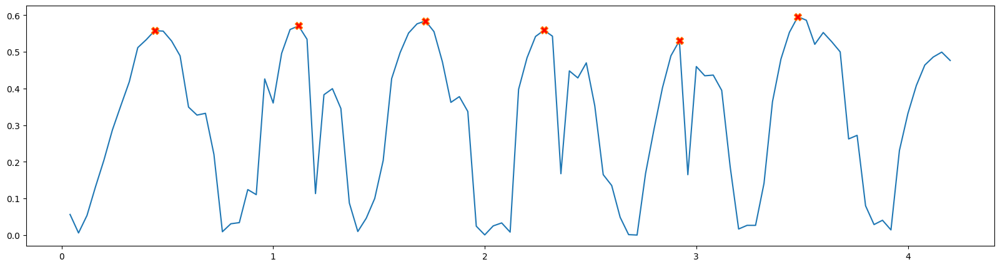

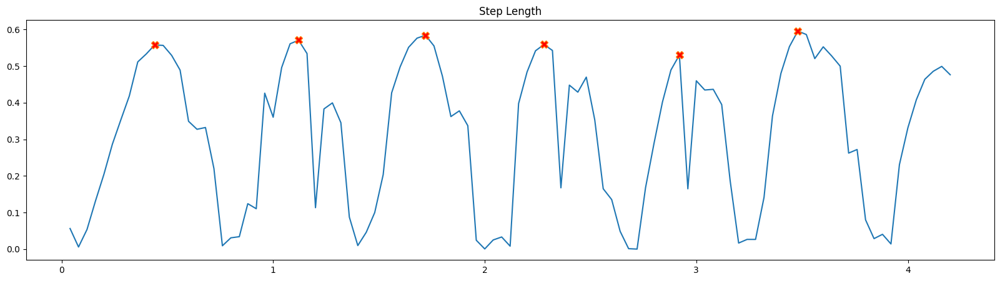

[10 27 42 56 72 86]
        lbl_r     lbl_l    center  leg_ratio     t  velocity  visi_lbl_r  \
0    1.349094  1.446106 -0.034843   0.909536  0.04 -0.578843    0.502532   
1    1.321439  1.454689 -0.042426   0.927915  0.08  0.058323    0.492205   
2    1.219463  1.480371 -0.038151   0.937651  0.12  0.097467    0.490275   
3    1.393862  1.506669 -0.036003   0.942850  0.16  0.024018    0.518053   
4    1.423035  1.492520 -0.035715   0.922659  0.20 -0.013262    0.549964   
..        ...       ...       ...        ...   ...       ...         ...   
100  1.452913  1.497541 -0.005897   0.969625  4.04 -0.055327    0.467602   
101  1.500813  1.539665 -0.009199   0.968963  4.08 -0.065516    0.487198   
102  1.512712  1.546194 -0.009946   0.974561  4.12  0.008664    0.513635   
103  1.504857  1.544515 -0.010246   0.980178  4.16 -0.039718    0.536762   
104  1.523251  1.541024 -0.013896   0.979762  4.20 -0.146043    0.554431   

     visi_lbl_l  
0      0.898370  
1      0.898787  
2      0.9056

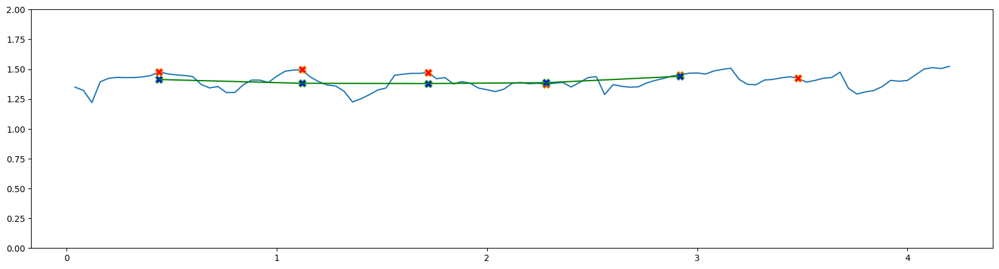

     upper_arm_r  upper_arm_l         c     t  velocity  visi_l_urm_r  \
0       0.496717     0.598504 -0.034843  0.04 -0.578843      0.199092   
1       0.503736     0.600184 -0.042426  0.08  0.058323      0.195532   
2       0.511458     0.600179 -0.038151  0.12  0.097467      0.188050   
3       0.516626     0.595703 -0.036003  0.16  0.024018      0.177552   
4       0.526020     0.595038 -0.035715  0.20 -0.013262      0.170125   
..           ...          ...       ...   ...       ...           ...   
100     0.443554     0.530876 -0.005897  4.04 -0.055327      0.044804   
101     0.437345     0.552365 -0.009199  4.08 -0.065516      0.046589   
102     0.452756     0.566394 -0.009946  4.12  0.008664      0.047453   
103     0.477355     0.572890 -0.010246  4.16 -0.039718      0.047153   
104     0.478825     0.577005 -0.013896  4.20 -0.146043      0.048594   

     visi_l_urm_l  
0        0.994842  
1        0.995135  
2        0.995238  
3        0.995464  
4        0.995658  
.. 

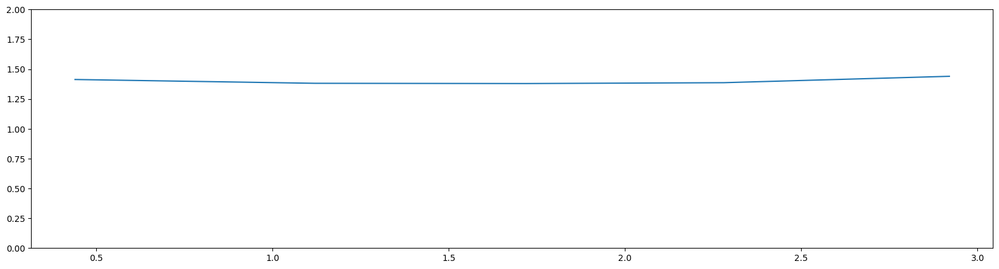

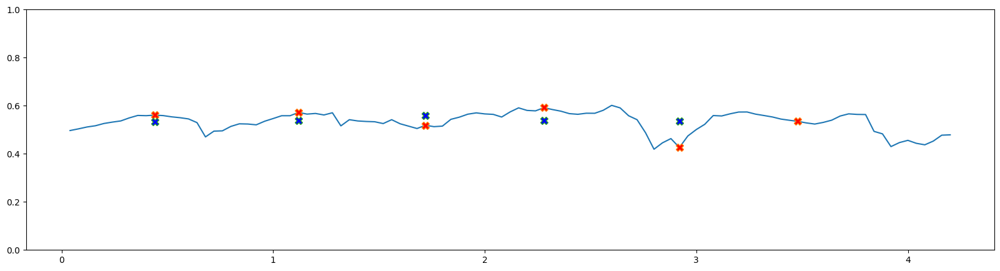

            r         l         c     t  velocity  visi_larm_r  visi_larm_l
0    0.482318  0.533200 -0.034843  0.04 -0.578843     0.084386     0.983152
1    0.473536  0.537846 -0.042426  0.08  0.058323     0.081211     0.984073
2    0.474232  0.537065 -0.038151  0.12  0.097467     0.075038     0.984475
3    0.459665  0.538852 -0.036003  0.16  0.024018     0.067550     0.985085
4    0.446977  0.534426 -0.035715  0.20 -0.013262     0.062594     0.985629
..        ...       ...       ...   ...       ...          ...          ...
100  0.259902  0.386378 -0.005897  4.04 -0.055327     0.002770     0.963190
101  0.243291  0.406103 -0.009199  4.08 -0.065516     0.002870     0.966322
102  0.239673  0.391333 -0.009946  4.12  0.008664     0.002839     0.968763
103  0.257404  0.367320 -0.010246  4.16 -0.039718     0.002722     0.969870
104  0.338484  0.396333 -0.013896  4.20 -0.146043     0.002787     0.972108

[105 rows x 7 columns]
t1 0.44
t1 1.12
t1 1.72
t1 2.28
t1 2.92
results [0.4565123569844

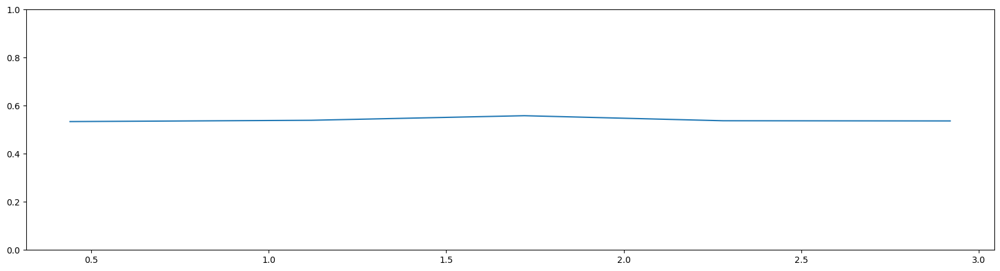

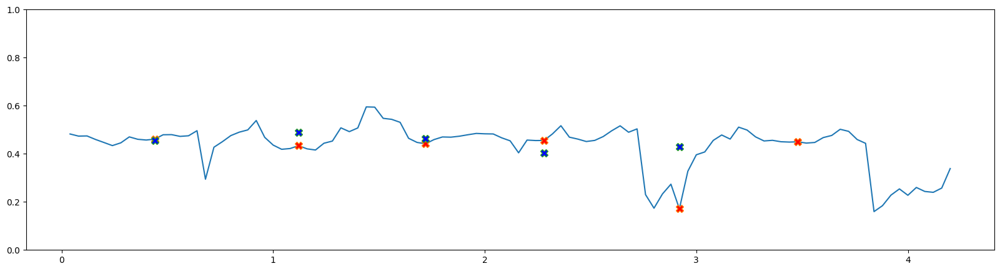

            r         l         c     t  velocity      visi_l_r  visi_l_l
0    0.277045  0.307068 -0.034843  0.04 -0.578843  3.106640e-03  0.945412
1    0.280251  0.305931 -0.042426  0.08  0.058323  2.809177e-03  0.948109
2    0.286508  0.310536 -0.038151  0.12  0.097467  2.300584e-03  0.949255
3    0.287117  0.309405 -0.036003  0.16  0.024018  1.774166e-03  0.950793
4    0.288426  0.309039 -0.035715  0.20 -0.013262  1.466867e-03  0.952127
..        ...       ...       ...   ...       ...           ...       ...
100  0.145433  0.227415 -0.005897  4.04 -0.055327  5.587541e-07  0.877806
101  0.122325  0.264109 -0.009199  4.08 -0.065516  5.954818e-07  0.887388
102  0.139688  0.261609 -0.009946  4.12  0.008664  5.644569e-07  0.894695
103  0.144573  0.276890 -0.010246  4.16 -0.039718  5.012922e-07  0.897470
104  0.176218  0.306043 -0.013896  4.20 -0.146043  5.184031e-07  0.904348

[105 rows x 7 columns]
t1 0.44
t1 1.12
t1 1.72
t1 2.28
t1 2.92
results [0.27838278538738775, 0.2627635735834241

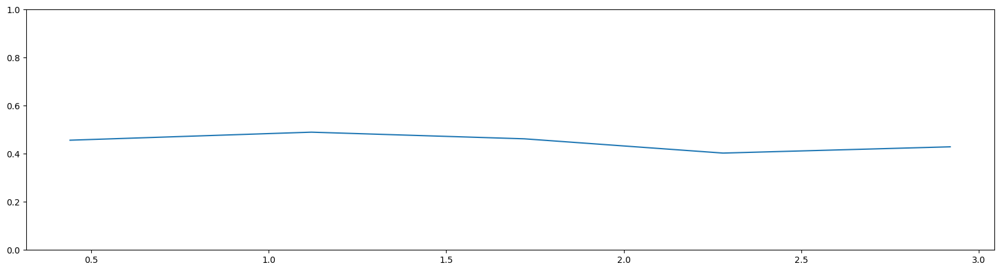

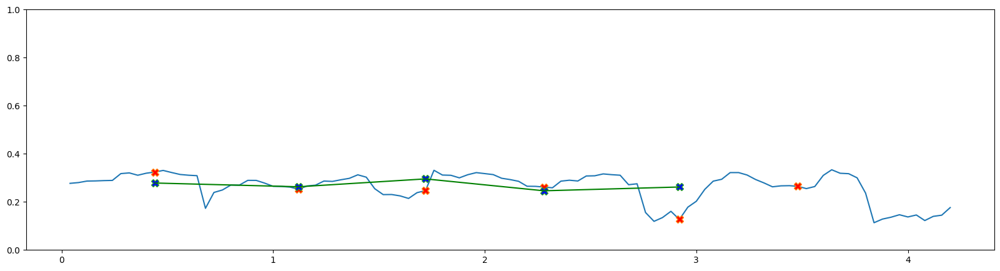

            r         l  leg_ratio         c     t  velocity  visi_thigh_r  \
0    0.704872  0.774980   0.959913 -0.034843  0.04 -0.578843      0.748734   
1    0.703842  0.758520   0.887137 -0.042426  0.08  0.058323      0.744460   
2    0.709310  0.756476   0.704733 -0.038151  0.12  0.097467      0.747121   
3    0.707590  0.750479   0.907541 -0.036003  0.16  0.024018      0.765134   
4    0.697249  0.755695   0.985019 -0.035715  0.20 -0.013262      0.784454   
..        ...       ...        ...       ...   ...       ...           ...   
100  0.711623  0.733916   0.970751 -0.005897  4.04 -0.055327      0.729475   
101  0.731479  0.754909   0.980348 -0.009199  4.08 -0.065516      0.741375   
102  0.739686  0.758994   0.981994 -0.009946  4.12  0.008664      0.757549   
103  0.734917  0.749779   0.968801 -0.010246  4.16 -0.039718      0.771047   
104  0.743109  0.758459   0.996904 -0.013896  4.20 -0.146043      0.780856   

     visi_thigh_l  
0        0.953164  
1        0.953695  
2  

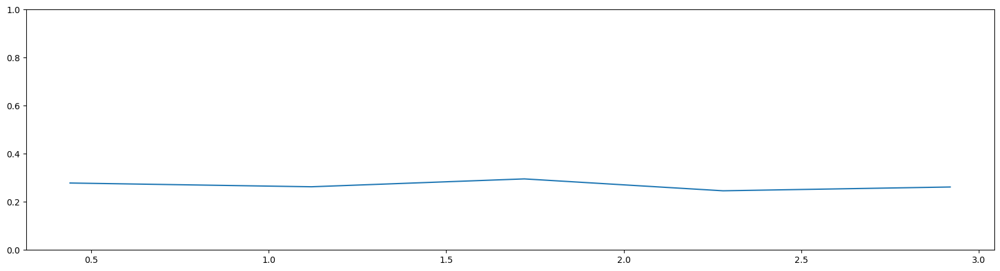

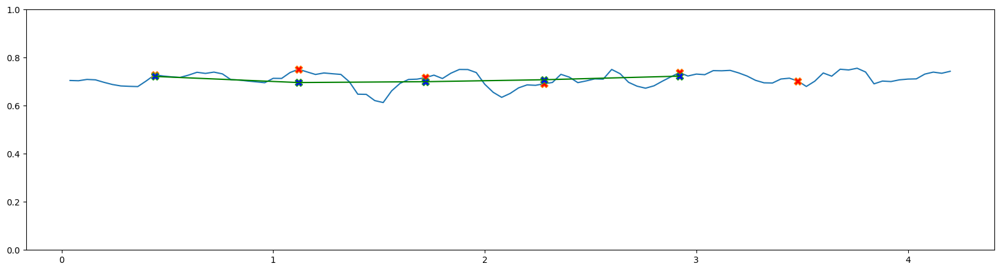

            r         l  leg_ratio         c     t  velocity  visi_shk_r  \
0    0.644222  0.671125   0.909536 -0.034843  0.04 -0.578843    0.671176   
1    0.617597  0.696169   0.927915 -0.042426  0.08  0.058323    0.661157   
2    0.510153  0.723895   0.937651 -0.038151  0.12  0.097467    0.656219   
3    0.686272  0.756189   0.942850 -0.036003  0.16  0.024018    0.677075   
4    0.725787  0.736825   0.922659 -0.035715  0.20 -0.013262    0.701078   
..        ...       ...        ...       ...   ...       ...         ...   
100  0.741290  0.763625   0.969625 -0.005897  4.04 -0.055327    0.641012   
101  0.769334  0.784756   0.968963 -0.009199  4.08 -0.065516    0.657155   
102  0.773026  0.787200   0.974561 -0.009946  4.12  0.008664    0.678022   
103  0.769941  0.794735   0.980178 -0.010246  4.16 -0.039718    0.696146   
104  0.780142  0.782565   0.979762 -0.013896  4.20 -0.146043    0.710029   

     visi_shk_l  
0      0.942514  
1      0.942426  
2      0.946319  
3      0.950637

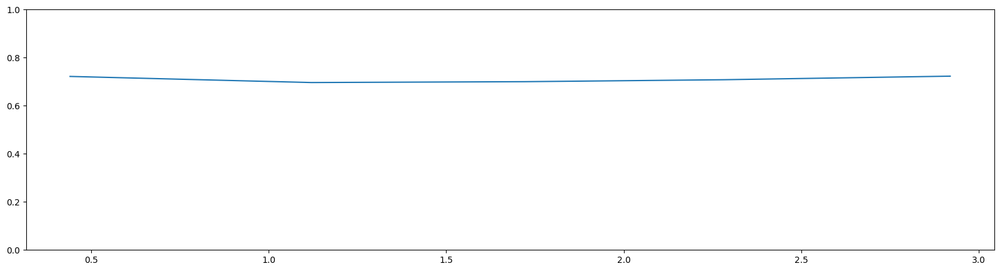

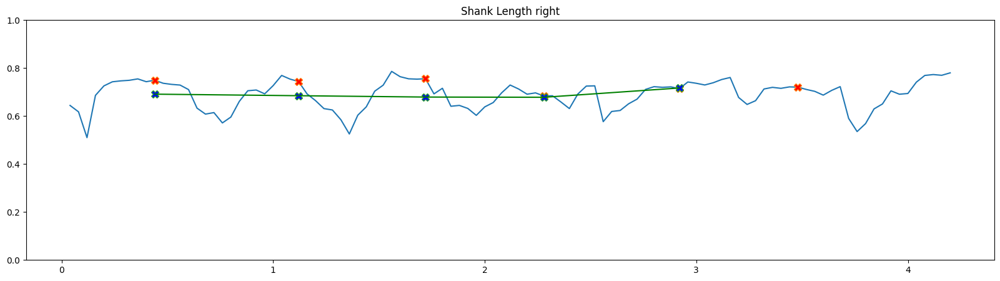

       foot_r    foot_l  leg_ratio         c     t  velocity  visi_foot_r  \
0    0.250445  0.162916   0.909536 -0.034843  0.04 -0.578843     0.827016   
1    0.257077  0.211913   0.927915 -0.042426  0.08  0.058323     0.815222   
2    0.222631  0.210492   0.937651 -0.038151  0.12  0.097467     0.800651   
3    0.212292  0.217727   0.942850 -0.036003  0.16  0.024018     0.806815   
4    0.222333  0.185407   0.922659 -0.035715  0.20 -0.013262     0.816701   
..        ...       ...        ...       ...   ...       ...          ...   
100  0.174346  0.248720   0.969625 -0.005897  4.04 -0.055327     0.797062   
101  0.186250  0.215156   0.968963 -0.009199  4.08 -0.065516     0.805304   
102  0.211809  0.216779   0.974561 -0.009946  4.12  0.008664     0.815555   
103  0.183539  0.214653   0.980178 -0.010246  4.16 -0.039718     0.825111   
104  0.204012  0.218443   0.979762 -0.013896  4.20 -0.146043     0.832747   

     visi_foot_l  
0       0.914027  
1       0.909942  
2       0.912743  

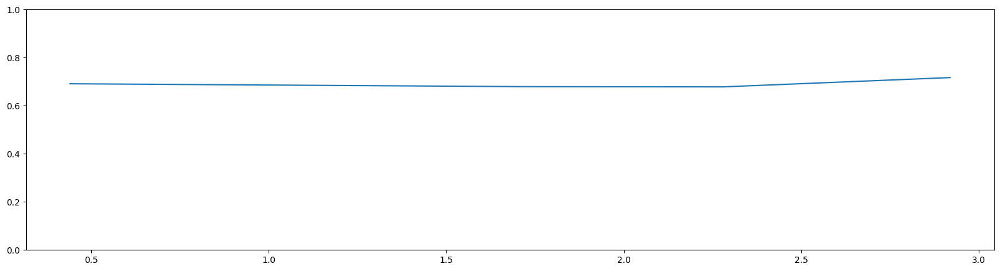

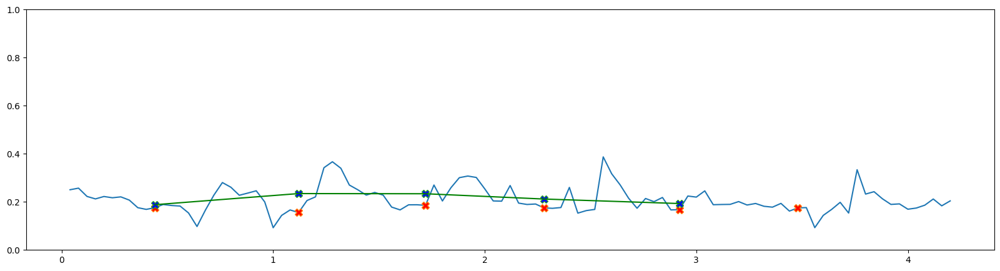

side left amani left 3 (5, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.169942  0.833333 -0.008451  0.935007  0.961469  0.027481  0.079794   
1    0.159949  0.866667 -0.018521  0.930514  0.958930  0.030384  0.082811   
2    0.155518  0.900000 -0.018677  0.924064  0.954304  0.031583  0.083529   
3    0.154757  0.933333 -0.018155  0.916727  0.948845  0.033047  0.085303   
4    0.153735  0.966667 -0.017220  0.911095  0.942839  0.032002  0.084688   
..        ...       ...       ...       ...       ...       ...       ...   
144  0.183874  5.633333 -0.028455  0.000359 -0.016770  0.017181  0.097453   
145  0.175865  5.666667 -0.010244 -0.008327 -0.033636  0.025668  0.095556   
146  0.169927  5.700000  0.009334 -0.047415 -0.037440  0.013585  0.098371   
147  0.166174  5.733333  0.002324 -0.058966 -0.038376  0.022321  0.092825   
148  0.160308  5.766667 -0.007044 -0.061657 -0.060489  0.001463  0.025997   

          sln       aln  
0    0.161708  0.4

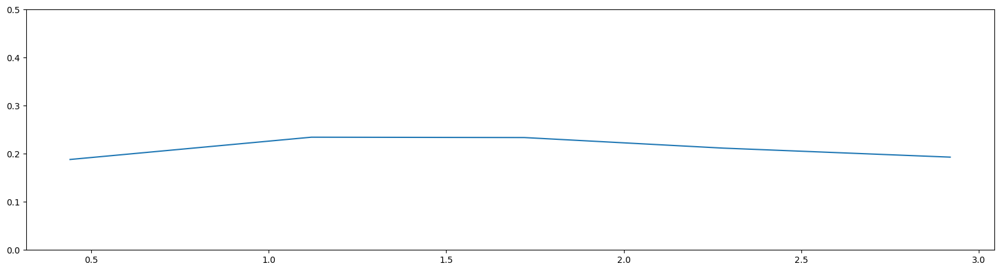

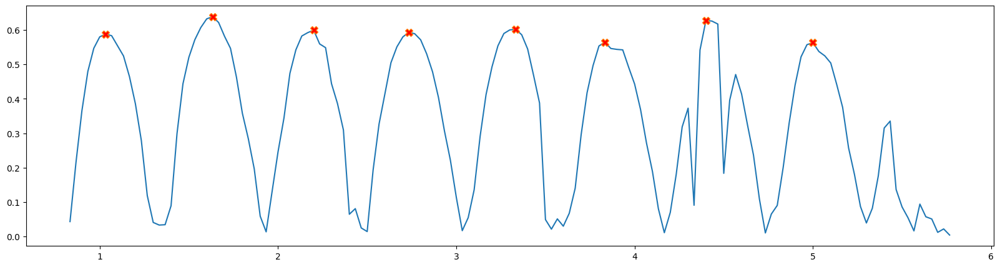

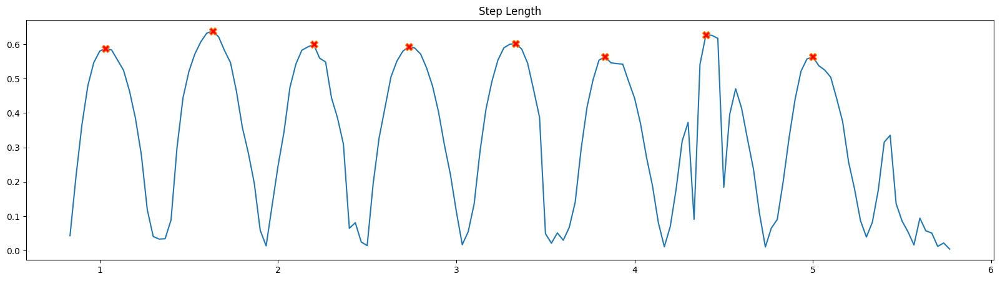

[  6  24  41  57  75  90 107 125]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.317025  1.358029 -0.008451   1.029432  0.833333 -0.619236    0.162623   
1    1.431475  1.468832 -0.018521   1.006833  0.866667 -0.081860    0.165676   
2    1.501564  1.542041 -0.018677   1.023811  0.900000  0.026417    0.177001   
3    1.527048  1.575073 -0.018155   1.027274  0.933333  0.006852    0.192917   
4    1.549943  1.590387 -0.017220   1.008513  0.966667  0.073649    0.207391   
..        ...       ...       ...        ...       ...       ...         ...   
144  1.075192  1.209488 -0.028455   0.933498  5.633333  0.299342    0.249385   
145  1.197792  1.320721 -0.010244   0.961583  5.666667  0.723818    0.220398   
146  1.273827  1.351331  0.009334   0.979186  5.700000  0.250472    0.193628   
147  1.280676  1.328887  0.002324   0.928993  5.733333 -0.551354    0.194306   
148  1.302585  1.336822 -0.007044   0.999125  5.766667  0.481000    0.171917   

     

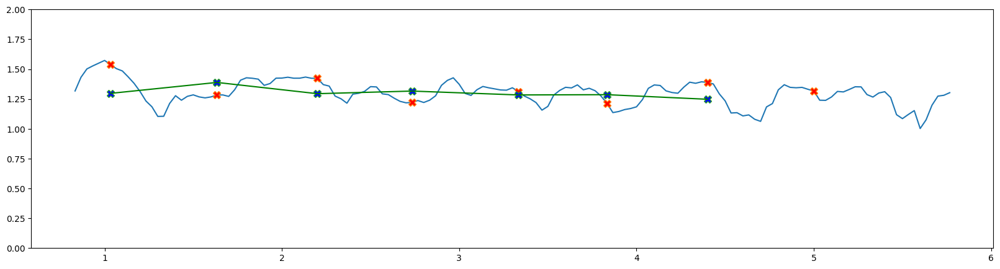

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.469534     0.502039 -0.008451  0.833333 -0.619236      0.226764   
1       0.517734     0.542231 -0.018521  0.866667 -0.081860      0.257497   
2       0.537105     0.553597 -0.018677  0.900000  0.026417      0.303133   
3       0.551207     0.557641 -0.018155  0.933333  0.006852      0.339992   
4       0.550868     0.549404 -0.017220  0.966667  0.073649      0.372981   
..           ...          ...       ...       ...       ...           ...   
144     0.529998     0.466894 -0.028455  5.633333  0.299342      0.161099   
145     0.543350     0.492806 -0.010244  5.666667  0.723818      0.145067   
146     0.578902     0.511992  0.009334  5.700000  0.250472      0.131356   
147     0.558603     0.510980  0.002324  5.733333 -0.551354      0.120236   
148     0.162171     0.348142 -0.007044  5.766667  0.481000      0.108781   

     visi_l_urm_l  
0        0.995395  
1        0.995734  
2        0.9960

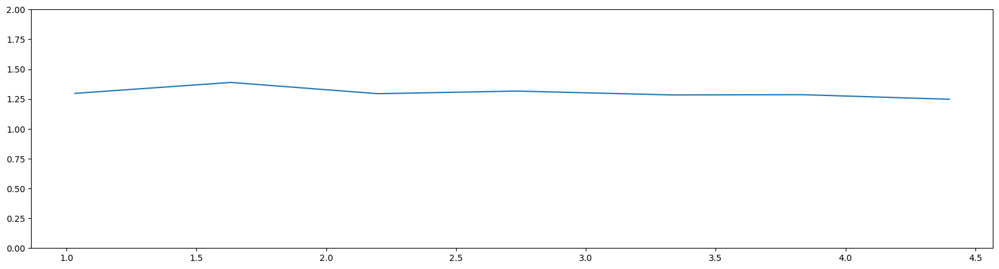

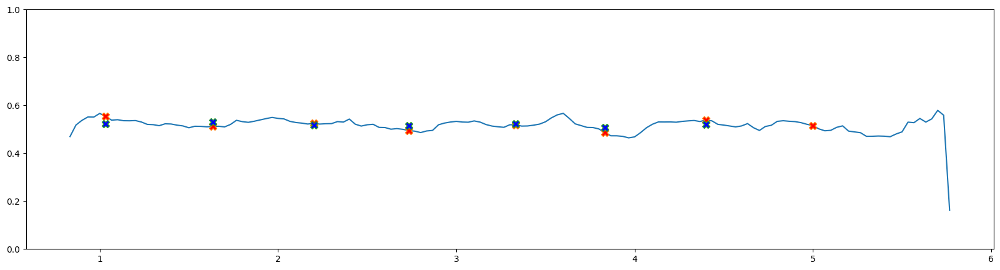

            r         l         c         t  velocity  visi_larm_r  \
0    0.359682  0.518862 -0.008451  0.833333 -0.619236     0.108117   
1    0.403159  0.533311 -0.018521  0.866667 -0.081860     0.131087   
2    0.395982  0.535082 -0.018677  0.900000  0.026417     0.166116   
3    0.381566  0.532151 -0.018155  0.933333  0.006852     0.197875   
4    0.387711  0.528455 -0.017220  0.966667  0.073649     0.228275   
..        ...       ...       ...       ...       ...          ...   
144  0.238266  0.272075 -0.028455  5.633333  0.299342     0.028072   
145  0.263545  0.322989 -0.010244  5.666667  0.723818     0.022994   
146  0.278876  0.375534  0.009334  5.700000  0.250472     0.018970   
147  0.280344  0.411769  0.002324  5.733333 -0.551354     0.016023   
148  0.038161  0.203078 -0.007044  5.766667  0.481000     0.013521   

     visi_larm_l  
0       0.981399  
1       0.982677  
2       0.984003  
3       0.985371  
4       0.986584  
..           ...  
144     0.698457  
145    

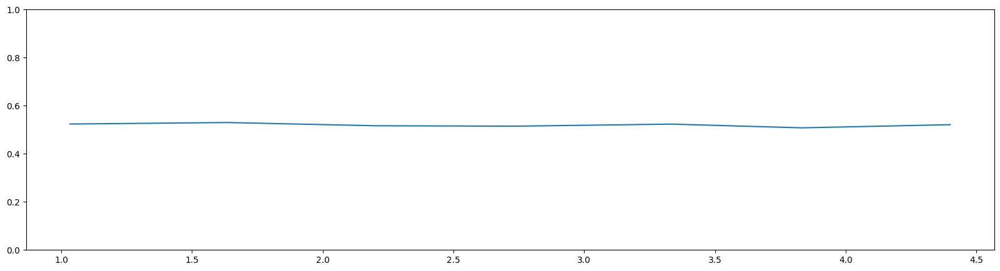

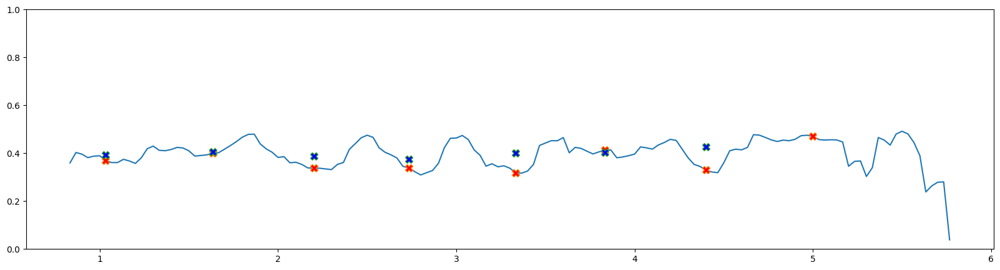

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.268831  0.322442 -0.008451  0.833333 -0.619236  0.005327  0.929975
1    0.273257  0.337996 -0.018521  0.866667 -0.081860  0.008317  0.934584
2    0.279935  0.343809 -0.018677  0.900000  0.026417  0.014355  0.939381
3    0.273995  0.342742 -0.018155  0.933333  0.006852  0.021615  0.944415
4    0.262884  0.345036 -0.017220  0.966667  0.073649  0.030239  0.948886
..        ...       ...       ...       ...       ...       ...       ...
144  0.173116  0.147794 -0.028455  5.633333  0.299342  0.000120  0.378692
145  0.190366  0.184396 -0.010244  5.666667  0.723818  0.000073  0.260339
146  0.214233  0.198698  0.009334  5.700000  0.250472  0.000046  0.227732
147  0.209425  0.232770  0.002324  5.733333 -0.551354  0.000031  0.216692
148  0.060740  0.121895 -0.007044  5.766667  0.481000  0.000021  0.198027

[149 rows x 7 columns]
t1 1.0333333333333334
t1 1.6333333333333333
t1 2.2
t1 2.7333333333333334
t1 3.3333333333

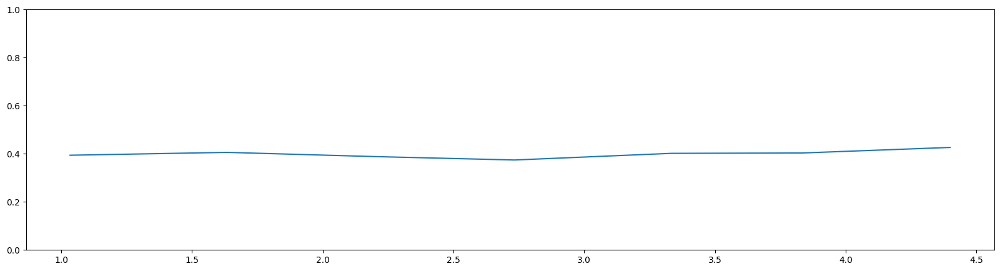

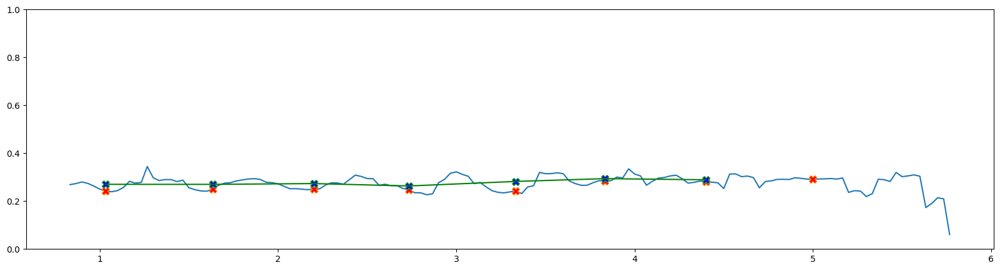

            r         l  leg_ratio         c         t  velocity  \
0    0.654884  0.636160   0.917260 -0.008451  0.833333 -0.619236   
1    0.699425  0.694678   0.945613 -0.018521  0.866667 -0.081860   
2    0.733974  0.716904   0.930257 -0.018677  0.900000  0.026417   
3    0.765520  0.745196   0.917639 -0.018155  0.933333  0.006852   
4    0.790831  0.784155   0.941556 -0.017220  0.966667  0.073649   
..        ...       ...        ...       ...       ...       ...   
144  0.509296  0.545578   0.852368 -0.028455  5.633333  0.299342   
145  0.613449  0.637957   0.855849 -0.010244  5.666667  0.723818   
146  0.691278  0.705973   0.902676  0.009334  5.700000  0.250472   
147  0.717036  0.771841   1.011839  0.002324  5.733333 -0.551354   
148  0.714766  0.715392   0.945913 -0.007044  5.766667  0.481000   

     visi_thigh_r  visi_thigh_l  
0        0.516699      0.957862  
1        0.516774      0.958993  
2        0.524926      0.959832  
3        0.538427      0.961452  
4        0.54

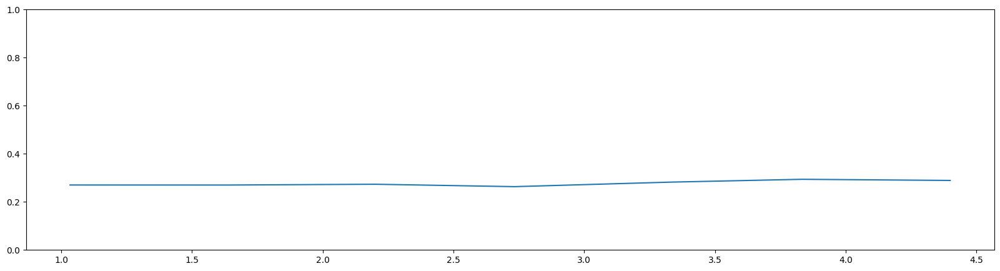

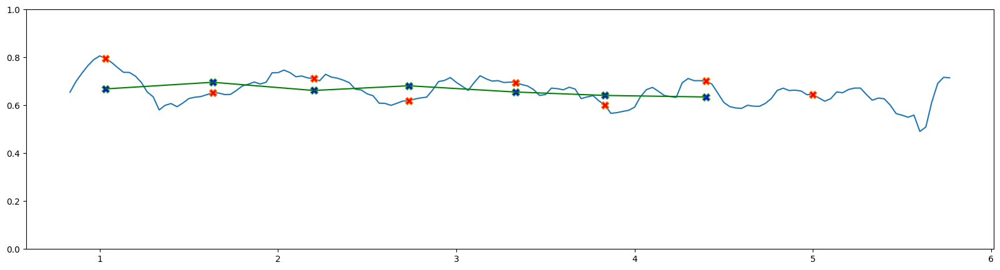

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.662141  0.721868   1.029432 -0.008451  0.833333 -0.619236    0.314734   
1    0.732050  0.774154   1.006833 -0.018521  0.866667 -0.081860    0.320596   
2    0.767590  0.825137   1.023811 -0.018677  0.900000  0.026417    0.337193   
3    0.761528  0.829877   1.027274 -0.018155  0.933333  0.006852    0.358298   
4    0.759112  0.806231   1.008513 -0.017220  0.966667  0.073649    0.377097   
..        ...       ...        ...       ...       ...       ...         ...   
144  0.565896  0.663911   0.933498 -0.028455  5.633333  0.299342    0.415620   
145  0.584343  0.682764   0.961583 -0.010244  5.666667  0.723818    0.387323   
146  0.582549  0.645358   0.979186  0.009334  5.700000  0.250472    0.356460   
147  0.563640  0.557046   0.928993  0.002324  5.733333 -0.551354    0.357333   
148  0.587819  0.621430   0.999125 -0.007044  5.766667  0.481000    0.331783   

     visi_shk_l  
0      0.905705  
1  

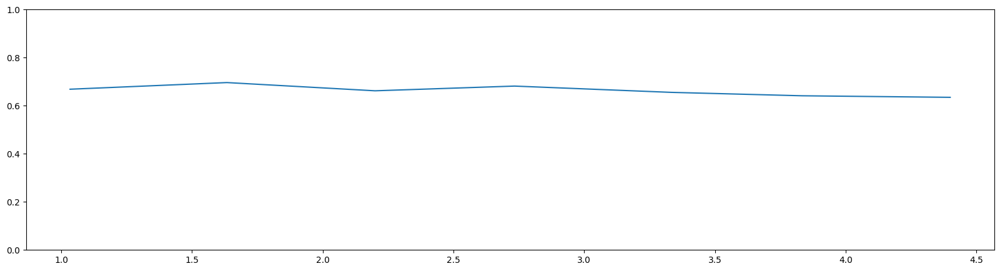

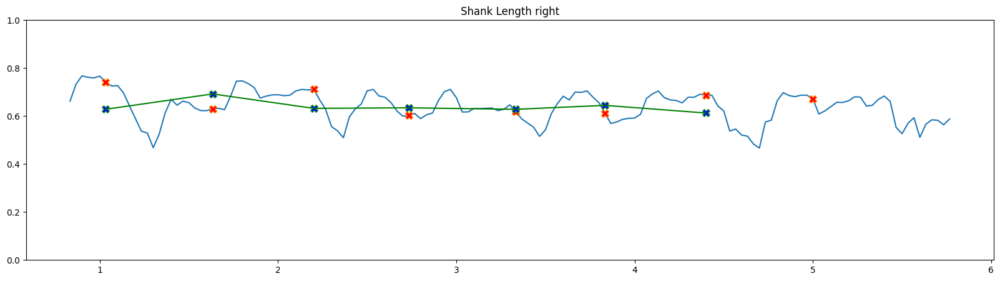

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.211929  0.238724   1.029432 -0.008451  0.833333 -0.619236     0.409046   
1    0.196199  0.251315   1.006833 -0.018521  0.866667 -0.081860     0.423083   
2    0.207102  0.236272   1.023811 -0.018677  0.900000  0.026417     0.449965   
3    0.221772  0.215700   1.027274 -0.018155  0.933333  0.006852     0.478881   
4    0.233595  0.239457   1.008513 -0.017220  0.966667  0.073649     0.505522   
..        ...       ...        ...       ...       ...       ...          ...   
144  0.146945  0.175840   0.933498 -0.028455  5.633333  0.299342     0.488938   
145  0.181850  0.171494   0.961583 -0.010244  5.666667  0.723818     0.475131   
146  0.172957  0.173172   0.979186  0.009334  5.700000  0.250472     0.448282   
147  0.219441  0.214150   0.928993  0.002324  5.733333 -0.551354     0.449265   
148  0.206677  0.197962   0.999125 -0.007044  5.766667  0.481000     0.437590   

     visi_foot_l  
0       

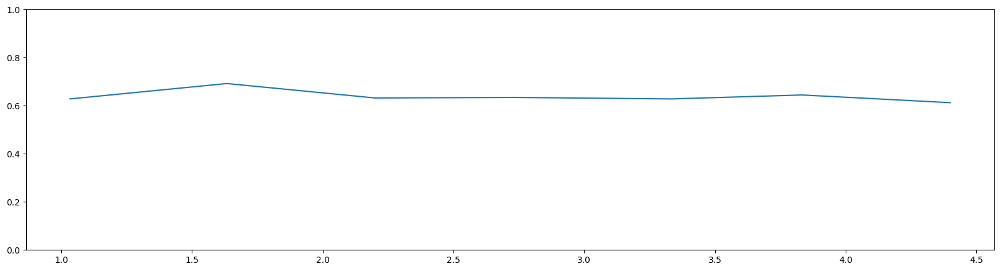

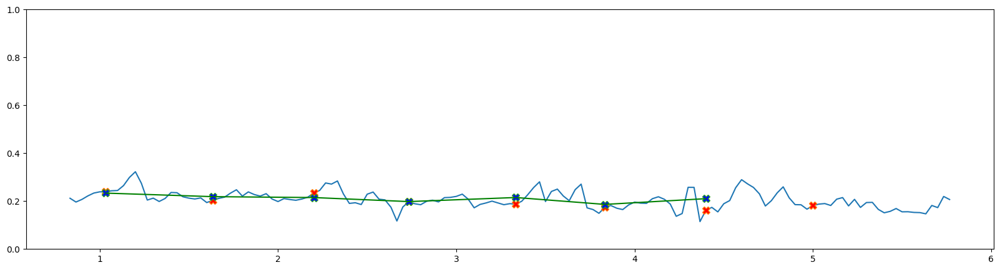

side left chathura left 3 (7, 29)
          ubh     t    center     r_sdr     l_sdr        sl        al  \
0    0.169210  0.12 -0.037359  0.764121  0.781026  0.018988  0.093016   
1    0.170808  0.16 -0.041739  0.763821  0.779999  0.017945  0.093018   
2    0.172381  0.20 -0.042158  0.763677  0.779737  0.017622  0.093534   
3    0.173516  0.24 -0.043880  0.757635  0.771926  0.015742  0.093931   
4    0.174806  0.28 -0.043067  0.753568  0.766710  0.014278  0.095624   
..        ...   ...       ...       ...       ...       ...       ...   
98   0.181341  4.04 -0.005174  0.115881  0.079317  0.036592  0.090477   
99   0.179475  4.08 -0.005389  0.109102  0.074861  0.034261  0.090462   
100  0.179173  4.12 -0.005318  0.095699  0.061933  0.033796  0.091631   
101  0.176395  4.16 -0.005389  0.094513  0.056390  0.038132  0.090093   
102  0.175685  4.20 -0.005218  0.095637  0.055761  0.039917  0.089715   

          sln       aln  
0    0.112214  0.549708  
1    0.105060  0.544574  
2    0.1022

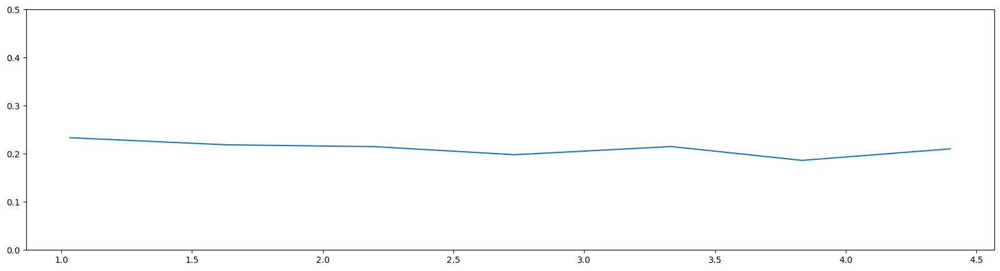

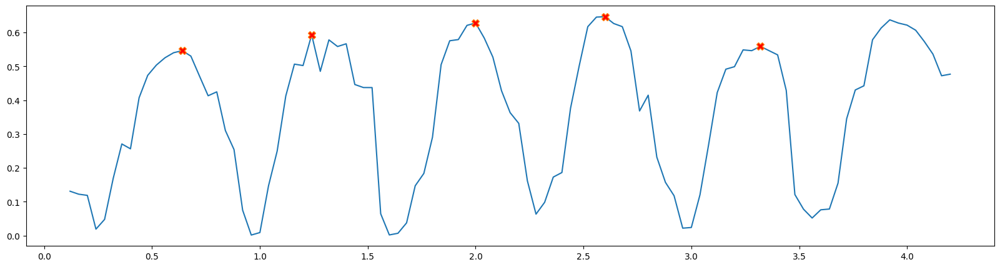

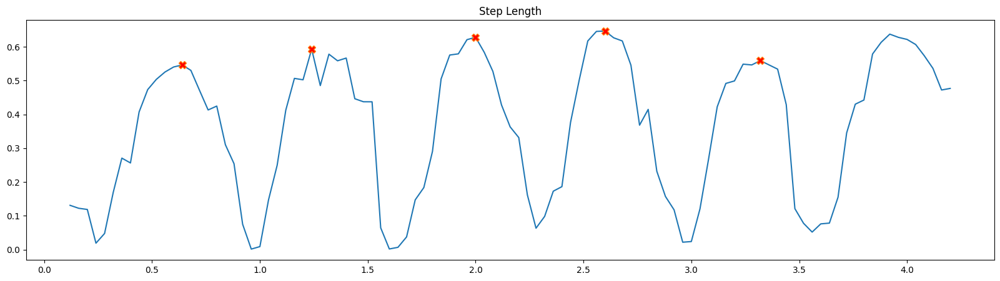

[13 28 47 62 80]
        lbl_r     lbl_l    center  leg_ratio     t  velocity  visi_lbl_r  \
0    1.206956  1.506482 -0.037359   0.850109  0.12 -0.266612    0.248826   
1    1.213187  1.440647 -0.041739   0.881620  0.16 -0.016839    0.275223   
2    1.216149  1.405874 -0.042158   0.886117  0.20 -0.025971    0.300324   
3    1.222892  1.390590 -0.043880   0.902630  0.24 -0.041449    0.297490   
4    1.267884  1.379951 -0.043067   0.920783  0.28  0.108662    0.308963   
..        ...       ...       ...        ...   ...       ...         ...   
98   1.167413  1.258436 -0.005174   0.894195  4.04 -0.031933    0.637070   
99   1.149715  1.290453 -0.005389   0.884347  4.08  0.006725    0.654525   
100  1.147578  1.288984 -0.005318   0.913956  4.12 -0.002293    0.670006   
101  1.131917  1.317122 -0.005389   0.937915  4.16  0.000392    0.681155   
102  1.128851  1.362356 -0.005218   0.929396  4.20  0.008157    0.691895   

     visi_lbl_l  
0      0.891894  
1      0.895767  
2      0.899069 

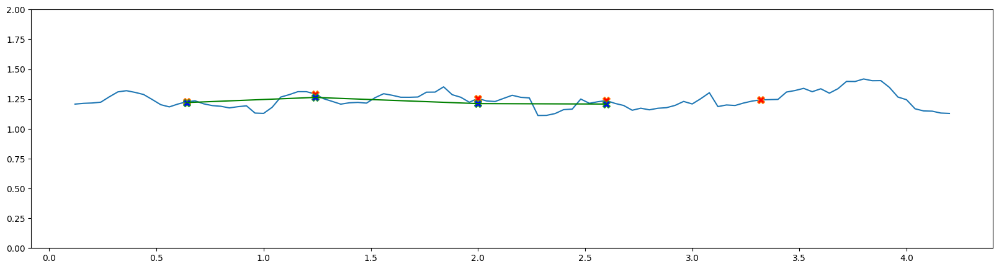

     upper_arm_r  upper_arm_l         c     t  velocity  visi_l_urm_r  \
0       0.549708     0.560541 -0.037359  0.12 -0.266612      0.328965   
1       0.544574     0.559985 -0.041739  0.16 -0.016839      0.310677   
2       0.542602     0.563096 -0.042158  0.20 -0.025971      0.294682   
3       0.541340     0.566044 -0.043880  0.24 -0.041449      0.277017   
4       0.547031     0.573309 -0.043067  0.28  0.108662      0.261297   
..           ...          ...       ...   ...       ...           ...   
98      0.498930     0.531493 -0.005174  4.04 -0.031933      0.218117   
99      0.504037     0.554324 -0.005389  4.08  0.006725      0.214571   
100     0.511414     0.541689 -0.005318  4.12 -0.002293      0.207592   
101     0.510746     0.550302 -0.005389  4.16  0.000392      0.206244   
102     0.510659     0.554628 -0.005218  4.20  0.008157      0.212003   

     visi_l_urm_l  
0        0.998655  
1        0.998669  
2        0.998686  
3        0.998623  
4        0.998597  
.. 

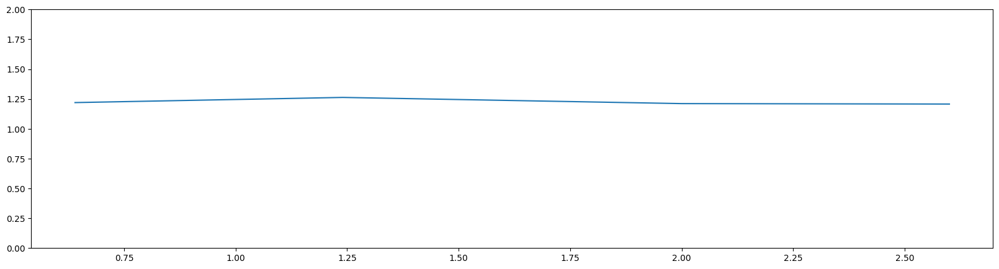

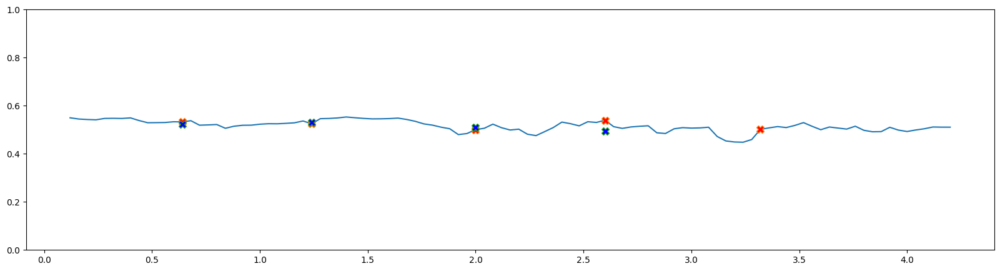

            r         l         c     t  velocity  visi_larm_r  visi_larm_l
0    0.462489  0.554851 -0.037359  0.12 -0.266612     0.142668     0.994586
1    0.464229  0.549461 -0.041739  0.16 -0.016839     0.132019     0.994692
2    0.461773  0.544814 -0.042158  0.20 -0.025971     0.123473     0.994884
3    0.460330  0.540801 -0.043880  0.24 -0.041449     0.111093     0.994602
4    0.457480  0.527134 -0.043067  0.28  0.108662     0.101316     0.994563
..        ...       ...       ...   ...       ...          ...          ...
98   0.416901  0.517010 -0.005174  4.04 -0.031933     0.044028     0.970458
99   0.418493  0.495289 -0.005389  4.08  0.006725     0.043406     0.969881
100  0.408433  0.494972 -0.005318  4.12 -0.002293     0.040324     0.968428
101  0.407969  0.500804 -0.005389  4.16  0.000392     0.039616     0.965800
102  0.403501  0.496779 -0.005218  4.20  0.008157     0.041728     0.962790

[103 rows x 7 columns]
t1 0.64
t1 1.24
t1 2.0
t1 2.6
results [0.46531837924737174, 0.45

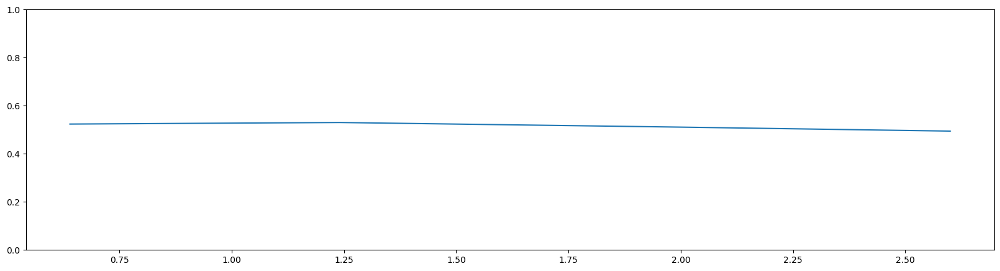

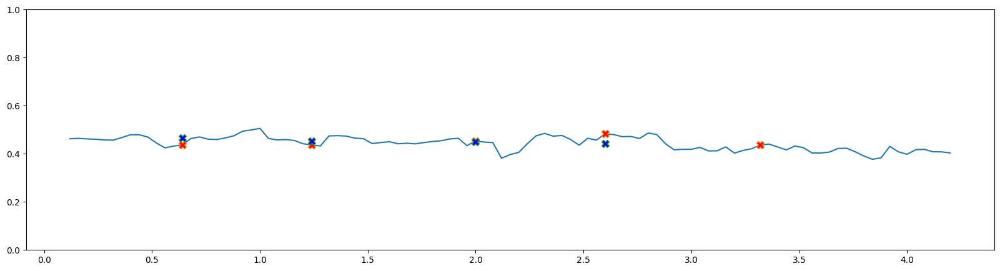

            r         l         c     t  velocity  visi_l_r  visi_l_l
0    0.317268  0.342874 -0.037359  0.12 -0.266612  0.008002  0.978876
1    0.313881  0.343755 -0.041739  0.16 -0.016839  0.006778  0.979316
2    0.313276  0.338152 -0.042158  0.20 -0.025971  0.005902  0.980132
3    0.312744  0.326298 -0.043880  0.24 -0.041449  0.004600  0.979061
4    0.314242  0.323968 -0.043067  0.28  0.108662  0.003708  0.978923
..        ...       ...       ...   ...       ...       ...       ...
98   0.298674  0.326763 -0.005174  4.04 -0.031933  0.000356  0.895277
99   0.299460  0.320940 -0.005389  4.08  0.006725  0.000348  0.893654
100  0.298411  0.321898 -0.005318  4.12 -0.002293  0.000289  0.889400
101  0.303194  0.324673 -0.005389  4.16  0.000392  0.000277  0.882146
102  0.285358  0.326113 -0.005218  4.20  0.008157  0.000317  0.874264

[103 rows x 7 columns]
t1 0.64
t1 1.24
t1 2.0
t1 2.6
results [0.3091950613793119, 0.3024478088653077, 0.31540614766283703, 0.29947268849394826]
t1 0.64
t1 1.24

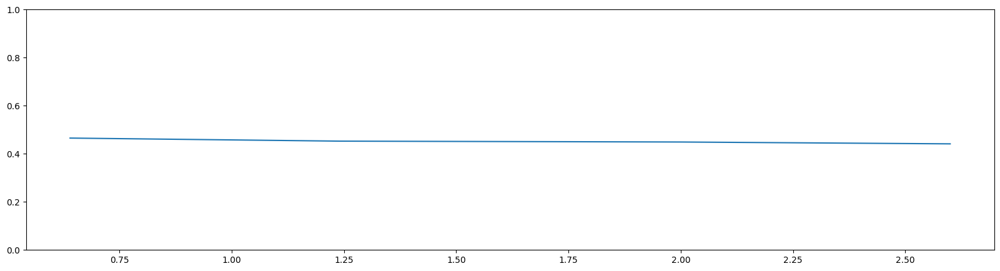

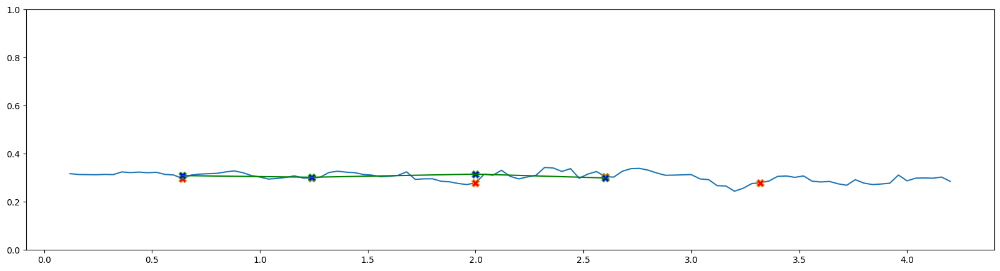

            r         l  leg_ratio         c     t  velocity  visi_thigh_r  \
0    0.680284  0.800231   0.745729 -0.037359  0.12 -0.266612      0.572410   
1    0.663483  0.752573   0.798901 -0.041739  0.16 -0.016839      0.596485   
2    0.651068  0.734742   0.841983 -0.042158  0.20 -0.025971      0.618270   
3    0.645874  0.715546   0.854786 -0.043880  0.24 -0.041449      0.618039   
4    0.642155  0.697402   0.916751 -0.043067  0.28  0.108662      0.629414   
..        ...       ...        ...       ...   ...       ...           ...   
98   0.565970  0.632938   0.961542 -0.005174  4.04 -0.031933      0.834648   
99   0.574758  0.649923   0.897629 -0.005389  4.08  0.006725      0.844410   
100  0.591505  0.647192   0.866438 -0.005318  4.12 -0.002293      0.852810   
101  0.613187  0.653777   0.781991 -0.005389  4.16  0.000392      0.858807   
102  0.615576  0.662340   0.733233 -0.005218  4.20  0.008157      0.864487   

     visi_thigh_l  
0        0.950324  
1        0.952082  
2  

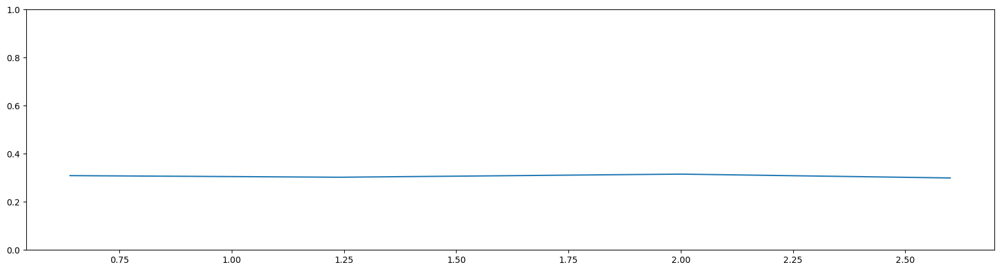

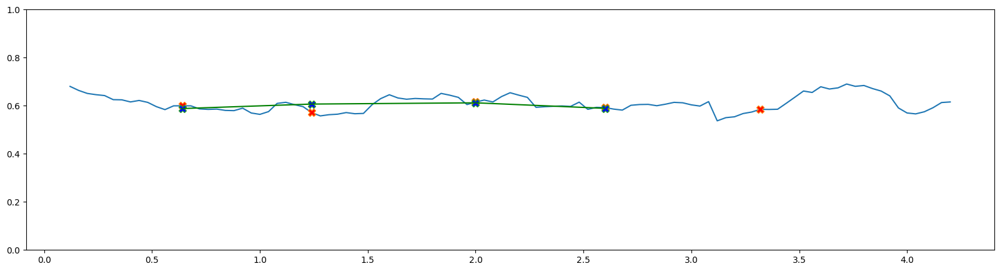

            r         l  leg_ratio         c     t  velocity  visi_shk_r  \
0    0.526672  0.706251   0.850109 -0.037359  0.12 -0.266612    0.434699   
1    0.549703  0.688074   0.881620 -0.041739  0.16 -0.016839    0.461407   
2    0.565081  0.671131   0.886117 -0.042158  0.20 -0.025971    0.485749   
3    0.577018  0.675044   0.902630 -0.043880  0.24 -0.041449    0.481345   
4    0.625728  0.682550   0.920783 -0.043067  0.28  0.108662    0.490874   
..        ...       ...        ...       ...   ...       ...         ...   
98   0.601442  0.625498   0.894195 -0.005174  4.04 -0.031933    0.763281   
99   0.574958  0.640529   0.884347 -0.005389  4.08  0.006725    0.775127   
100  0.556073  0.641792   0.913956 -0.005318  4.12 -0.002293    0.785645   
101  0.518730  0.663345   0.937915 -0.005389  4.16  0.000392    0.793141   
102  0.513275  0.700016   0.929396 -0.005218  4.20  0.008157    0.800353   

     visi_shk_l  
0      0.938515  
1      0.940850  
2      0.942814  
3      0.942953

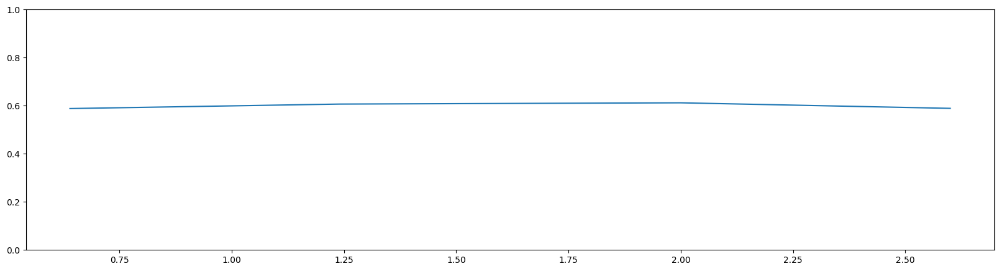

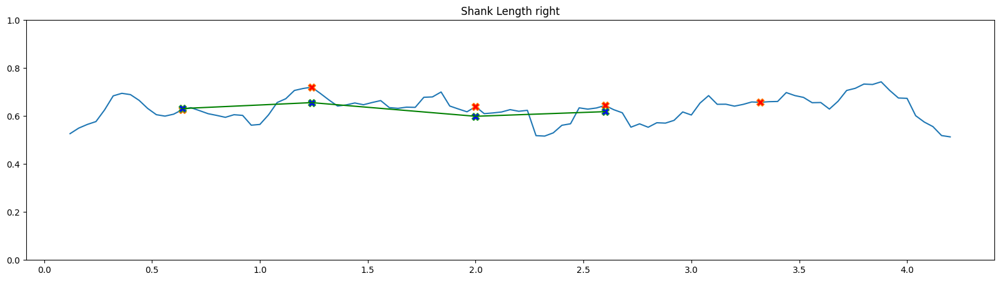

       foot_r    foot_l  leg_ratio         c     t  velocity  visi_foot_r  \
0    0.270286  0.227762   0.850109 -0.037359  0.12 -0.266612     0.721109   
1    0.275734  0.218181   0.881620 -0.041739  0.16 -0.016839     0.734767   
2    0.269157  0.208970   0.886117 -0.042158  0.20 -0.025971     0.746730   
3    0.231014  0.216500   0.902630 -0.043880  0.24 -0.041449     0.740274   
4    0.213998  0.223020   0.920783 -0.043067  0.28  0.108662     0.739543   
..        ...       ...        ...       ...   ...       ...          ...   
98   0.146592  0.225167   0.894195 -0.005174  4.04 -0.031933     0.778235   
99   0.160539  0.232036   0.884347 -0.005389  4.08  0.006725     0.781496   
100  0.209291  0.200903   0.913956 -0.005318  4.12 -0.002293     0.784394   
101  0.245001  0.188048   0.937915 -0.005389  4.16  0.000392     0.788851   
102  0.253504  0.170951   0.929396 -0.005218  4.20  0.008157     0.791598   

     visi_foot_l  
0       0.955304  
1       0.956133  
2       0.956517  

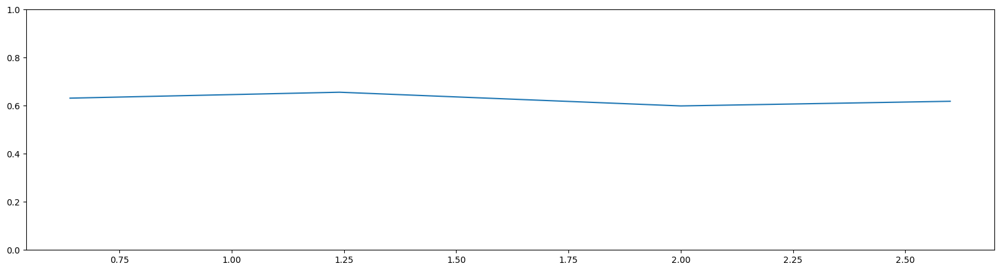

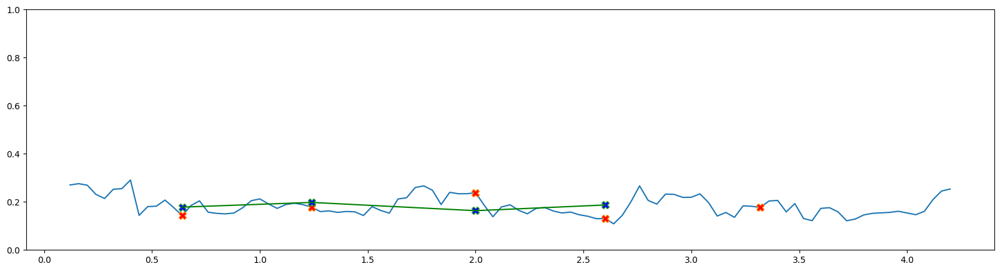

side left damith left 3 (4, 29)
          ubh     t    center     r_sdr     l_sdr        sl        al  \
0    0.160134  0.04 -0.027469  0.822289  0.825385  0.005214  0.094026   
1    0.160879  0.08 -0.040042  0.821667  0.824522  0.003745  0.095896   
2    0.159696  0.12 -0.032566  0.821626  0.818479  0.003159  0.096145   
3    0.158609  0.16 -0.029975  0.819172  0.814504  0.004686  0.094196   
4    0.158051  0.20 -0.028411  0.805842  0.808890  0.004590  0.091372   
..        ...   ...       ...       ...       ...       ...       ...   
103  0.155778  4.16 -0.012780  0.174573  0.145399  0.030218  0.088277   
104  0.157594  4.20 -0.017368  0.163399  0.136484  0.026956  0.094155   
105  0.156519  4.24 -0.014436  0.158536  0.132726  0.026064  0.093115   
106  0.156698  4.28 -0.013367  0.154040  0.128869  0.026000  0.092580   
107  0.156571  4.32 -0.012608  0.150285  0.125125  0.025835  0.092651   

          sln       aln  
0    0.032561  0.587170  
1    0.023281  0.596076  
2    0.019781

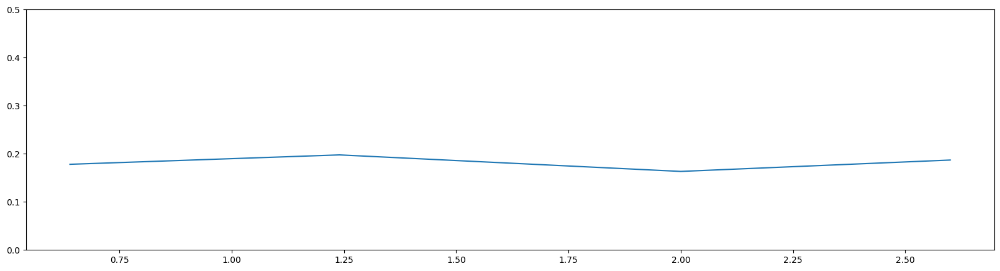

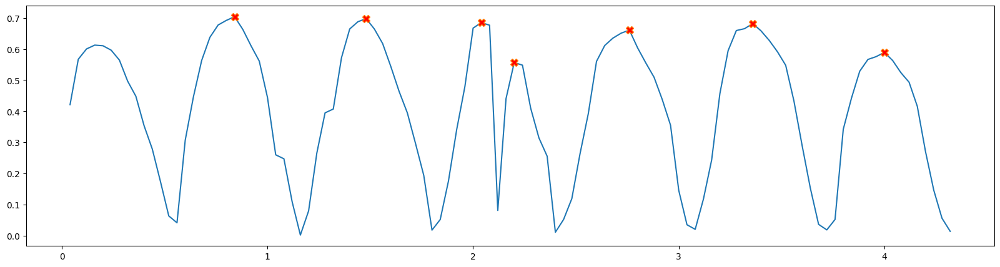

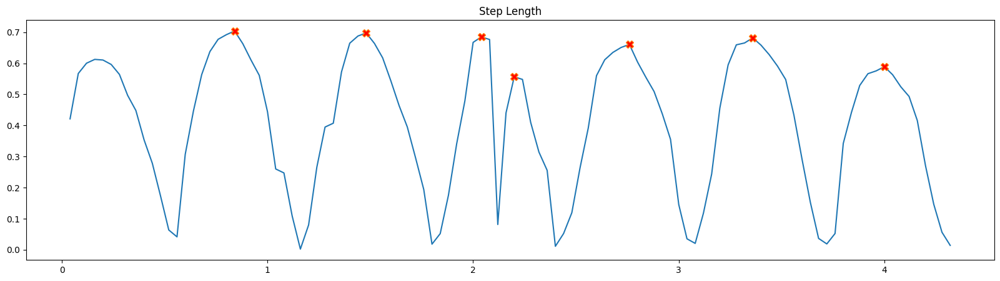

[20 36 50 54 68 83 99]
        lbl_r     lbl_l    center  leg_ratio     t  velocity  visi_lbl_r  \
0    1.472693  1.391927 -0.027469   0.838754  0.04 -1.060762    0.662856   
1    1.454725  1.526626 -0.040042   0.842223  0.08  0.135877    0.677887   
2    1.474692  1.560681 -0.032566   0.869063  0.12  0.134980    0.690930   
3    1.484101  1.568353 -0.029975   0.882046  0.16  0.050245    0.701691   
4    1.467484  1.563895 -0.028411   0.882791  0.20 -0.025998    0.719636   
..        ...       ...       ...        ...   ...       ...         ...   
103  1.430555  1.410007 -0.012780   0.944751  4.16 -0.163651    0.681408   
104  1.431760  1.332560 -0.017368   1.051714  4.20 -0.012026    0.668205   
105  1.466420  1.344069 -0.014436   1.070117  4.24  0.091184    0.600570   
106  1.400191  1.359925 -0.013367   1.052215  4.28 -0.031979    0.519129   
107  1.296139  1.395105 -0.012608   0.944072  4.32  0.173774    0.466552   

     visi_lbl_l  
0      0.934921  
1      0.940046  
2      0.9

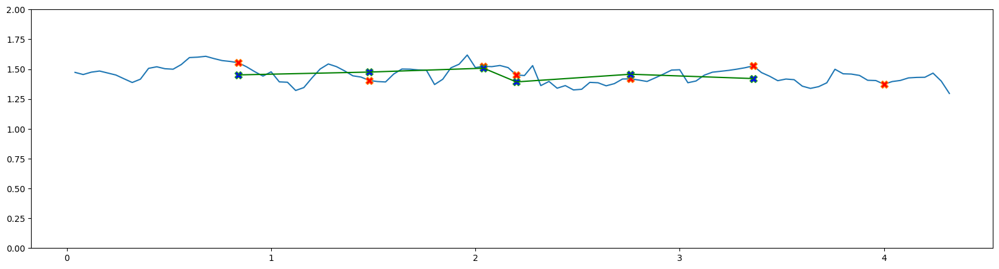

     upper_arm_r  upper_arm_l         c     t  velocity  visi_l_urm_r  \
0       0.587170     0.564793 -0.027469  0.04 -1.060762      0.075250   
1       0.596076     0.586383 -0.040042  0.08  0.135877      0.075541   
2       0.602053     0.583035 -0.032566  0.12  0.134980      0.073425   
3       0.593885     0.592046 -0.029975  0.16  0.050245      0.070582   
4       0.578118     0.590750 -0.028411  0.20 -0.025998      0.068427   
..           ...          ...       ...   ...       ...           ...   
103     0.566682     0.577102 -0.012780  4.16 -0.163651      0.610707   
104     0.597452     0.591420 -0.017368  4.20 -0.012026      0.583053   
105     0.594909     0.599757 -0.014436  4.24  0.091184      0.548713   
106     0.590821     0.600789 -0.013367  4.28 -0.031979      0.514508   
107     0.591752     0.597921 -0.012608  4.32  0.173774      0.485142   

     visi_l_urm_l  
0        0.998837  
1        0.998870  
2        0.998887  
3        0.998933  
4        0.998975  
.. 

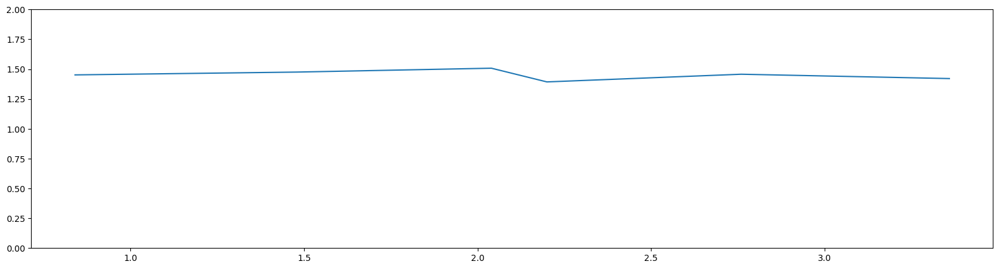

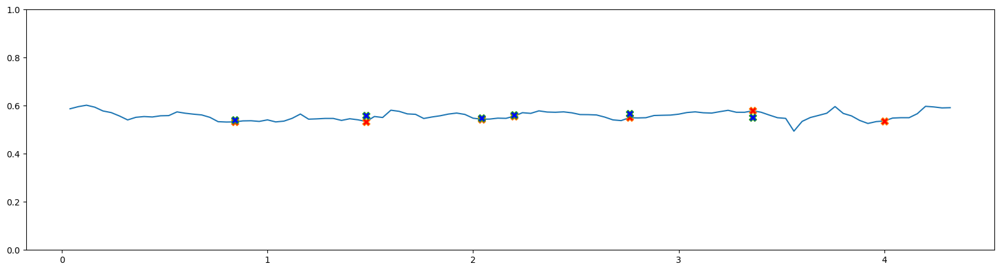

            r         l         c     t  velocity  visi_larm_r  visi_larm_l
0    0.485246  0.554759 -0.027469  0.04 -1.060762     0.010310     0.995225
1    0.483517  0.527830 -0.040042  0.08  0.135877     0.010542     0.995321
2    0.473621  0.509248 -0.032566  0.12  0.134980     0.010144     0.995419
3    0.454771  0.498924 -0.029975  0.16  0.050245     0.009433     0.995582
4    0.445992  0.484490 -0.028411  0.20 -0.025998     0.009077     0.995788
..        ...       ...       ...   ...       ...          ...          ...
103  0.457431  0.454895 -0.012780  4.16 -0.163651     0.362445     0.986903
104  0.451173  0.497712 -0.017368  4.20 -0.012026     0.333311     0.985313
105  0.449492  0.507080 -0.014436  4.24  0.091184     0.292509     0.979071
106  0.467729  0.528878 -0.013367  4.28 -0.031979     0.254070     0.970807
107  0.476354  0.536963 -0.012608  4.32  0.173774     0.225743     0.965164

[108 rows x 7 columns]
t1 0.84
t1 1.48
t1 2.04
t1 2.2
t1 2.76
t1 3.36
results [0.430999

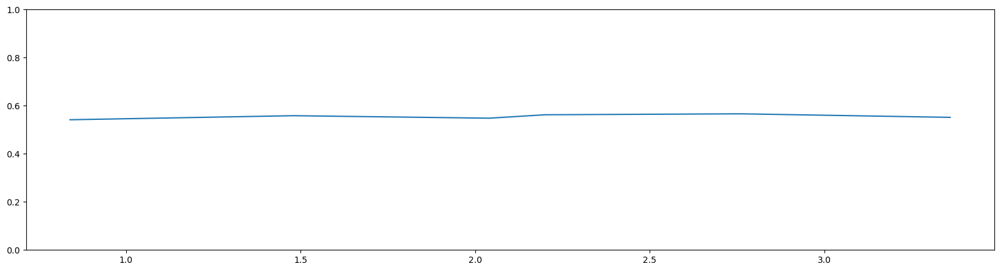

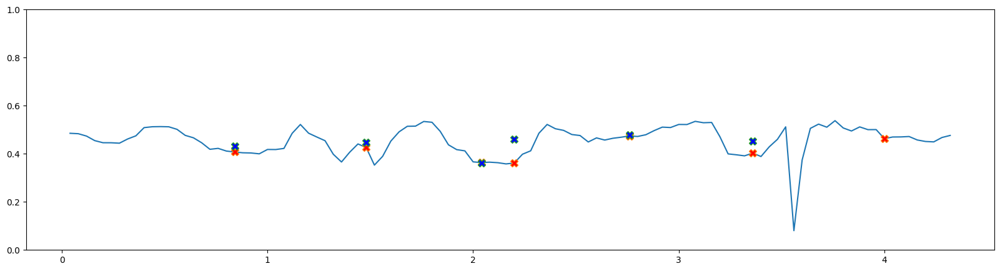

            r         l         c     t  velocity  visi_l_r  visi_l_l
0    0.307287  0.329772 -0.027469  0.04 -1.060762  0.000014  0.979495
1    0.312851  0.321367 -0.040042  0.08  0.135877  0.000015  0.979869
2    0.319690  0.312215 -0.032566  0.12  0.134980  0.000014  0.980328
3    0.301728  0.309751 -0.029975  0.16  0.050245  0.000012  0.980984
4    0.302370  0.312623 -0.028411  0.20 -0.025998  0.000011  0.981893
..        ...       ...       ...   ...       ...       ...       ...
103  0.300060  0.311294 -0.012780  4.16 -0.163651  0.068362  0.953170
104  0.277519  0.312525 -0.017368  4.20 -0.012026  0.055615  0.947552
105  0.282046  0.325284 -0.014436  4.24  0.091184  0.039899  0.927294
106  0.319811  0.330034 -0.013367  4.28 -0.031979  0.027889  0.901926
107  0.342416  0.326192 -0.012608  4.32  0.173774  0.020764  0.885159

[108 rows x 7 columns]
t1 0.84
t1 1.48
t1 2.04
t1 2.2
t1 2.76
t1 3.36
results [0.2722826363878099, 0.2892423904514057, 0.2483811456701422, 0.2949428816309167, 

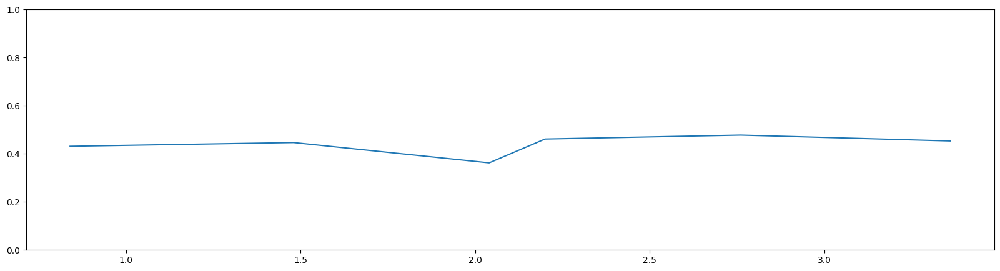

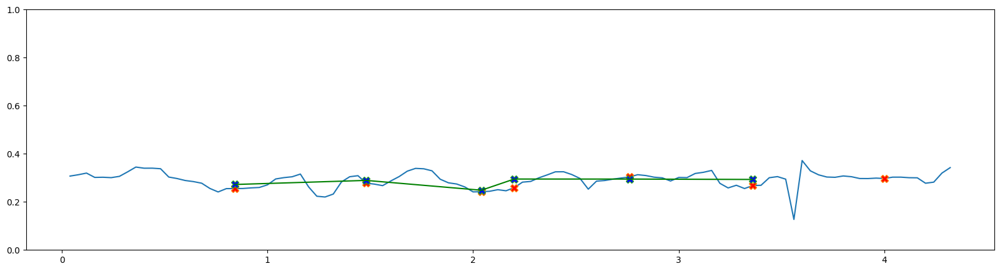

            r         l  leg_ratio         c     t  velocity  visi_thigh_r  \
0    0.680221  0.810989   1.364126 -0.027469  0.04 -1.060762      0.841235   
1    0.668905  0.794214   1.072920 -0.040042  0.08  0.135877      0.849202   
2    0.686725  0.790191   1.022682 -0.032566  0.12  0.134980      0.856080   
3    0.697359  0.790615   1.011577 -0.029975  0.16  0.050245      0.861699   
4    0.687322  0.778578   0.993436 -0.028411  0.20 -0.025998      0.871035   
..        ...       ...        ...       ...   ...       ...           ...   
103  0.720362  0.762489   1.096791 -0.012780  4.16 -0.163651      0.851113   
104  0.718306  0.682986   1.098343 -0.017368  4.20 -0.012026      0.842099   
105  0.719553  0.672406   1.111967 -0.014436  4.24  0.091184      0.803539   
106  0.701624  0.666807   1.007861 -0.013367  4.28 -0.031979      0.761296   
107  0.645113  0.683330   0.914652 -0.012608  4.32  0.173774      0.730666   

     visi_thigh_l  
0        0.975852  
1        0.977734  
2  

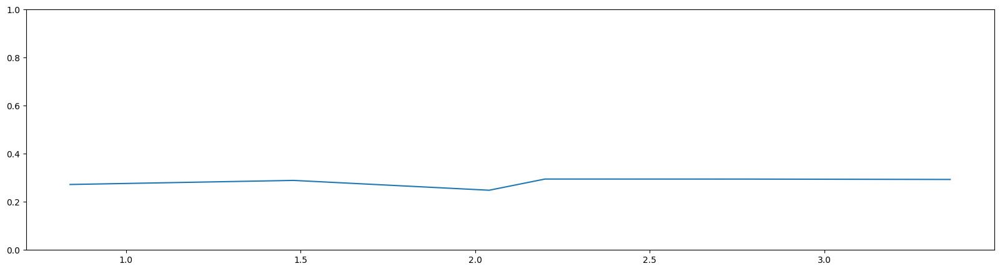

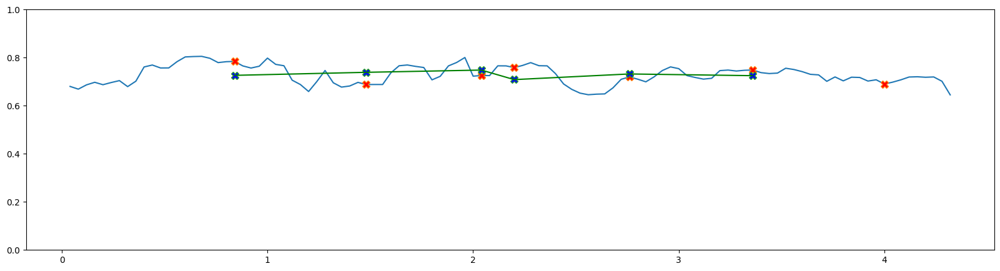

            r         l  leg_ratio         c     t  velocity  visi_shk_r  \
0    0.792472  0.580938   0.838754 -0.027469  0.04 -1.060762    0.787956   
1    0.785820  0.732412   0.842223 -0.040042  0.08  0.135877    0.798264   
2    0.787966  0.770490   0.869063 -0.032566  0.12  0.134980    0.807085   
3    0.786742  0.777738   0.882046 -0.029975  0.16  0.050245    0.814311   
4    0.780162  0.785317   0.882791 -0.028411  0.20 -0.025998    0.826185   
..        ...       ...        ...       ...   ...       ...         ...   
103  0.710193  0.647518   0.944751 -0.012780  4.16 -0.163651    0.800608   
104  0.713454  0.649573   1.051714 -0.017368  4.20 -0.012026    0.793499   
105  0.746867  0.671663   1.070117 -0.014436  4.24  0.091184    0.747406   
106  0.698567  0.693118   1.052215 -0.013367  4.28 -0.031979    0.681901   
107  0.651026  0.711774   0.944072 -0.012608  4.32  0.173774    0.638530   

     visi_shk_l  
0      0.958057  
1      0.961454  
2      0.963621  
3      0.965849

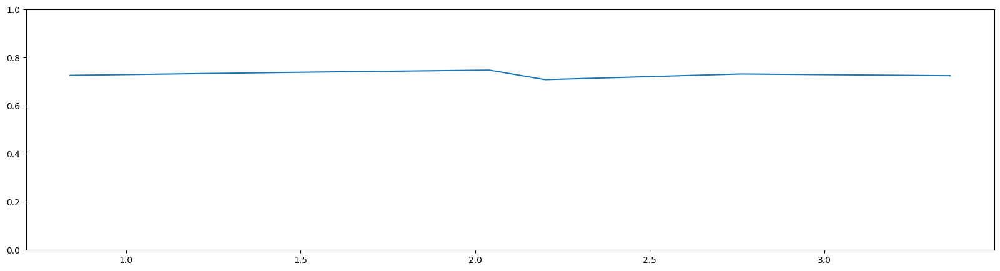

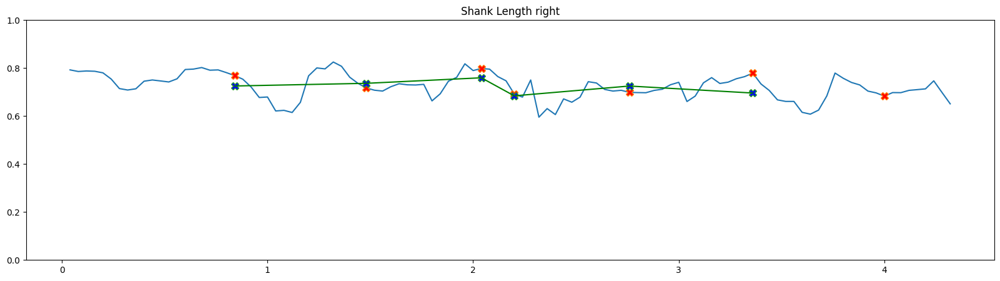

       foot_r    foot_l  leg_ratio         c     t  velocity  visi_foot_r  \
0    0.213115  0.308699   0.838754 -0.027469  0.04 -1.060762     0.827135   
1    0.221032  0.214310   0.842223 -0.040042  0.08  0.135877     0.833428   
2    0.212371  0.212261   0.869063 -0.032566  0.12  0.134980     0.838511   
3    0.215648  0.199953   0.882046 -0.029975  0.16  0.050245     0.842578   
4    0.213395  0.219474   0.882791 -0.028411  0.20 -0.025998     0.849596   
..        ...       ...        ...       ...   ...       ...          ...   
103  0.181334  0.341964   0.944751 -0.012780  4.16 -0.163651     0.880472   
104  0.174323  0.332944   1.051714 -0.017368  4.20 -0.012026     0.881887   
105  0.194624  0.284936   1.070117 -0.014436  4.24  0.091184     0.858886   
106  0.177120  0.256900   1.052215 -0.013367  4.28 -0.031979     0.804683   
107  0.199106  0.271897   0.944072 -0.012608  4.32  0.173774     0.776350   

     visi_foot_l  
0       0.878624  
1       0.887249  
2       0.893081  

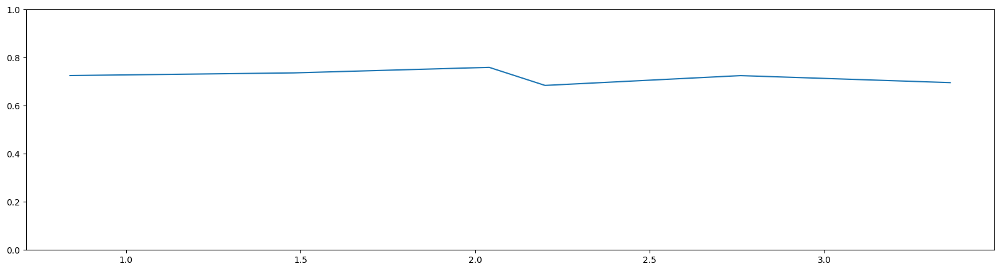

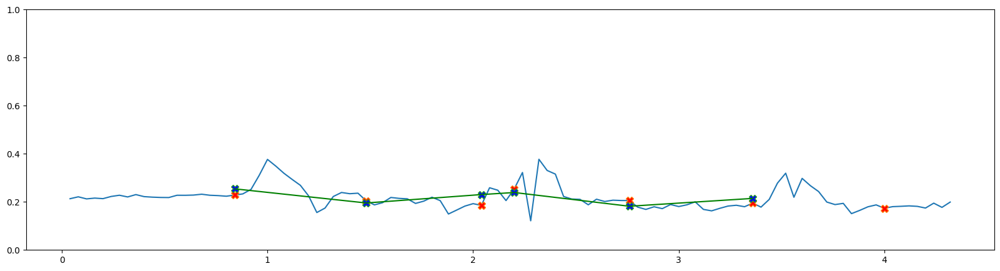

side left geemanthi left 3 (6, 29)
          ubh     t    center     r_sdr     l_sdr        sl        al  \
0    0.188888  0.04 -0.037024  0.897267  0.901980  0.008411  0.100707   
1    0.188816  0.08 -0.038644  0.886040  0.889509  0.005404  0.097924   
2    0.187633  0.12 -0.033619  0.877899  0.881596  0.004645  0.095458   
3    0.188448  0.16 -0.035906  0.866960  0.876696  0.010340  0.092825   
4    0.185771  0.20 -0.037047  0.855293  0.871929  0.018114  0.085541   
..        ...   ...       ...       ...       ...       ...       ...   
96   0.178565  3.88 -0.012903  0.122168  0.106287  0.016008  0.088416   
97   0.179369  3.92 -0.014400  0.116319  0.101977  0.014380  0.090218   
98   0.182617  3.96 -0.019441  0.111681  0.097283  0.014462  0.090575   
99   0.181396  4.00 -0.017303  0.109478  0.092181  0.017308  0.088405   
100  0.181828  4.04 -0.018952  0.104021  0.087372  0.016770  0.090905   

          sln       aln  
0    0.044531  0.533157  
1    0.028618  0.518620  
2    0.024

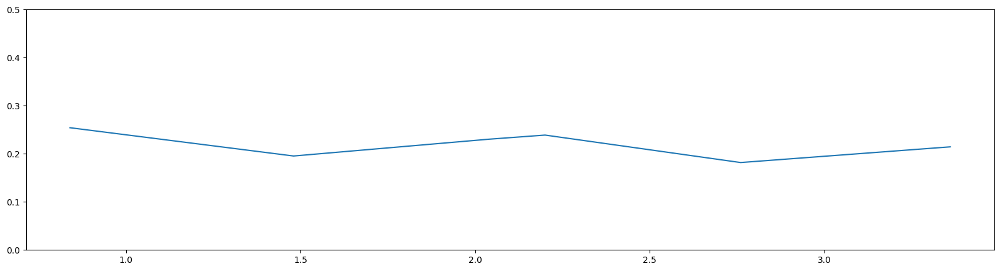

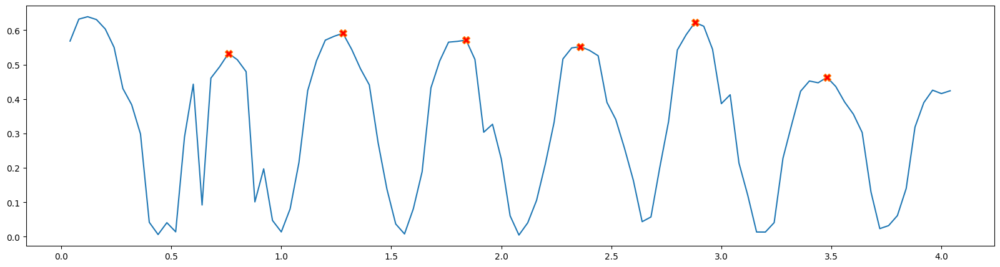

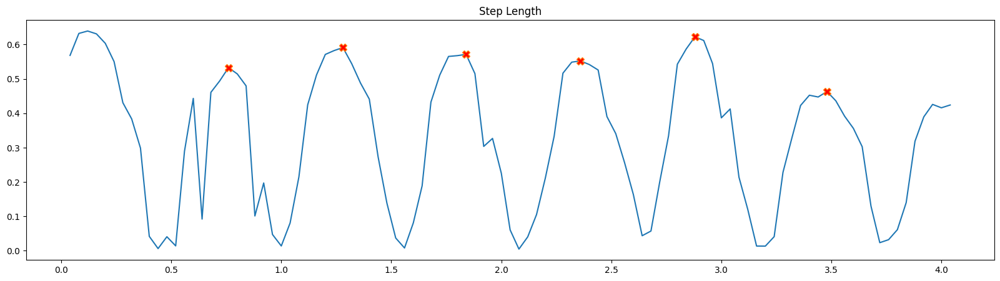

[18 31 45 58 71 86]
        lbl_r     lbl_l    center  leg_ratio     t  velocity  visi_lbl_r  \
0    1.222686  1.269251 -0.037024   0.927718  0.04 -0.470000    0.892122   
1    1.226218  1.256856 -0.038644   0.957745  0.08  0.177154    0.896177   
2    1.248509  1.245402 -0.033619   0.975537  0.12  0.016755    0.897783   
3    1.231575  1.227932 -0.035906   0.984988  0.16 -0.062890    0.897593   
4    1.255018  1.215262 -0.037047   1.002063  0.20 -0.023235    0.897903   
..        ...       ...       ...        ...   ...       ...         ...   
96   1.311247  1.311332 -0.012903   1.038915  3.88 -0.025029    0.576077   
97   1.312504  1.314271 -0.014400   0.999918  3.92 -0.100034    0.576211   
98   1.254368  1.269315 -0.019441   0.976103  3.96 -0.069192    0.566414   
99   1.247364  1.245041 -0.017303   0.970016  4.00  0.131327    0.547697   
100  1.237781  1.217320 -0.018952   0.962587  4.04 -0.419463    0.522381   

     visi_lbl_l  
0      0.989885  
1      0.990217  
2      0.9893

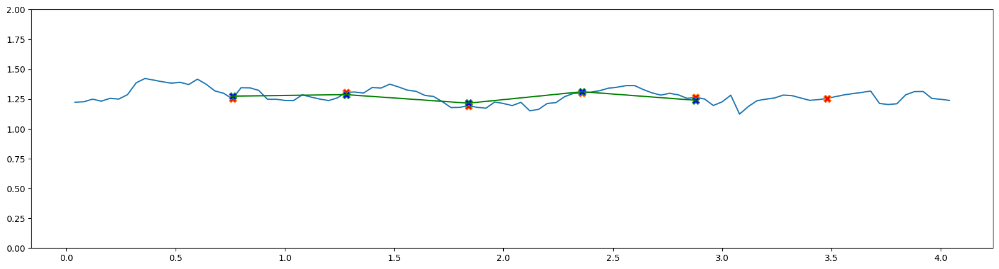

     upper_arm_r  upper_arm_l         c     t  velocity  visi_l_urm_r  \
0       0.533157     0.524620 -0.037024  0.04 -0.470000      0.030372   
1       0.518620     0.550576 -0.038644  0.08  0.177154      0.031181   
2       0.508747     0.558747 -0.033619  0.12  0.016755      0.033296   
3       0.492576     0.552850 -0.035906  0.16 -0.062890      0.033941   
4       0.460462     0.555054 -0.037047  0.20 -0.023235      0.036170   
..           ...          ...       ...   ...       ...           ...   
96      0.495150     0.471748 -0.012903  3.88 -0.025029      0.095553   
97      0.502974     0.481740 -0.014400  3.92 -0.100034      0.094856   
98      0.495983     0.491875 -0.019441  3.96 -0.069192      0.094038   
99      0.487361     0.493221 -0.017303  4.00  0.131327      0.091574   
100     0.499948     0.505649 -0.018952  4.04 -0.419463      0.089170   

     visi_l_urm_l  
0        0.998818  
1        0.998818  
2        0.998842  
3        0.998868  
4        0.998808  
.. 

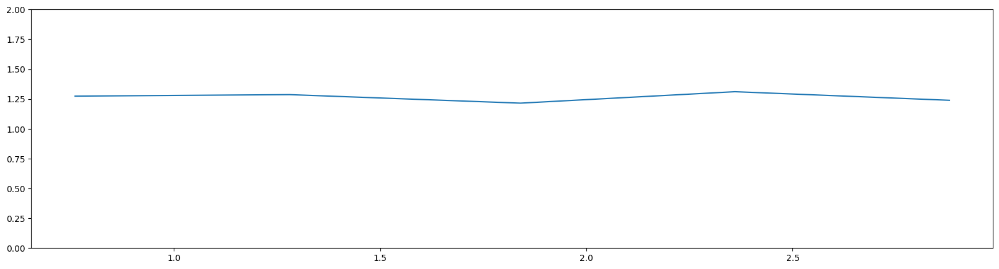

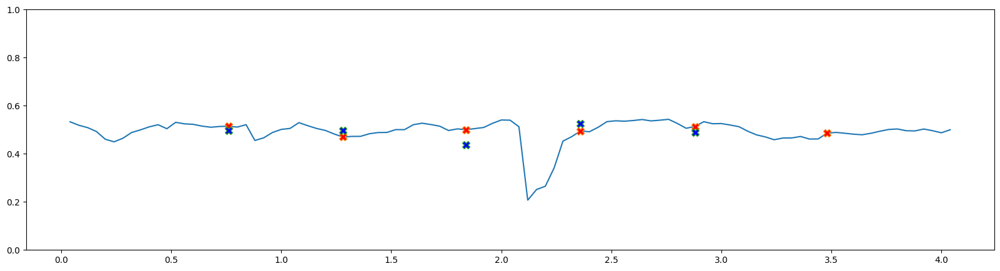

            r         l         c     t  velocity  visi_larm_r  visi_larm_l
0    0.426367  0.450605 -0.037024  0.04 -0.470000     0.002036     0.995390
1    0.429197  0.418565 -0.038644  0.08  0.177154     0.002098     0.995448
2    0.437840  0.422878 -0.033619  0.12  0.016755     0.002329     0.995600
3    0.431176  0.438736 -0.035906  0.16 -0.062890     0.002435     0.995715
4    0.441582  0.437379 -0.037047  0.20 -0.023235     0.002799     0.995500
..        ...       ...       ...   ...       ...          ...          ...
96   0.444281  0.519704 -0.012903  3.88 -0.025029     0.009895     0.974144
97   0.436361  0.508627 -0.014400  3.92 -0.100034     0.009624     0.973895
98   0.421167  0.485733 -0.019441  3.96 -0.069192     0.009320     0.974754
99   0.421517  0.481765 -0.017303  4.00  0.131327     0.008778     0.974535
100  0.415106  0.486419 -0.018952  4.04 -0.419463     0.008256     0.971840

[101 rows x 7 columns]
t1 0.76
t1 1.28
t1 1.84
t1 2.36
t1 2.88
results [0.3743407707390

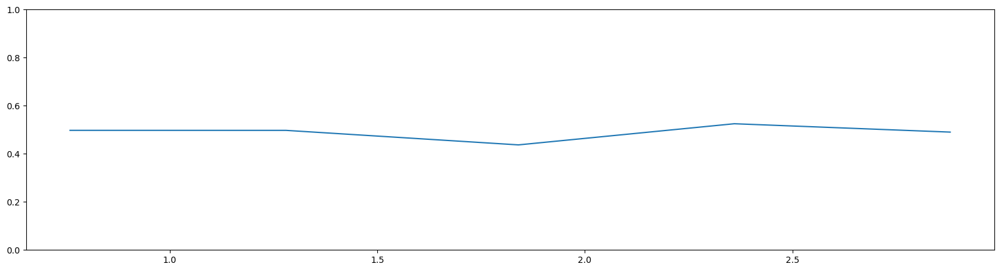

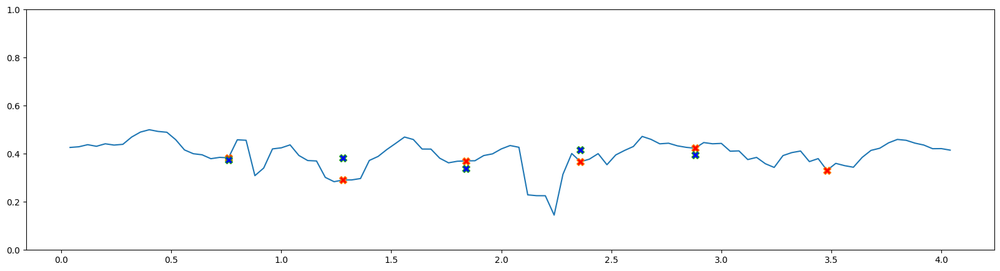

            r         l         c     t  velocity      visi_l_r  visi_l_l
0    0.291862  0.298641 -0.037024  0.04 -0.470000  3.314206e-07  0.980938
1    0.291525  0.299128 -0.038644  0.08  0.177154  3.488554e-07  0.981213
2    0.312638  0.297131 -0.033619  0.12  0.016755  4.408618e-07  0.981851
3    0.305262  0.298231 -0.035906  0.16 -0.062890  4.885015e-07  0.982305
4    0.297470  0.293804 -0.037047  0.20 -0.023235  6.855123e-07  0.981531
..        ...       ...       ...   ...       ...           ...       ...
96   0.296515  0.295306 -0.012903  3.88 -0.025029  1.062909e-05  0.912099
97   0.306908  0.297498 -0.014400  3.92 -0.100034  9.822507e-06  0.910896
98   0.294527  0.289595 -0.019441  3.96 -0.069192  8.964468e-06  0.913022
99   0.304823  0.282750 -0.017303  4.00  0.131327  7.676518e-06  0.912099
100  0.291721  0.275413 -0.018952  4.04 -0.419463  6.559430e-06  0.903549

[101 rows x 7 columns]
t1 0.76
t1 1.28
t1 1.84
t1 2.36
t1 2.88
results [0.2735154416467777, 0.29299485239039963

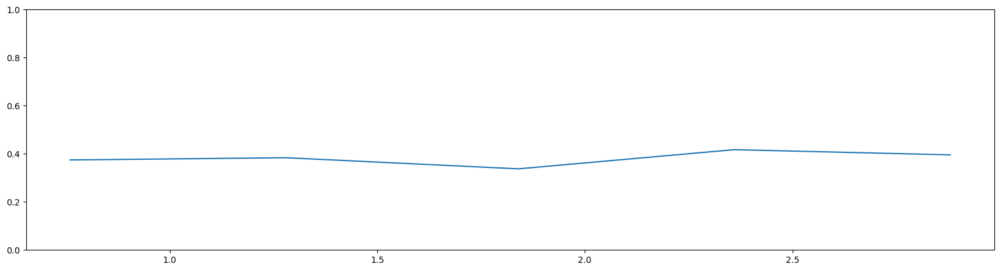

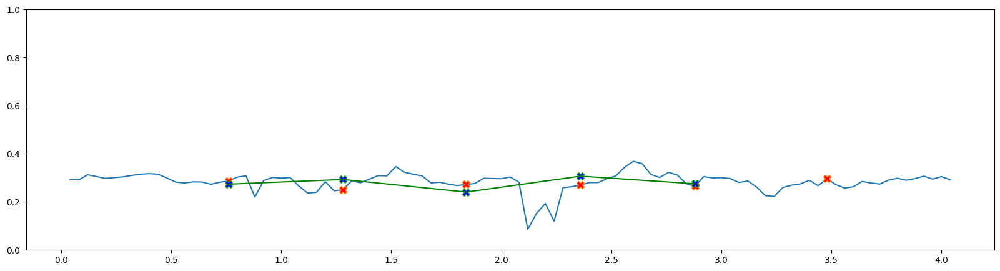

            r         l  leg_ratio         c     t  velocity  visi_thigh_r  \
0    0.588524  0.634378   0.998879 -0.037024  0.04 -0.470000      0.952555   
1    0.613000  0.640046   0.994176 -0.038644  0.08  0.177154      0.954471   
2    0.625783  0.641476   1.031129 -0.033619  0.12  0.016755      0.955345   
3    0.625110  0.634637   1.022198 -0.035906  0.16 -0.062890      0.955300   
4    0.629049  0.627754   1.065466 -0.037047  0.20 -0.023235      0.955415   
..        ...       ...        ...       ...   ...       ...           ...   
96   0.633511  0.609781   0.966054 -0.012903  3.88 -0.025029      0.791521   
97   0.636079  0.636131   0.997470 -0.014400  3.92 -0.100034      0.792310   
98   0.608916  0.623823   0.999939 -0.019441  3.96 -0.069192      0.786369   
99   0.601227  0.619811   1.033438 -0.017303  4.00  0.131327      0.776496   
100  0.602626  0.626048   1.074219 -0.018952  4.04 -0.419463      0.761856   

     visi_thigh_l  
0        0.996703  
1        0.996780  
2  

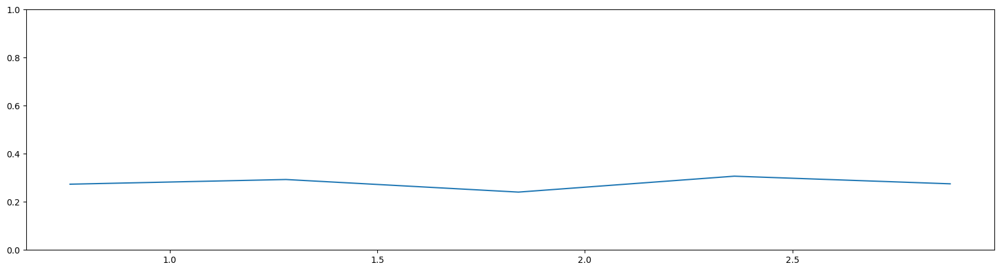

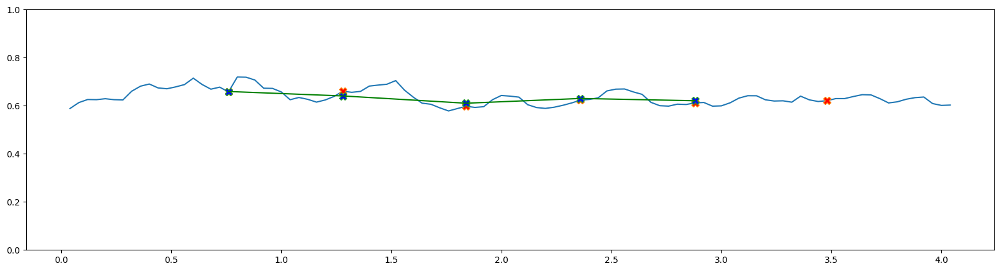

            r         l  leg_ratio         c     t  velocity  visi_shk_r  \
0    0.634161  0.634873   0.927718 -0.037024  0.04 -0.470000    0.936558   
1    0.613218  0.616810   0.957745 -0.038644  0.08  0.177154    0.938925   
2    0.622726  0.603926   0.975537 -0.033619  0.12  0.016755    0.939747   
3    0.606465  0.593295   0.984988 -0.035906  0.16 -0.062890    0.939592   
4    0.625969  0.587508   1.002063 -0.037047  0.20 -0.023235    0.939804   
..        ...       ...        ...       ...   ...       ...         ...   
96   0.677736  0.701551   1.038915 -0.012903  3.88 -0.025029    0.727810   
97   0.676425  0.678140   0.999918 -0.014400  3.92 -0.100034    0.727254   
98   0.645451  0.645491   0.976103 -0.019441  3.96 -0.069192    0.720290   
99   0.646137  0.625230   0.970016 -0.017303  4.00  0.131327    0.705344   
100  0.635154  0.591271   0.962587 -0.018952  4.04 -0.419463    0.685670   

     visi_shk_l  
0      0.993160  
1      0.993415  
2      0.992885  
3      0.993028

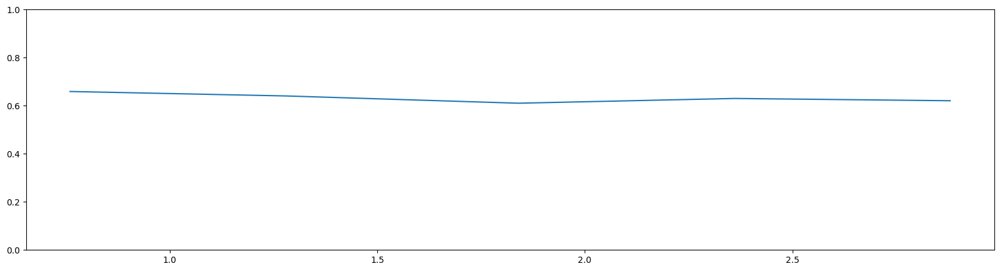

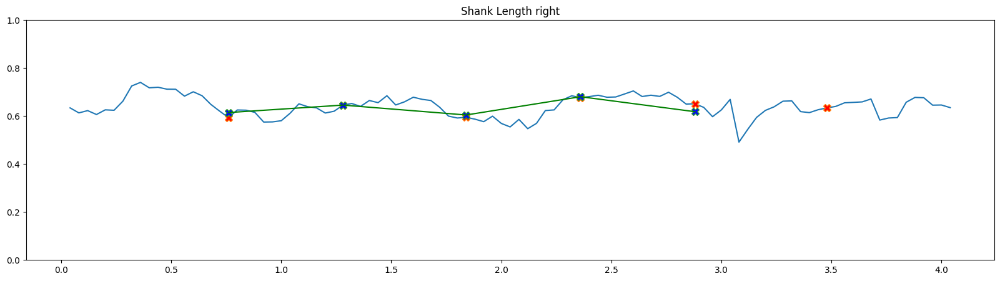

       foot_r    foot_l  leg_ratio         c     t  velocity  visi_foot_r  \
0    0.193114  0.189442   0.927718 -0.037024  0.04 -0.470000     0.920250   
1    0.230063  0.182539   0.957745 -0.038644  0.08  0.177154     0.920595   
2    0.211433  0.147680   0.975537 -0.033619  0.12  0.016755     0.920325   
3    0.212260  0.160102   0.984988 -0.035906  0.16 -0.062890     0.918733   
4    0.229086  0.180539   1.002063 -0.037047  0.20 -0.023235     0.918245   
..        ...       ...        ...       ...   ...       ...          ...   
96   0.176678  0.219755   1.038915 -0.012903  3.88 -0.025029     0.812493   
97   0.178388  0.196242   0.999918 -0.014400  3.92 -0.100034     0.806785   
98   0.184727  0.197207   0.976103 -0.019441  3.96 -0.069192     0.806241   
99   0.203102  0.174931   0.970016 -0.017303  4.00  0.131327     0.795331   
100  0.198913  0.190947   0.962587 -0.018952  4.04 -0.419463     0.785329   

     visi_foot_l  
0       0.928076  
1       0.931313  
2       0.932532  

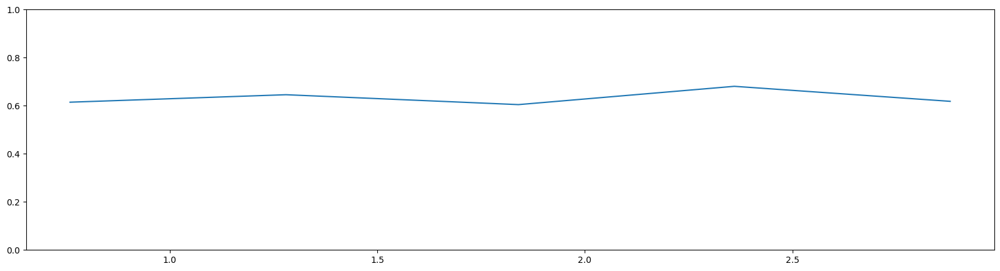

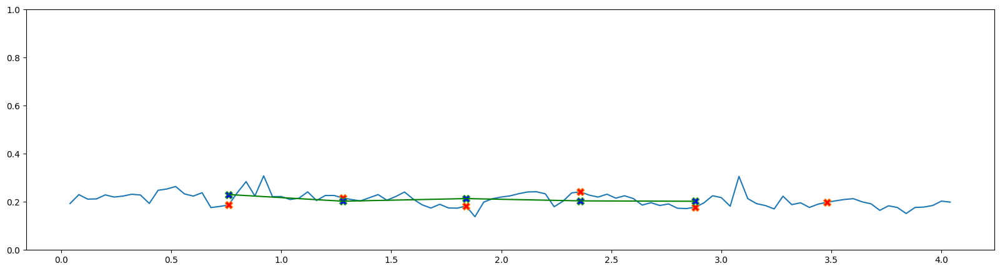

side left gihan left 3 (5, 29)
          ubh     t    center     r_sdr     l_sdr        sl        al  \
0    0.154914  0.04 -0.040871  0.839791  0.852611  0.012870  0.081994   
1    0.156384  0.08 -0.031971  0.830069  0.845108  0.015168  0.086176   
2    0.156238  0.12 -0.028027  0.824937  0.839986  0.015198  0.086462   
3    0.155886  0.16 -0.029192  0.822067  0.839624  0.017917  0.084947   
4    0.157461  0.20 -0.019263  0.807454  0.829073  0.021670  0.040777   
..        ...   ...       ...       ...       ...       ...       ...   
120  0.158485  4.84 -0.008015  0.148201  0.124379  0.024207  0.079123   
121  0.158987  4.88 -0.010499  0.139695  0.119769  0.020727  0.081596   
122  0.159614  4.92 -0.014557  0.136506  0.115413  0.021966  0.062722   
123  0.159911  4.96 -0.014732  0.135036  0.113640  0.022210  0.067797   
124  0.159789  5.00 -0.011279  0.121017  0.102717  0.019377  0.077515   

          sln       aln  
0    0.083077  0.529286  
1    0.096994  0.551053  
2    0.097273 

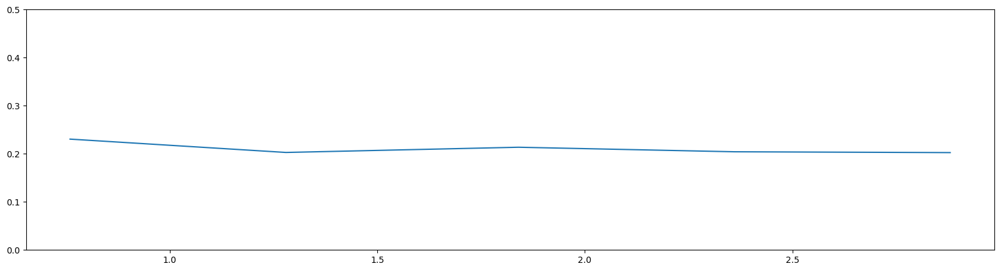

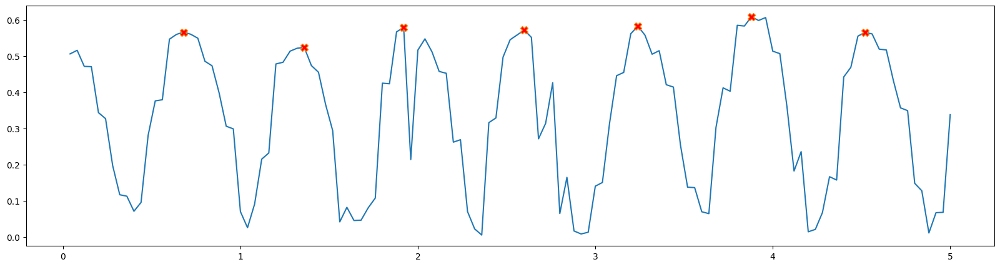

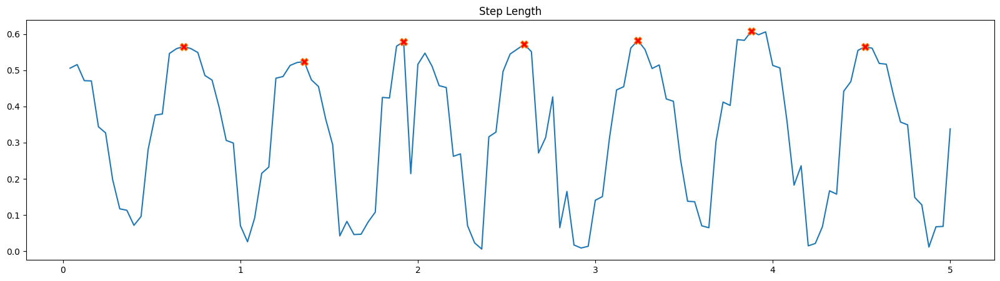

[ 16  33  47  64  80  96 112]
        lbl_r     lbl_l    center  leg_ratio     t  velocity  visi_lbl_r  \
0    1.268608  1.407208 -0.040871   0.931570  0.04 -0.040466    0.336580   
1    1.281007  1.420047 -0.031971   0.990624  0.08  0.268417    0.346412   
2    1.259455  1.424642 -0.028027   0.988356  0.12 -0.069874    0.360230   
3    1.267998  1.423286 -0.029192   1.007641  0.16  0.159791    0.369064   
4    1.182072  1.406321 -0.019263   0.964151  0.20  0.115776    0.406120   
..        ...       ...       ...        ...   ...       ...         ...   
120  1.425354  1.302028 -0.008015   0.999579  4.84 -0.066753    0.378866   
121  1.280734  1.327999 -0.010499   0.938111  4.88 -0.083215    0.369558   
122  1.294145  1.326960 -0.014557   0.939521  4.92 -0.079360    0.391527   
123  1.304874  1.322229 -0.014732   0.957052  4.96  0.069999    0.400877   
124  1.349444  1.451263 -0.011279   0.958717  5.00  0.045270    0.395073   

     visi_lbl_l  
0      0.959855  
1      0.961685  
2  

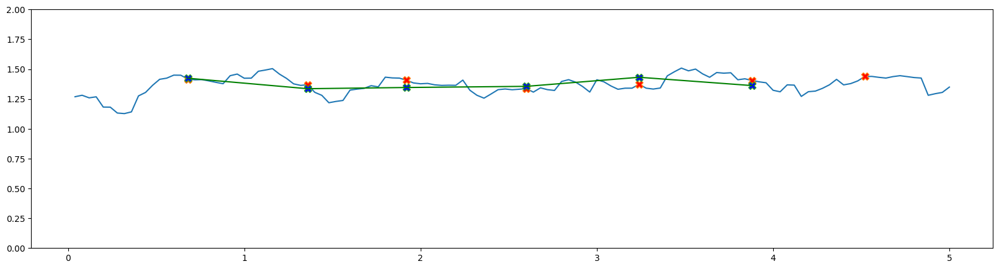

     upper_arm_r  upper_arm_l         c     t  velocity  visi_l_urm_r  \
0       0.529286     0.579942 -0.040871  0.04 -0.040466      0.056710   
1       0.551053     0.587006 -0.031971  0.08  0.268417      0.060560   
2       0.553400     0.589531 -0.028027  0.12 -0.069874      0.065392   
3       0.544934     0.596476 -0.029192  0.16  0.159791      0.069043   
4       0.258965     0.573920 -0.019263  0.20  0.115776      0.068838   
..           ...          ...       ...   ...       ...           ...   
120     0.499244     0.575672 -0.008015  4.84 -0.066753      0.096140   
121     0.513228     0.571639 -0.010499  4.88 -0.083215      0.093695   
122     0.392961     0.571334 -0.014557  4.92 -0.079360      0.087642   
123     0.423967     0.569641 -0.014732  4.96  0.069999      0.084314   
124     0.485112     0.570716 -0.011279  5.00  0.045270      0.084765   

     visi_l_urm_l  
0        0.996447  
1        0.996130  
2        0.995909  
3        0.995842  
4        0.995109  
.. 

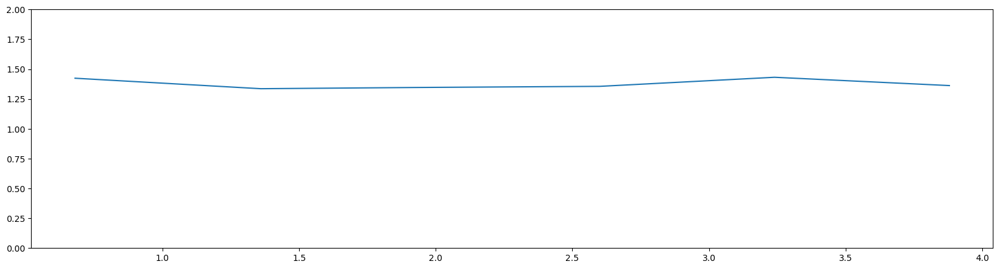

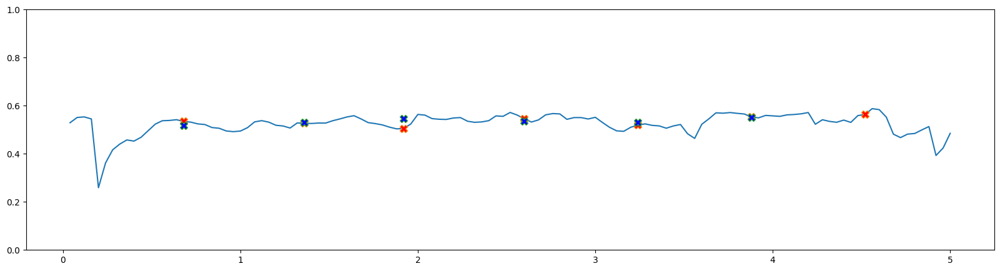

            r         l         c     t  velocity  visi_larm_r  visi_larm_l
0    0.442572  0.481429 -0.040871  0.04 -0.040466     0.006005     0.981691
1    0.424110  0.465244 -0.031971  0.08  0.268417     0.006732     0.979941
2    0.428260  0.462307 -0.028027  0.12 -0.069874     0.007934     0.979069
3    0.460135  0.458432 -0.029192  0.16  0.159791     0.008935     0.978561
4    0.138303  0.478388 -0.019263  0.20  0.115776     0.009094     0.975657
..        ...       ...       ...   ...       ...          ...          ...
120  0.467808  0.479127 -0.008015  4.84 -0.066753     0.009133     0.909620
121  0.480284  0.479921 -0.010499  4.88 -0.083215     0.008879     0.911584
122  0.155931  0.489331 -0.014557  4.92 -0.079360     0.008097     0.917422
123  0.218695  0.491673 -0.014732  4.96  0.069999     0.007748     0.921633
124  0.506061  0.503410 -0.011279  5.00  0.045270     0.007677     0.923783

[125 rows x 7 columns]
t1 0.68
t1 1.36
t1 1.92
t1 2.6
t1 3.24
t1 3.88
results [0.406959

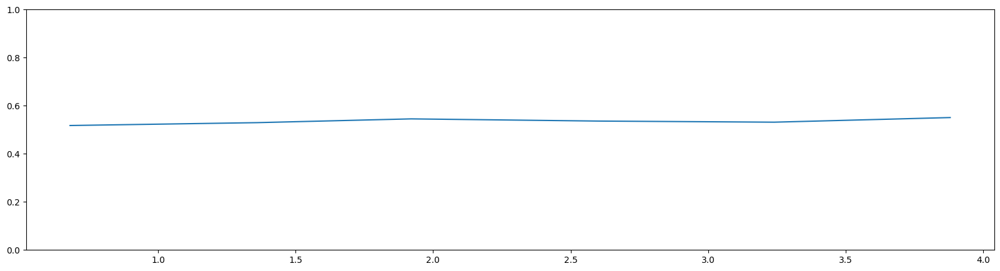

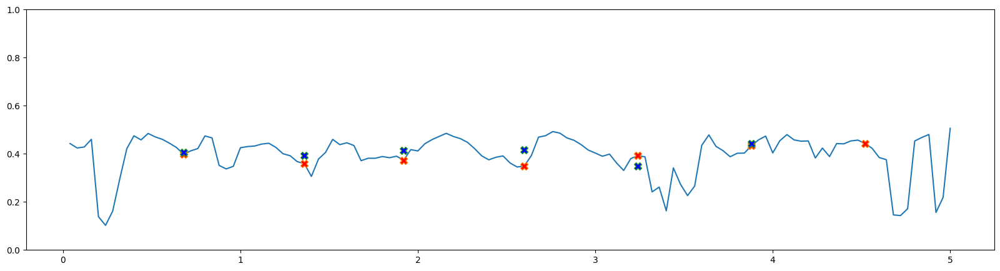

            r         l         c     t  velocity  visi_l_r  visi_l_l
0    0.281604  0.312951 -0.040871  0.04 -0.040466  0.000004  0.932095
1    0.283774  0.314410 -0.031971  0.08  0.268417  0.000006  0.926813
2    0.267355  0.313619 -0.028027  0.12 -0.069874  0.000009  0.924204
3    0.255401  0.313814 -0.029192  0.16  0.159791  0.000012  0.922763
4    0.131098  0.310274 -0.019263  0.20  0.115776  0.000013  0.914461
..        ...       ...       ...   ...       ...       ...       ...
120  0.255006  0.295348 -0.008015  4.84 -0.066753  0.000008  0.740204
121  0.310798  0.308668 -0.010499  4.88 -0.083215  0.000007  0.744820
122  0.136834  0.315322 -0.014557  4.92 -0.079360  0.000006  0.759576
123  0.160126  0.317768 -0.014732  4.96  0.069999  0.000006  0.770645
124  0.282162  0.319738 -0.011279  5.00  0.045270  0.000005  0.775612

[125 rows x 7 columns]
t1 0.68
t1 1.36
t1 1.92
t1 2.6
t1 3.24
t1 3.88
results [0.2792311305400765, 0.277914091541648, 0.28449976544234945, 0.2855555300149172, 

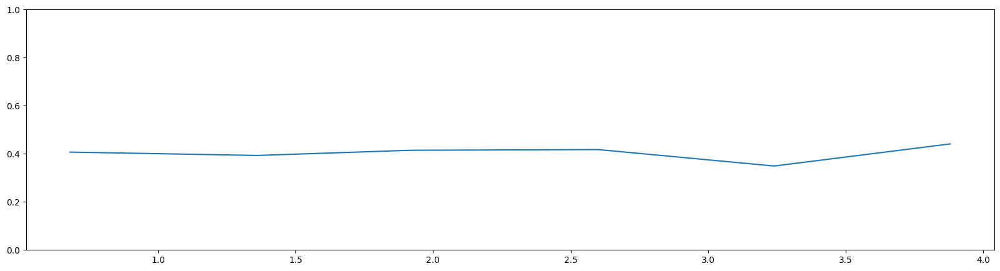

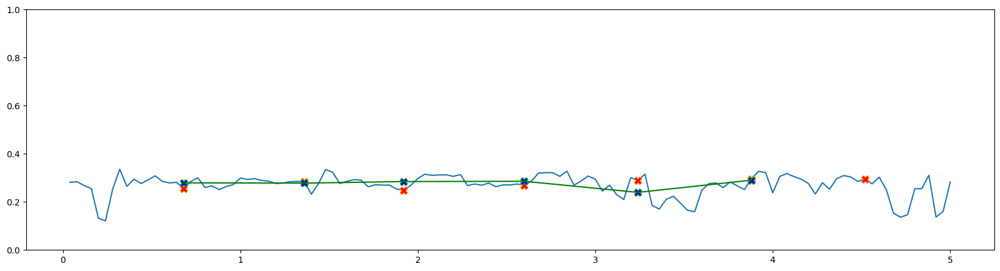

            r         l  leg_ratio         c     t  velocity  visi_thigh_r  \
0    0.634398  0.680998   0.873316 -0.040871  0.04 -0.040466      0.617726   
1    0.664243  0.670530   0.822883 -0.031971  0.08  0.268417      0.625029   
2    0.666004  0.673850   0.790433 -0.028027  0.12 -0.069874      0.636291   
3    0.681324  0.676157   0.785238 -0.029192  0.16  0.159791      0.642908   
4    0.671231  0.696188   0.719360 -0.019263  0.20  0.115776      0.671400   
..        ...       ...        ...       ...   ...       ...           ...   
120  0.716149  0.716451   1.211120 -0.008015  4.84 -0.066753      0.667072   
121  0.660325  0.703888   0.994069 -0.010499  4.88 -0.083215      0.661097   
122  0.643936  0.685388   1.013462 -0.014557  4.92 -0.079360      0.677529   
123  0.643416  0.672290   1.017724 -0.014732  4.96  0.069999      0.684595   
124  0.645890  0.673703   0.904821 -0.011279  5.00  0.045270      0.682653   

     visi_thigh_l  
0        0.981298  
1        0.982194  
2  

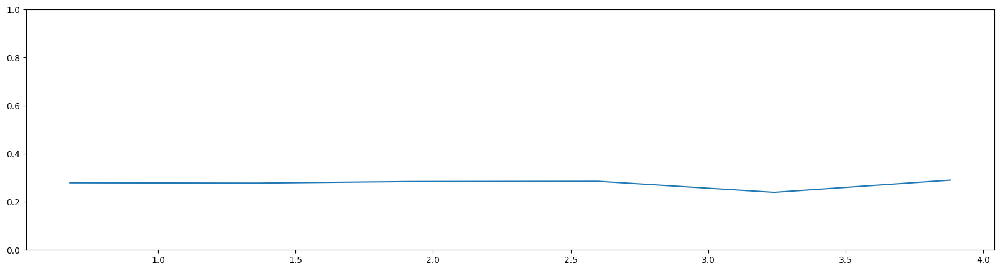

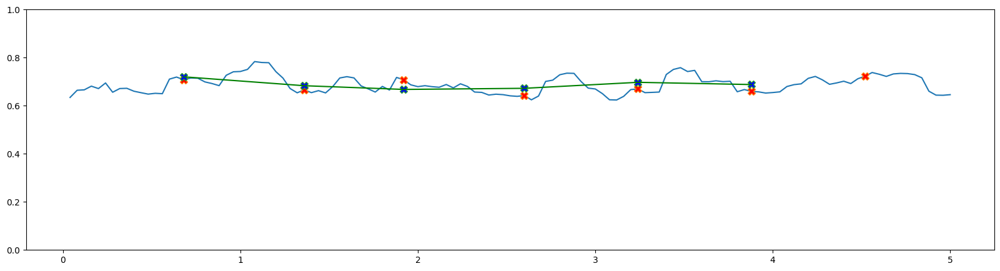

            r         l  leg_ratio         c     t  velocity  visi_shk_r  \
0    0.634210  0.726209   0.931570 -0.040871  0.04 -0.040466    0.544869   
1    0.616764  0.749517   0.990624 -0.031971  0.08  0.268417    0.554233   
2    0.593451  0.750792   0.988356 -0.028027  0.12 -0.069874    0.566142   
3    0.586674  0.747129   1.007641 -0.029192  0.16  0.159791    0.574054   
4    0.510841  0.710133   0.964151 -0.019263  0.20  0.115776    0.604886   
..        ...       ...        ...       ...   ...       ...         ...   
120  0.709205  0.585578   0.999579 -0.008015  4.84 -0.066753    0.567954   
121  0.620409  0.624111   0.938111 -0.010499  4.88 -0.083215    0.559007   
122  0.650209  0.641572   0.939521 -0.014557  4.92 -0.079360    0.577876   
123  0.661458  0.649939   0.957052 -0.014732  4.96  0.069999    0.585568   
124  0.703553  0.777561   0.958717 -0.011279  5.00  0.045270    0.578731   

     visi_shk_l  
0      0.978149  
1      0.979119  
2      0.978418  
3      0.977081

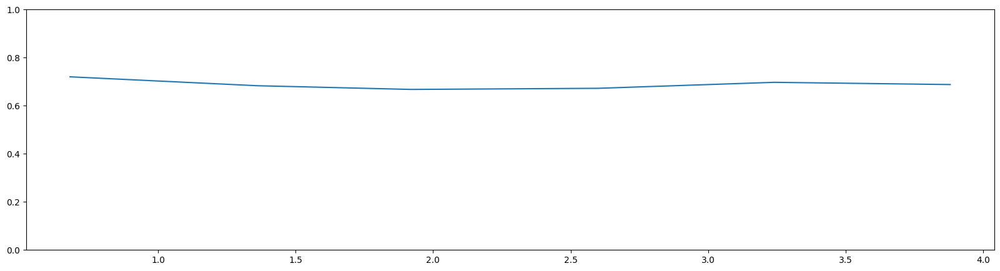

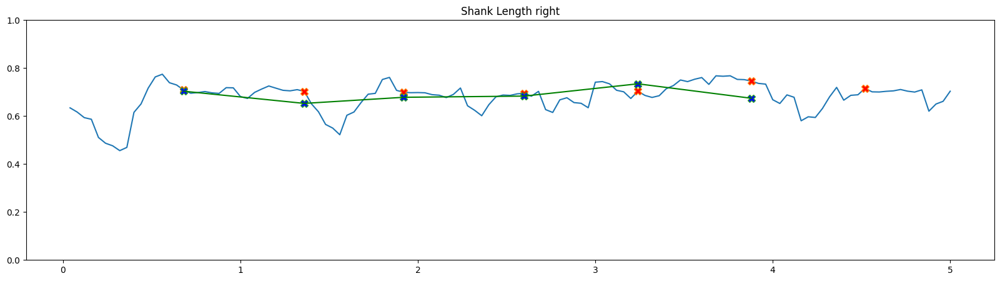

       foot_r    foot_l  leg_ratio         c     t  velocity  visi_foot_r  \
0    0.174500  0.220257   0.931570 -0.040871  0.04 -0.040466     0.845600   
1    0.172112  0.219911   0.990624 -0.031971  0.08  0.268417     0.851634   
2    0.215788  0.222119   0.988356 -0.028027  0.12 -0.069874     0.854695   
3    0.228629  0.219842   1.007641 -0.029192  0.16  0.159791     0.859544   
4    0.380739  0.223420   0.964151 -0.019263  0.20  0.115776     0.868723   
..        ...       ...        ...       ...   ...       ...          ...   
120  0.173061  0.258968   0.999579 -0.008015  4.84 -0.066753     0.745244   
121  0.199146  0.260525   0.938111 -0.010499  4.88 -0.083215     0.738483   
122  0.164800  0.239124   0.939521 -0.014557  4.92 -0.079360     0.747550   
123  0.162551  0.243094   0.957052 -0.014732  4.96  0.069999     0.747390   
124  0.178637  0.220562   0.958717 -0.011279  5.00  0.045270     0.725383   

     visi_foot_l  
0       0.976025  
1       0.976648  
2       0.976933  

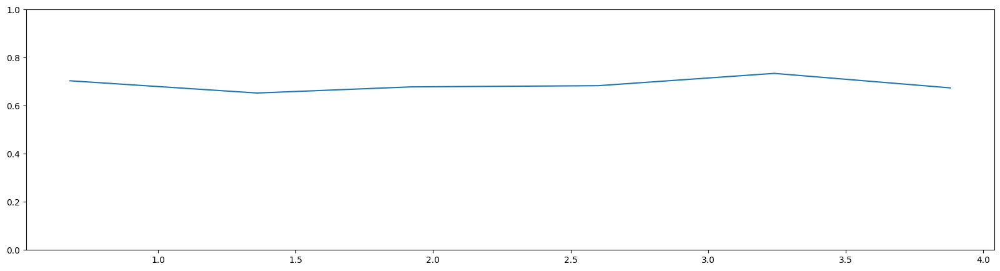

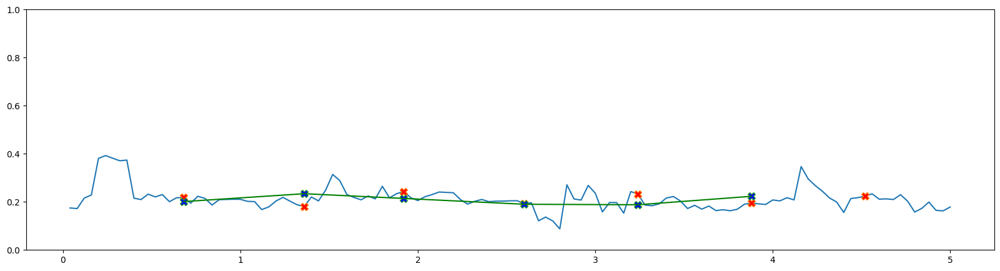

side left harshi left 3 (6, 29)
         ubh     t    center     r_sdr     l_sdr        sl        al  \
0   0.188389  0.04 -0.009770  0.798671  0.771333  0.027386  0.095449   
1   0.186067  0.08 -0.016020  0.800264  0.771335  0.029537  0.096630   
2   0.188024  0.12 -0.015302  0.794012  0.767422  0.027312  0.095235   
3   0.188553  0.16 -0.011696  0.784845  0.763210  0.023115  0.086228   
4   0.188403  0.20 -0.010663  0.777326  0.759037  0.019854  0.086232   
..       ...   ...       ...       ...       ...       ...       ...   
78  0.179133  3.16 -0.009594  0.252997  0.223731  0.031122  0.074611   
79  0.176174  3.20 -0.009272  0.251005  0.219688  0.032987  0.055032   
80  0.174407  3.24 -0.009793  0.246938  0.211740  0.036842  0.060943   
81  0.174264  3.28 -0.012130  0.243349  0.208201  0.036790  0.066776   
82  0.175231  3.32 -0.013924  0.237470  0.201044  0.038353  0.079179   

         sln       aln  
0   0.145368  0.506657  
1   0.158745  0.519332  
2   0.145258  0.506502  
3  

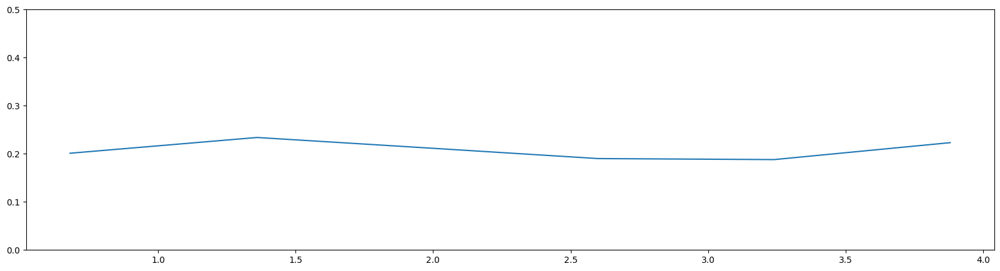

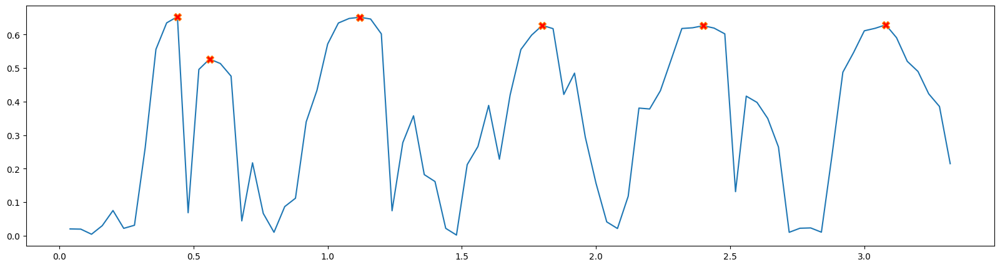

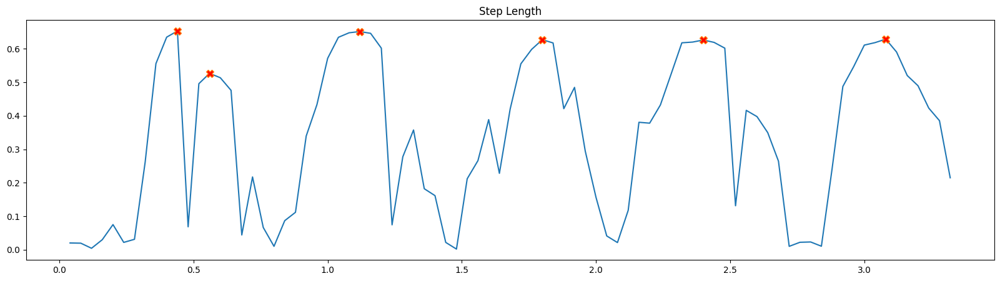

[10 13 27 44 59 76]
       lbl_r     lbl_l    center  leg_ratio     t  velocity  visi_lbl_r  \
0   1.286947  1.382930 -0.009770   0.875051  0.04 -0.258158    0.095486   
1   1.232114  1.400248 -0.016020   0.851831  0.08 -0.058515    0.091681   
2   1.208725  1.381614 -0.015302   0.901676  0.12  0.077331    0.091661   
3   1.277668  1.338642 -0.011696   0.981087  0.16  0.076223    0.117600   
4   1.299488  1.335428 -0.010663   1.015930  0.20 -0.028367    0.148319   
..       ...       ...       ...        ...   ...       ...         ...   
78  1.291201  1.276013 -0.009594   0.954321  3.16  0.152349    0.719260   
79  1.316893  1.294514 -0.009272   0.911684  3.20 -0.046325    0.728931   
80  1.341304  1.262756 -0.009793   0.956651  3.24 -0.012764    0.721163   
81  1.342797  1.252063 -0.012130   0.985226  3.28 -0.095021    0.721519   
82  1.340905  1.220355 -0.013924   1.079005  3.32  0.082964    0.710749   

    visi_lbl_l  
0     0.860809  
1     0.860615  
2     0.857068  
3     0.862

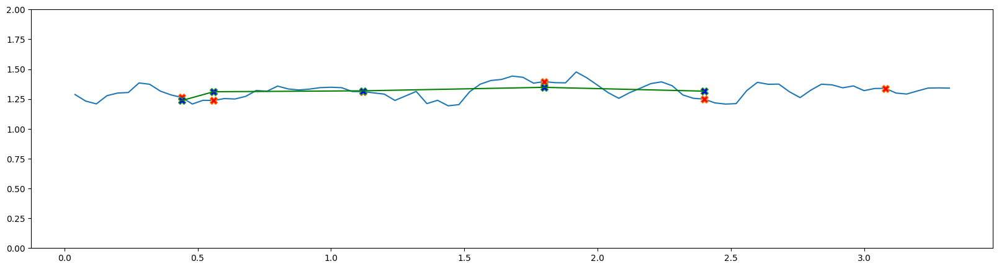

    upper_arm_r  upper_arm_l         c     t  velocity  visi_l_urm_r  \
0      0.506657     0.524564 -0.009770  0.04 -0.258158      0.061806   
1      0.519332     0.532216 -0.016020  0.08 -0.058515      0.066894   
2      0.506502     0.535182 -0.015302  0.12  0.077331      0.066157   
3      0.457312     0.529657 -0.011696  0.16  0.076223      0.063238   
4      0.457698     0.514175 -0.010663  0.20 -0.028367      0.061584   
..          ...          ...       ...   ...       ...           ...   
78     0.416512     0.521971 -0.009594  3.16  0.152349      0.090489   
79     0.312376     0.524095 -0.009272  3.20 -0.046325      0.084627   
80     0.349429     0.529787 -0.009793  3.24 -0.012764      0.081545   
81     0.383190     0.536635 -0.012130  3.28 -0.095021      0.078425   
82     0.451856     0.535719 -0.013924  3.32  0.082964      0.103553   

    visi_l_urm_l  
0       0.993014  
1       0.993204  
2       0.993420  
3       0.993582  
4       0.994070  
..           ...  
78

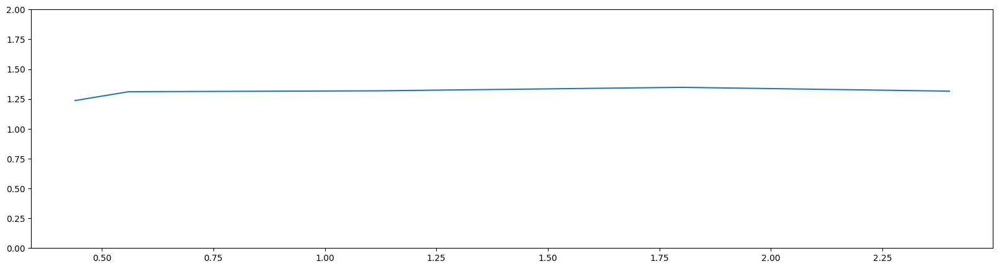

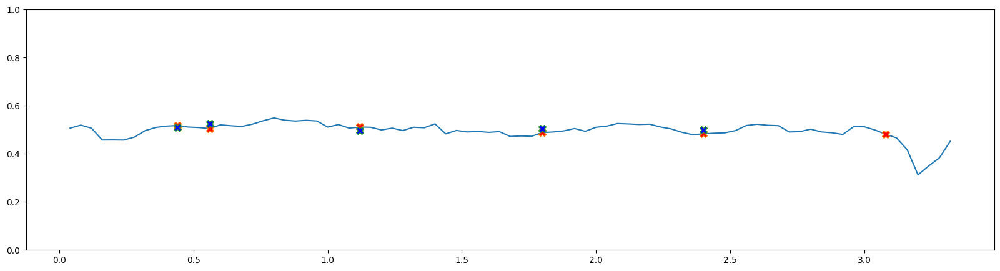

           r         l         c     t  velocity  visi_larm_r  visi_larm_l
0   0.420443  0.477893 -0.009770  0.04 -0.258158     0.004248     0.965379
1   0.437712  0.496954 -0.016020  0.08 -0.058515     0.005001     0.966473
2   0.413808  0.485175 -0.015302  0.12  0.077331     0.004717     0.966696
3   0.358339  0.482746 -0.011696  0.16  0.076223     0.004231     0.967050
4   0.380463  0.498879 -0.010663  0.20 -0.028367     0.004049     0.969508
..       ...       ...       ...   ...       ...          ...          ...
78  0.173973  0.456262 -0.009594  3.16  0.152349     0.010159     0.989310
79  0.163999  0.470817 -0.009272  3.20 -0.046325     0.009385     0.990127
80  0.162817  0.474559 -0.009793  3.24 -0.012764     0.009452     0.990643
81  0.168307  0.472186 -0.012130  3.28 -0.095021     0.009015     0.990928
82  0.371438  0.467955 -0.013924  3.32  0.082964     0.014758     0.990631

[83 rows x 7 columns]
t1 0.44
t1 0.56
t1 1.12
t1 1.8
t1 2.4
results [0.42320130919438115, 0.3970462

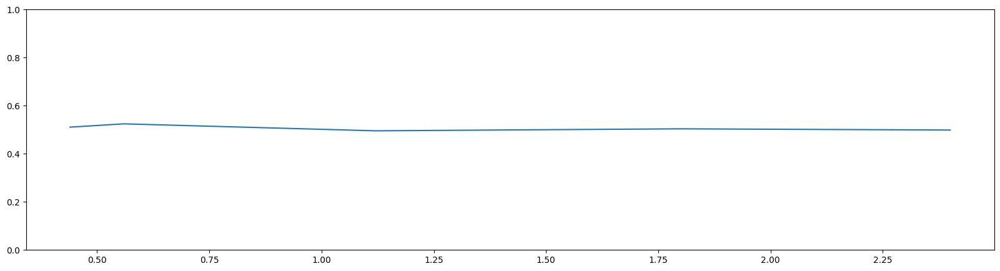

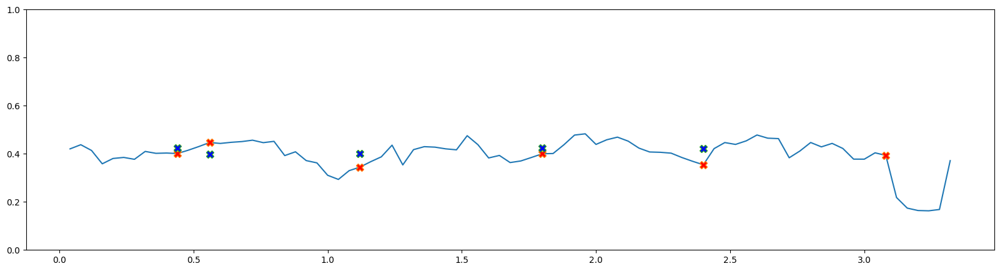

           r         l         c     t  velocity  visi_l_r  visi_l_l
0   0.296069  0.317057 -0.009770  0.04 -0.258158  0.000001  0.878192
1   0.308026  0.319337 -0.016020  0.08 -0.058515  0.000002  0.881898
2   0.275273  0.307756 -0.015302  0.12  0.077331  0.000002  0.882119
3   0.248455  0.308951 -0.011696  0.16  0.076223  0.000001  0.882869
4   0.261136  0.308515 -0.010663  0.20 -0.028367  0.000001  0.890863
..       ...       ...       ...   ...       ...       ...       ...
78  0.195968  0.301262 -0.009594  3.16  0.152349  0.000011  0.959898
79  0.145120  0.308702 -0.009272  3.20 -0.046325  0.000010  0.962869
80  0.146811  0.305365 -0.009793  3.24 -0.012764  0.000011  0.964816
81  0.152610  0.303633 -0.012130  3.28 -0.095021  0.000010  0.965873
82  0.325229  0.301497 -0.013924  3.32  0.082964  0.000031  0.964699

[83 rows x 7 columns]
t1 0.44
t1 0.56
t1 1.12
t1 1.8
t1 2.4
results [0.30652067326004745, 0.29554368664617564, 0.30674324100650674, 0.2788964973189211, 0.28300279315187327

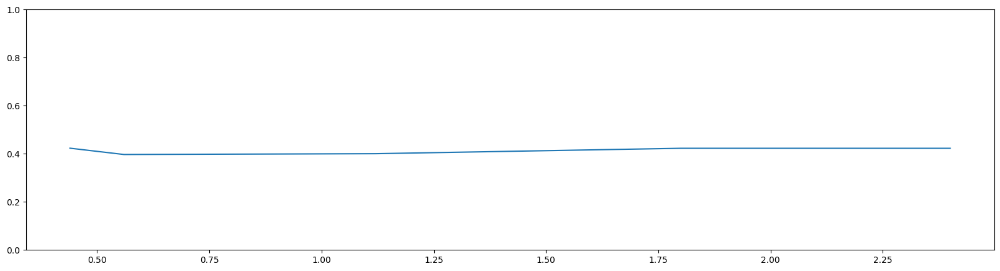

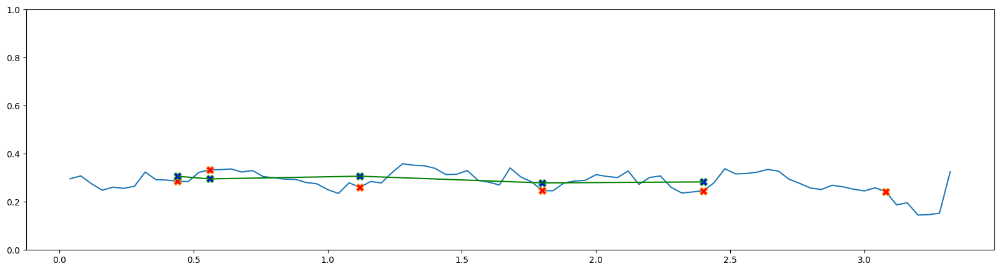

           r         l  leg_ratio         c     t  velocity  visi_thigh_r  \
0   0.590905  0.675281   0.983597 -0.009770  0.04 -0.258158      0.427808   
1   0.603605  0.708598   0.908710 -0.016020  0.08 -0.058515      0.421207   
2   0.611137  0.677779   0.849045 -0.015302  0.12  0.077331      0.420818   
3   0.610489  0.622258   0.931314 -0.011696  0.16  0.076223      0.459465   
4   0.615232  0.605585   0.937539 -0.010663  0.20 -0.028367      0.499610   
..       ...       ...        ...       ...   ...       ...           ...   
78  0.610821  0.640058   1.069857 -0.009594  3.16  0.152349      0.871878   
79  0.605643  0.664313   1.128607 -0.009272  3.20 -0.046325      0.876095   
80  0.622386  0.650589   1.174381 -0.009793  3.24 -0.012764      0.870751   
81  0.626399  0.635792   1.162471 -0.012130  3.28 -0.095021      0.870051   
82  0.638789  0.592017   1.117417 -0.013924  3.32  0.082964      0.862308   

    visi_thigh_l  
0       0.946396  
1       0.946281  
2       0.944925  

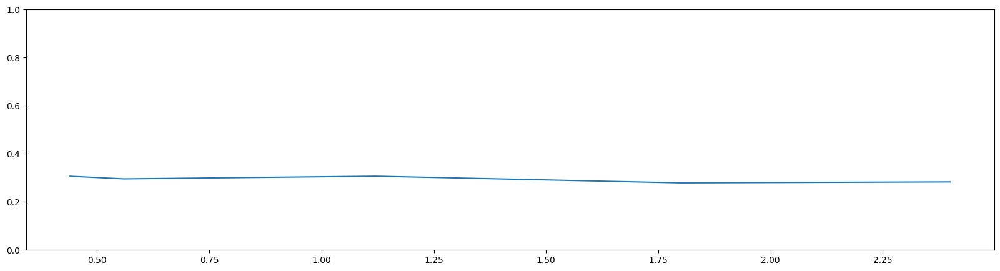

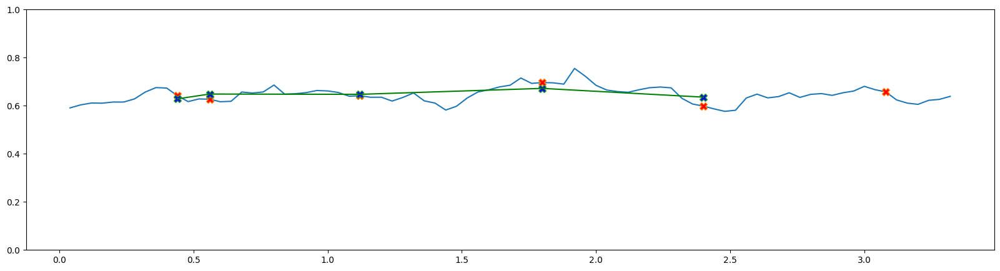

           r         l  leg_ratio         c     t  velocity  visi_shk_r  \
0   0.696041  0.707649   0.875051 -0.009770  0.04 -0.258158    0.223199   
1   0.628509  0.691650   0.851831 -0.016020  0.08 -0.058515    0.217662   
2   0.597588  0.703836   0.901676 -0.015302  0.12  0.077331    0.217815   
3   0.667179  0.716385   0.981087 -0.011696  0.16  0.076223    0.255950   
4   0.684256  0.729843   1.015930 -0.010663  0.20 -0.028367    0.296870   
..       ...       ...        ...       ...   ...       ...         ...   
78  0.680380  0.635955   0.954321 -0.009594  3.16  0.152349    0.824955   
79  0.711249  0.630201   0.911684 -0.009272  3.20 -0.046325    0.832023   
80  0.718918  0.612168   0.956651 -0.009793  3.24 -0.012764    0.828208   
81  0.716398  0.616271   0.985226 -0.012130  3.28 -0.095021    0.829283   
82  0.702116  0.628338   1.079005 -0.013924  3.32  0.082964    0.824240   

    visi_shk_l  
0     0.909565  
1     0.909471  
2     0.907022  
3     0.911059  
4     0.914815

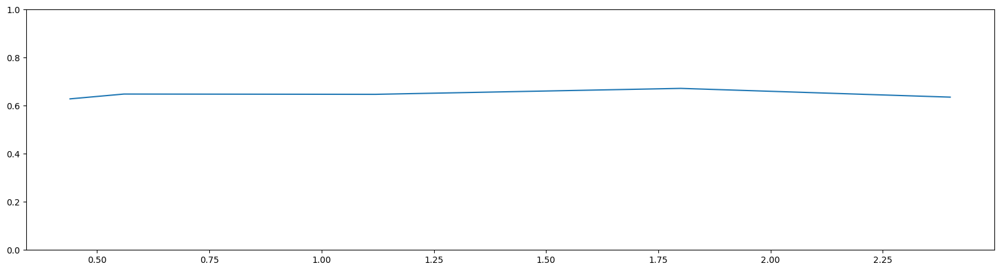

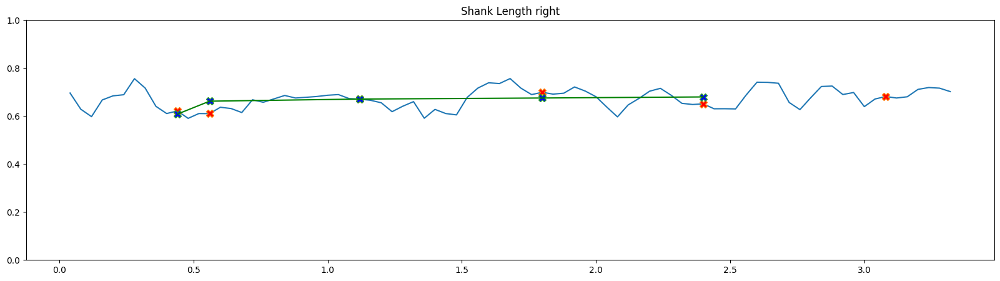

      foot_r    foot_l  leg_ratio         c     t  velocity  visi_foot_r  \
0   0.231282  0.223228   0.875051 -0.009770  0.04 -0.258158     0.345751   
1   0.194506  0.226810   0.851831 -0.016020  0.08 -0.058515     0.346645   
2   0.186021  0.228990   0.901676 -0.015302  0.12  0.077331     0.351502   
3   0.210387  0.223798   0.981087 -0.011696  0.16  0.076223     0.389133   
4   0.267603  0.192585   1.015930 -0.010663  0.20 -0.028367     0.426281   
..       ...       ...        ...       ...   ...       ...          ...   
78  0.142634  0.251074   0.954321 -0.009594  3.16  0.152349     0.868388   
79  0.172507  0.279929   0.911684 -0.009272  3.20 -0.046325     0.874637   
80  0.189661  0.361103   0.956651 -0.009793  3.24 -0.012764     0.876145   
81  0.172846  0.373887   0.985226 -0.012130  3.28 -0.095021     0.879486   
82  0.160637  0.317636   1.079005 -0.013924  3.32  0.082964     0.885922   

    visi_foot_l  
0      0.884580  
1      0.883472  
2      0.882133  
3      0.888278

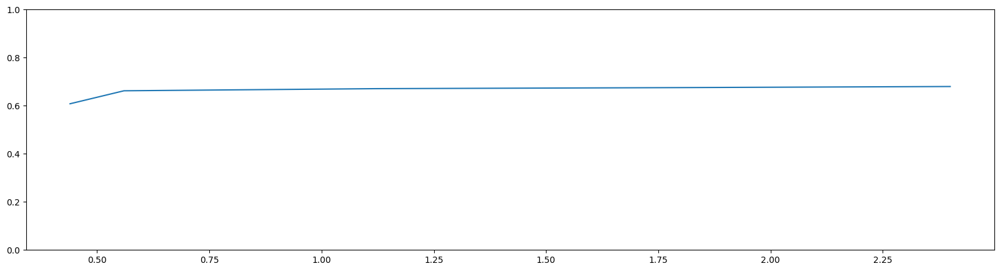

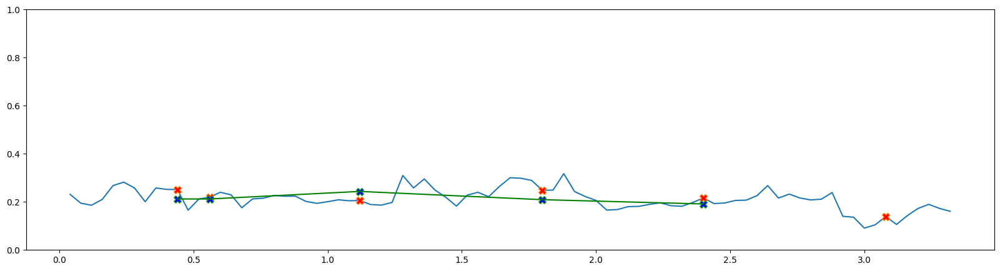

side left hasitha left 3 (5, 29)
         ubh     t    center     r_sdr     l_sdr        sl        al  \
0   0.190193  0.04 -0.037149  0.815929  0.827713  0.012117  0.096382   
1   0.190449  0.08 -0.035681  0.799167  0.814905  0.015835  0.093789   
2   0.190687  0.12 -0.037181  0.797335  0.812133  0.015271  0.091973   
3   0.188485  0.16 -0.038212  0.787715  0.803157  0.016709  0.091850   
4   0.184184  0.20 -0.036450  0.781140  0.796553  0.017274  0.090607   
..       ...   ...       ...       ...       ...       ...       ...   
94  0.167816  3.80 -0.020342  0.162183  0.124795  0.039616  0.089034   
95  0.168346  3.84 -0.021304  0.159571  0.125818  0.035912  0.088778   
96  0.170253  3.88 -0.023675  0.147289  0.115861  0.032935  0.091197   
97  0.172970  3.92 -0.021334  0.145517  0.114926  0.031629  0.092599   
98  0.174730  3.96 -0.022103  0.137659  0.108718  0.029385  0.093863   

         sln       aln  
0   0.063709  0.506760  
1   0.083144  0.492462  
2   0.080082  0.482324  
3 

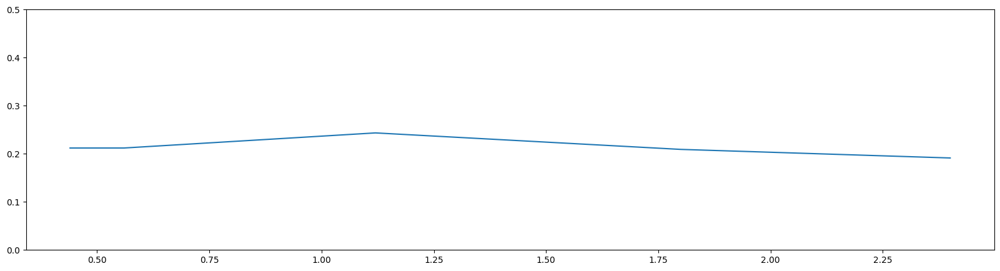

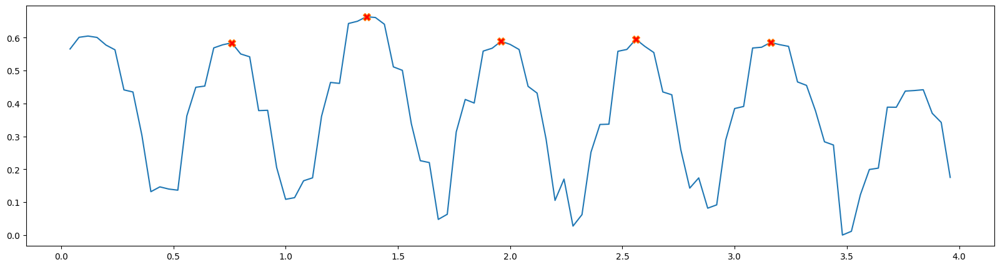

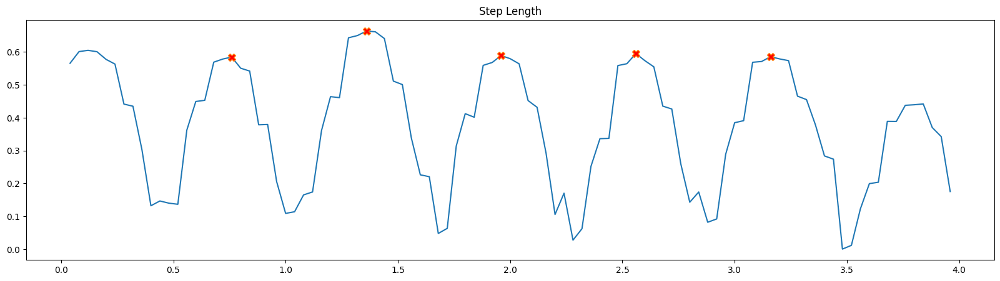

[18 33 48 63 78]
       lbl_r     lbl_l    center  leg_ratio     t  velocity  visi_lbl_r  \
0   1.186517  1.329207 -0.037149   0.955154  0.04  0.091522    0.715037   
1   1.216003  1.309560 -0.035681   0.971484  0.08 -0.011134    0.709261   
2   1.223881  1.292548 -0.037181   0.979065  0.12 -0.049392    0.714832   
3   1.258796  1.321455 -0.038212   0.966282  0.16  0.014014    0.706664   
4   1.315714  1.337930 -0.036450   0.974199  0.20  0.050386    0.702715   
..       ...       ...       ...        ...   ...       ...         ...   
94  1.339483  1.472003 -0.020342   0.903333  3.80 -0.112904    0.524228   
95  1.344566  1.462247 -0.021304   0.897854  3.84 -0.022933    0.543791   
96  1.339115  1.390094 -0.023675   0.913794  3.88 -0.031192    0.512805   
97  1.314753  1.333298 -0.021334   0.919348  3.92  0.116633    0.499409   
98  1.280582  1.190992 -0.022103   1.031282  3.96 -0.317424    0.488391   

    visi_lbl_l  
0     0.986085  
1     0.985015  
2     0.985307  
3     0.984986

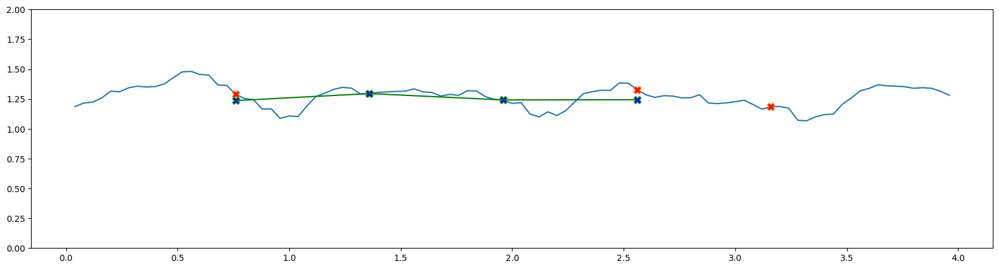

    upper_arm_r  upper_arm_l         c     t  velocity  visi_l_urm_r  \
0      0.506760     0.531885 -0.037149  0.04  0.091522      0.080972   
1      0.492462     0.532964 -0.035681  0.08 -0.011134      0.079683   
2      0.482324     0.530099 -0.037181  0.12 -0.049392      0.080591   
3      0.487309     0.532306 -0.038212  0.16  0.014014      0.082615   
4      0.491936     0.542095 -0.036450  0.20  0.050386      0.084158   
..          ...          ...       ...   ...       ...           ...   
94     0.530545     0.564332 -0.020342  3.80 -0.112904      0.554891   
95     0.527352     0.563886 -0.021304  3.84 -0.022933      0.560900   
96     0.535656     0.553309 -0.023675  3.88 -0.031192      0.564464   
97     0.535347     0.543192 -0.021334  3.92  0.116633      0.541390   
98     0.537187     0.529330 -0.022103  3.96 -0.317424      0.517989   

    visi_l_urm_l  
0       0.997108  
1       0.997143  
2       0.997285  
3       0.997478  
4       0.997615  
..           ...  
94

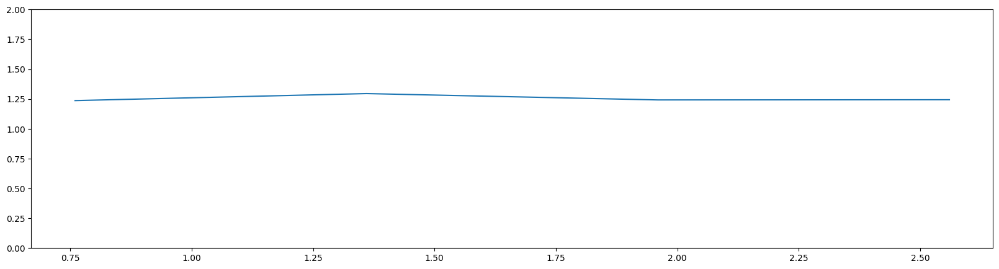

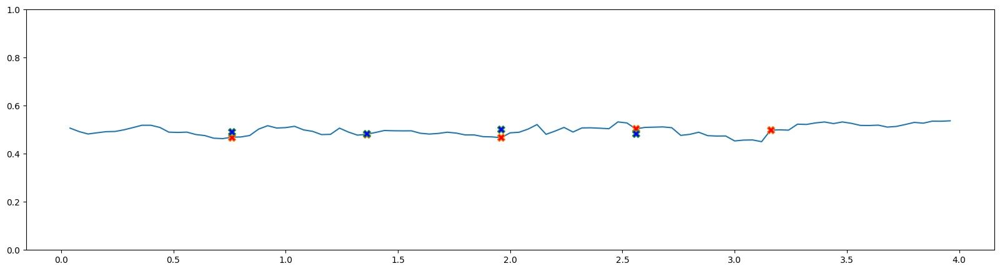

           r         l         c     t  velocity  visi_larm_r  visi_larm_l
0   0.419421  0.450782 -0.037149  0.04  0.091522     0.011678     0.983746
1   0.420854  0.467572 -0.035681  0.08 -0.011134     0.011360     0.984169
2   0.419486  0.468106 -0.037181  0.12 -0.049392     0.011602     0.985097
3   0.430240  0.488516 -0.038212  0.16  0.014014     0.012093     0.986215
4   0.458557  0.510667 -0.036450  0.20  0.050386     0.012622     0.987125
..       ...       ...       ...   ...       ...          ...          ...
94  0.433412  0.515364 -0.020342  3.80 -0.112904     0.298513     0.986552
95  0.438262  0.529779 -0.021304  3.84 -0.022933     0.307449     0.986902
96  0.450254  0.536862 -0.023675  3.88 -0.031192     0.315743     0.985157
97  0.441662  0.551337 -0.021334  3.92  0.116633     0.291722     0.983631
98  0.444475  0.542435 -0.022103  3.96 -0.317424     0.275580     0.981620

[99 rows x 7 columns]
t1 0.76
t1 1.36
t1 1.96
t1 2.56
results [0.3914130207073779, 0.35227857303469

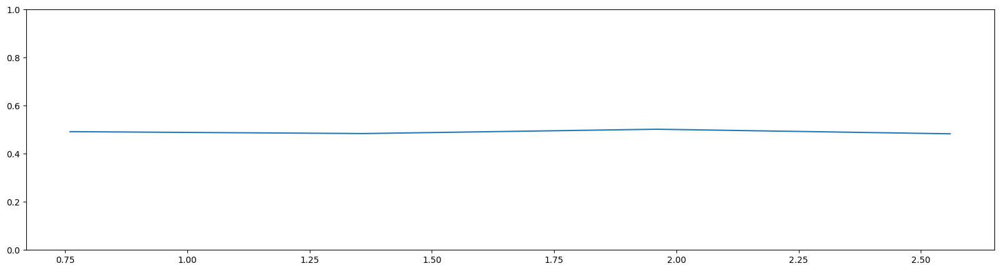

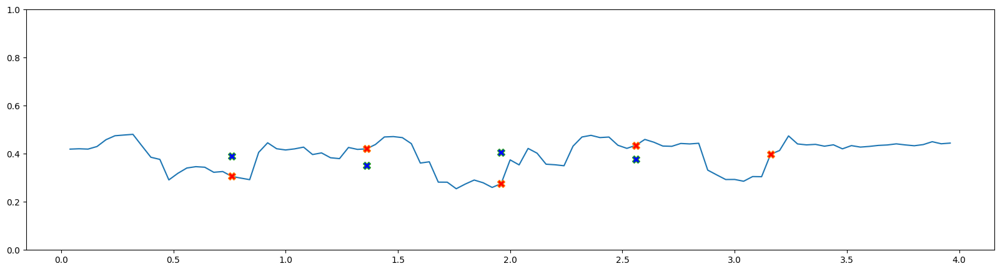

           r         l         c     t  velocity  visi_l_r  visi_l_l
0   0.300550  0.294794 -0.037149  0.04  0.091522  0.000020  0.937385
1   0.302287  0.310842 -0.035681  0.08 -0.011134  0.000019  0.939097
2   0.306427  0.318346 -0.037181  0.12 -0.049392  0.000020  0.942529
3   0.318423  0.334878 -0.038212  0.16  0.014014  0.000022  0.946620
4   0.335032  0.347443 -0.036450  0.20  0.050386  0.000024  0.950005
..       ...       ...       ...   ...       ...       ...       ...
94  0.276894  0.314708 -0.020342  3.80 -0.112904  0.041563  0.949446
95  0.275171  0.319612 -0.021304  3.84 -0.022933  0.044651  0.950276
96  0.280454  0.320508 -0.023675  3.88 -0.031192  0.048082  0.944137
97  0.335142  0.317105 -0.021334  3.92  0.116633  0.039472  0.938501
98  0.354185  0.325135 -0.022103  3.96 -0.317424  0.035000  0.932985

[99 rows x 7 columns]
t1 0.76
t1 1.36
t1 1.96
t1 2.56
results [0.28733893036665625, 0.2640350122693686, 0.28762989782241244, 0.27952903438056603]
t1 0.76
t1 1.36
t1 1.96
t

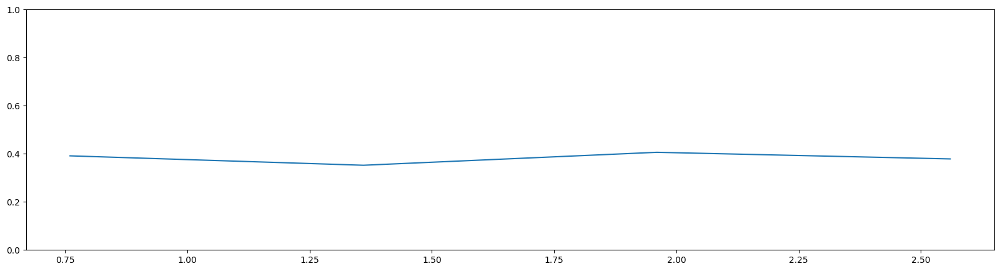

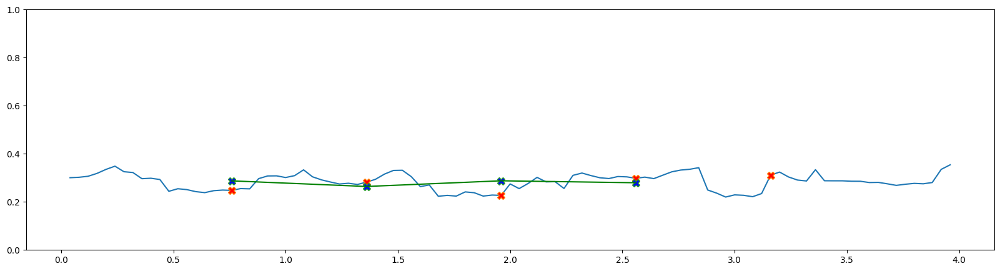

           r         l  leg_ratio         c     t  velocity  visi_thigh_r  \
0   0.598158  0.626242   0.836969 -0.037149  0.04  0.091522      0.869248   
1   0.606337  0.624135   0.889471 -0.035681  0.08 -0.011134      0.866652   
2   0.605701  0.618653   0.917323 -0.037181  0.12 -0.049392      0.869363   
3   0.621789  0.643486   0.939581 -0.038212  0.16  0.014014      0.865174   
4   0.656732  0.674125   0.992735 -0.036450  0.20  0.050386      0.863051   
..       ...       ...        ...       ...   ...       ...           ...   
94  0.667579  0.739018   0.916668 -0.020342  3.80 -0.112904      0.770727   
95  0.659473  0.734499   0.941388 -0.021304  3.84 -0.022933      0.781764   
96  0.661745  0.724173   1.017194 -0.023675  3.88 -0.031192      0.762841   
97  0.647323  0.704111   1.060783 -0.021334  3.92  0.116633      0.754382   
98  0.638844  0.619466   1.122850 -0.022103  3.96 -0.317424      0.743787   

    visi_thigh_l  
0       0.994672  
1       0.994275  
2       0.994384  

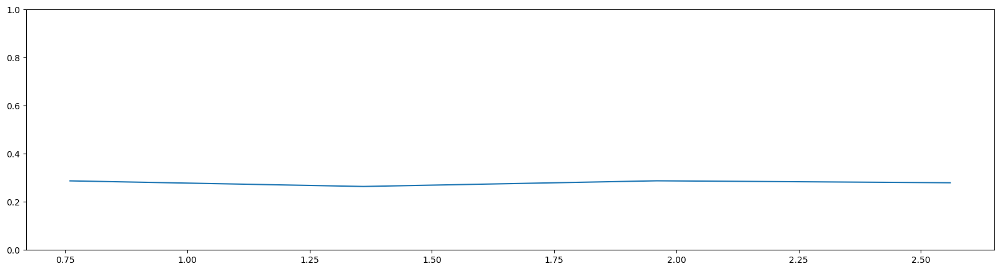

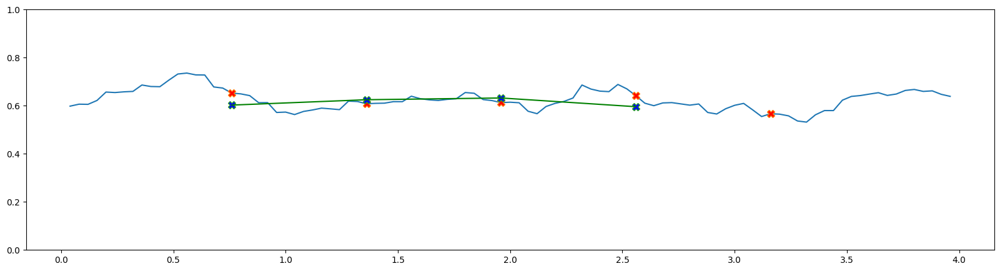

           r         l  leg_ratio         c     t  velocity  visi_shk_r  \
0   0.588360  0.702964   0.955154 -0.037149  0.04  0.091522    0.822592   
1   0.609666  0.685425   0.971484 -0.035681  0.08 -0.011134    0.818392   
2   0.618179  0.673895   0.979065 -0.037181  0.12 -0.049392    0.822248   
3   0.637007  0.677969   0.966282 -0.038212  0.16  0.014014    0.816788   
4   0.658982  0.663805   0.974199 -0.036450  0.20  0.050386    0.814222   
..       ...       ...        ...       ...   ...       ...         ...   
94  0.671904  0.732985   0.903333 -0.020342  3.80 -0.112904    0.680174   
95  0.685093  0.727748   0.897854 -0.021304  3.84 -0.022933    0.695594   
96  0.677370  0.665920   0.913794 -0.023675  3.88 -0.031192    0.672231   
97  0.667430  0.629186   0.919348 -0.021334  3.92  0.116633    0.662011   
98  0.641738  0.571526   1.031282 -0.022103  3.96 -0.317424    0.656628   

    visi_shk_l  
0     0.991367  
1     0.990686  
2     0.990872  
3     0.990695  
4     0.990713

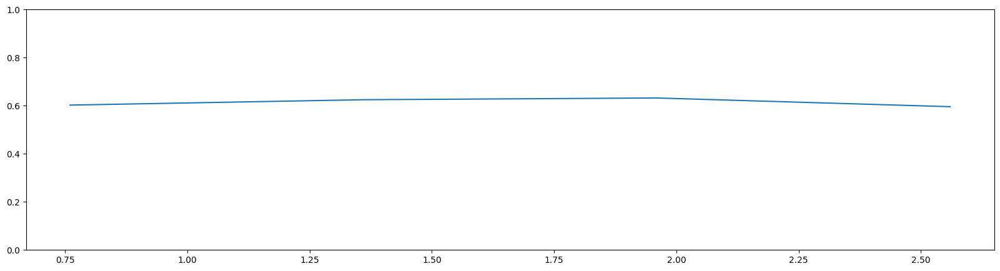

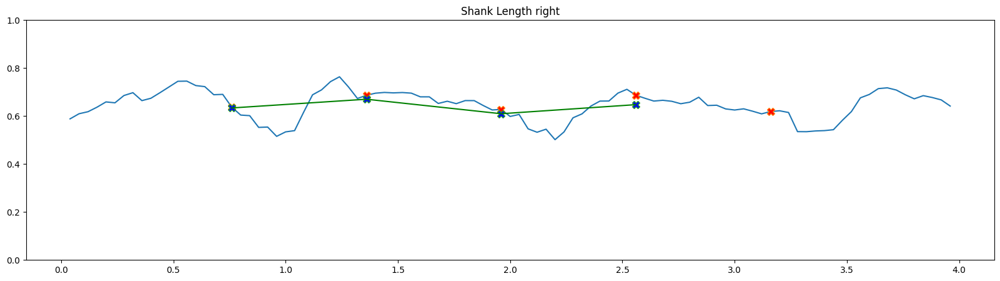

      foot_r    foot_l  leg_ratio         c     t  velocity  visi_foot_r  \
0   0.207967  0.247183   0.955154 -0.037149  0.04  0.091522     0.846237   
1   0.227018  0.233714   0.971484 -0.035681  0.08 -0.011134     0.839775   
2   0.222740  0.223155   0.979065 -0.037181  0.12 -0.049392     0.842144   
3   0.221022  0.226709   0.966282 -0.038212  0.16  0.014014     0.838660   
4   0.225507  0.263348   0.974199 -0.036450  0.20  0.050386     0.837266   
..       ...       ...        ...       ...   ...       ...          ...   
94  0.207378  0.263284   0.903333 -0.020342  3.80 -0.112904     0.795581   
95  0.199408  0.272783   0.897854 -0.021304  3.84 -0.022933     0.804582   
96  0.189245  0.292956   0.913794 -0.023675  3.88 -0.031192     0.790646   
97  0.173307  0.308972   0.919348 -0.021334  3.92  0.116633     0.783842   
98  0.189641  0.303226   1.031282 -0.022103  3.96 -0.317424     0.793220   

    visi_foot_l  
0      0.966625  
1      0.964186  
2      0.964268  
3      0.963354

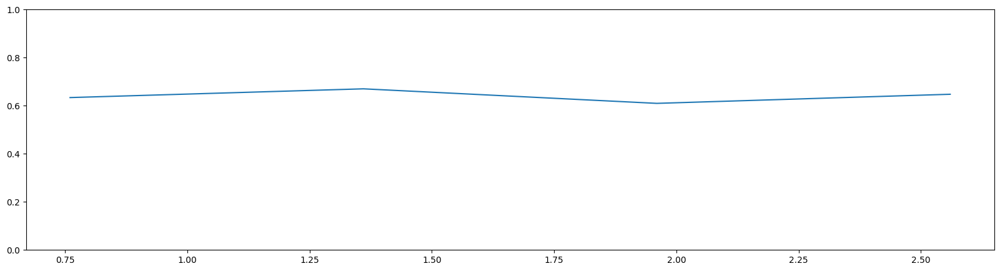

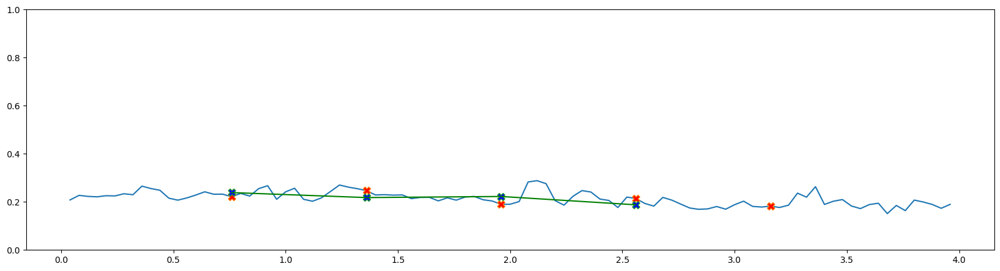

side left jayasanka left 3 (4, 29)
         ubh     t    center     r_sdr     l_sdr        sl        al  \
0   0.069991  0.16  0.009978  0.746624  0.751280  0.010653  0.032850   
1   0.067747  0.20  0.018812  0.730796  0.741433  0.011084  0.019760   
2   0.067279  0.24  0.033169  0.717636  0.734685  0.018731  0.021762   
3   0.066656  0.28  0.031630  0.715789  0.734075  0.020692  0.023126   
4   0.069727  0.32  0.030436  0.719563  0.722835  0.005700  0.029065   
..       ...   ...       ...       ...       ...       ...       ...   
94  0.157164  3.96 -0.017424  0.168670  0.141045  0.028217  0.094668   
95  0.158408  4.00 -0.014838  0.166190  0.133803  0.032464  0.094317   
96  0.158297  4.04 -0.012088  0.163585  0.128937  0.034651  0.094499   
97  0.157302  4.08 -0.008035  0.159815  0.124133  0.035694  0.085246   
98  0.156922  4.12 -0.004867  0.153438  0.120290  0.033153  0.087476   

         sln       aln  
0   0.152198  0.469341  
1   0.163611  0.291680  
2   0.278399  0.323464  


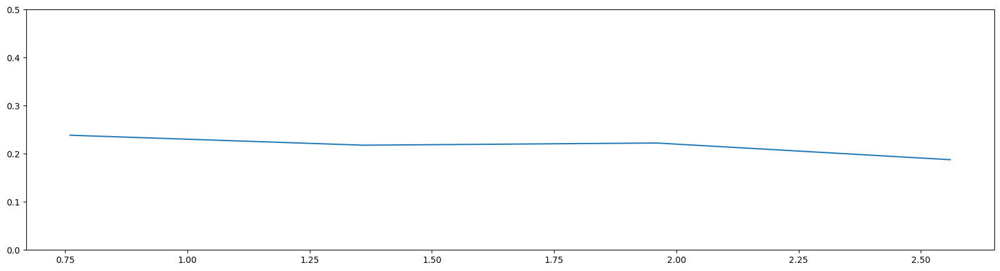

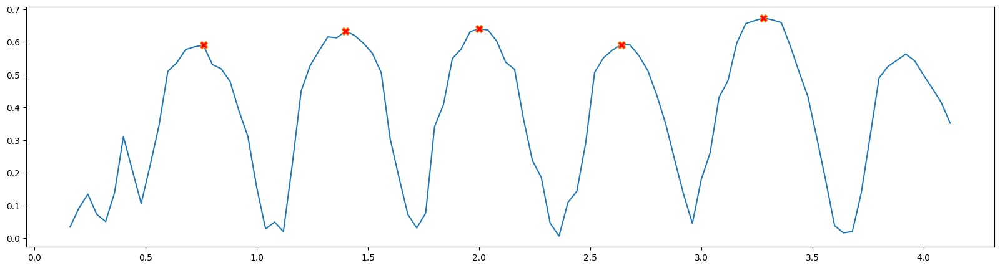

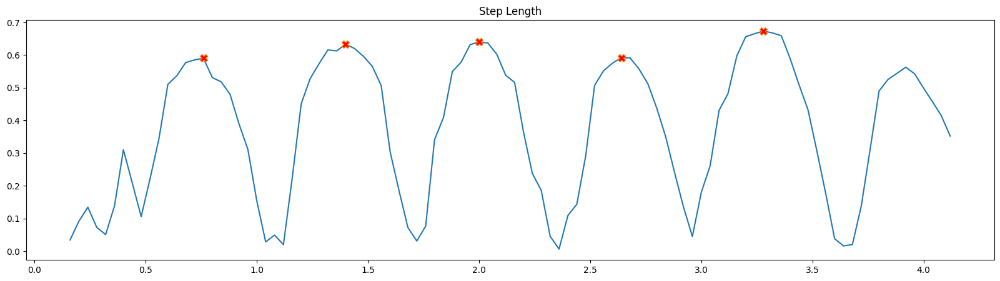

[14 30 45 61 77]
       lbl_r     lbl_l    center  leg_ratio     t  velocity  visi_lbl_r  \
0   1.533268  1.601461  0.009978   1.005121  0.16 -0.192530    0.016940   
1   1.489009  1.431506  0.018812   1.512719  0.20  0.434642    0.016618   
2   1.535080  1.725702  0.033169   0.779467  0.24  0.193267    0.016847   
3   1.615229  1.957473  0.031630   0.821104  0.28 -0.226192    0.017593   
4   1.569263  1.885964  0.030436   0.937698  0.32  0.386881    0.022168   
..       ...       ...       ...        ...   ...       ...         ...   
94  1.398360  1.470139 -0.017424   0.939209  3.96 -0.063075    0.565408   
95  1.391094  1.419761 -0.014838   0.955114  4.00  0.106539    0.580739   
96  1.403102  1.394257 -0.012088   0.959521  4.04  0.062975    0.588580   
97  1.443793  1.392604 -0.008035   0.977267  4.08  0.131270    0.579297   
98  1.468351  1.342781 -0.004867   1.013552  4.12 -0.046435    0.575630   

    visi_lbl_l  
0     0.193365  
1     0.195809  
2     0.190829  
3     0.203946

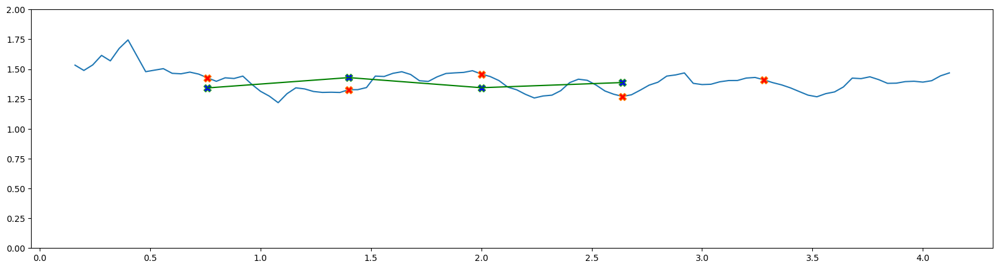

    upper_arm_r  upper_arm_l         c     t  velocity  visi_l_urm_r  \
0      0.469341     0.237884  0.009978  0.16 -0.192530      0.139711   
1      0.291680     0.494361  0.018812  0.20  0.434642      0.129757   
2      0.323464     0.589120  0.033169  0.24  0.193267      0.126378   
3      0.346939     0.555165  0.031630  0.28 -0.226192      0.119833   
4      0.416848     0.521703  0.030436  0.32  0.386881      0.111848   
..          ...          ...       ...   ...       ...           ...   
94     0.602352     0.553933 -0.017424  3.96 -0.063075      0.247823   
95     0.595408     0.544272 -0.014838  4.00  0.106539      0.261466   
96     0.596974     0.544791 -0.012088  4.04  0.062975      0.270985   
97     0.541928     0.546009 -0.008035  4.08  0.131270      0.260226   
98     0.557453     0.541897 -0.004867  4.12 -0.046435      0.255623   

    visi_l_urm_l  
0       0.768254  
1       0.732927  
2       0.683205  
3       0.660248  
4       0.649087  
..           ...  
94

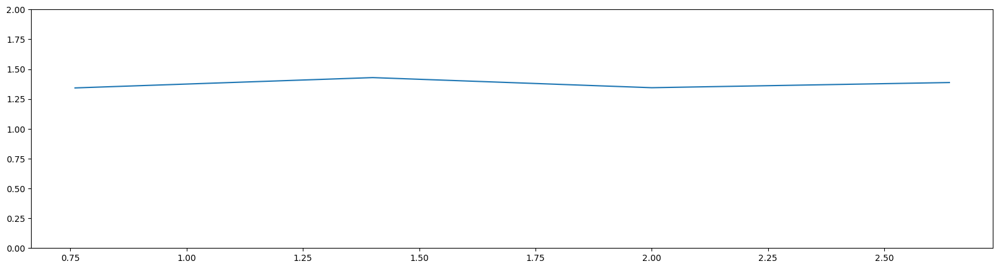

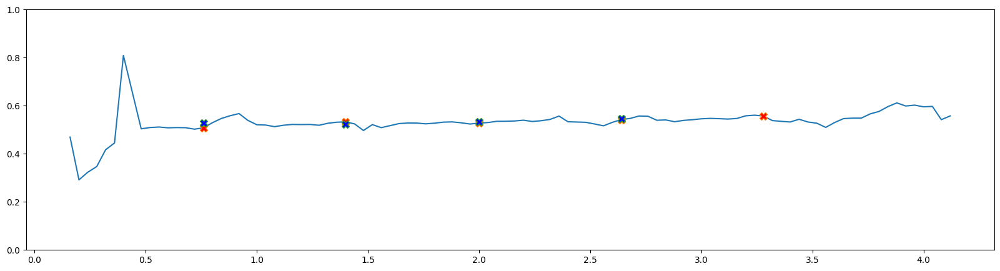

           r         l         c     t  velocity  visi_larm_r  visi_larm_l
0   0.136302  0.205059  0.009978  0.16 -0.192530     0.010872     0.190623
1   0.197753  0.151568  0.018812  0.20  0.434642     0.009761     0.176033
2   0.281738  0.147870  0.033169  0.24  0.193267     0.010413     0.155206
3   0.215143  0.284530  0.031630  0.28 -0.226192     0.009770     0.151207
4   0.154174  0.248586  0.030436  0.32  0.386881     0.008652     0.139472
..       ...       ...       ...   ...       ...          ...          ...
94  0.453607  0.471473 -0.017424  3.96 -0.063075     0.049660     0.982668
95  0.459081  0.457699 -0.014838  4.00  0.106539     0.056125     0.982472
96  0.473324  0.451906 -0.012088  4.04  0.062975     0.060760     0.980458
97  0.391571  0.448443 -0.008035  4.08  0.131270     0.055200     0.973388
98  0.396851  0.448423 -0.004867  4.12 -0.046435     0.052780     0.959328

[99 rows x 7 columns]
t1 0.76
t1 1.4
t1 2.0
t1 2.64
results [0.38222729377855136, 0.405852174824553

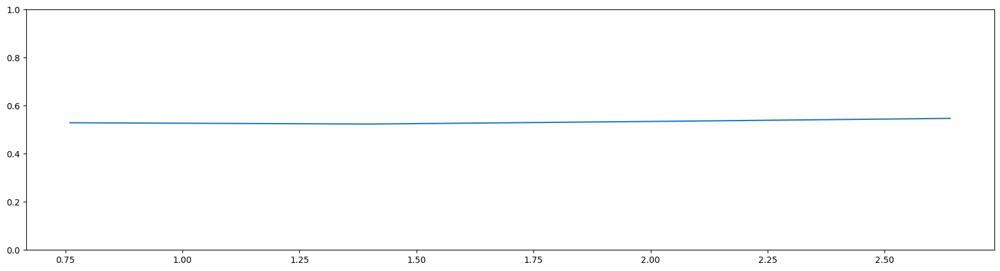

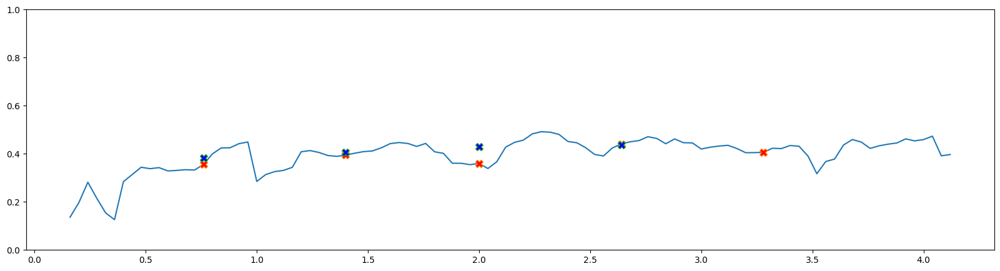

           r         l         c     t  velocity  visi_l_r  visi_l_l
0   0.093569  0.081971  0.009978  0.16 -0.192530  0.000012  0.006846
1   0.109178  0.103260  0.018812  0.20  0.434642  0.000009  0.005781
2   0.136378  0.110972  0.033169  0.24  0.193267  0.000011  0.004341
3   0.115505  0.161767  0.031630  0.28 -0.226192  0.000009  0.004297
4   0.106419  0.139055  0.030436  0.32  0.386881  0.000007  0.003480
..       ...       ...       ...   ...       ...       ...       ...
94  0.270243  0.289900 -0.017424  3.96 -0.063075  0.000413  0.934147
95  0.267394  0.293975 -0.014838  4.00  0.106539  0.000563  0.933251
96  0.270337  0.294686 -0.012088  4.04  0.062975  0.000691  0.926683
97  0.229423  0.289969 -0.008035  4.08  0.131270  0.000545  0.905204
98  0.236718  0.295846 -0.004867  4.12 -0.046435  0.000490  0.865217

[99 rows x 7 columns]
t1 0.76
t1 1.4
t1 2.0
t1 2.64
results [0.2776755436533847, 0.28789971386036484, 0.2821612975679465, 0.29843070792873627]
t1 0.76
t1 1.4
t1 2.0
t1 2.6

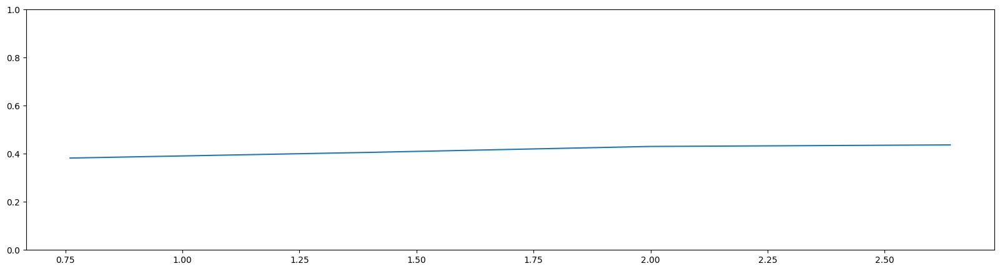

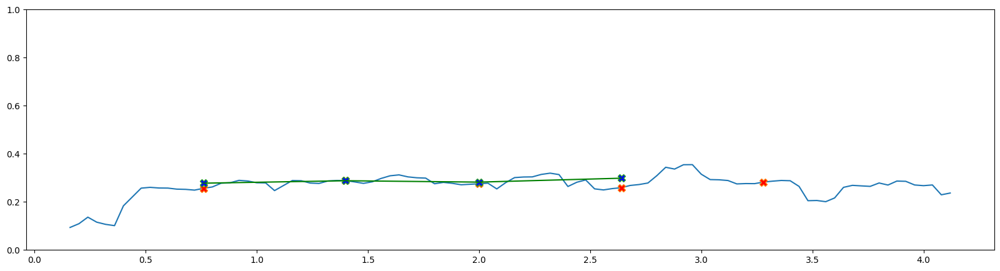

           r         l  leg_ratio         c     t  velocity  visi_thigh_r  \
0   0.753354  0.749516   0.915451  0.009978  0.16 -0.192530      0.251560   
1   0.672282  0.444419   0.827412  0.018812  0.20  0.434642      0.253387   
2   0.609852  0.782396   0.980836  0.033169  0.24  0.193267      0.259684   
3   0.668530  0.814184   0.828049  0.031630  0.28 -0.226192      0.268308   
4   0.619801  0.660982   0.775082  0.030436  0.32  0.386881      0.294741   
..       ...       ...        ...       ...   ...       ...           ...   
94  0.724670  0.771575   0.964392 -0.017424  3.96 -0.063075      0.790332   
95  0.712091  0.745556   1.007116 -0.014838  4.00  0.106539      0.798537   
96  0.715880  0.746080   1.060239 -0.012088  4.04  0.062975      0.802404   
97  0.730548  0.747542   1.105701 -0.008035  4.08  0.131270      0.795185   
98  0.740384  0.730485   1.188912 -0.004867  4.12 -0.046435      0.790440   

    visi_thigh_l  
0       0.634419  
1       0.640578  
2       0.638438  

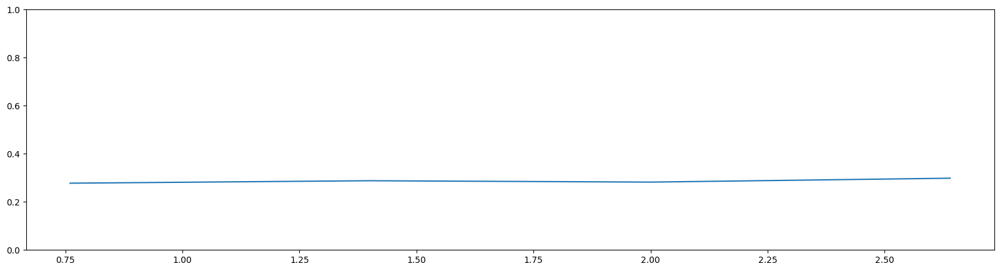

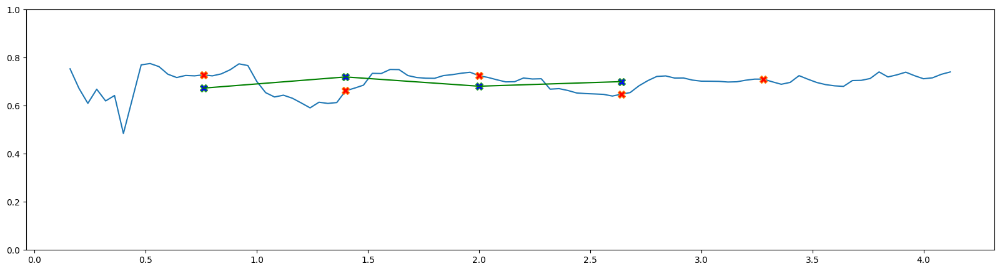

           r         l  leg_ratio         c     t  velocity  visi_shk_r  \
0   0.779914  0.851945   1.005121  0.009978  0.16 -0.192530    0.067340   
1   0.816727  0.987087   1.512719  0.018812  0.20  0.434642    0.065583   
2   0.925228  0.943306   0.779467  0.033169  0.24  0.193267    0.064875   
3   0.946699  1.143289   0.821104  0.031630  0.28 -0.226192    0.065571   
4   0.949462  1.224983   0.937698  0.030436  0.32  0.386881    0.075210   
..       ...       ...        ...       ...   ...       ...         ...   
94  0.673691  0.698565   0.939209 -0.017424  3.96 -0.063075    0.715406   
95  0.679003  0.674205   0.955114 -0.014838  4.00  0.106539    0.727255   
96  0.687223  0.648177   0.959521 -0.012088  4.04  0.062975    0.733521   
97  0.713246  0.645062   0.977267 -0.008035  4.08  0.131270    0.728506   
98  0.727966  0.612296   1.013552 -0.004867  4.12 -0.046435    0.728240   

    visi_shk_l  
0     0.304790  
1     0.305676  
2     0.298899  
3     0.312827  
4     0.345148

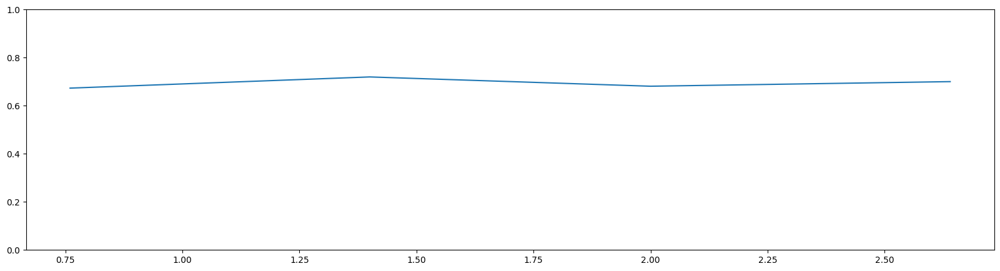

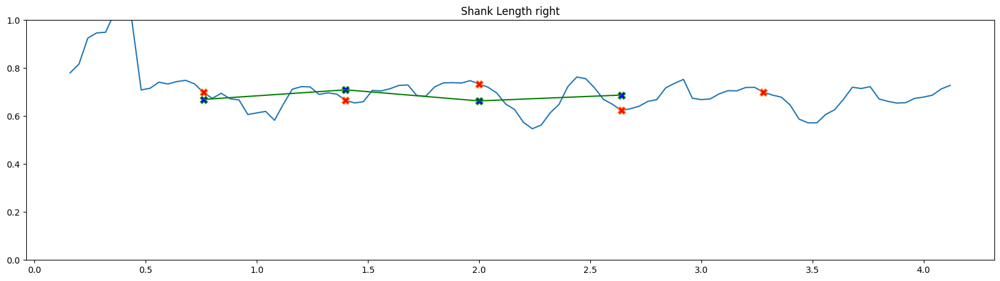

      foot_r    foot_l  leg_ratio         c     t  velocity  visi_foot_r  \
0   0.194711  0.176993   1.005121  0.009978  0.16 -0.192530     0.112802   
1   0.290076  0.251224   1.512719  0.018812  0.20  0.434642     0.102841   
2   0.313975  0.278563   0.779467  0.033169  0.24  0.193267     0.094113   
3   0.342641  0.367128   0.821104  0.031630  0.28 -0.226192     0.087748   
4   0.360328  0.313340   0.937698  0.030436  0.32  0.386881     0.096413   
..       ...       ...        ...       ...   ...       ...          ...   
94  0.165817  0.243554   0.939209 -0.017424  3.96 -0.063075     0.810804   
95  0.179345  0.267074   0.955114 -0.014838  4.00  0.106539     0.816313   
96  0.173892  0.306296   0.959521 -0.012088  4.04  0.062975     0.816079   
97  0.168618  0.348140   0.977267 -0.008035  4.08  0.131270     0.813643   
98  0.181380  0.370143   1.013552 -0.004867  4.12 -0.046435     0.820454   

    visi_foot_l  
0      0.353514  
1      0.339998  
2      0.307385  
3      0.294848

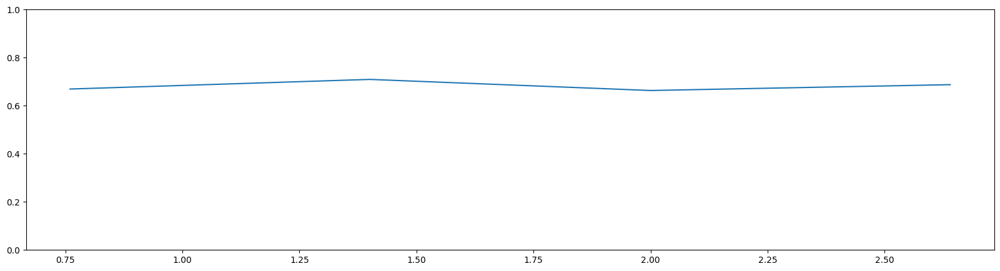

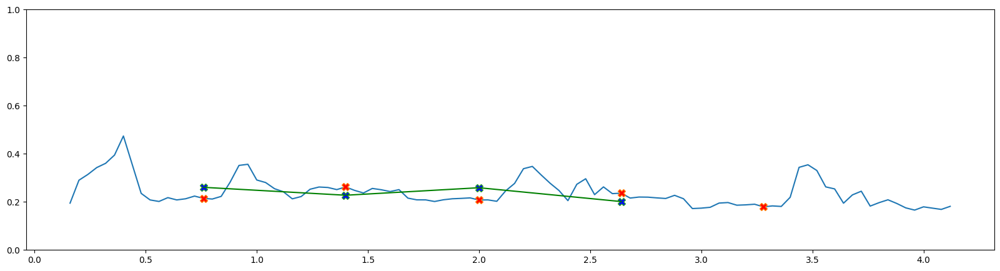

side left udara left 3 (4, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.152179  0.500000 -0.042946  0.949821  0.971207  0.021415  0.068026   
1    0.146503  0.533333 -0.041417  0.945689  0.963067  0.017388  0.052479   
2    0.148394  0.566667 -0.034847  0.933510  0.955056  0.021831  0.062179   
3    0.151186  0.600000 -0.030929  0.924132  0.947265  0.023806  0.069012   
4    0.151417  0.633333 -0.022044  0.912618  0.937481  0.025132  0.077956   
..        ...       ...       ...       ...       ...       ...       ...   
110  0.148184  4.166667 -0.013465  0.029755  0.024591  0.005425  0.073732   
111  0.153885  4.200000 -0.022668  0.016763  0.014941  0.002827  0.077384   
112  0.152201  4.233333 -0.034094  0.020627  0.008348  0.012934  0.078724   
113  0.154625  4.266667 -0.009172  0.012918  0.012664  0.002630  0.058608   
114  0.157353  4.300000 -0.011126  0.012978  0.000141  0.013912  0.046181   

          sln       aln  
0    0.140721  0.4

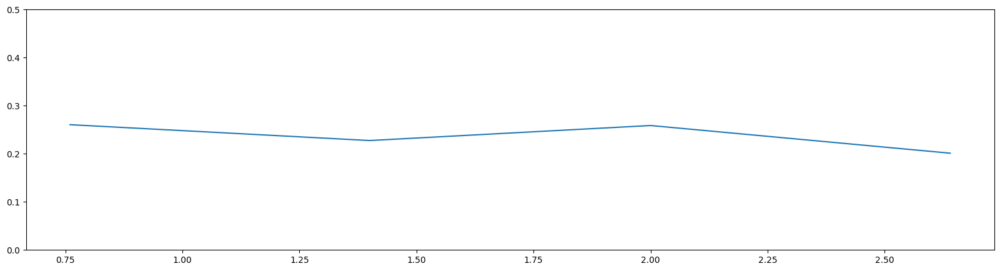

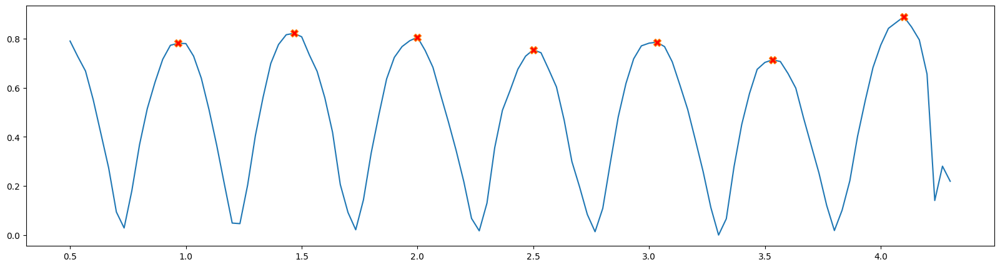

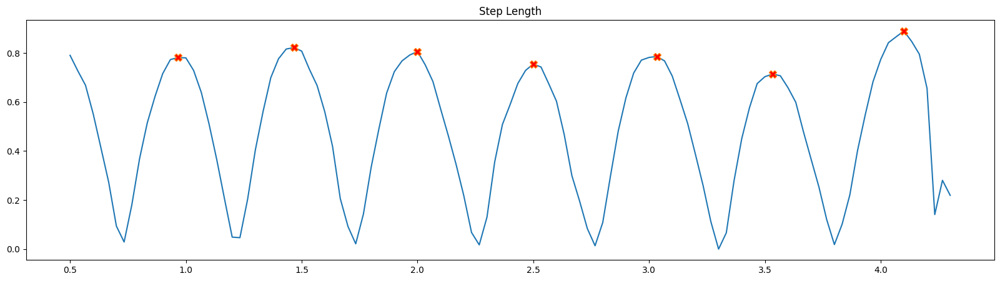

[ 14  29  45  60  76  91 108]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.373736  1.059637 -0.042946   0.778861  0.500000 -0.368152    0.770476   
1    1.477582  1.294592 -0.041417   0.836576  0.533333  0.246677    0.777616   
2    1.455887  1.411326 -0.034847   0.839127  0.566667  0.110376    0.765940   
3    1.423664  1.351492 -0.030929   0.888197  0.600000  0.216346    0.741574   
4    1.436236  1.355340 -0.022044   0.925223  0.633333  0.182897    0.700713   
..        ...       ...       ...        ...       ...       ...         ...   
110  1.493964  1.606910 -0.013465   1.008312  4.166667 -0.158713    0.519776   
111  1.327596  1.476337 -0.022668   0.921881  4.200000 -0.469342    0.505741   
112  1.275562  1.331375 -0.034094   0.911168  4.233333  0.130024    0.427061   
113  1.256531  1.247883 -0.009172   0.910623  4.266667  1.052908    0.369890   
114  1.190934  1.276247 -0.011126   0.911919  4.300000 -2.274526    0.301490   

     visi

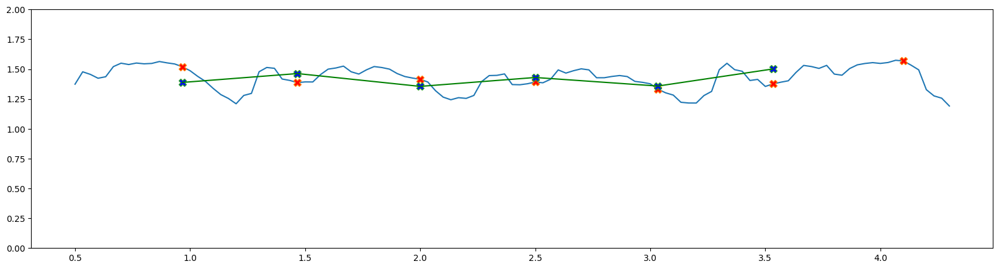

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.447016     0.598201 -0.042946  0.500000 -0.368152      0.021412   
1       0.358212     0.624881 -0.041417  0.533333  0.246677      0.021754   
2       0.419009     0.615075 -0.034847  0.566667  0.110376      0.021716   
3       0.456471     0.594321 -0.030929  0.600000  0.216346      0.021899   
4       0.514840     0.581094 -0.022044  0.633333  0.182897      0.026475   
..           ...          ...       ...       ...       ...           ...   
110     0.497573     0.598713 -0.013465  4.166667 -0.158713      0.207718   
111     0.502866     0.578170 -0.022668  4.200000 -0.469342      0.187688   
112     0.517239     0.571159 -0.034094  4.233333  0.130024      0.169472   
113     0.379033     0.288207 -0.009172  4.266667  1.052908      0.152615   
114     0.293486     0.260315 -0.011126  4.300000 -2.274526      0.136388   

     visi_l_urm_l  
0        0.988462  
1        0.989396  
2        0.9902

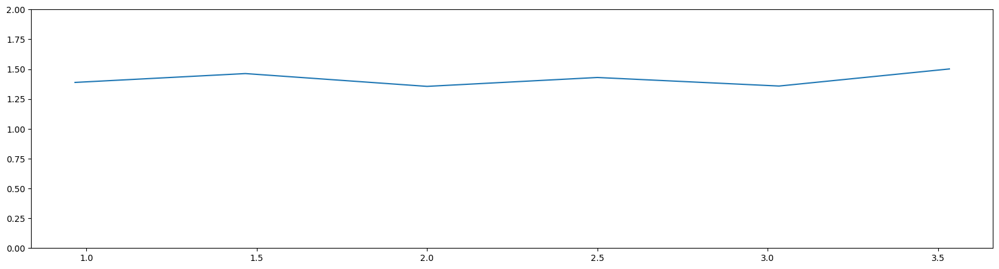

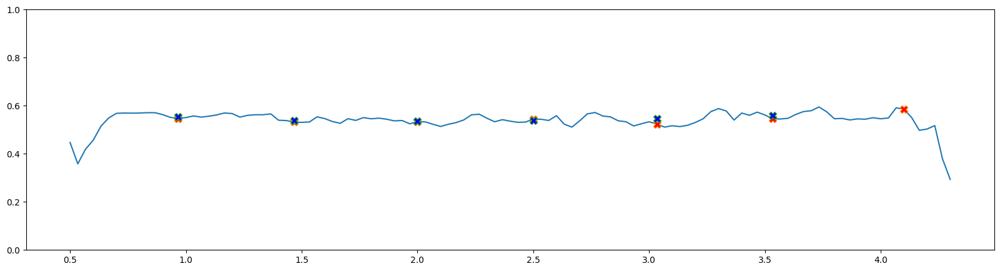

            r         l         c         t  velocity  visi_larm_r  \
0    0.095703  0.477814 -0.042946  0.500000 -0.368152     0.000976   
1    0.120730  0.509045 -0.041417  0.533333  0.246677     0.001024   
2    0.293254  0.519956 -0.034847  0.566667  0.110376     0.001038   
3    0.533360  0.538471 -0.030929  0.600000  0.216346     0.001114   
4    0.479920  0.556428 -0.022044  0.633333  0.182897     0.001853   
..        ...       ...       ...       ...       ...          ...   
110  0.309121  0.525423 -0.013465  4.166667 -0.158713     0.065944   
111  0.437591  0.548248 -0.022668  4.200000 -0.469342     0.053879   
112  0.466145  0.532506 -0.034094  4.233333  0.130024     0.044085   
113  0.180511  0.068681 -0.009172  4.266667  1.052908     0.035929   
114  0.062725  0.045445 -0.011126  4.300000 -2.274526     0.029269   

     visi_larm_l  
0       0.965326  
1       0.967928  
2       0.970077  
3       0.972313  
4       0.973424  
..           ...  
110     0.950323  
111    

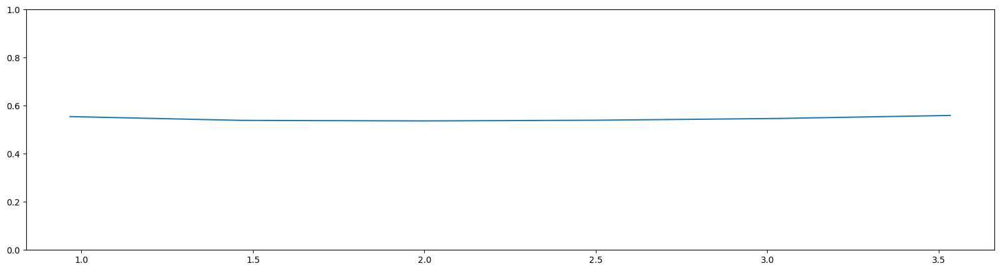

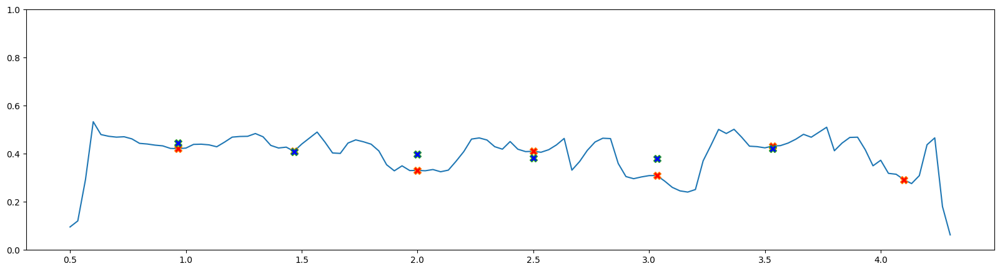

            r         l         c         t  velocity      visi_l_r  visi_l_l
0    0.106407  0.305909 -0.042946  0.500000 -0.368152  6.239697e-08  0.879342
1    0.125016  0.319145 -0.041417  0.533333  0.246677  6.968423e-08  0.887623
2    0.200417  0.326600 -0.034847  0.566667  0.110376  7.200826e-08  0.894491
3    0.305951  0.322402 -0.030929  0.600000  0.216346  8.643312e-08  0.902074
4    0.305877  0.321709 -0.022044  0.633333  0.182897  3.039833e-07  0.905905
..        ...       ...       ...       ...       ...           ...       ...
110  0.223000  0.325977 -0.013465  4.166667 -0.158713  1.389947e-03  0.841131
111  0.300343  0.333289 -0.022668  4.200000 -0.469342  8.396844e-04  0.797509
112  0.272918  0.321214 -0.034094  4.233333  0.130024  5.094056e-04  0.725907
113  0.114394  0.096614 -0.009172  4.266667  1.052908  3.058780e-04  0.587333
114  0.078502  0.114273 -0.011126  4.300000 -2.274526  1.824300e-04  0.455592

[115 rows x 7 columns]
t1 0.9666666666666667
t1 1.4666666666666

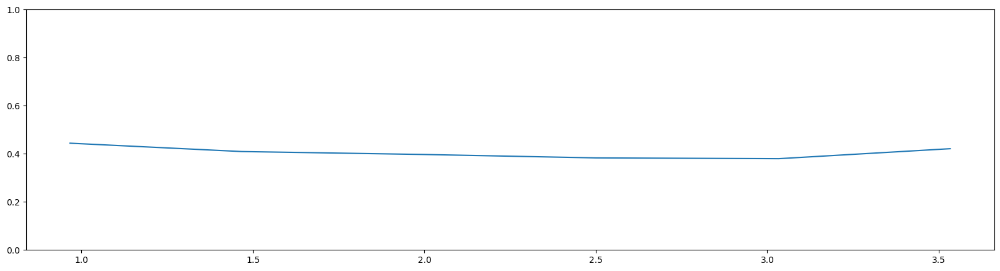

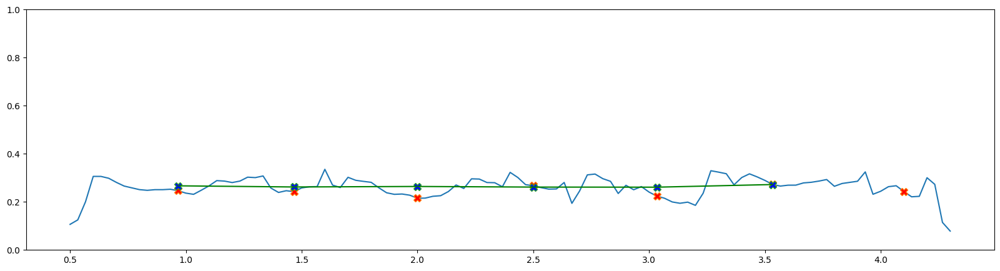

            r         l  leg_ratio         c         t  velocity  \
0    0.597000  0.766504   2.649774 -0.042946  0.500000 -0.368152   
1    0.671493  0.802668   1.638645 -0.041417  0.533333  0.246677   
2    0.663320  0.790488   1.276608 -0.034847  0.566667  0.110376   
3    0.673802  0.758617   1.264790 -0.030929  0.600000  0.216346   
4    0.696206  0.752474   1.227519 -0.022044  0.633333  0.182897   
..        ...       ...        ...       ...       ...       ...   
110  0.754530  0.748310   0.861209 -0.013465  4.166667 -0.158713   
111  0.678566  0.736066   0.876748 -0.022668  4.200000 -0.469342   
112  0.642540  0.705182   1.010906 -0.034094  4.233333  0.130024   
113  0.640670  0.703551   1.131408 -0.009172  4.266667  1.052908   
114  0.618238  0.677952   0.957213 -0.011126  4.300000 -2.274526   

     visi_thigh_r  visi_thigh_l  
0        0.912901      0.950027  
1        0.915161      0.953149  
2        0.907875      0.956328  
3        0.894603      0.959598  
4        0.87

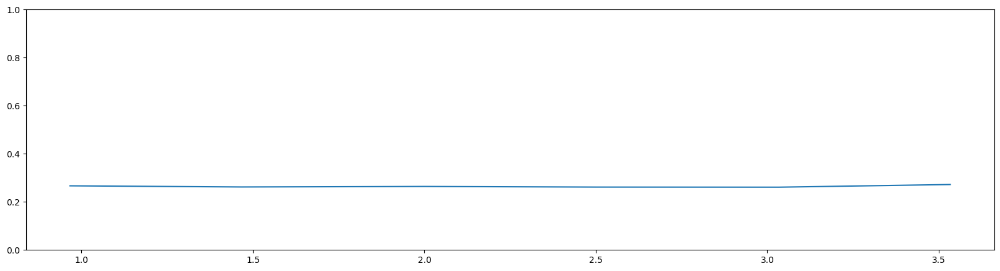

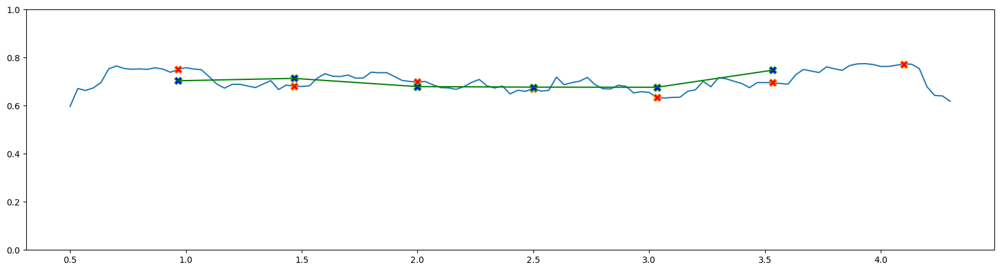

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.776736  0.293133   0.778861 -0.042946  0.500000 -0.368152    0.843987   
1    0.806089  0.491924   0.836576 -0.041417  0.533333  0.246677    0.849705   
2    0.792567  0.620838   0.839127 -0.034847  0.566667  0.110376    0.843662   
3    0.749862  0.592875   0.888197 -0.030929  0.600000  0.216346    0.828942   
4    0.740030  0.602866   0.925223 -0.022044  0.633333  0.182897    0.802897   
..        ...       ...        ...       ...       ...       ...         ...   
110  0.739434  0.858600   1.008312 -0.013465  4.166667 -0.158713    0.689736   
111  0.649030  0.740270   0.921881 -0.022668  4.200000 -0.469342    0.671671   
112  0.633022  0.626193   0.911168 -0.034094  4.233333  0.130024    0.599494   
113  0.615861  0.544332   0.910623 -0.009172  4.266667  1.052908    0.548505   
114  0.572696  0.598295   0.911919 -0.011126  4.300000 -2.274526    0.484219   

     visi_shk_l  
0      0.726720  
1  

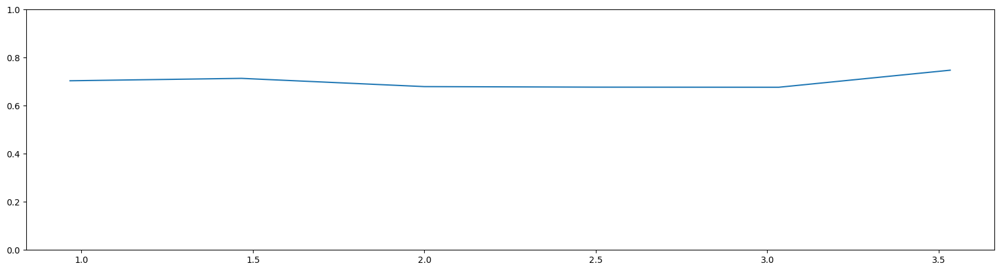

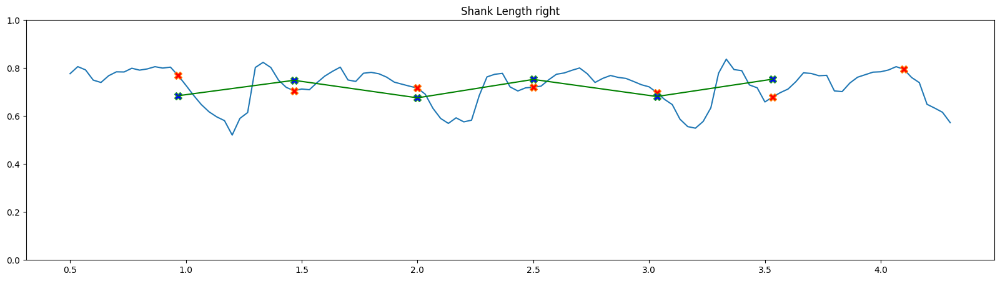

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.243486  0.233440   0.778861 -0.042946  0.500000 -0.368152     0.782613   
1    0.245752  0.305022   0.836576 -0.041417  0.533333  0.246677     0.789099   
2    0.241274  0.320399   0.839127 -0.034847  0.566667  0.110376     0.789763   
3    0.243416  0.332289   0.888197 -0.030929  0.600000  0.216346     0.782050   
4    0.242294  0.336202   0.925223 -0.022044  0.633333  0.182897     0.773325   
..        ...       ...        ...       ...       ...       ...          ...   
110  0.244062  0.258189   1.008312 -0.013465  4.166667 -0.158713     0.808928   
111  0.270108  0.133325   0.921881 -0.022668  4.200000 -0.469342     0.758145   
112  0.229058  0.325634   0.911168 -0.034094  4.233333  0.130024     0.680316   
113  0.278707  0.256103   0.910623 -0.009172  4.266667  1.052908     0.639231   
114  0.226511  0.210054   0.911919 -0.011126  4.300000 -2.274526     0.586887   

     visi_foot_l  
0       

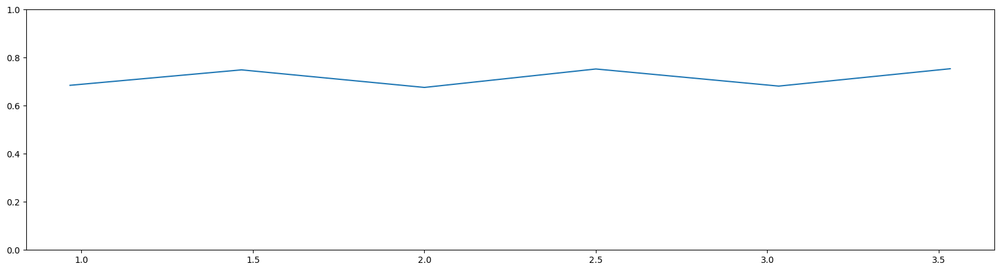

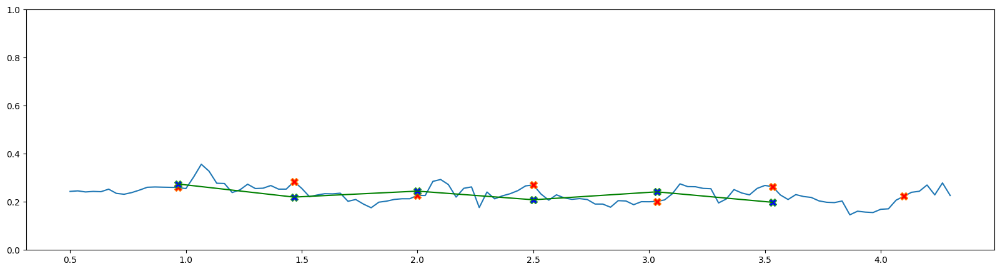

side left anjalie left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.186701  0.800000 -0.038667  0.950318  0.990834  0.043555  0.084805   
1    0.186262  0.833333 -0.016416  0.944758  0.988713  0.046562  0.083552   
2    0.189508  0.866667 -0.012914  0.934396  0.980637  0.046809  0.080636   
3    0.189026  0.900000 -0.018823  0.925404  0.969357  0.044118  0.084448   
4    0.189435  0.933333 -0.022759  0.919510  0.960024  0.040592  0.088366   
..        ...       ...       ...       ...       ...       ...       ...   
120  0.196106  4.800000 -0.033675  0.040486  0.007283  0.033366  0.100386   
121  0.191655  4.833333 -0.020543  0.032030  0.006874  0.025740  0.096026   
122  0.183882  4.866667 -0.019038  0.024039  0.005608  0.019274  0.092411   
123  0.183063  4.900000 -0.022573  0.017030  0.008573  0.008598  0.091471   
124  0.182418  4.933333 -0.024690 -0.008664  0.007063  0.015819  0.092517   

          sln       aln  
0    0.233285  0

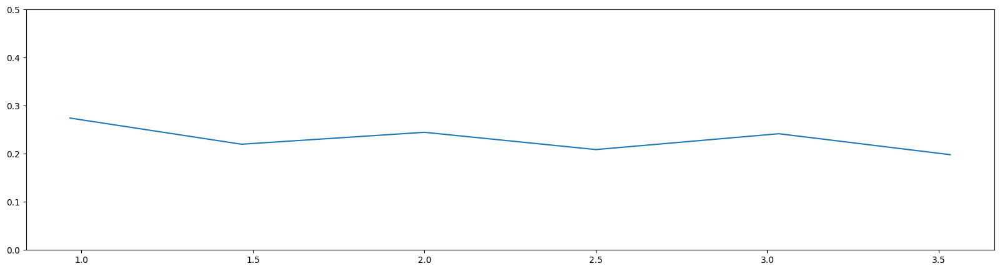

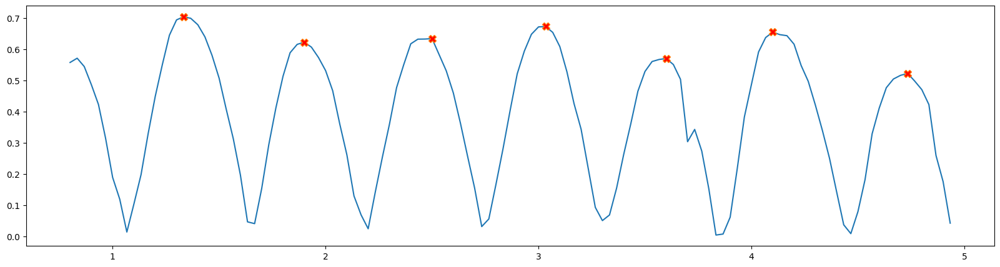

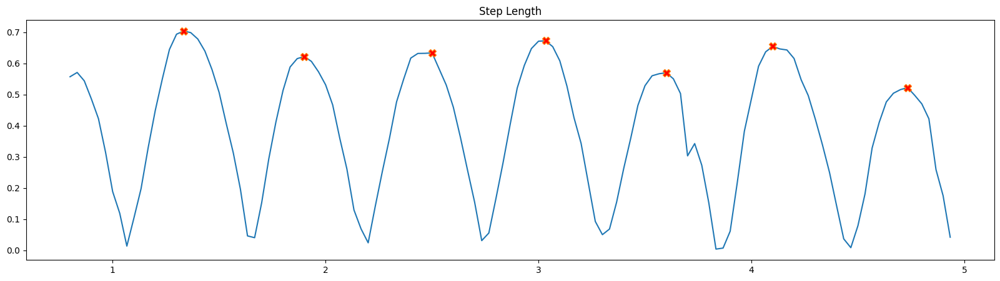

[ 16  33  51  67  84  99 118]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.297847  1.309983 -0.038667   1.018341  0.800000  0.998781    0.435416   
1    1.287663  1.317347 -0.016416   1.012442  0.833333  0.353985    0.446929   
2    1.244027  1.311400 -0.012914   0.995739  0.866667 -0.096922    0.459836   
3    1.244673  1.320929 -0.018823   1.001429  0.900000 -0.190275    0.489260   
4    1.210996  1.324793 -0.022759   0.993857  0.933333 -0.036670    0.512150   
..        ...       ...       ...        ...       ...       ...         ...   
120  1.120045  1.194777 -0.033675   0.846436  4.800000  0.325656    0.465321   
121  1.145158  1.192454 -0.020543   0.891877  4.833333  0.280508    0.421097   
122  1.238608  1.217333 -0.019038   0.911233  4.866667 -0.107260    0.371123   
123  1.260380  1.174402 -0.022573   0.955001  4.900000 -0.071295    0.330970   
124  1.203936  1.170955 -0.024690   0.951756  4.933333 -0.116232    0.281110   

     visi

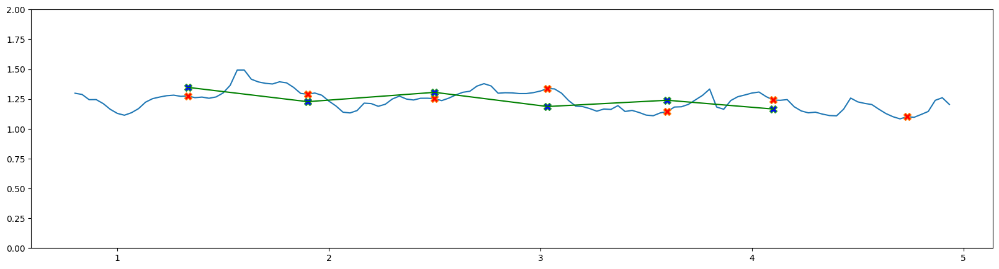

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.454227     0.619834 -0.038667  0.800000  0.998781      0.448133   
1       0.448572     0.567167 -0.016416  0.833333  0.353985      0.455142   
2       0.425500     0.522115 -0.012914  0.866667 -0.096922      0.458395   
3       0.446753     0.539719 -0.018823  0.900000 -0.190275      0.464222   
4       0.466474     0.545904 -0.022759  0.933333 -0.036670      0.461863   
..           ...          ...       ...       ...       ...           ...   
120     0.511896     0.281416 -0.033675  4.800000  0.325656      0.284289   
121     0.501034     0.296354 -0.020543  4.833333  0.280508      0.263340   
122     0.502554     0.342367 -0.019038  4.866667 -0.107260      0.240832   
123     0.499667     0.491073 -0.022573  4.900000 -0.071295      0.217893   
124     0.507169     0.534062 -0.024690  4.933333 -0.116232      0.197093   

     visi_l_urm_l  
0        0.900290  
1        0.907463  
2        0.9164

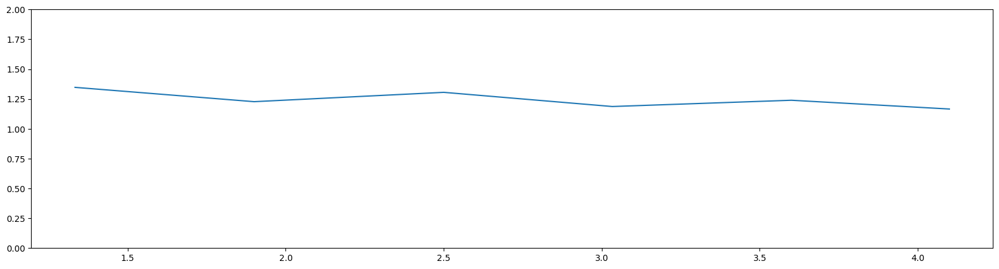

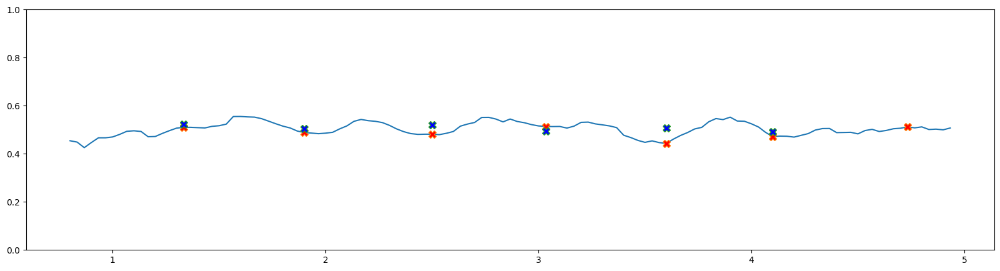

            r         l         c         t  velocity  visi_larm_r  \
0    0.363956  0.398124 -0.038667  0.800000  0.998781     0.271027   
1    0.367027  0.398256 -0.016416  0.833333  0.353985     0.276994   
2    0.389940  0.427908 -0.012914  0.866667 -0.096922     0.284604   
3    0.412230  0.490969 -0.018823  0.900000 -0.190275     0.298177   
4    0.407512  0.516722 -0.022759  0.933333 -0.036670     0.304922   
..        ...       ...       ...       ...       ...          ...   
120  0.436297  0.027921 -0.033675  4.800000  0.325656     0.062916   
121  0.434871  0.165815 -0.020543  4.833333  0.280508     0.053779   
122  0.462120  0.288300 -0.019038  4.866667 -0.107260     0.045184   
123  0.481352  0.496123 -0.022573  4.900000 -0.071295     0.037138   
124  0.480798  0.544728 -0.024690  4.933333 -0.116232     0.030687   

     visi_larm_l  
0       0.534365  
1       0.550639  
2       0.590004  
3       0.627967  
4       0.662589  
..           ...  
120     0.757504  
121    

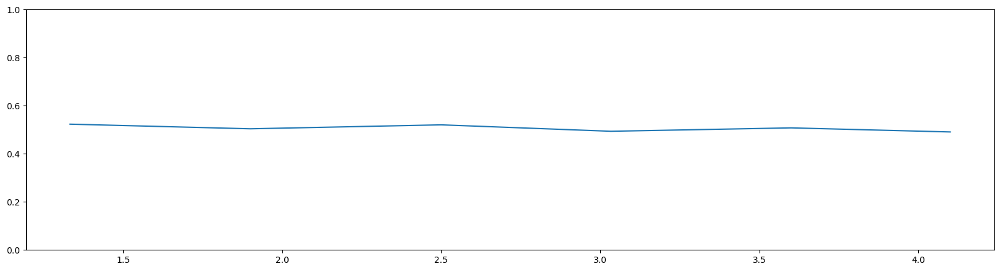

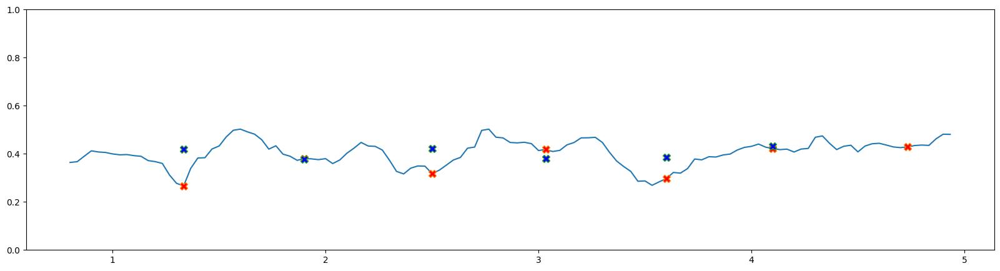

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.310534  0.280175 -0.038667  0.800000  0.998781  0.040741  0.145249
1    0.306248  0.304257 -0.016416  0.833333  0.353985  0.042932  0.158340
2    0.312057  0.370056 -0.012914  0.866667 -0.096922  0.046476  0.196795
3    0.310152  0.375743 -0.018823  0.900000 -0.190275  0.053159  0.239736
4    0.317305  0.386336 -0.022759  0.933333 -0.036670  0.057585  0.283750
..        ...       ...       ...       ...       ...       ...       ...
120  0.299465  0.098945 -0.033675  4.800000  0.325656  0.000743  0.413583
121  0.311152  0.108464 -0.020543  4.833333  0.280508  0.000506  0.288722
122  0.317900  0.162675 -0.019038  4.866667 -0.107260  0.000332  0.216652
123  0.325583  0.328856 -0.022573  4.900000 -0.071295  0.000205  0.186515
124  0.327786  0.295936 -0.024690  4.933333 -0.116232  0.000128  0.174083

[125 rows x 7 columns]
t1 1.3333333333333333
t1 1.9
t1 2.5
t1 3.033333333333333
t1 3.6
t1 4.1
results [0.298666

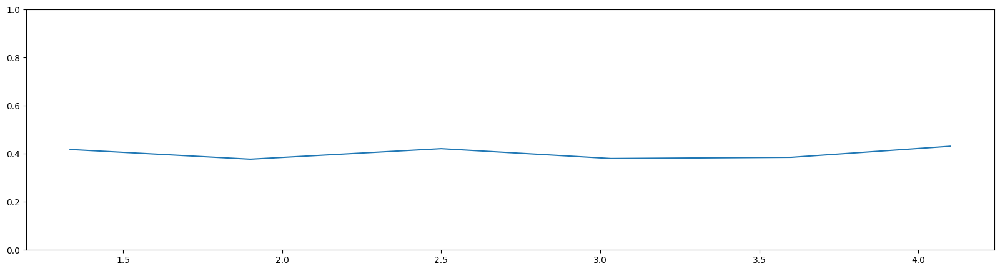

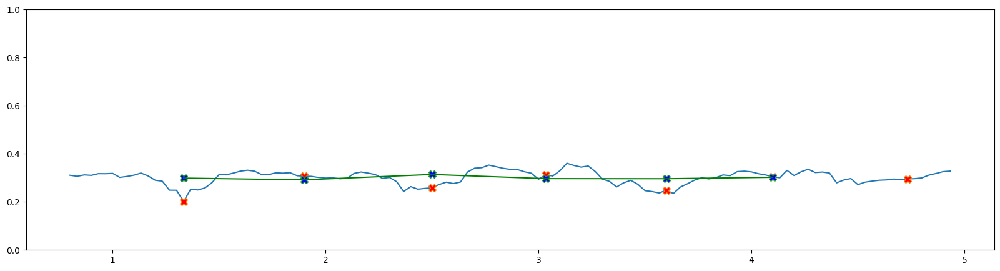

            r         l  leg_ratio         c         t  velocity  \
0    0.655649  0.643841   0.964055 -0.038667  0.800000  0.998781   
1    0.652670  0.644649   0.943950 -0.016416  0.833333  0.353985   
2    0.646792  0.649560   0.902386 -0.012914  0.866667 -0.096922   
3    0.664858  0.663909   0.882493 -0.018823  0.900000 -0.190275   
4    0.665314  0.669426   0.832635 -0.022759  0.933333 -0.036670   
..        ...       ...        ...       ...       ...       ...   
120  0.514446  0.607779   1.031687 -0.033675  4.800000  0.325656   
121  0.548776  0.615305   1.033322 -0.020543  4.833333  0.280508   
122  0.603086  0.661835   1.144058 -0.019038  4.866667 -0.107260   
123  0.626090  0.655591   1.222583 -0.022573  4.900000 -0.071295   
124  0.619856  0.651276   1.123925 -0.024690  4.933333 -0.116232   

     visi_thigh_r  visi_thigh_l  
0        0.684431      0.989117  
1        0.692808      0.987623  
2        0.702676      0.987051  
3        0.723268      0.987444  
4        0.73

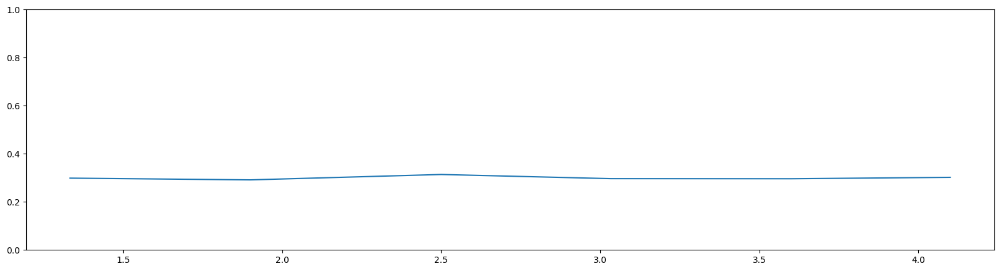

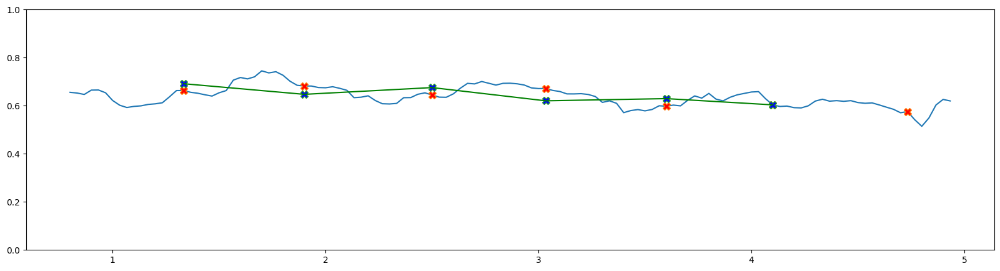

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.642198  0.666142   1.018341 -0.038667  0.800000  0.998781    0.636173   
1    0.634993  0.672698   1.012442 -0.016416  0.833333  0.353985    0.645097   
2    0.597235  0.661840   0.995739 -0.012914  0.866667 -0.096922    0.654407   
3    0.579816  0.657020   1.001429 -0.018823  0.900000 -0.190275    0.676456   
4    0.545682  0.655367   0.993857 -0.022759  0.933333 -0.036670    0.692703   
..        ...       ...        ...       ...       ...       ...         ...   
120  0.605598  0.586998   0.846436 -0.033675  4.800000  0.325656    0.639902   
121  0.596381  0.577149   0.891877 -0.020543  4.833333  0.280508    0.603083   
122  0.635522  0.555498   0.911233 -0.019038  4.866667 -0.107260    0.558360   
123  0.634290  0.518811   0.955001 -0.022573  4.900000 -0.071295    0.521073   
124  0.584081  0.519679   0.951756 -0.024690  4.933333 -0.116232    0.470261   

     visi_shk_l  
0      0.981830  
1  

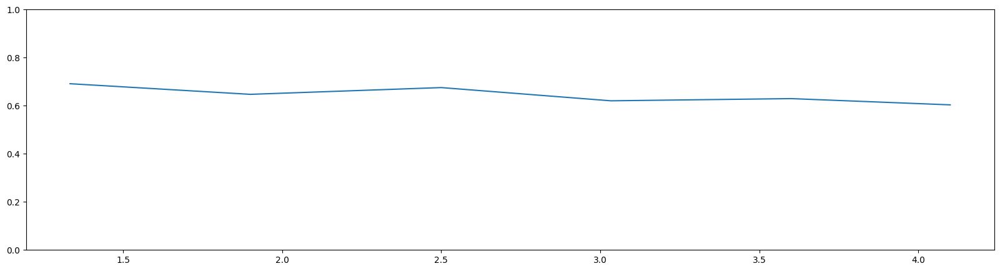

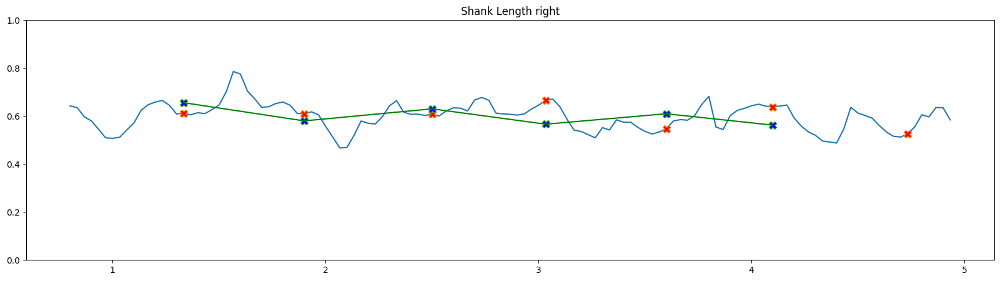

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.228522  0.257145   1.018341 -0.038667  0.800000  0.998781     0.878644   
1    0.206247  0.245097   1.012442 -0.016416  0.833333  0.353985     0.880536   
2    0.182198  0.231828   0.995739 -0.012914  0.866667 -0.096922     0.880331   
3    0.210408  0.230299   1.001429 -0.018823  0.900000 -0.190275     0.886873   
4    0.297875  0.227474   0.993857 -0.022759  0.933333 -0.036670     0.890262   
..        ...       ...        ...       ...       ...       ...          ...   
120  0.117105  0.253552   0.846436 -0.033675  4.800000  0.325656     0.780920   
121  0.126052  0.281218   0.891877 -0.020543  4.833333  0.280508     0.752170   
122  0.172099  0.330794   0.911233 -0.019038  4.866667 -0.107260     0.718280   
123  0.183948  0.323543   0.955001 -0.022573  4.900000 -0.071295     0.692266   
124  0.201862  0.253302   0.951756 -0.024690  4.933333 -0.116232     0.651608   

     visi_foot_l  
0       

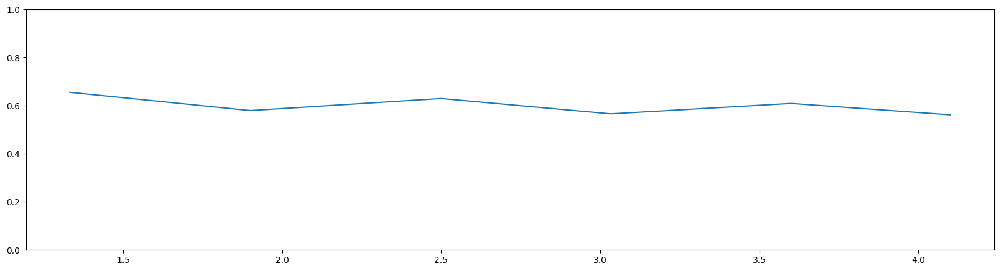

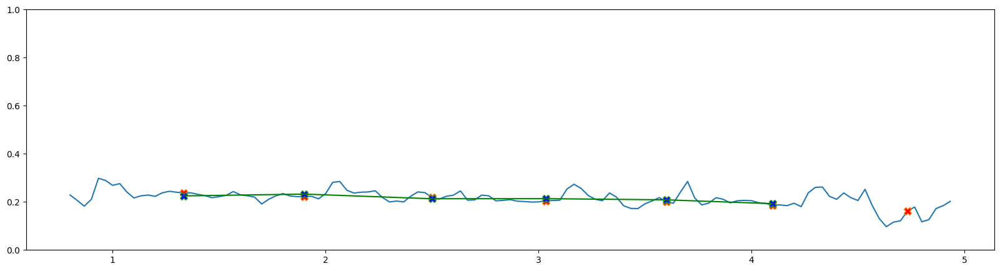

side left bimsara left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.182970  0.766667 -0.062272  0.943488  0.973370  0.031017  0.095709   
1    0.183715  0.800000 -0.044685  0.938700  0.968325  0.030940  0.095178   
2    0.183401  0.833333 -0.045608  0.929288  0.957942  0.030089  0.093607   
3    0.182139  0.866667 -0.055656  0.919024  0.947778  0.029532  0.092491   
4    0.183137  0.900000 -0.056321  0.910442  0.936979  0.027133  0.089548   
..        ...       ...       ...       ...       ...       ...       ...   
131  0.172094  5.133333 -0.065996 -0.054504 -0.022931  0.032495  0.111040   
132  0.172775  5.166667 -0.053603 -0.068893 -0.031371  0.038087  0.109136   
133  0.167011  5.200000  0.005041 -0.064295 -0.050793  0.013976  0.067075   
134  0.172261  5.233333 -0.007310 -0.063983 -0.064680  0.013979  0.017229   
135  0.173233  5.266667 -0.009415 -0.086543 -0.070262  0.018015  0.050998   

          sln       aln  
0    0.169517  0

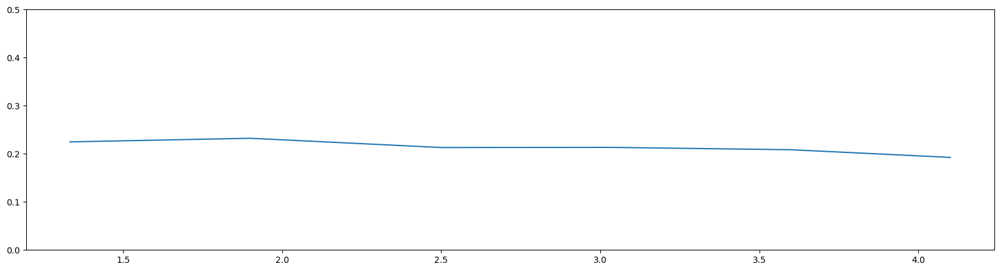

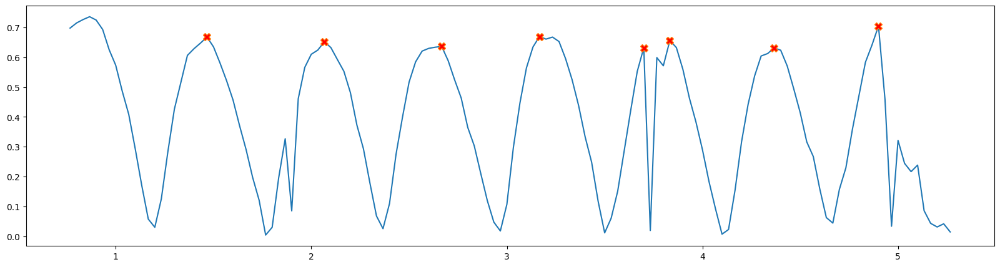

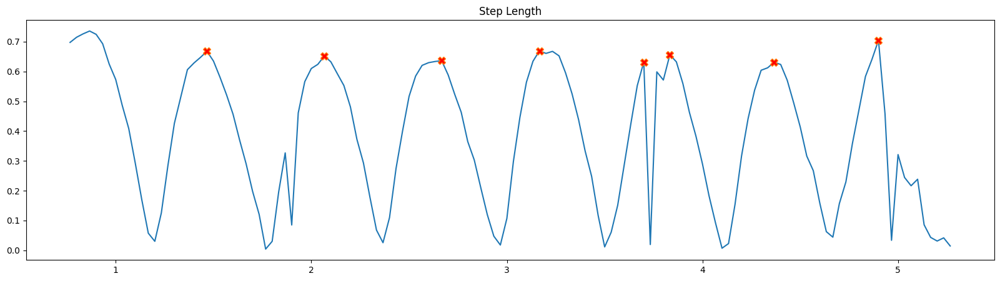

[ 21  39  57  72  88  92 108 124]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.257123  1.327762 -0.062272   0.941256  0.766667  0.735482    0.894955   
1    1.245884  1.309705 -0.044685   0.962177  0.800000  0.257294    0.898162   
2    1.232990  1.306080 -0.045608   0.951693  0.833333 -0.264925    0.902451   
3    1.236312  1.305630 -0.055656   0.943079  0.866667 -0.210394    0.906583   
4    1.243688  1.292363 -0.056321   0.949878  0.900000  0.135748    0.911293   
..        ...       ...       ...        ...       ...       ...         ...   
131  1.108461  1.253472 -0.065996   0.742435  5.133333 -0.816632    0.295319   
132  1.190702  1.231246 -0.053603   0.822799  5.166667  1.588169    0.275614   
133  1.254484  1.285669  0.005041   0.894480  5.200000  1.044871    0.242620   
134  1.276745  1.298126 -0.007310   0.982540  5.233333 -1.386876    0.214651   
135  1.233532  1.280714 -0.009415   0.987974  5.266667  3.201638    0.207890   

     

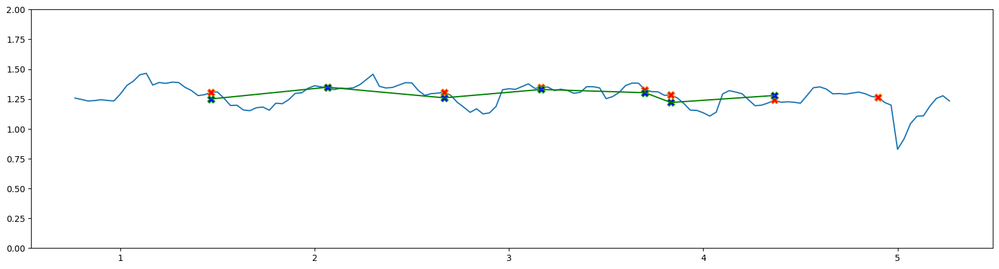

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.523088     0.546539 -0.062272  0.766667  0.735482      0.067951   
1       0.518072     0.532925 -0.044685  0.800000  0.257294      0.064541   
2       0.510395     0.551310 -0.045608  0.833333 -0.264925      0.061826   
3       0.507805     0.561634 -0.055656  0.866667 -0.210394      0.064085   
4       0.488968     0.561001 -0.056321  0.900000  0.135748      0.063505   
..           ...          ...       ...       ...       ...           ...   
131     0.645229     0.544955 -0.065996  5.133333 -0.816632      0.074157   
132     0.631665     0.554309 -0.053603  5.166667  1.588169      0.067474   
133     0.401619     0.456265  0.005041  5.200000  1.044871      0.061499   
134     0.100018     0.393115 -0.007310  5.233333 -1.386876      0.057987   
135     0.294391     0.452802 -0.009415  5.266667  3.201638      0.055829   

     visi_l_urm_l  
0        0.991757  
1        0.991852  
2        0.9917

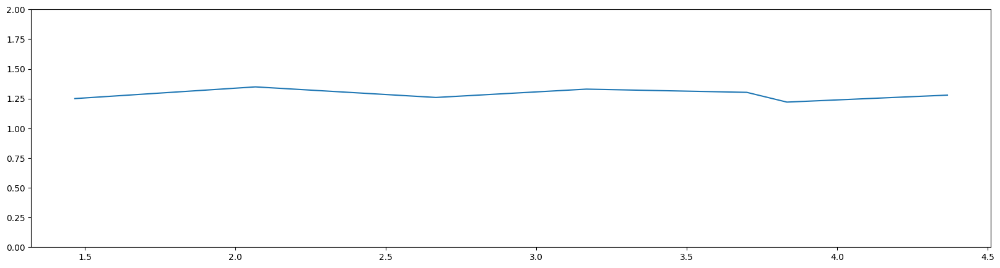

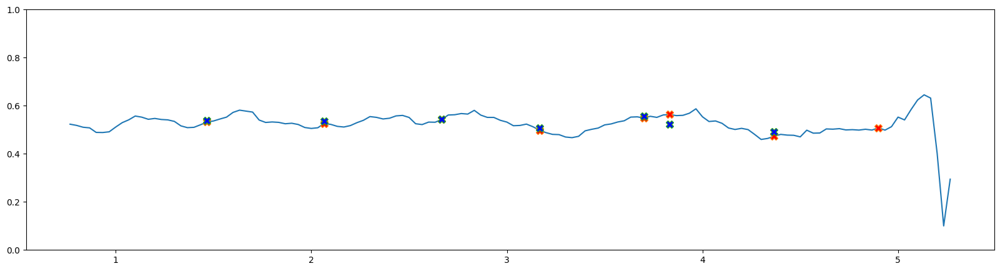

            r         l         c         t  velocity  visi_larm_r  \
0    0.377435  0.440616 -0.062272  0.766667  0.735482     0.007001   
1    0.379231  0.444301 -0.044685  0.800000  0.257294     0.006307   
2    0.375245  0.425295 -0.045608  0.833333 -0.264925     0.005694   
3    0.336058  0.412409 -0.055656  0.866667 -0.210394     0.005901   
4    0.360997  0.429800 -0.056321  0.900000  0.135748     0.005787   
..        ...       ...       ...       ...       ...          ...   
131  0.398007  0.495838 -0.065996  5.133333 -0.816632     0.006877   
132  0.370488  0.497535 -0.053603  5.166667  1.588169     0.005715   
133  0.060549  0.247789  0.005041  5.200000  1.044871     0.004745   
134  0.151042  0.229881 -0.007310  5.233333 -1.386876     0.004331   
135  0.116386  0.331391 -0.009415  5.266667  3.201638     0.004151   

     visi_larm_l  
0       0.947834  
1       0.948051  
2       0.946839  
3       0.950001  
4       0.953939  
..           ...  
131     0.624495  
132    

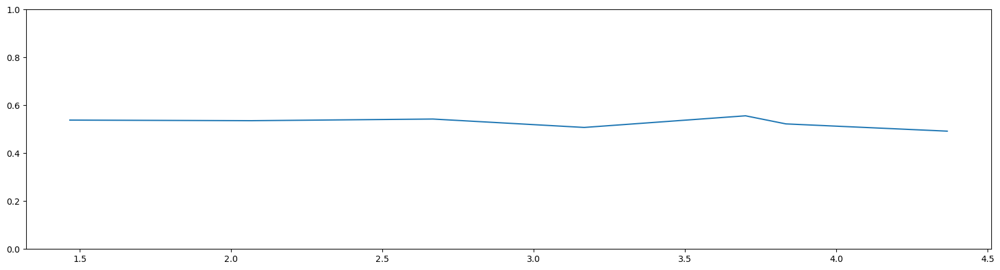

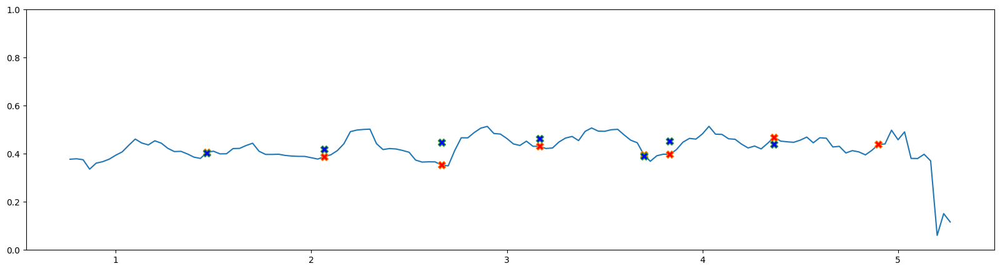

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.291783  0.310072 -0.062272  0.766667  0.735482  0.000005  0.809839
1    0.284368  0.290037 -0.044685  0.800000  0.257294  0.000004  0.810710
2    0.283185  0.295783 -0.045608  0.833333 -0.264925  0.000003  0.807139
3    0.322824  0.295275 -0.055656  0.866667 -0.210394  0.000003  0.817568
4    0.358804  0.299402 -0.056321  0.900000  0.135748  0.000003  0.830898
..        ...       ...       ...       ...       ...       ...       ...
131  0.276975  0.287856 -0.065996  5.133333 -0.816632  0.000004  0.273451
132  0.279018  0.295186 -0.053603  5.166667  1.588169  0.000002  0.241570
133  0.104386  0.136589  0.005041  5.200000  1.044871  0.000001  0.209591
134  0.111725  0.143001 -0.007310  5.233333 -1.386876  0.000001  0.180843
135  0.115303  0.218853 -0.009415  5.266667  3.201638  0.000001  0.190659

[136 rows x 7 columns]
t1 1.4666666666666666
t1 2.066666666666667
t1 2.6666666666666665
t1 3.1666666666666665
t

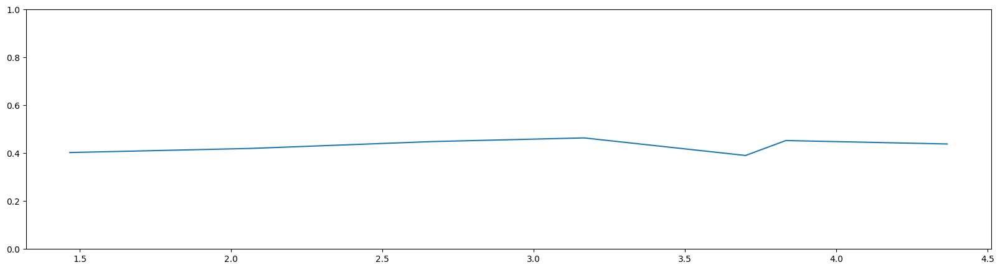

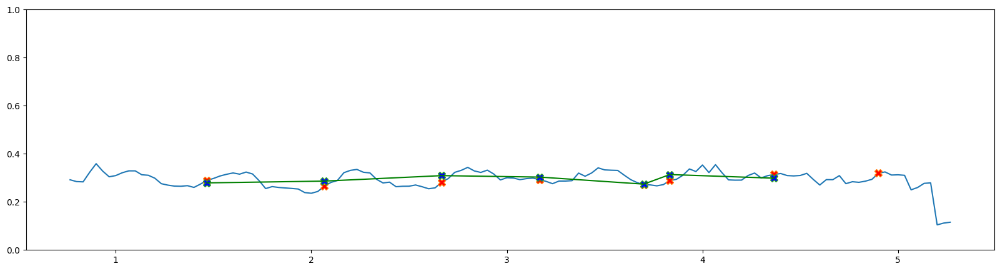

            r         l  leg_ratio         c         t  velocity  \
0    0.649027  0.689533   0.952786 -0.062272  0.766667  0.735482   
1    0.638160  0.663246   0.940080 -0.044685  0.800000  0.257294   
2    0.627353  0.659196   0.936238 -0.045608  0.833333 -0.264925   
3    0.622645  0.660226   0.950825 -0.055656  0.866667 -0.210394   
4    0.616182  0.648696   0.974893 -0.056321  0.900000  0.135748   
..        ...       ...        ...       ...       ...       ...   
131  0.538332  0.725089   1.079008 -0.065996  5.133333 -0.816632   
132  0.587910  0.714524   1.166568 -0.053603  5.166667  1.588169   
133  0.622806  0.696277   1.071746  0.005041  5.200000  1.044871   
134  0.669515  0.681412   0.984623 -0.007310  5.233333 -1.386876   
135  0.647362  0.655242   0.937164 -0.009415  5.266667  3.201638   

     visi_thigh_r  visi_thigh_l  
0        0.955638      0.992564  
1        0.956929      0.992867  
2        0.958835      0.992987  
3        0.960517      0.993288  
4        0.96

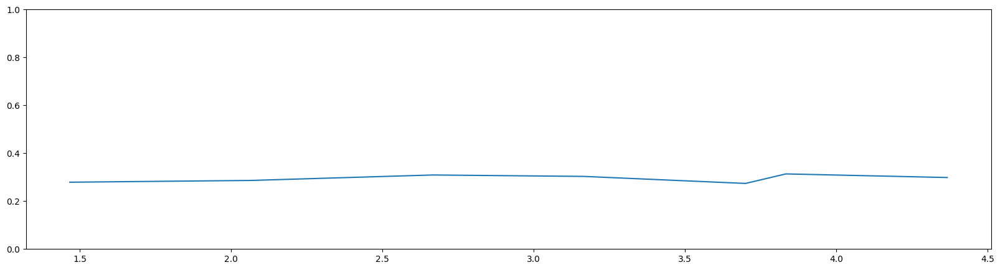

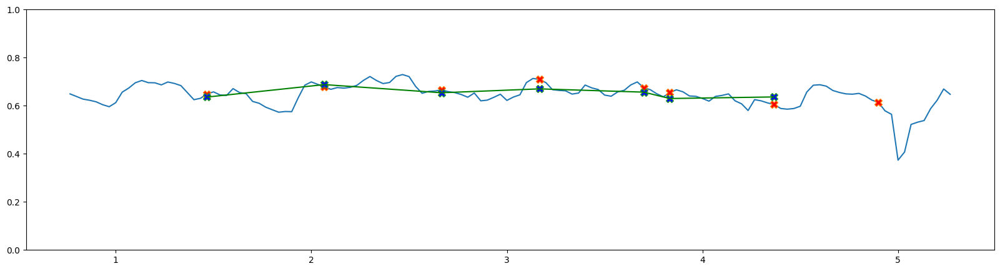

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.608096  0.638229   0.941256 -0.062272  0.766667  0.735482    0.936499   
1    0.607724  0.646459   0.962177 -0.044685  0.800000  0.257294    0.938588   
2    0.605637  0.646884   0.951693 -0.045608  0.833333 -0.264925    0.941196   
3    0.613667  0.645404   0.943079 -0.055656  0.866667 -0.210394    0.943850   
4    0.627507  0.643667   0.949878 -0.056321  0.900000  0.135748    0.946831   
..        ...       ...        ...       ...       ...       ...         ...   
131  0.570130  0.528383   0.742435 -0.065996  5.133333 -0.816632    0.474495   
132  0.602792  0.516722   0.822799 -0.053603  5.166667  1.588169    0.453638   
133  0.631678  0.589391   0.894480  0.005041  5.200000  1.044871    0.416297   
134  0.607231  0.616714   0.982540 -0.007310  5.233333 -1.386876    0.384184   
135  0.586170  0.625472   0.987974 -0.009415  5.266667  3.201638    0.374745   

     visi_shk_l  
0      0.987759  
1  

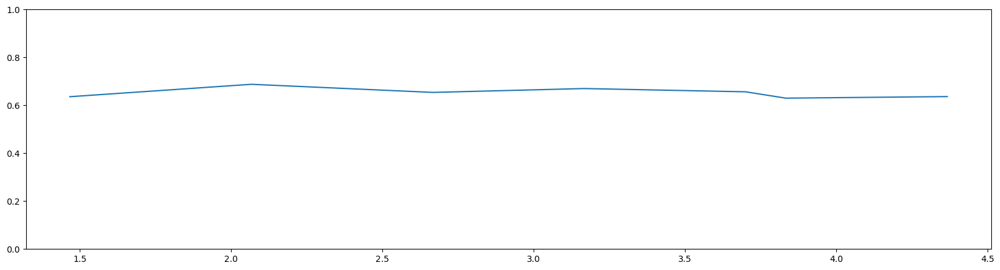

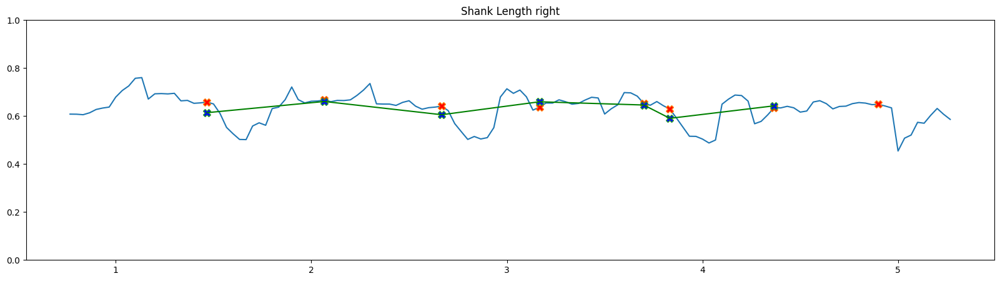

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.246434  0.223788   0.941256 -0.062272  0.766667  0.735482     0.883363   
1    0.232165  0.195346   0.962177 -0.044685  0.800000  0.257294     0.885805   
2    0.218561  0.193928   0.951693 -0.045608  0.833333 -0.264925     0.886870   
3    0.219882  0.200624   0.943079 -0.055656  0.866667 -0.210394     0.890100   
4    0.215095  0.204754   0.949878 -0.056321  0.900000  0.135748     0.894966   
..        ...       ...        ...       ...       ...       ...          ...   
131  0.240458  0.209613   0.742435 -0.065996  5.133333 -0.816632     0.573005   
132  0.149491  0.182896   0.822799 -0.053603  5.166667  1.588169     0.556085   
133  0.206746  0.150147   0.894480  0.005041  5.200000  1.044871     0.516200   
134  0.158640  0.108661   0.982540 -0.007310  5.233333 -1.386876     0.486042   
135  0.138126  0.064938   0.987974 -0.009415  5.266667  3.201638     0.466277   

     visi_foot_l  
0       

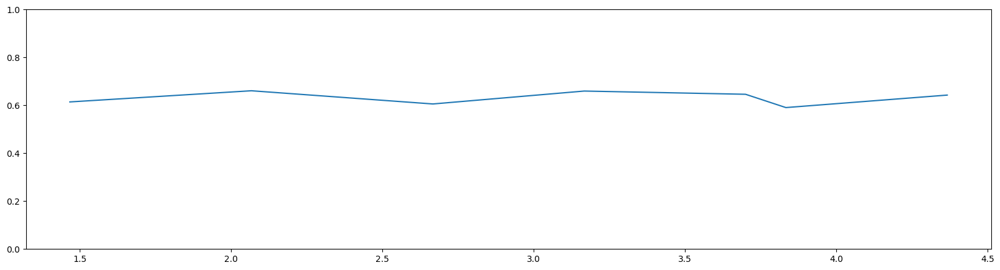

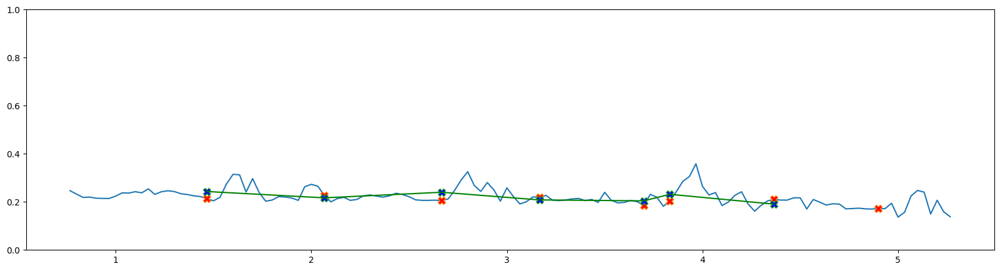

side left botheju left 3 (7, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.177723  0.900000 -0.043192  0.939436  0.978962  0.040235  0.085436   
1    0.168651  0.933333 -0.042521  0.936496  0.974057  0.037888  0.085950   
2    0.166076  0.966667 -0.037901  0.929632  0.966379  0.036799  0.082839   
3    0.167427  1.000000 -0.036301  0.923372  0.957669  0.034302  0.081014   
4    0.166157  1.033333 -0.032702  0.916719  0.950221  0.033516  0.081708   
..        ...       ...       ...       ...       ...       ...       ...   
145  0.137834  5.733333 -0.017642 -0.090108 -0.057073  0.036745  0.053134   
146  0.161715  5.766667 -0.014774 -0.084378 -0.053782  0.032925  0.040304   
147  0.166325  5.800000 -0.010534 -0.082972 -0.047828  0.036845  0.018571   
148  0.167450  5.833333 -0.012474 -0.085890 -0.040237  0.045749  0.080653   
149  0.167576  5.866667 -0.014339 -0.090678 -0.045618  0.045060  0.079634   

          sln       aln  
0    0.226391  0

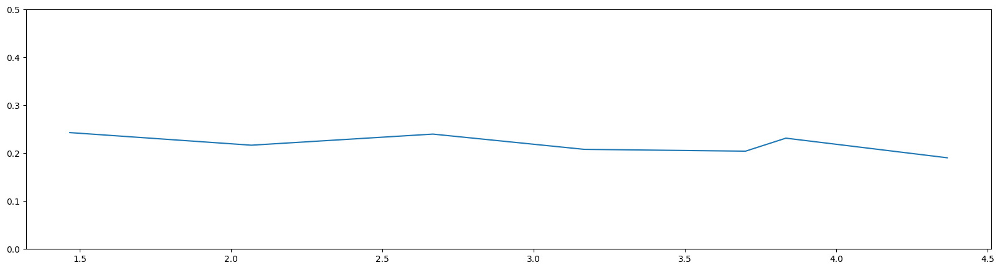

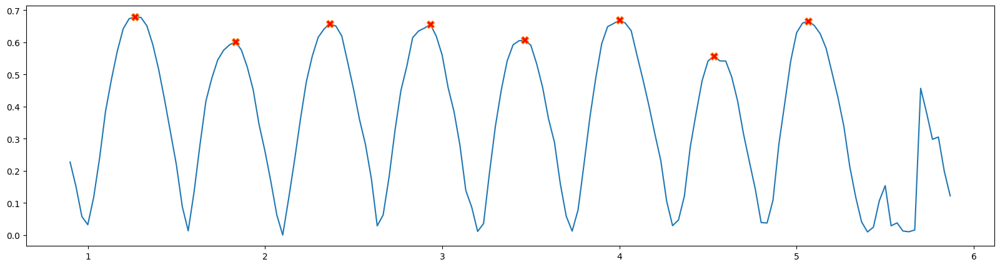

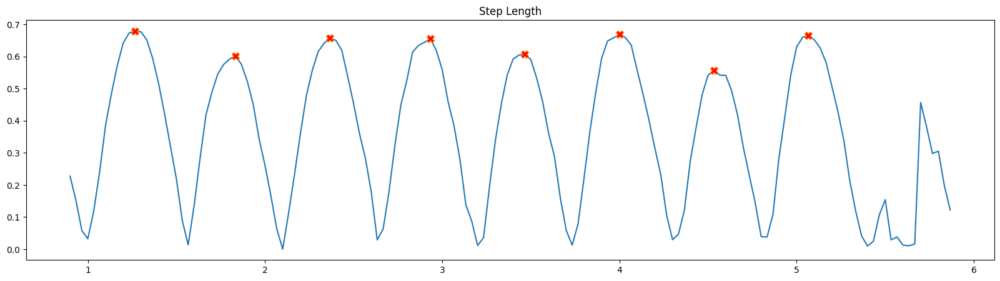

[ 11  28  44  61  77  93 109 125]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    0.982534  1.226370 -0.043192   0.911048  0.900000 -0.282774    0.728404   
1    1.074507  1.351971 -0.042521   0.850668  0.933333  0.171961    0.736474   
2    1.118095  1.399502 -0.037901   0.821322  0.966667  0.071155    0.734294   
3    1.167185  1.359904 -0.036301   0.813143  1.000000  0.080752    0.733953   
4    1.242783  1.387169 -0.032702   0.776442  1.033333  0.070120    0.735823   
..        ...       ...       ...        ...       ...       ...         ...   
145  1.264926  1.497372 -0.017642   0.787942  5.733333  0.795442    0.262535   
146  1.074941  1.252557 -0.014774   0.712956  5.766667 -0.119161    0.265550   
147  1.120723  1.395102 -0.010534   0.706283  5.800000  0.178051    0.301836   
148  1.301001  1.462557 -0.012474   0.795526  5.833333 -0.267120    0.339716   
149  1.312647  1.465917 -0.014339   0.843603  5.866667  0.548050    0.356669   

     

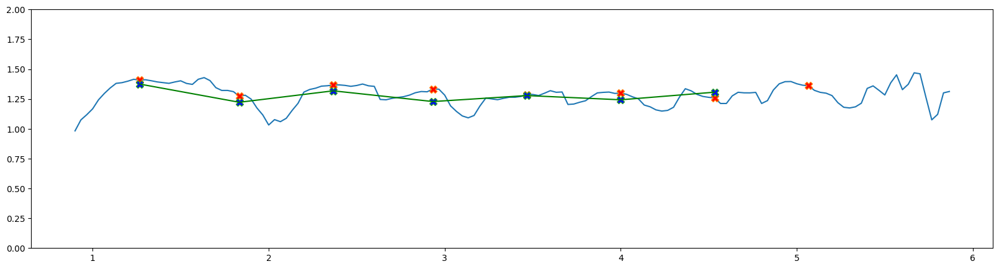

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.480727     0.553142 -0.043192  0.900000 -0.282774      0.178414   
1       0.509630     0.561911 -0.042521  0.933333  0.171961      0.168904   
2       0.498803     0.561018 -0.037901  0.966667  0.071155      0.157341   
3       0.483879     0.561388 -0.036301  1.000000  0.080752      0.147014   
4       0.491751     0.572568 -0.032702  1.033333  0.070120      0.139029   
..           ...          ...       ...       ...       ...           ...   
145     0.385491     0.527371 -0.017642  5.733333  0.795442      0.193740   
146     0.249228     0.472462 -0.014774  5.766667 -0.119161      0.175257   
147     0.111656     0.487173 -0.010534  5.800000  0.178051      0.180083   
148     0.481656     0.499362 -0.012474  5.833333 -0.267120      0.178601   
149     0.475211     0.494871 -0.014339  5.866667  0.548050      0.170217   

     visi_l_urm_l  
0        0.994189  
1        0.994499  
2        0.9948

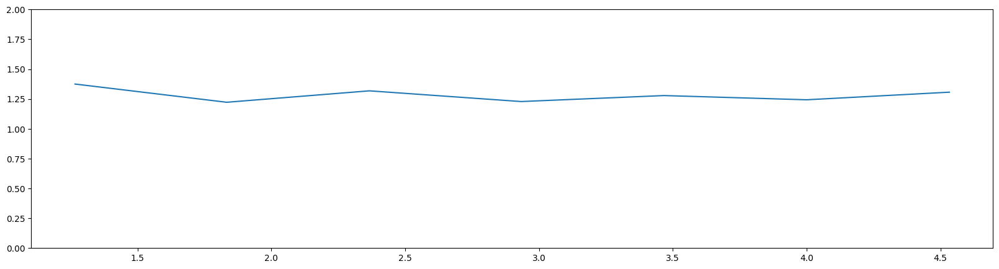

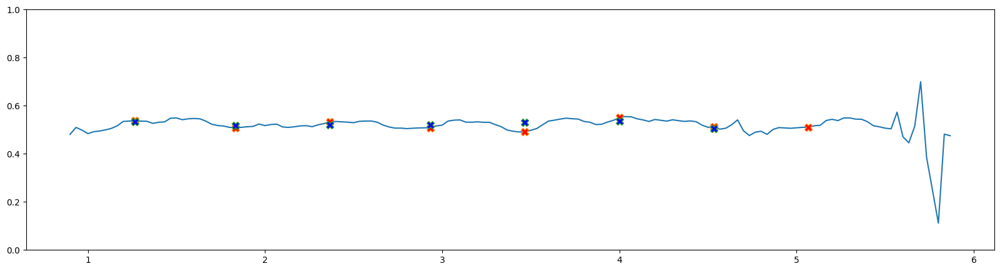

            r         l         c         t  velocity  visi_larm_r  \
0    0.386622  0.473830 -0.043192  0.900000 -0.282774     0.051359   
1    0.402325  0.496028 -0.042521  0.933333  0.171961     0.046388   
2    0.399825  0.503055 -0.037901  0.966667  0.071155     0.040695   
3    0.420533  0.495600 -0.036301  1.000000  0.080752     0.035855   
4    0.417308  0.463572 -0.032702  1.033333  0.070120     0.032572   
..        ...       ...       ...       ...       ...          ...   
145  0.163596  0.431808 -0.017642  5.733333  0.795442     0.041778   
146  0.183839  0.251383 -0.014774  5.766667 -0.119161     0.035105   
147  0.335867  0.246092 -0.010534  5.800000  0.178051     0.038594   
148  0.194106  0.332158 -0.012474  5.833333 -0.267120     0.038887   
149  0.090364  0.370310 -0.014339  5.866667  0.548050     0.037112   

     visi_larm_l  
0       0.969883  
1       0.971642  
2       0.973686  
3       0.975414  
4       0.975921  
..           ...  
145     0.617688  
146    

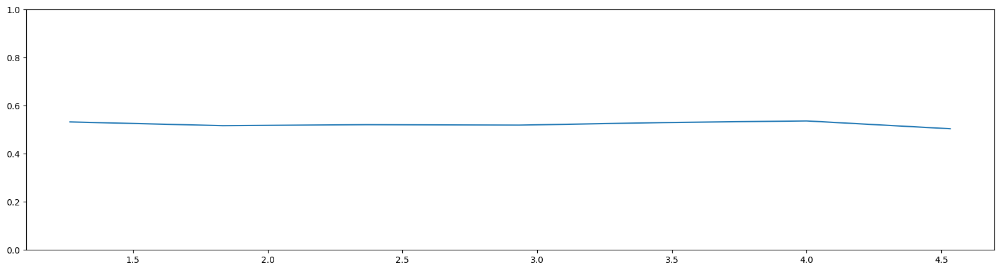

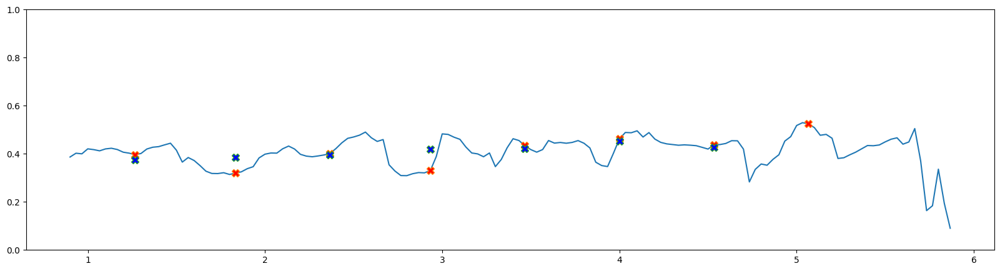

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.264257  0.285195 -0.043192  0.900000 -0.282774  0.000798  0.890396
1    0.273231  0.315167 -0.042521  0.933333  0.171961  0.000625  0.896524
2    0.294601  0.312380 -0.037901  0.966667  0.071155  0.000455  0.903599
3    0.290536  0.295171 -0.036301  1.000000  0.080752  0.000334  0.909552
4    0.280606  0.290659 -0.032702  1.033333  0.070120  0.000265  0.911006
..        ...       ...       ...       ...       ...       ...       ...
145  0.134037  0.301876 -0.017642  5.733333  0.795442  0.000379  0.255073
146  0.143520  0.168668 -0.014774  5.766667 -0.119161  0.000250  0.210920
147  0.163368  0.194529 -0.010534  5.800000  0.178051  0.000310  0.209986
148  0.170723  0.235566 -0.012474  5.833333 -0.267120  0.000327  0.237387
149  0.110530  0.248608 -0.014339  5.866667  0.548050  0.000307  0.256526

[150 rows x 7 columns]
t1 1.2666666666666666
t1 1.8333333333333333
t1 2.3666666666666667
t1 2.933333333333333
t

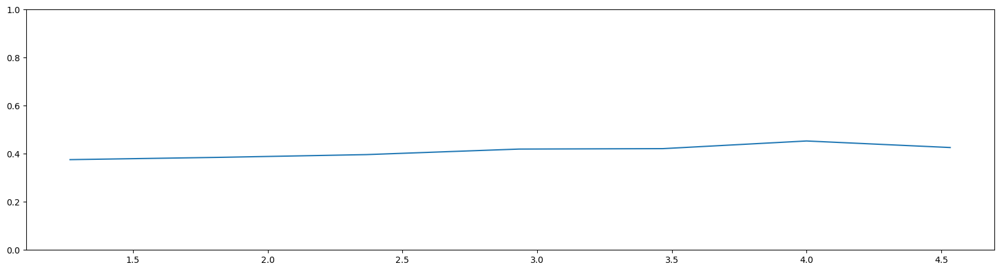

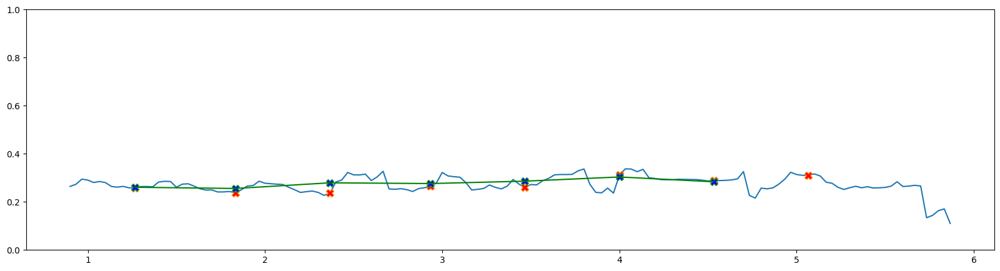

            r         l  leg_ratio         c         t  velocity  \
0    0.552263  0.606183   0.693778 -0.043192  0.900000 -0.282774   
1    0.578506  0.680061   0.738195 -0.042521  0.933333  0.171961   
2    0.584295  0.711409   0.775767 -0.037901  0.966667  0.071155   
3    0.571467  0.702788   0.906566 -0.036301  1.000000  0.080752   
4    0.561894  0.723679   1.026222 -0.032702  1.033333  0.070120   
..        ...       ...        ...       ...       ...       ...   
145  0.644979  0.818562   0.913283 -0.017642  5.733333  0.795442   
146  0.491559  0.689466   1.036036 -0.014774  5.766667 -0.119161   
147  0.497662  0.704621   0.902359 -0.010534  5.800000  0.178051   
148  0.628067  0.789500   0.999816 -0.012474  5.833333 -0.267120   
149  0.642179  0.761234   0.951446 -0.014339  5.866667  0.548050   

     visi_thigh_r  visi_thigh_l  
0        0.892833      0.973424  
1        0.896666      0.974798  
2        0.898011      0.975528  
3        0.900562      0.976367  
4        0.90

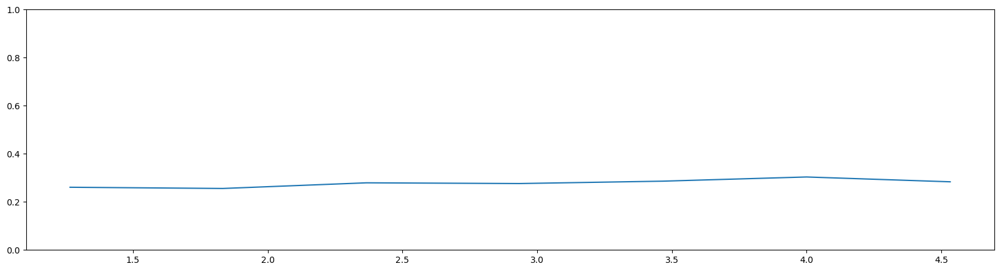

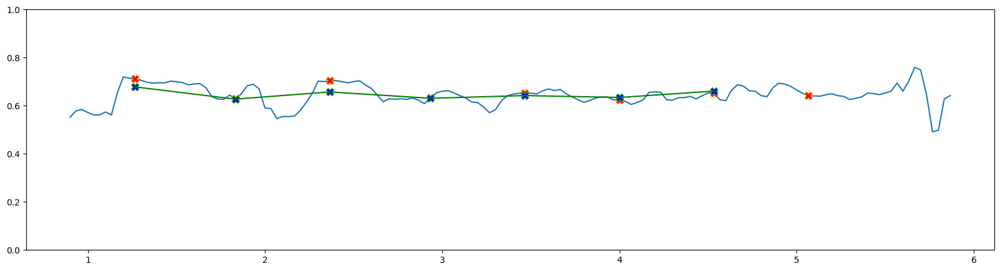

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.430271  0.620186   0.911048 -0.043192  0.900000 -0.282774    0.815834   
1    0.496001  0.671911   0.850668 -0.042521  0.933333  0.171961    0.821346   
2    0.533800  0.688093   0.821322 -0.037901  0.966667  0.071155    0.817689   
3    0.595718  0.657115   0.813143 -0.036301  1.000000  0.080752    0.814995   
4    0.680888  0.663490   0.776442 -0.032702  1.033333  0.070120    0.814657   
..        ...       ...        ...       ...       ...       ...         ...   
145  0.619946  0.678810   0.787942 -0.017642  5.733333  0.795442    0.449408   
146  0.583382  0.563091   0.712956 -0.014774  5.766667 -0.119161    0.448241   
147  0.623061  0.690480   0.706283 -0.010534  5.800000  0.178051    0.482242   
148  0.672934  0.673057   0.795526 -0.012474  5.833333 -0.267120    0.516743   
149  0.670467  0.704683   0.843603 -0.014339  5.866667  0.548050    0.529890   

     visi_shk_l  
0      0.966217  
1  

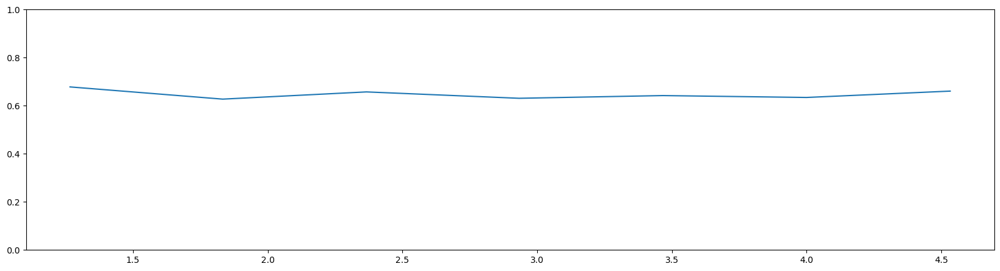

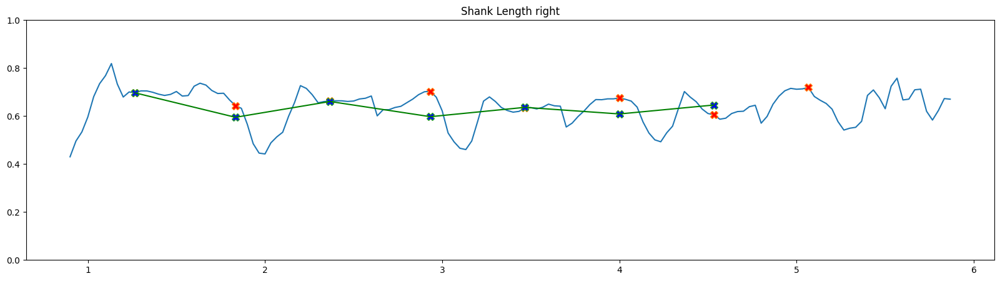

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.230649  0.218823   0.911048 -0.043192  0.900000 -0.282774     0.846688   
1    0.301802  0.221048   0.850668 -0.042521  0.933333  0.171961     0.846778   
2    0.309597  0.215680   0.821322 -0.037901  0.966667  0.071155     0.834157   
3    0.238591  0.203586   0.813143 -0.036301  1.000000  0.080752     0.818117   
4    0.229041  0.214313   0.776442 -0.032702  1.033333  0.070120     0.808216   
..        ...       ...        ...       ...       ...       ...          ...   
145  0.240972  0.258723   0.787942 -0.017642  5.733333  0.795442     0.605610   
146  0.201112  0.191938   0.712956 -0.014774  5.766667 -0.119161     0.576128   
147  0.244099  0.081933   0.706283 -0.010534  5.800000  0.178051     0.583867   
148  0.232999  0.080349   0.795526 -0.012474  5.833333 -0.267120     0.594454   
149  0.215329  0.097467   0.843603 -0.014339  5.866667  0.548050     0.582727   

     visi_foot_l  
0       

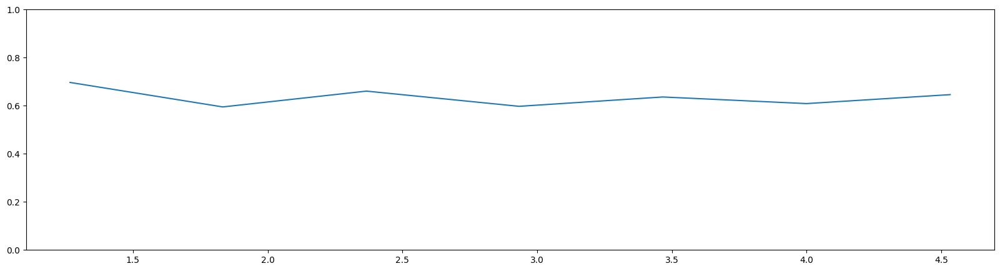

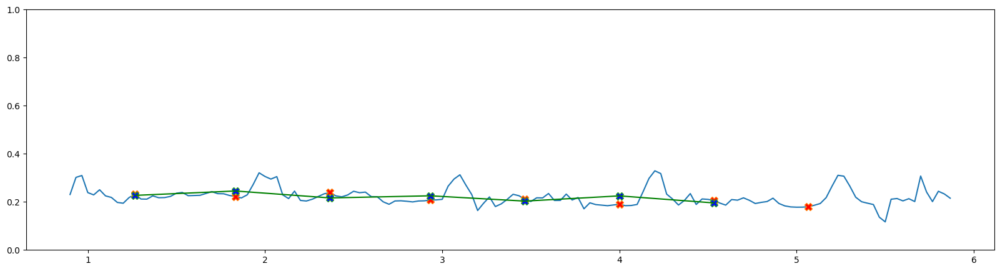

side left chamath left 3 (7, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.176522  0.600000 -0.031787  0.943979  0.983685  0.039845  0.086317   
1    0.177926  0.633333 -0.048890  0.937328  0.980315  0.043110  0.091402   
2    0.180956  0.666667 -0.045472  0.927524  0.973046  0.045628  0.094146   
3    0.186777  0.700000 -0.059506  0.920628  0.965745  0.045634  0.103685   
4    0.188537  0.733333 -0.066478  0.915056  0.956112  0.041532  0.105721   
..        ...       ...       ...       ...       ...       ...       ...   
124  0.157978  4.733333 -0.043734 -0.082368 -0.051677  0.034981  0.099184   
125  0.159341  4.766667 -0.033510 -0.080843 -0.052969  0.027882  0.096086   
126  0.170977  4.800000 -0.011442 -0.110028 -0.080634  0.031662  0.090561   
127  0.177011  4.833333 -0.017373 -0.105985 -0.071634  0.038478  0.018802   
128  0.181361  4.866667 -0.015340 -0.099902 -0.063390  0.037764  0.059201   

          sln       aln  
0    0.225723  0

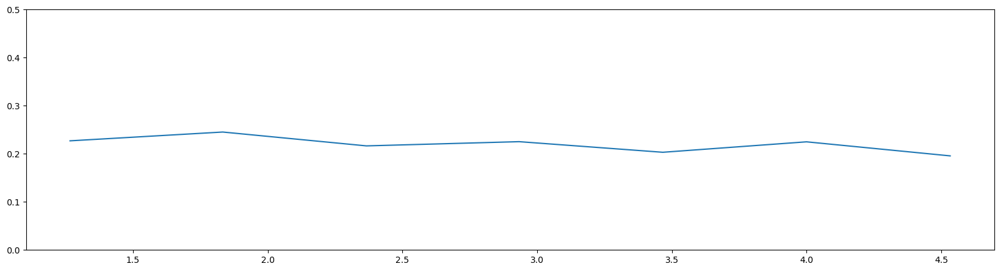

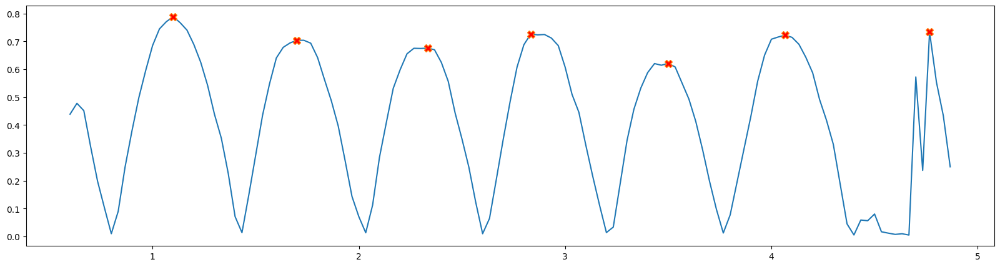

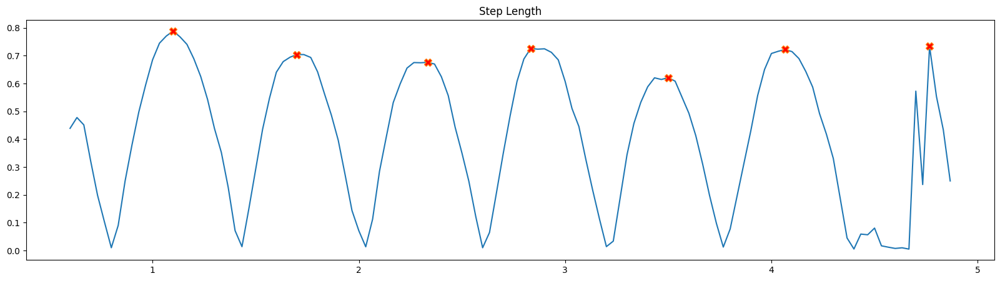

[ 15  33  52  67  87 104 125]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.071066  1.590574 -0.031787   0.878750  0.600000 -1.877112    0.010522   
1    1.304632  1.562557 -0.048890   0.889017  0.633333  0.209455    0.016462   
2    1.275406  1.505525 -0.045472   0.951942  0.666667 -0.192406    0.028052   
3    1.198258  1.446627 -0.059506   0.932970  0.700000 -0.450346    0.045013   
4    1.215494  1.414318 -0.066478   0.904779  0.733333  0.059512    0.069222   
..        ...       ...       ...        ...       ...       ...         ...   
124  1.186415  1.396959 -0.043734   0.792267  4.733333  0.204174    0.195925   
125  0.984688  1.289209 -0.033510   0.619086  4.766667  0.583733    0.228105   
126  1.010642  1.198170 -0.011442   0.777855  4.800000  0.386913    0.257100   
127  0.993017  0.955053 -0.017373   0.838482  4.833333 -0.566671    0.294712   
128  1.250110  1.240241 -0.015340   0.957936  4.866667  1.528979    0.290058   

     visi

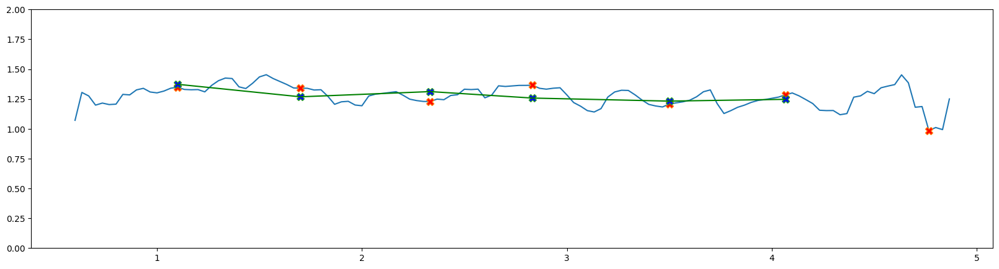

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.488988     0.598394 -0.031787  0.600000 -1.877112      0.503126   
1       0.513709     0.598960 -0.048890  0.633333  0.209455      0.509830   
2       0.520269     0.587279 -0.045472  0.666667 -0.192406      0.512106   
3       0.555124     0.580111 -0.059506  0.700000 -0.450346      0.503083   
4       0.560742     0.584754 -0.066478  0.733333  0.059512      0.482387   
..           ...          ...       ...       ...       ...           ...   
124     0.627837     0.476461 -0.043734  4.733333  0.204174      0.103582   
125     0.603021     0.491107 -0.033510  4.766667  0.583733      0.095641   
126     0.529667     0.475167 -0.011442  4.800000  0.386913      0.087859   
127     0.106222     0.430656 -0.017373  4.833333 -0.566671      0.085707   
128     0.326424     0.450126 -0.015340  4.866667  1.528979      0.081992   

     visi_l_urm_l  
0        0.971268  
1        0.973975  
2        0.9765

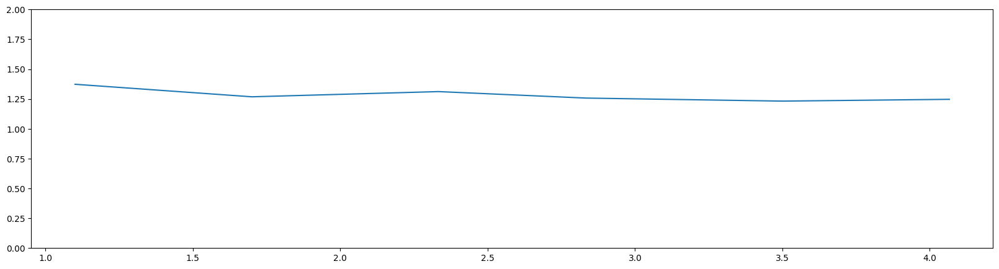

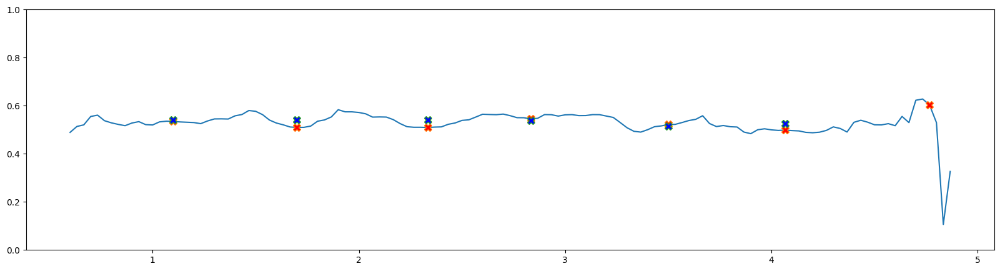

            r         l         c         t  velocity  visi_larm_r  \
0    0.424898  0.506119 -0.031787  0.600000 -1.877112     0.271917   
1    0.425667  0.646867 -0.048890  0.633333  0.209455     0.284795   
2    0.459360  0.606380 -0.045472  0.666667 -0.192406     0.299489   
3    0.443507  0.561641 -0.059506  0.700000 -0.450346     0.303113   
4    0.460931  0.559405 -0.066478  0.733333  0.059512     0.292531   
..        ...       ...       ...       ...       ...          ...   
124  0.348748  0.623578 -0.043734  4.733333  0.204174     0.009309   
125  0.346759  0.426739 -0.033510  4.766667  0.583733     0.008306   
126  0.207607  0.345480 -0.011442  4.800000  0.386913     0.007442   
127  0.328141  0.240204 -0.017373  4.833333 -0.566671     0.008056   
128  0.291782  0.256412 -0.015340  4.866667  1.528979     0.007363   

     visi_larm_l  
0       0.627364  
1       0.661410  
2       0.694139  
3       0.723869  
4       0.750706  
..           ...  
124     0.639377  
125    

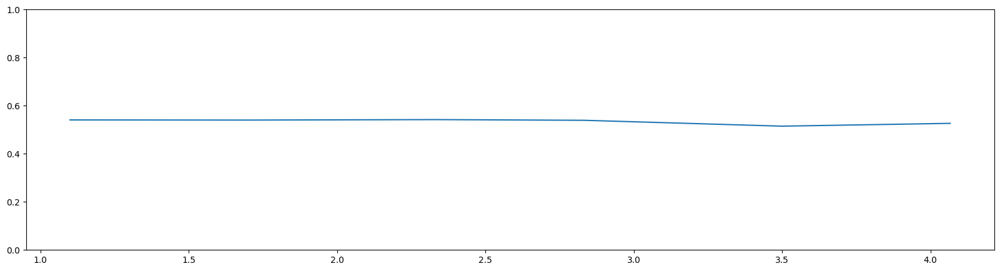

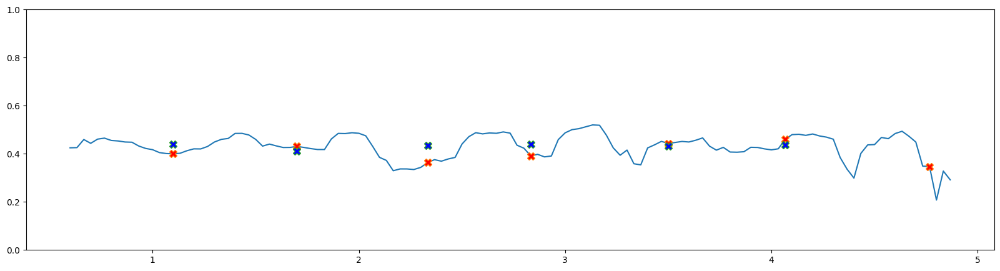

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.348507  0.321204 -0.031787  0.600000 -1.877112  0.036690  0.210160
1    0.338339  0.420553 -0.048890  0.633333  0.209455  0.041814  0.251833
2    0.331174  0.382245 -0.045472  0.666667 -0.192406  0.048728  0.297399
3    0.342003  0.366253 -0.059506  0.700000 -0.450346  0.051791  0.343184
4    0.346418  0.367391 -0.066478  0.733333  0.059512  0.048845  0.388186
..        ...       ...       ...       ...       ...       ...       ...
124  0.291526  0.301942 -0.043734  4.733333  0.204174  0.000008  0.267869
125  0.277437  0.241016 -0.033510  4.766667  0.583733  0.000006  0.277747
126  0.170768  0.223516 -0.011442  4.800000  0.386913  0.000005  0.236556
127  0.168694  0.169943 -0.017373  4.833333 -0.566671  0.000006  0.170208
128  0.153657  0.169705 -0.015340  4.866667  1.528979  0.000005  0.156407

[129 rows x 7 columns]
t1 1.1
t1 1.7
t1 2.3333333333333335
t1 2.8333333333333335
t1 3.5
t1 4.066666666666666
re

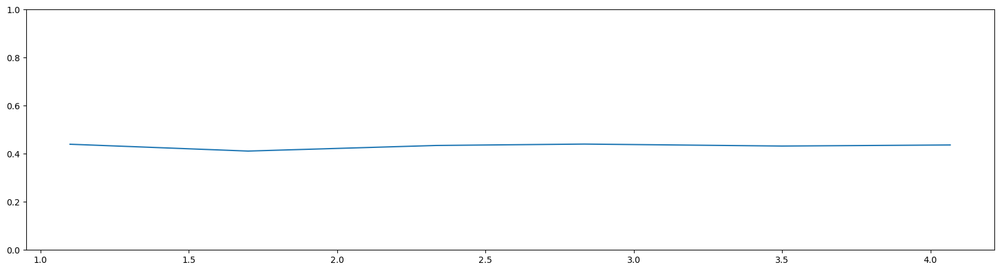

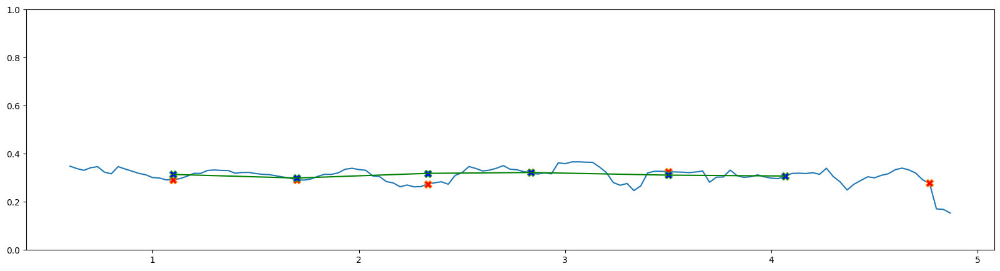

            r         l  leg_ratio         c         t  velocity  \
0    0.650953  0.740772   0.494366 -0.031787  0.600000 -1.877112   
1    0.669971  0.753609   0.784551 -0.048890  0.633333  0.209455   
2    0.726463  0.763137   0.739430 -0.045472  0.666667 -0.192406   
3    0.701747  0.752164   0.714958 -0.059506  0.700000 -0.450346   
4    0.662603  0.732337   0.810714 -0.066478  0.733333  0.059512   
..        ...       ...        ...       ...       ...       ...   
124  0.590955  0.745904   0.914608 -0.043734  4.733333  0.204174   
125  0.402547  0.650228   0.911045 -0.033510  4.766667  0.583733   
126  0.498219  0.640503   0.918871 -0.011442  4.800000  0.386913   
127  0.517507  0.617195   1.407429 -0.017373  4.833333 -0.566671   
128  0.630768  0.658466   1.064572 -0.015340  4.866667  1.528979   

     visi_thigh_r  visi_thigh_l  
0        0.189795      0.790527  
1        0.220232      0.808004  
2        0.265725      0.826522  
3        0.316375      0.843267  
4        0.37

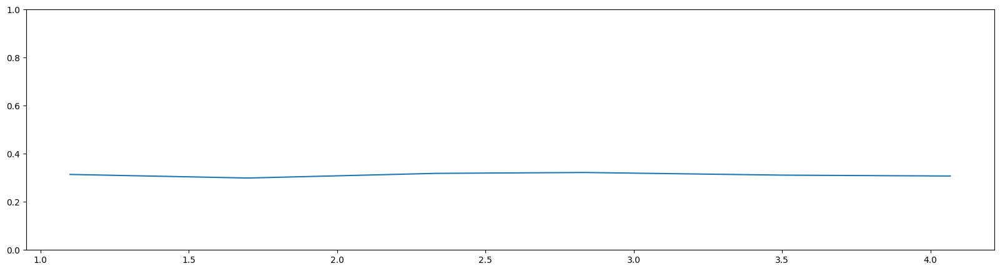

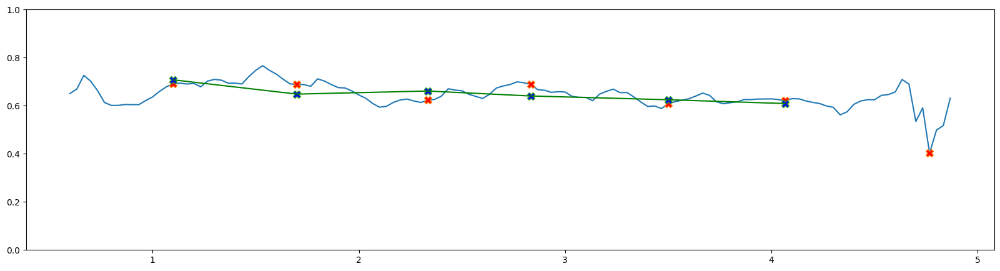

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.420113  0.849802   0.878750 -0.031787  0.600000 -1.877112    0.055437   
1    0.634661  0.808948   0.889017 -0.048890  0.633333  0.209455    0.074748   
2    0.548943  0.742387   0.951942 -0.045472  0.666667 -0.192406    0.105567   
3    0.496511  0.694463   0.932970 -0.059506  0.700000 -0.450346    0.142278   
4    0.552891  0.681980   0.904779 -0.066478  0.733333  0.059512    0.185622   
..        ...       ...        ...       ...       ...       ...         ...   
124  0.595460  0.651055   0.792267 -0.043734  4.733333  0.204174    0.373424   
125  0.582141  0.638981   0.619086 -0.033510  4.766667  0.583733    0.408784   
126  0.512423  0.557666   0.777855 -0.011442  4.800000  0.386913    0.438936   
127  0.475510  0.337858   0.838482 -0.017373  4.833333 -0.566671    0.475666   
128  0.619342  0.581775   0.957936 -0.015340  4.866667  1.528979    0.468983   

     visi_shk_l  
0      0.726030  
1  

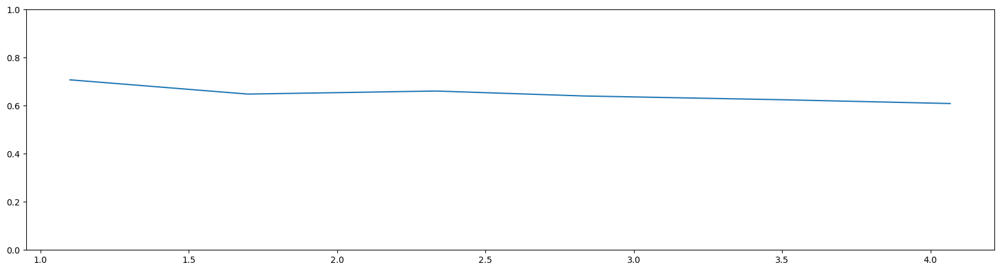

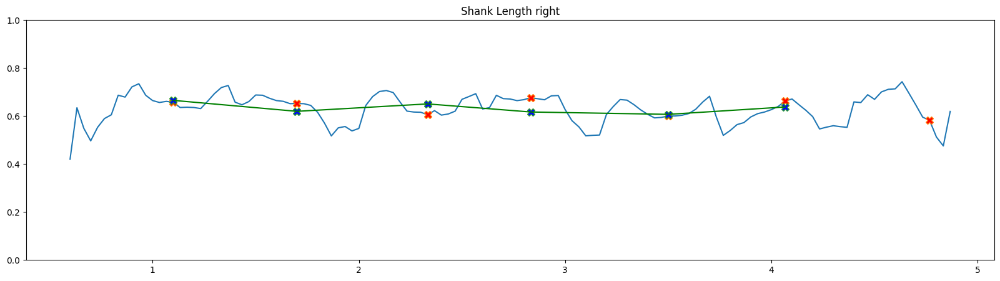

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.214116  0.256909   0.878750 -0.031787  0.600000 -1.877112     0.215928   
1    0.247794  0.270060   0.889017 -0.048890  0.633333  0.209455     0.253575   
2    0.278608  0.263189   0.951942 -0.045472  0.666667 -0.192406     0.301949   
3    0.301204  0.252301   0.932970 -0.059506  0.700000 -0.450346     0.348327   
4    0.307392  0.244118   0.904779 -0.066478  0.733333  0.059512     0.391518   
..        ...       ...        ...       ...       ...       ...          ...   
124  0.356354  0.247609   0.792267 -0.043734  4.733333  0.204174     0.530923   
125  0.203635  0.253391   0.619086 -0.033510  4.766667  0.583733     0.549094   
126  0.248559  0.164742   0.777855 -0.011442  4.800000  0.386913     0.550373   
127  0.180331  0.146334   0.838482 -0.017373  4.833333 -0.566671     0.560912   
128  0.139443  0.087228   0.957936 -0.015340  4.866667  1.528979     0.529018   

     visi_foot_l  
0       

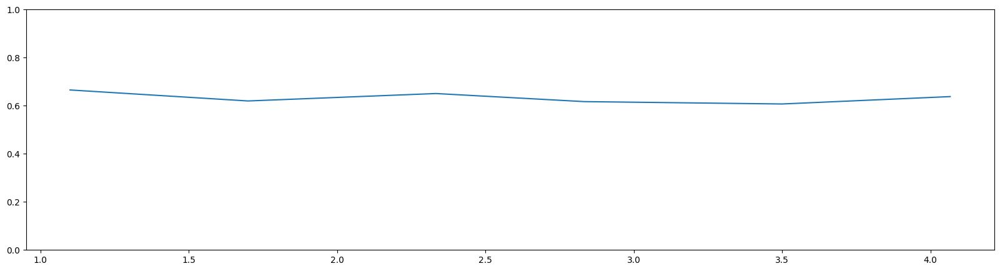

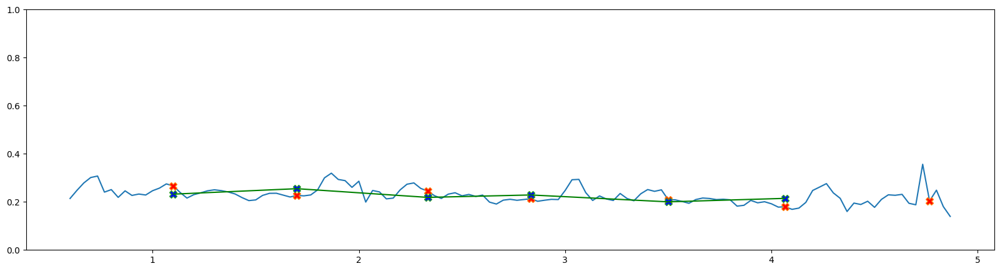

side left chamod left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.187585  0.600000 -0.033747  0.940895  0.985059  0.044208  0.083040   
1    0.170272  0.633333 -0.038297  0.937296  0.981930  0.044768  0.086842   
2    0.168038  0.666667 -0.035106  0.931293  0.976559  0.045413  0.088711   
3    0.171399  0.700000 -0.042196  0.926664  0.968534  0.041871  0.089729   
4    0.173797  0.733333 -0.047813  0.921407  0.961060  0.039685  0.090359   
..        ...       ...       ...       ...       ...       ...       ...   
126  0.183187  4.800000 -0.013650  0.043631  0.004944  0.040312  0.089902   
127  0.183522  4.833333 -0.019153  0.036763  0.000571  0.037022  0.079575   
128  0.181765  4.866667 -0.020135  0.029272 -0.011934  0.041761  0.084515   
129  0.180961  4.900000 -0.027649  0.023562 -0.014294  0.038365  0.083884   
130  0.177620  4.933333 -0.027561  0.020374 -0.025931  0.046684  0.078789   

          sln       aln  
0    0.235668  0.

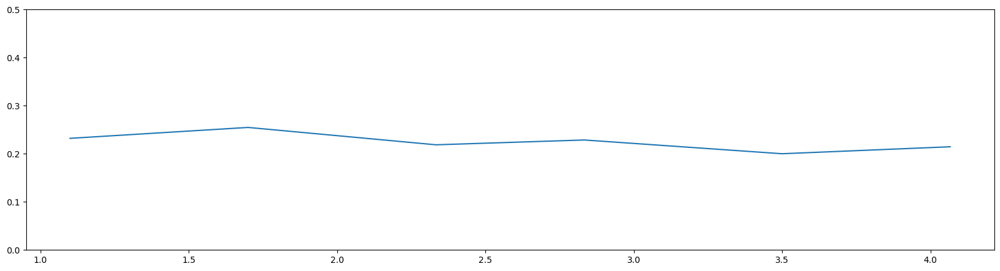

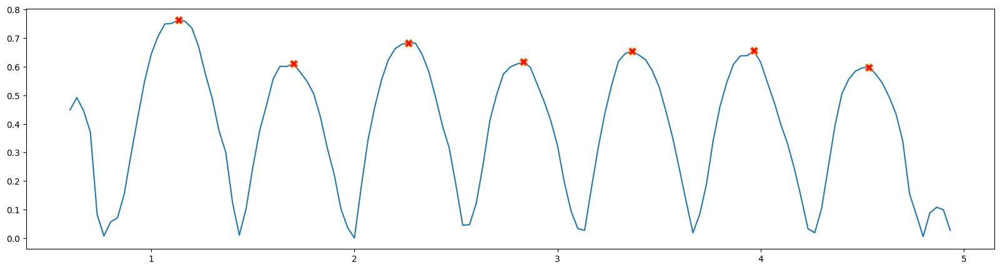

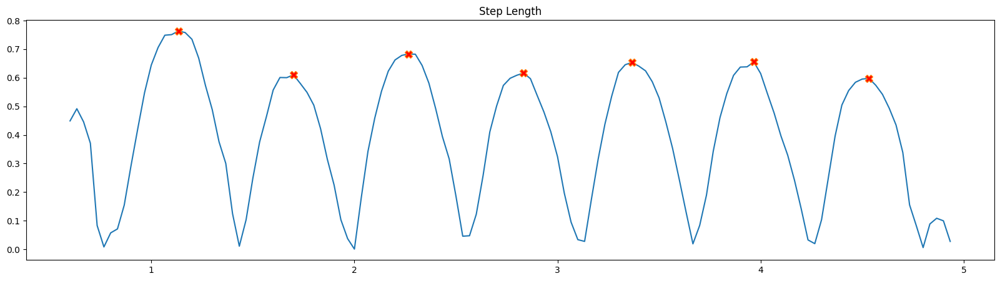

[ 16  33  50  67  83 101 118]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.035199  1.180268 -0.033747   1.038138  0.600000 -0.784488    0.256865   
1    1.280021  1.410014 -0.038297   1.012493  0.633333  0.186579    0.272219   
2    1.319743  1.414219 -0.035106   1.014730  0.666667 -0.084063    0.289826   
3    1.237159  1.360232 -0.042196   1.024972  0.700000 -0.235477    0.310595   
4    1.218447  1.199908 -0.047813   0.997857  0.733333 -0.128783    0.340704   
..        ...       ...       ...        ...       ...       ...         ...   
126  1.195773  1.140670 -0.013650   0.962287  4.800000  0.037745    0.471655   
127  1.174364  1.054874 -0.019153   1.096922  4.833333 -0.148448    0.476823   
128  1.224933  1.031470 -0.020135   1.159018  4.866667 -0.055743    0.472047   
129  1.252141  0.882283 -0.027649   1.435768  4.900000 -0.326641    0.474469   
130  1.299425  1.141259 -0.027561   1.277988  4.933333  0.693988    0.438971   

     visi

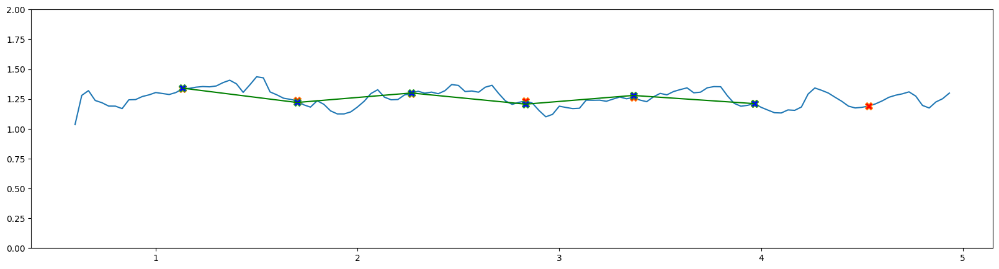

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.442678     0.553909 -0.033747  0.600000 -0.784488      0.213262   
1       0.510017     0.599432 -0.038297  0.633333  0.186579      0.225953   
2       0.527924     0.606400 -0.035106  0.666667 -0.084063      0.224597   
3       0.523509     0.593662 -0.042196  0.700000 -0.235477      0.210195   
4       0.519910     0.595298 -0.047813  0.733333 -0.128783      0.193194   
..           ...          ...       ...       ...       ...           ...   
126     0.490767     0.526995 -0.013650  4.800000  0.037745      0.274836   
127     0.433600     0.502107 -0.019153  4.833333 -0.148448      0.250497   
128     0.464972     0.472031 -0.020135  4.866667 -0.055743      0.228011   
129     0.463545     0.479373 -0.027649  4.900000 -0.326641      0.208482   
130     0.443582     0.458655 -0.027561  4.933333  0.693988      0.190844   

     visi_l_urm_l  
0        0.996066  
1        0.996368  
2        0.9965

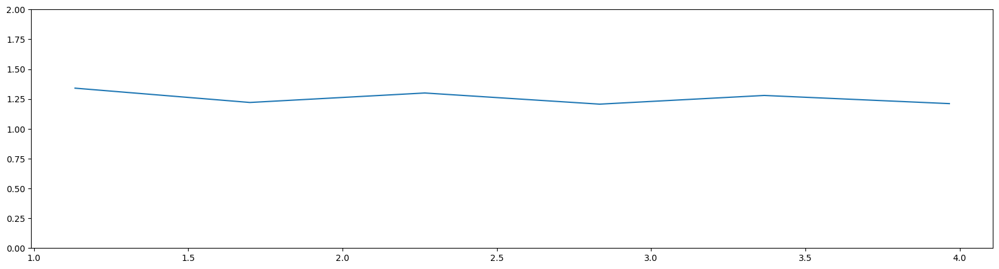

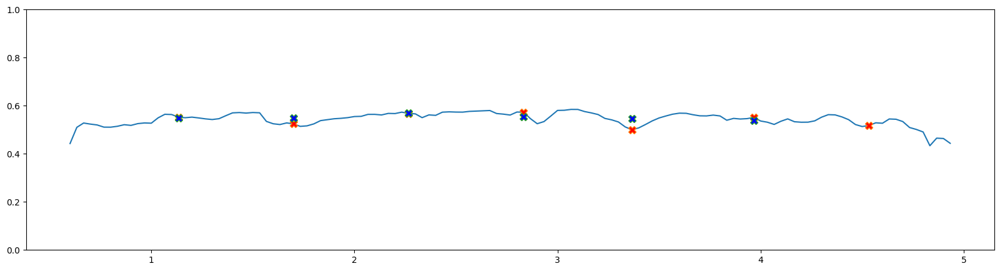

            r         l         c         t  velocity  visi_larm_r  \
0    0.401946  0.528817 -0.033747  0.600000 -0.784488     0.086569   
1    0.465463  0.598742 -0.038297  0.633333  0.186579     0.094384   
2    0.455133  0.599861 -0.035106  0.666667 -0.084063     0.096221   
3    0.449095  0.567687 -0.042196  0.700000 -0.235477     0.085245   
4    0.425355  0.549920 -0.047813  0.733333 -0.128783     0.072958   
..        ...       ...       ...       ...       ...          ...   
126  0.357882  0.279272 -0.013650  4.800000  0.037745     0.070885   
127  0.308968  0.287925 -0.019153  4.833333 -0.148448     0.058541   
128  0.274141  0.166504 -0.020135  4.866667 -0.055743     0.048184   
129  0.240848  0.111433 -0.027649  4.900000 -0.326641     0.039827   
130  0.193654  0.123876 -0.027561  4.933333  0.693988     0.033038   

     visi_larm_l  
0       0.980992  
1       0.982334  
2       0.983194  
3       0.982367  
4       0.982535  
..           ...  
126     0.784180  
127    

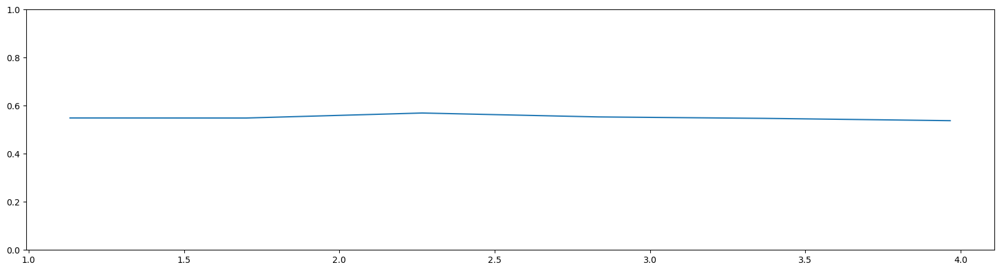

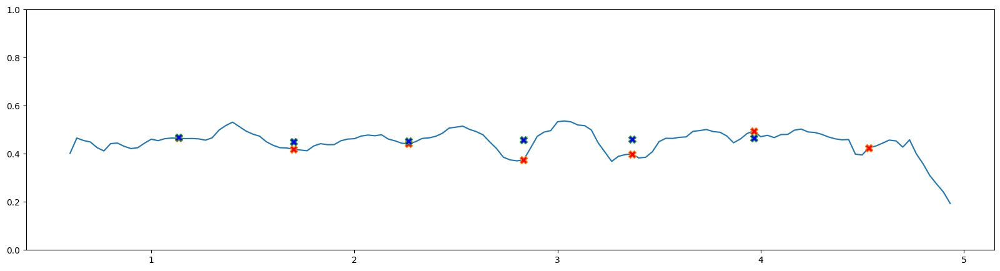

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.293931  0.341251 -0.033747  0.600000 -0.784488  0.003044  0.928545
1    0.309878  0.351394 -0.038297  0.633333  0.186579  0.003709  0.933400
2    0.310100  0.348313 -0.035106  0.666667 -0.084063  0.003971  0.936523
3    0.292642  0.341384 -0.042196  0.700000 -0.235477  0.002981  0.933602
4    0.289658  0.329390 -0.047813  0.733333 -0.128783  0.002052  0.933912
..        ...       ...       ...       ...       ...       ...       ...
126  0.247734  0.184496 -0.013650  4.800000  0.037745  0.001108  0.497762
127  0.192929  0.189185 -0.019153  4.833333 -0.148448  0.000686  0.368549
128  0.189776  0.120804 -0.020135  4.866667 -0.055743  0.000421  0.265802
129  0.173086  0.134226 -0.027649  4.900000 -0.326641  0.000260  0.197446
130  0.157135  0.116354 -0.027561  4.933333  0.693988  0.000162  0.147821

[131 rows x 7 columns]
t1 1.1333333333333333
t1 1.7
t1 2.2666666666666666
t1 2.8333333333333335
t1 3.3666666666

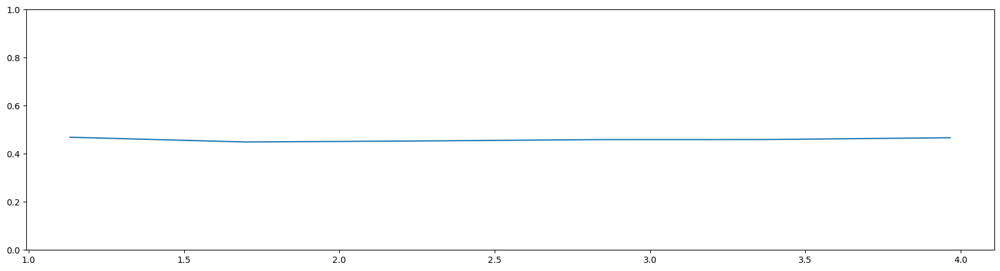

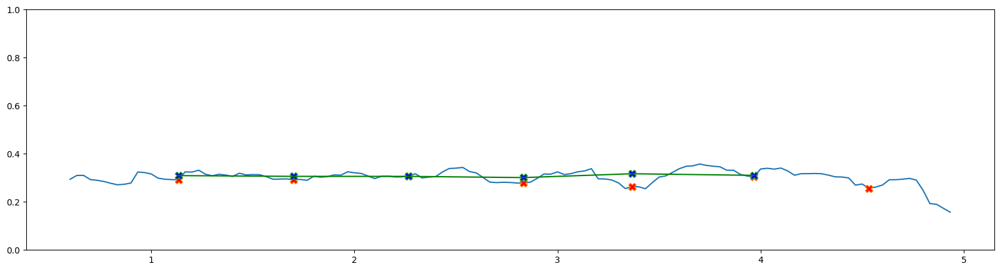

            r         l  leg_ratio         c         t  velocity  \
0    0.584985  0.563495   0.729950 -0.033747  0.600000 -0.784488   
1    0.687696  0.679211   0.810512 -0.038297  0.633333  0.186579   
2    0.693321  0.683257   0.856982 -0.035106  0.666667 -0.084063   
3    0.671707  0.655342   0.802184 -0.042196  0.700000 -0.235477   
4    0.652526  0.653928   1.036523 -0.047813  0.733333 -0.128783   
..        ...       ...        ...       ...       ...       ...   
126  0.582045  0.604855   1.145411 -0.013650  4.800000  0.037745   
127  0.540964  0.493165   1.127630 -0.019153  4.833333 -0.148448   
128  0.564889  0.487386   1.213129 -0.020135  4.866667 -0.055743   
129  0.577759  0.402404   1.405318 -0.027649  4.900000 -0.326641   
130  0.610569  0.477758   1.038214 -0.027561  4.933333  0.693988   

     visi_thigh_r  visi_thigh_l  
0        0.582327      0.900862  
1        0.593062      0.908595  
2        0.605664      0.912694  
3        0.621321      0.916070  
4        0.64

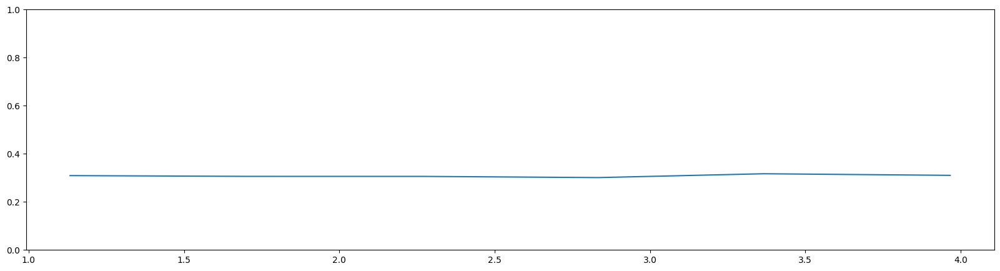

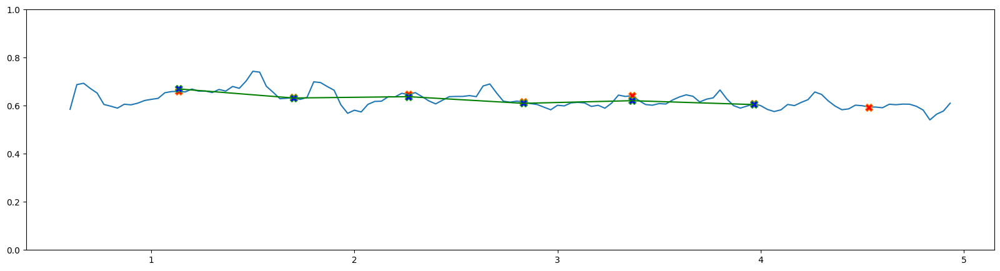

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.450214  0.616774   1.038138 -0.033747  0.600000 -0.784488    0.441101   
1    0.592325  0.730803   1.012493 -0.038297  0.633333  0.186579    0.459006   
2    0.626421  0.730962   1.014730 -0.035106  0.666667 -0.084063    0.478525   
3    0.565452  0.704890   1.024972 -0.042196  0.700000 -0.235477    0.499894   
4    0.565921  0.545980   0.997857 -0.047813  0.733333 -0.128783    0.528065   
..        ...       ...        ...       ...       ...       ...         ...   
126  0.613728  0.535815   0.962287 -0.013650  4.800000  0.037745    0.658505   
127  0.633400  0.561709   1.096922 -0.019153  4.833333 -0.148448    0.659569   
128  0.660044  0.544084   1.159018 -0.020135  4.866667 -0.055743    0.654019   
129  0.674382  0.479878   1.435768 -0.027649  4.900000 -0.326641    0.653939   
130  0.688856  0.663501   1.277988 -0.027561  4.933333  0.693988    0.622584   

     visi_shk_l  
0      0.867473  
1  

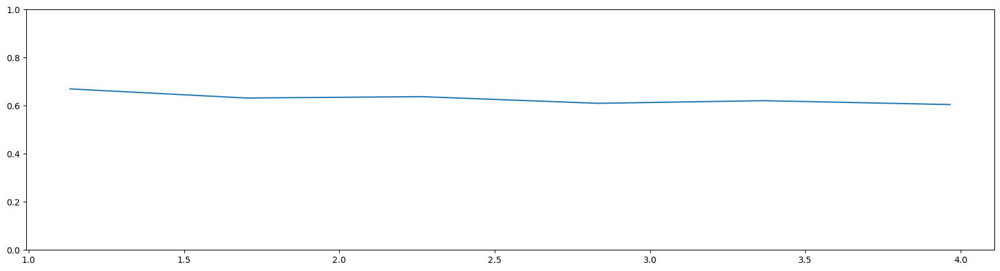

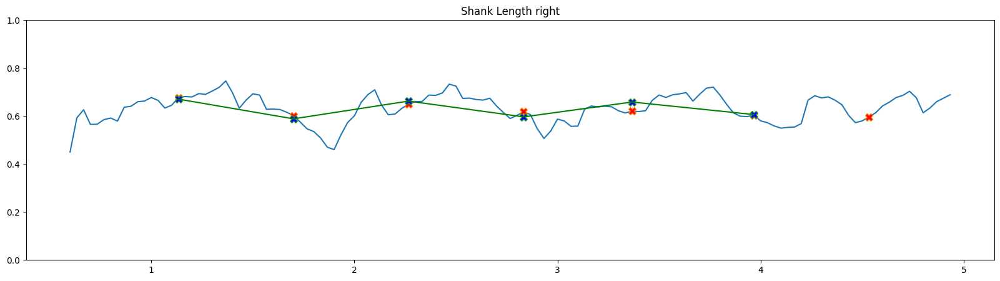

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.167815  0.213293   1.038138 -0.033747  0.600000 -0.784488     0.663057   
1    0.228577  0.240961   1.012493 -0.038297  0.633333  0.186579     0.682565   
2    0.415218  0.207015   1.014730 -0.035106  0.666667 -0.084063     0.700537   
3    0.342760  0.195254   1.024972 -0.042196  0.700000 -0.235477     0.717584   
4    0.265164  0.196845   0.997857 -0.047813  0.733333 -0.128783     0.732060   
..        ...       ...        ...       ...       ...       ...          ...   
126  0.178429  0.327798   0.962287 -0.013650  4.800000  0.037745     0.859038   
127  0.158856  0.230362   1.096922 -0.019153  4.833333 -0.148448     0.834525   
128  0.147366  0.120100   1.159018 -0.020135  4.866667 -0.055743     0.812061   
129  0.174170  0.146100   1.435768 -0.027649  4.900000 -0.326641     0.797349   
130  0.187043  0.148198   1.277988 -0.027561  4.933333  0.693988     0.757611   

     visi_foot_l  
0       

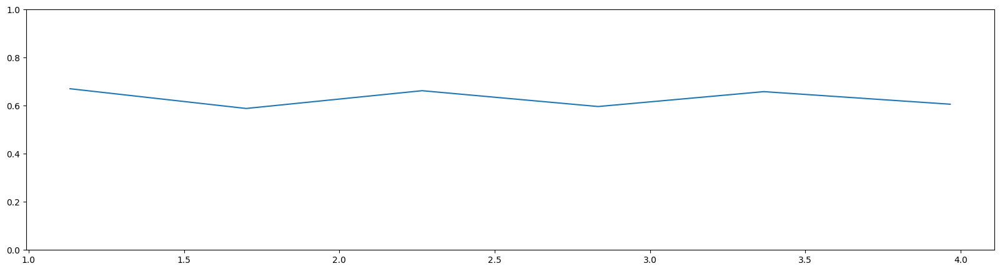

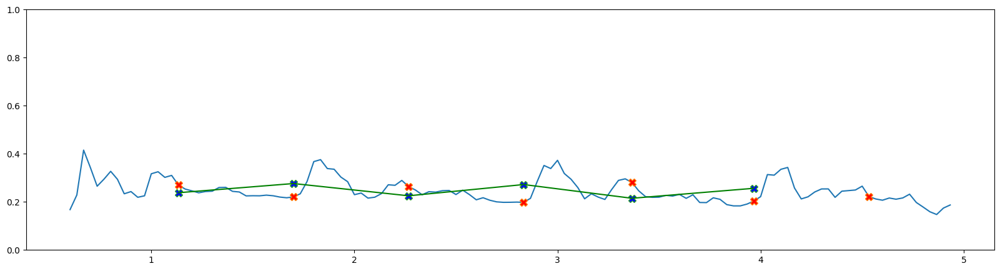

side left yohan left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.186919  0.600000 -0.035683  0.938527  0.978182  0.046108  0.090237   
1    0.185330  0.633333 -0.031474  0.934466  0.977183  0.048165  0.091099   
2    0.183228  0.666667 -0.031952  0.926516  0.970507  0.049918  0.092460   
3    0.183502  0.700000 -0.031379  0.918423  0.963320  0.050839  0.093474   
4    0.184074  0.733333 -0.031012  0.910331  0.956917  0.051826  0.093554   
..        ...       ...       ...       ...       ...       ...       ...   
128  0.198198  4.866667 -0.016277  0.055233 -0.000242  0.056712  0.097599   
129  0.199560  4.900000 -0.001084  0.047001 -0.002057  0.050831  0.097196   
130  0.200065  4.933333  0.000700  0.038855 -0.009260  0.050740  0.097569   
131  0.201782  4.966667 -0.009939  0.031084 -0.025582  0.059651  0.097800   
132  0.202285  5.000000  0.000848  0.024899 -0.029916  0.058253  0.096443   

          sln       aln  
0    0.246671  0.4

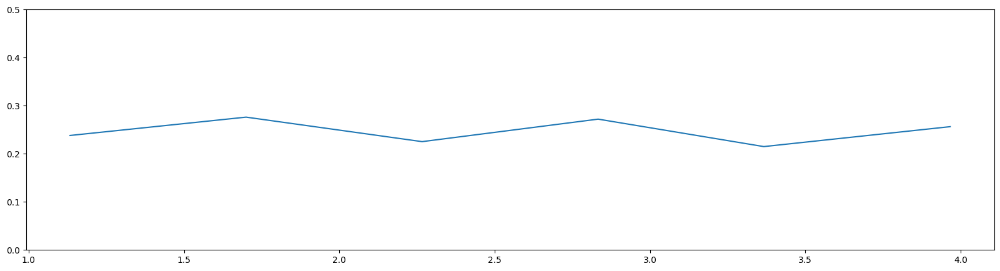

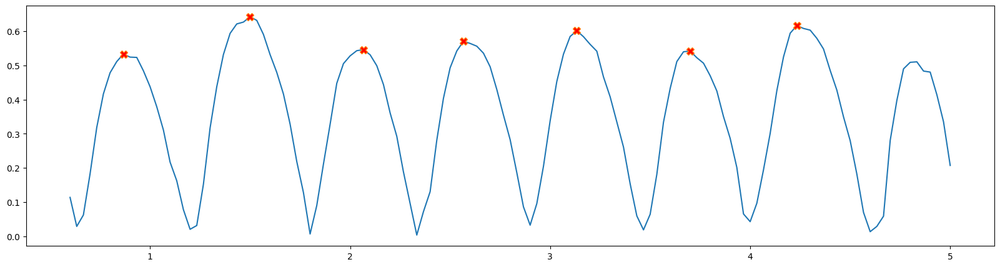

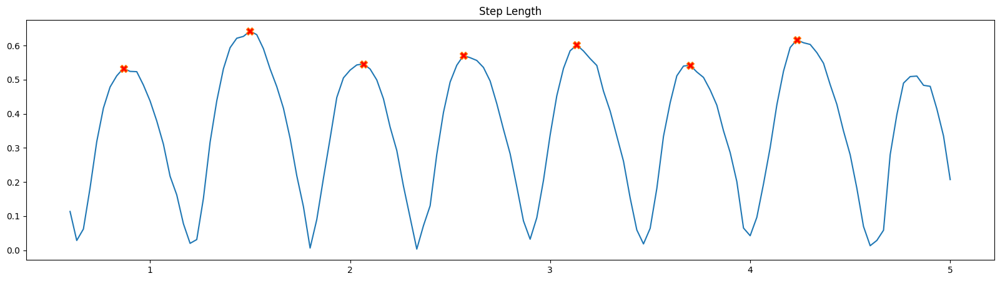

[  8  27  44  59  76  93 109]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.378652  1.440082 -0.035683   0.938378  0.600000  0.342216    0.129708   
1    1.394732  1.442588 -0.031474   0.957603  0.633333 -0.002038    0.130124   
2    1.473077  1.469521 -0.031952   0.981540  0.666667  0.001731    0.149001   
3    1.507582  1.513263 -0.031379   1.008930  0.700000  0.013186    0.168396   
4    1.496467  1.531641 -0.031012   1.007735  0.733333  0.034162    0.180399   
..        ...       ...       ...        ...       ...       ...         ...   
128  1.326619  1.449611 -0.016277   0.883199  4.866667  0.341075    0.538366   
129  1.347311  1.404979 -0.001084   0.871055  4.900000  0.365856    0.548785   
130  1.341911  1.369179  0.000700   0.896529  4.933333 -0.236073    0.520617   
131  1.335830  1.290167 -0.009939   0.928000  4.966667 -0.232544    0.459070   
132  1.279935  1.229873  0.000848   1.004915  5.000000  1.179603    0.409679   

     visi

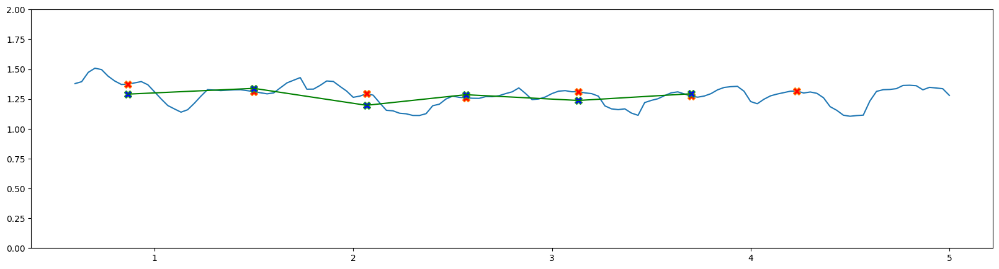

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.482759     0.547202 -0.035683  0.600000  0.342216      0.240906   
1       0.491551     0.559661 -0.031474  0.633333 -0.002038      0.254647   
2       0.504618     0.561224 -0.031952  0.666667  0.001731      0.281252   
3       0.509387     0.562092 -0.031379  0.700000  0.013186      0.311132   
4       0.508243     0.561633 -0.031012  0.733333  0.034162      0.339116   
..           ...          ...       ...       ...       ...           ...   
128     0.492433     0.404483 -0.016277  4.866667  0.341075      0.561081   
129     0.487052     0.403835 -0.001084  4.900000  0.365856      0.583829   
130     0.487687     0.287744  0.000700  4.933333 -0.236073      0.594391   
131     0.484681     0.236349 -0.009939  4.966667 -0.232544      0.583133   
132     0.476768     0.281177  0.000848  5.000000  1.179603      0.554758   

     visi_l_urm_l  
0        0.999051  
1        0.999118  
2        0.9991

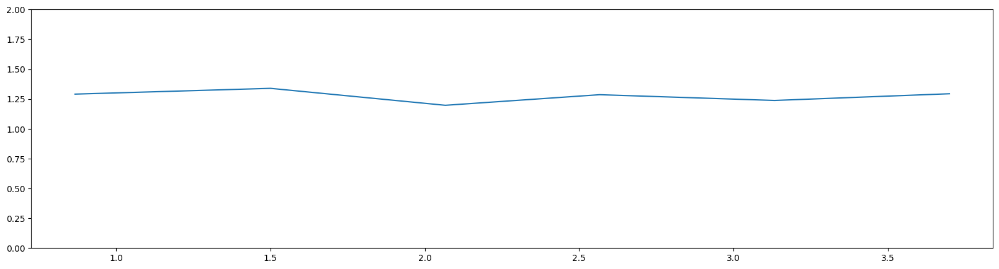

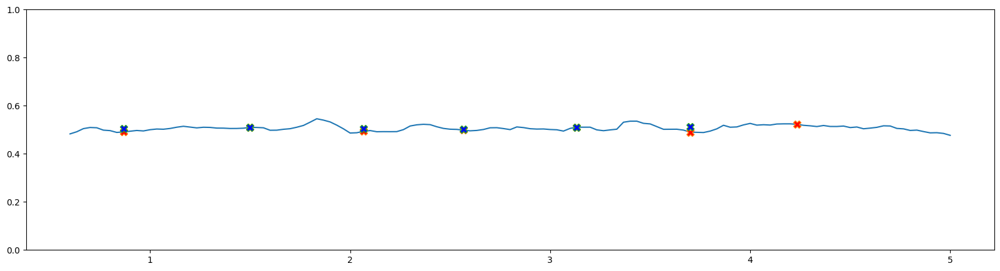

            r         l         c         t  velocity  visi_larm_r  \
0    0.448695  0.566500 -0.035683  0.600000  0.342216     0.123281   
1    0.428373  0.562071 -0.031474  0.633333 -0.002038     0.137306   
2    0.422937  0.566779 -0.031952  0.666667  0.001731     0.161076   
3    0.411988  0.565307 -0.031379  0.700000  0.013186     0.187630   
4    0.403453  0.559209 -0.031012  0.733333  0.034162     0.213021   
..        ...       ...       ...       ...       ...          ...   
128  0.481520  0.017028 -0.016277  4.866667  0.341075     0.229405   
129  0.470317  0.059619 -0.001084  4.900000  0.365856     0.240864   
130  0.464604  0.088320  0.000700  4.933333 -0.236073     0.241164   
131  0.457344  0.134980 -0.009939  4.966667 -0.232544     0.229137   
132  0.459146  0.014759  0.000848  5.000000  1.179603     0.209157   

     visi_larm_l  
0       0.994395  
1       0.994814  
2       0.995265  
3       0.995655  
4       0.996016  
..           ...  
128     0.709576  
129    

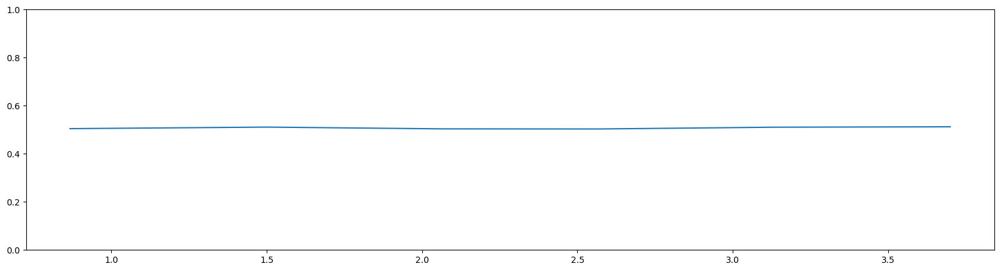

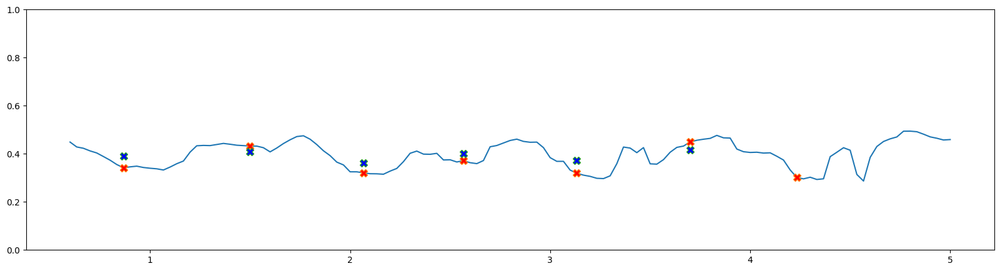

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.297203  0.363209 -0.035683  0.600000  0.342216  0.007329  0.975435
1    0.302564  0.357359 -0.031474  0.633333 -0.002038  0.009604  0.977234
2    0.300785  0.356031 -0.031952  0.666667  0.001731  0.014059  0.979154
3    0.303005  0.355012 -0.031379  0.700000  0.013186  0.020118  0.980825
4    0.299721  0.353574 -0.031012  0.733333  0.034162  0.026997  0.982365
..        ...       ...       ...       ...       ...       ...       ...
128  0.305405  0.121117 -0.016277  4.866667  0.341075  0.017609  0.334768
129  0.299953  0.121579 -0.001084  4.900000  0.365856  0.019435  0.237140
130  0.300201  0.135277  0.000700  4.933333 -0.236073  0.019387  0.165205
131  0.297941  0.146928 -0.009939  4.966667 -0.232544  0.017312  0.109718
132  0.295867  0.096160  0.000848  5.000000  1.179603  0.014020  0.072385

[133 rows x 7 columns]
t1 0.8666666666666667
t1 1.5
t1 2.066666666666667
t1 2.566666666666667
t1 3.133333333333

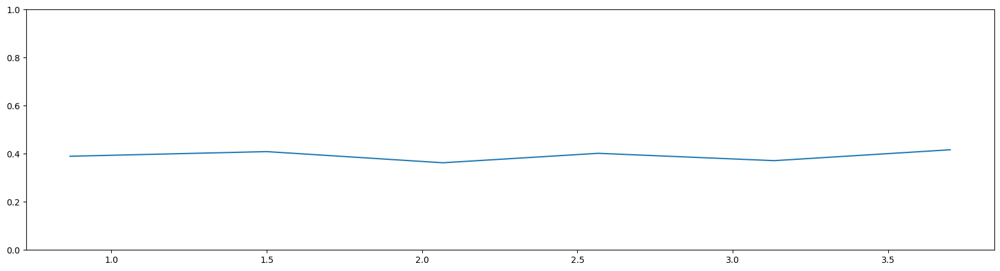

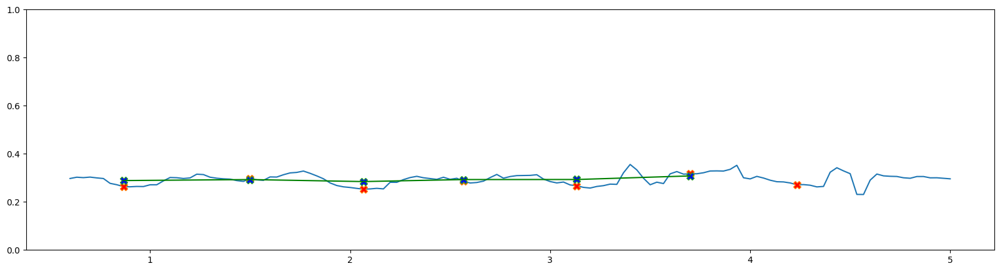

            r         l  leg_ratio         c         t  velocity  \
0    0.707974  0.754465   0.978213 -0.035683  0.600000  0.342216   
1    0.721820  0.753778   0.976919 -0.031474  0.633333 -0.002038   
2    0.749774  0.763875   1.025023 -0.031952  0.666667  0.001731   
3    0.776165  0.769295   0.983130 -0.031379  0.700000  0.013186   
4    0.772778  0.766846   0.946252 -0.031012  0.733333  0.034162   
..        ...       ...        ...       ...       ...       ...   
128  0.641200  0.725997   0.947216 -0.016277  4.866667  0.341075   
129  0.620471  0.712321   1.049349 -0.001084  4.900000  0.365856   
130  0.623852  0.695853   1.066435  0.000700  4.933333 -0.236073   
131  0.640711  0.690421   1.159023 -0.009939  4.966667 -0.232544   
132  0.637898  0.634778   1.078881  0.000848  5.000000  1.179603   

     visi_thigh_r  visi_thigh_l  
0        0.455822      0.944316  
1        0.454768      0.949000  
2        0.476395      0.953985  
3        0.496512      0.958432  
4        0.50

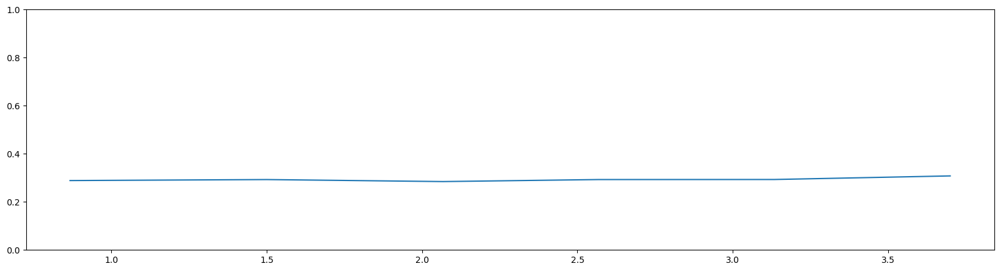

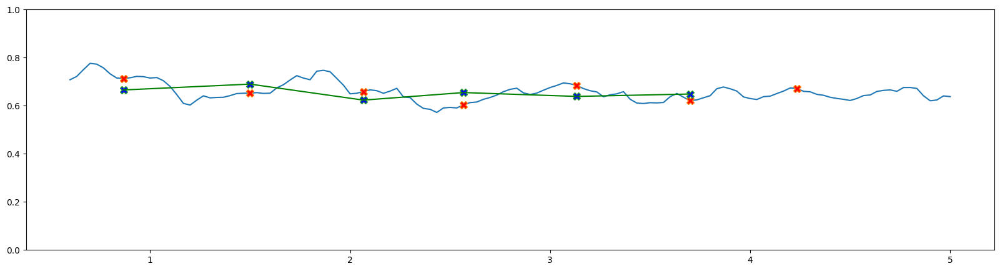

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.670679  0.685616   0.938378 -0.035683  0.600000  0.342216    0.284557   
1    0.672912  0.688810   0.957603 -0.031474  0.633333 -0.002038    0.286132   
2    0.723303  0.705645   0.981540 -0.031952  0.666667  0.001731    0.312768   
3    0.731417  0.743968   1.008930 -0.031379  0.700000  0.013186    0.339158   
4    0.723689  0.764796   1.007735 -0.031012  0.733333  0.034162    0.356689   
..        ...       ...        ...       ...       ...       ...         ...   
128  0.685419  0.723614   0.883199 -0.016277  4.866667  0.341075    0.698292   
129  0.726839  0.692657   0.871055 -0.001084  4.900000  0.365856    0.706369   
130  0.718058  0.673326   0.896529  0.000700  4.933333 -0.236073    0.686793   
131  0.695120  0.599746   0.928000 -0.009939  4.966667 -0.232544    0.639507   
132  0.642036  0.595095   1.004915  0.000848  5.000000  1.179603    0.596430   

     visi_shk_l  
0      0.913602  
1  

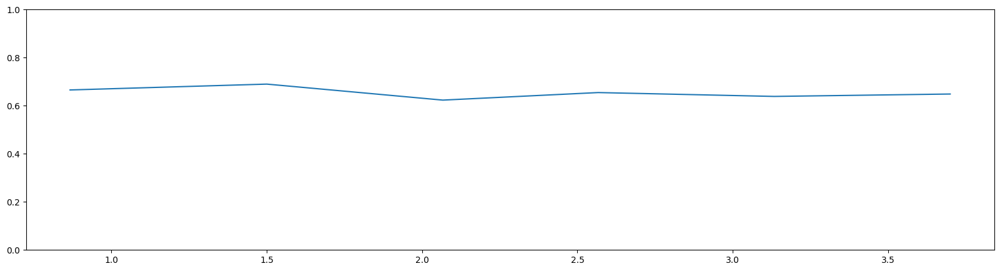

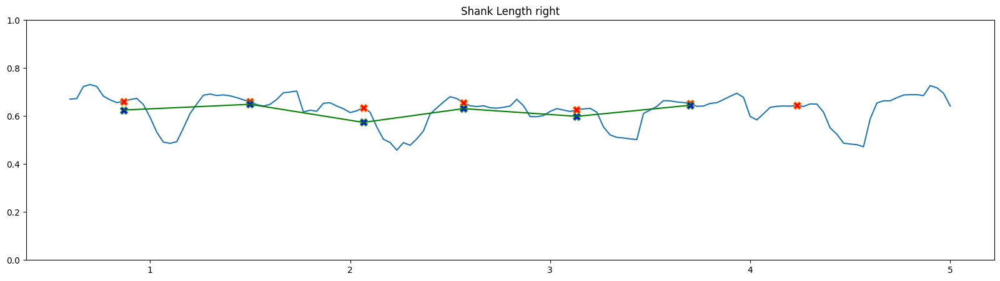

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.226760  0.265577   0.938378 -0.035683  0.600000  0.342216     0.479207   
1    0.234218  0.271215   0.957603 -0.031474  0.633333 -0.002038     0.492925   
2    0.252225  0.260755   0.981540 -0.031952  0.666667  0.001731     0.525001   
3    0.248961  0.260717   1.008930 -0.031379  0.700000  0.013186     0.556353   
4    0.249488  0.215693   1.007735 -0.031012  0.733333  0.034162     0.584588   
..        ...       ...        ...       ...       ...       ...          ...   
128  0.077408  0.251666   0.883199 -0.016277  4.866667  0.341075     0.806748   
129  0.122586  0.251915   0.871055 -0.001084  4.900000  0.365856     0.805342   
130  0.174032  0.263916   0.896529  0.000700  4.933333 -0.236073     0.789050   
131  0.165651  0.318383   0.928000 -0.009939  4.966667 -0.232544     0.757895   
132  0.180017  0.314552   1.004915  0.000848  5.000000  1.179603     0.722975   

     visi_foot_l  
0       

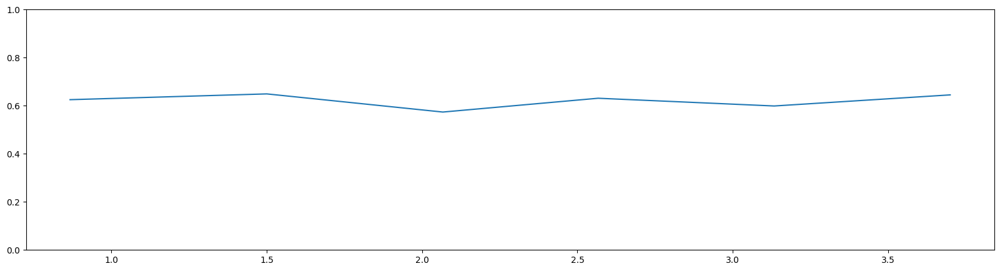

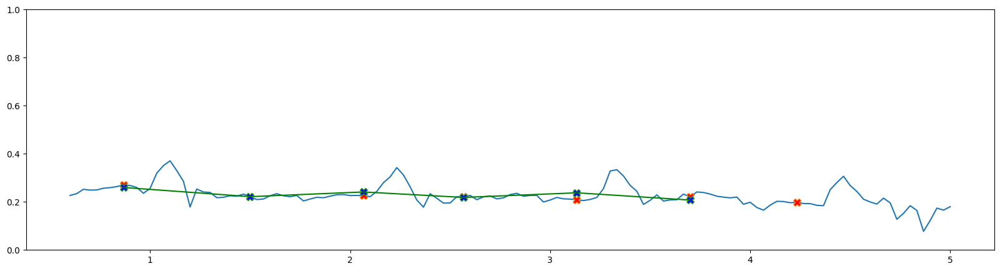

side left dasith left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.175500  0.566667 -0.038085  0.956942  0.966385  0.011242  0.084579   
1    0.167645  0.600000 -0.040049  0.951375  0.962184  0.013167  0.085370   
2    0.169139  0.633333 -0.031371  0.941996  0.954597  0.015749  0.084504   
3    0.169713  0.666667 -0.026615  0.933153  0.946655  0.015320  0.082358   
4    0.169967  0.700000 -0.028202  0.922959  0.939900  0.017688  0.084251   
..        ...       ...       ...       ...       ...       ...       ...   
128  0.175122  4.833333 -0.016942  0.043847  0.012803  0.032053  0.091820   
129  0.171382  4.866667 -0.013705  0.035695  0.008126  0.028651  0.091536   
130  0.166924  4.900000 -0.005493  0.029750  0.001962  0.028136  0.087352   
131  0.165902  4.933333  0.001679  0.022812 -0.012905  0.035783  0.086650   
132  0.164377  4.966667 -0.004611  0.014525 -0.001264  0.015853  0.085293   

          sln       aln  
0    0.064056  0.

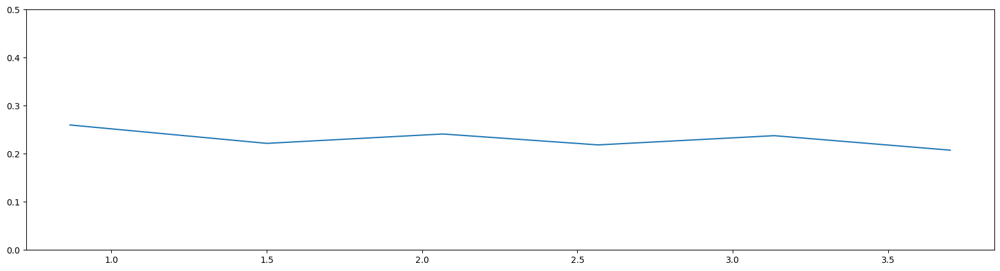

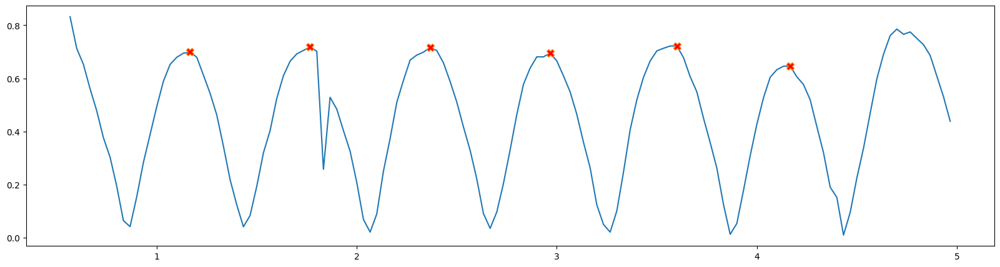

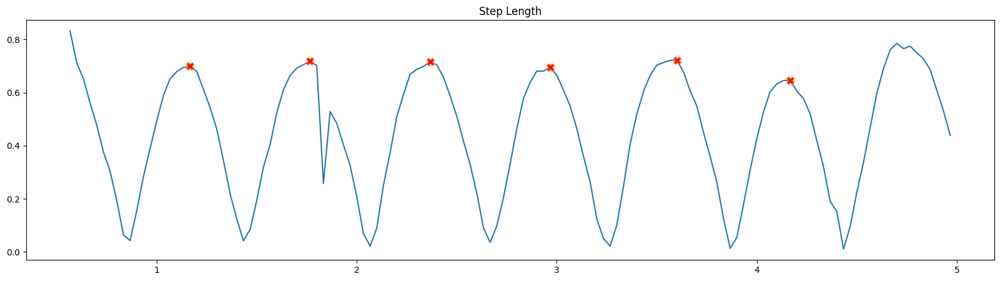

[ 18  36  54  72  91 108]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.217767  1.090235 -0.038085   0.894045  0.566667 -0.462157    0.608031   
1    1.319923  1.282669 -0.040049   0.900736  0.600000  0.206169    0.621033   
2    1.281970  1.311865 -0.031371   0.891500  0.633333  0.241761    0.633976   
3    1.271457  1.308914 -0.026615   0.887647  0.666667  0.033980    0.647221   
4    1.276554  1.278091 -0.028202   0.915801  0.700000 -0.091155    0.660248   
..        ...       ...       ...        ...       ...       ...         ...   
128  1.201350  1.297182 -0.016942   0.851065  4.833333  0.133160    0.603038   
129  1.215337  1.331982 -0.013705   0.837233  4.866667  0.145490    0.591294   
130  1.200738  1.400487 -0.005493   0.833009  4.900000  0.295816    0.563738   
131  1.190039  1.418676  0.001679   0.824697  4.933333  0.071870    0.538019   
132  1.159341  1.428698 -0.004611   0.892995  4.966667 -0.503854    0.517404   

     visi_lbl

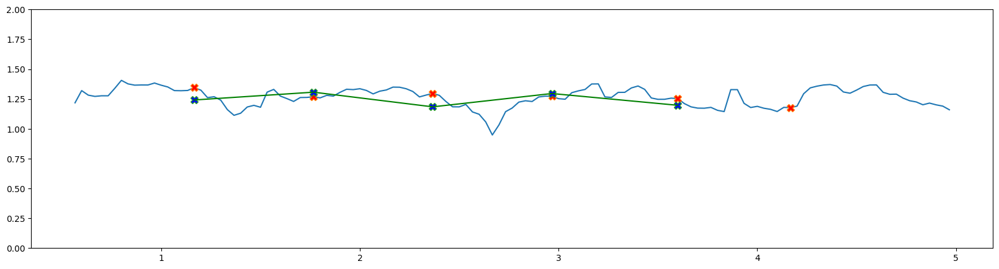

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.481928     0.524757 -0.038085  0.566667 -0.462157      0.087541   
1       0.509231     0.558867 -0.040049  0.600000  0.206169      0.083481   
2       0.499611     0.541472 -0.031371  0.633333  0.241761      0.078273   
3       0.485275     0.542284 -0.026615  0.666667  0.033980      0.073206   
4       0.495689     0.546146 -0.028202  0.700000 -0.091155      0.068402   
..           ...          ...       ...       ...       ...           ...   
128     0.524321     0.548809 -0.016942  4.833333  0.133160      0.114046   
129     0.534105     0.563099 -0.013705  4.866667  0.145490      0.103826   
130     0.523301     0.402582 -0.005493  4.900000  0.295816      0.095271   
131     0.522294     0.452644  0.001679  4.933333  0.071870      0.091121   
132     0.518889     0.477220 -0.004611  4.966667 -0.503854      0.084810   

     visi_l_urm_l  
0        0.991311  
1        0.991927  
2        0.9925

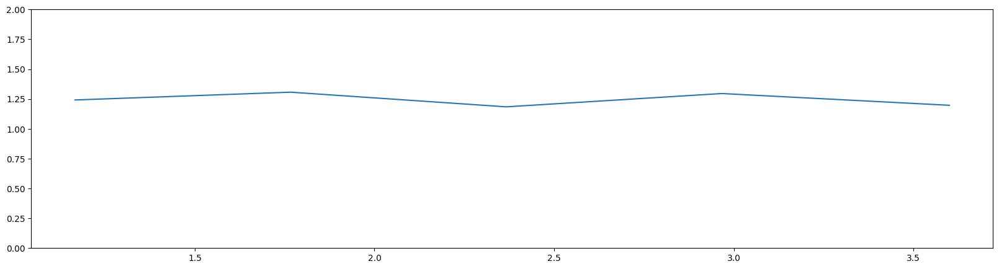

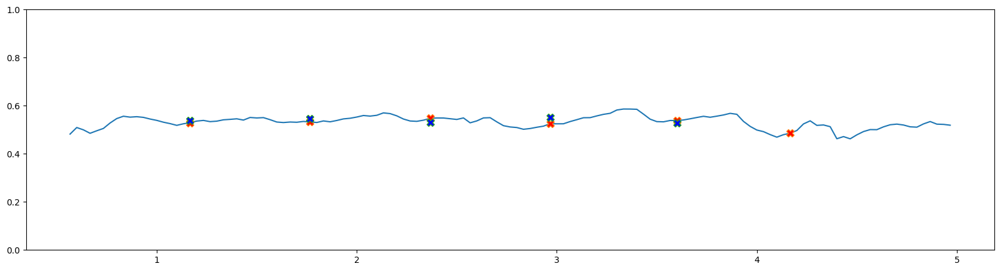

            r         l         c         t  velocity  visi_larm_r  \
0    0.409477  0.507670 -0.038085  0.566667 -0.462157     0.016161   
1    0.431401  0.520847 -0.040049  0.600000  0.206169     0.014749   
2    0.419367  0.523957 -0.031371  0.633333  0.241761     0.013129   
3    0.441407  0.517385 -0.026615  0.666667  0.033980     0.011637   
4    0.456281  0.518823 -0.028202  0.700000 -0.091155     0.010185   
..        ...       ...       ...       ...       ...          ...   
128  0.431946  0.526124 -0.016942  4.833333  0.133160     0.013651   
129  0.436459  0.537853 -0.013705  4.866667  0.145490     0.011282   
130  0.374063  0.253673 -0.005493  4.900000  0.295816     0.009455   
131  0.397963  0.419378  0.001679  4.933333  0.071870     0.008584   
132  0.411016  0.455877 -0.004611  4.966667 -0.503854     0.007478   

     visi_larm_l  
0       0.969508  
1       0.971592  
2       0.973756  
3       0.975721  
4       0.977039  
..           ...  
128     0.932924  
129    

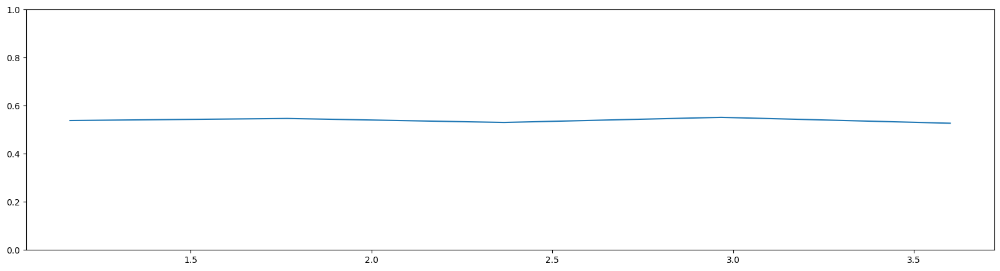

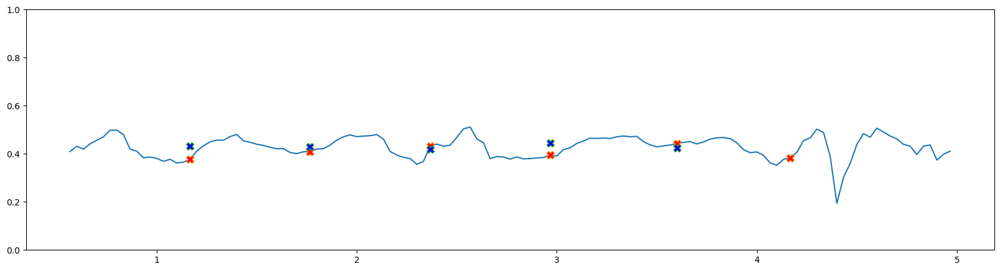

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.280125  0.313304 -0.038085  0.566667 -0.462157  0.000050  0.888392
1    0.287595  0.326821 -0.040049  0.600000  0.206169  0.000040  0.895580
2    0.288790  0.330308 -0.031371  0.633333  0.241761  0.000030  0.903225
3    0.293258  0.329147 -0.026615  0.666667  0.033980  0.000023  0.910229
4    0.326071  0.328012 -0.028202  0.700000 -0.091155  0.000016  0.914840
..        ...       ...       ...       ...       ...       ...       ...
128  0.299826  0.331551 -0.016942  4.833333  0.133160  0.000020  0.806234
129  0.272957  0.333594 -0.013705  4.866667  0.145490  0.000013  0.647629
130  0.232920  0.144957 -0.005493  4.900000  0.295816  0.000008  0.434006
131  0.245450  0.239765  0.001679  4.933333  0.071870  0.000007  0.285706
132  0.265528  0.257682 -0.004611  4.966667 -0.503854  0.000005  0.247920

[133 rows x 7 columns]
t1 1.1666666666666667
t1 1.7666666666666666
t1 2.3666666666666667
t1 2.966666666666667
t

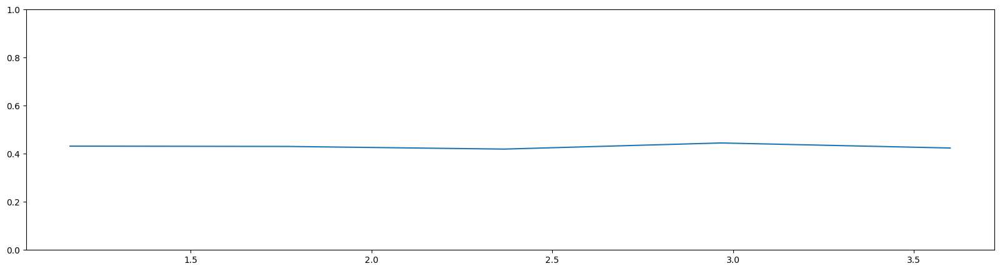

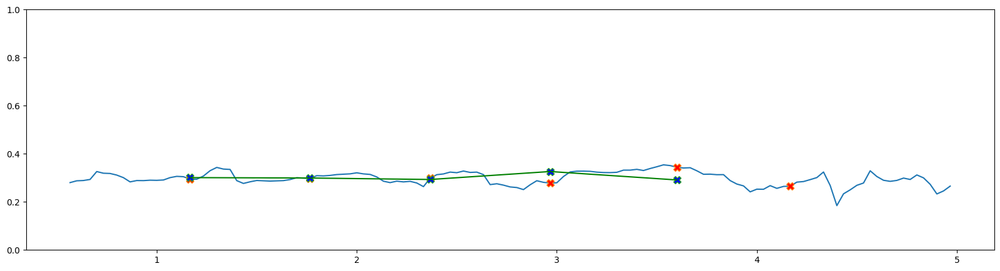

            r         l  leg_ratio         c         t  velocity  \
0    0.550637  0.615894   1.406434 -0.038085  0.566667 -0.462157   
1    0.617731  0.685807   1.176473 -0.040049  0.600000  0.206169   
2    0.606383  0.680183   1.069506 -0.031371  0.633333  0.241761   
3    0.600366  0.676357   1.060918 -0.026615  0.666667  0.033980   
4    0.611909  0.668168   1.089719 -0.028202  0.700000 -0.091155   
..        ...       ...        ...       ...       ...       ...   
128  0.534279  0.627777   0.996514 -0.016942  4.833333  0.133160   
129  0.557231  0.665562   0.987526 -0.013705  4.866667  0.145490   
130  0.596778  0.716412   0.882887 -0.005493  4.900000  0.295816   
131  0.599195  0.726563   0.853683  0.001679  4.933333  0.071870   
132  0.626297  0.701345   0.732854 -0.004611  4.966667 -0.503854   

     visi_thigh_r  visi_thigh_l  
0        0.834095      0.967626  
1        0.839140      0.970177  
2        0.844365      0.972629  
3        0.849729      0.974649  
4        0.85

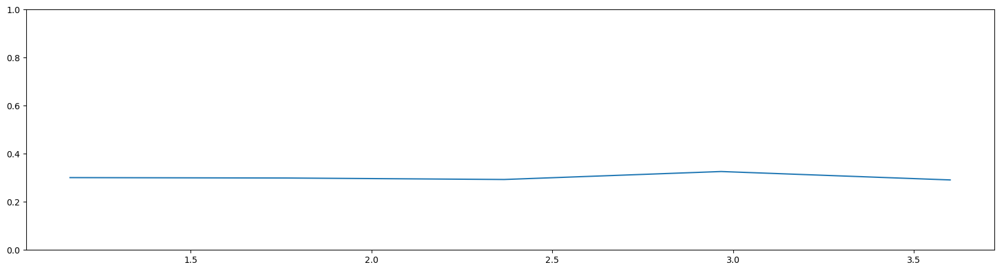

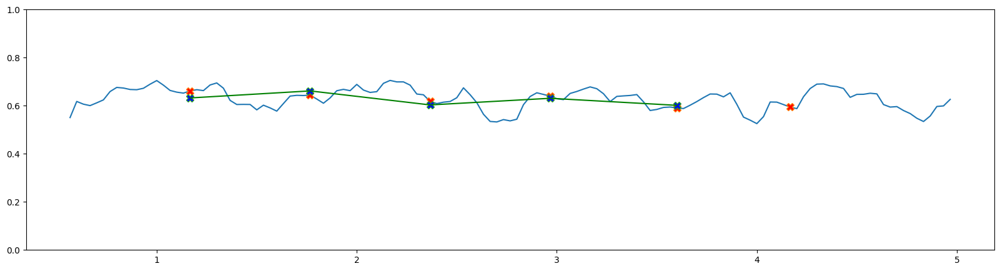

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.667130  0.474342   0.894045 -0.038085  0.566667 -0.462157    0.728971   
1    0.702192  0.596862   0.900736 -0.040049  0.600000  0.206169    0.740084   
2    0.675587  0.631682   0.891500 -0.031371  0.633333  0.241761    0.750832   
3    0.671091  0.632557   0.887647 -0.026615  0.666667  0.033980    0.761679   
4    0.664646  0.609924   0.915801 -0.028202  0.700000 -0.091155    0.772321   
..        ...       ...        ...       ...       ...       ...         ...   
128  0.667072  0.669405   0.851065 -0.016942  4.833333  0.133160    0.745006   
129  0.658107  0.666419   0.837233 -0.013705  4.866667  0.145490    0.736145   
130  0.603960  0.684074   0.833009 -0.005493  4.900000  0.295816    0.714455   
131  0.590844  0.692112   0.824697  0.001679  4.933333  0.071870    0.695923   
132  0.533044  0.727353   0.892995 -0.004611  4.966667 -0.503854    0.680662   

     visi_shk_l  
0      0.928533  
1  

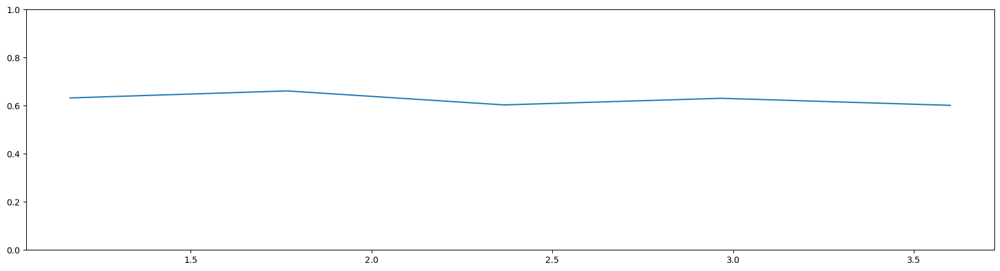

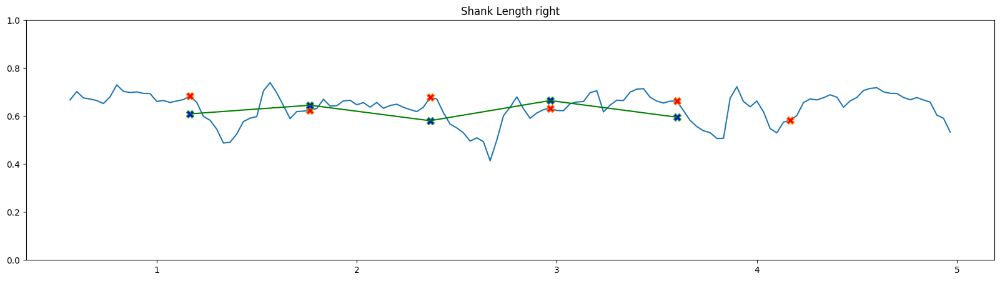

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.238001  0.135439   0.894045 -0.038085  0.566667 -0.462157     0.709940   
1    0.244996  0.214909   0.900736 -0.040049  0.600000  0.206169     0.724754   
2    0.244840  0.266021   0.891500 -0.031371  0.633333  0.241761     0.739156   
3    0.240507  0.298487   0.887647 -0.026615  0.666667  0.033980     0.753322   
4    0.240864  0.344335   0.915801 -0.028202  0.700000 -0.091155     0.768248   
..        ...       ...        ...       ...       ...       ...          ...   
128  0.180872  0.211304   0.851065 -0.016942  4.833333  0.133160     0.798728   
129  0.221548  0.140480   0.837233 -0.013705  4.866667  0.145490     0.788472   
130  0.308141  0.143659   0.833009 -0.005493  4.900000  0.295816     0.763579   
131  0.295672  0.128219   0.824697  0.001679  4.933333  0.071870     0.748156   
132  0.307000  0.144780   0.892995 -0.004611  4.966667 -0.503854     0.749119   

     visi_foot_l  
0       

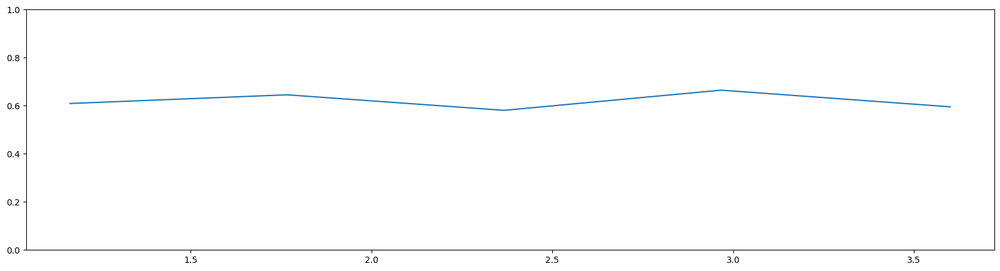

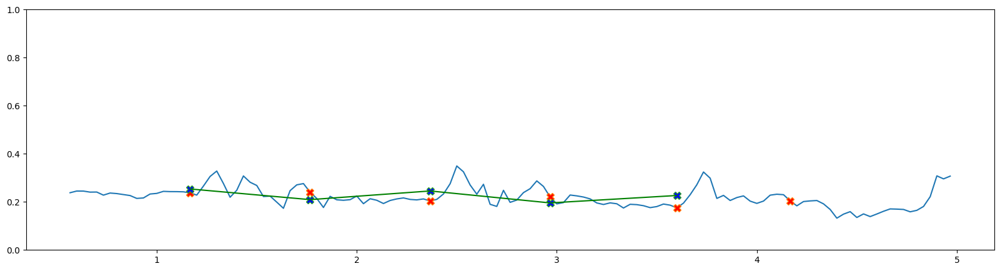

side left derek left 3 (5, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.146475  1.366667 -0.042308  0.919656  0.944938  0.027782  0.079941   
1    0.143984  1.400000 -0.046863  0.919018  0.944677  0.028592  0.073477   
2    0.143986  1.433333 -0.042241  0.915944  0.941321  0.028473  0.060039   
3    0.144876  1.466667 -0.038558  0.913052  0.935280  0.025174  0.048625   
4    0.146613  1.500000 -0.040005  0.909940  0.927095  0.019121  0.054947   
..        ...       ...       ...       ...       ...       ...       ...   
157  0.166095  6.600000 -0.016693  0.020560 -0.000535  0.021119  0.091631   
158  0.175555  6.633333 -0.021399  0.011745  0.000699  0.011093  0.091937   
159  0.173967  6.666667 -0.020992  0.006895 -0.005292  0.012642  0.090491   
160  0.167965  6.700000 -0.016505  0.002584 -0.012118  0.014713  0.083288   
161  0.162350  6.733333 -0.020046 -0.001126 -0.019631  0.018792  0.079531   

          sln       aln  
0    0.189668  0.5

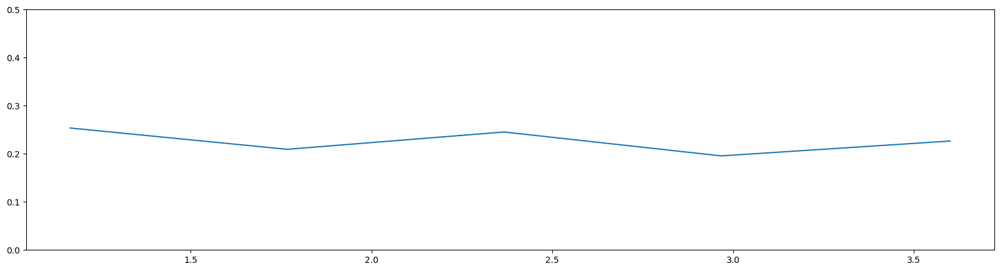

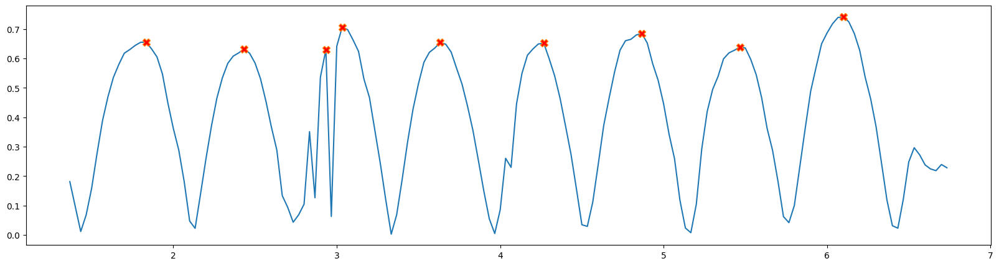

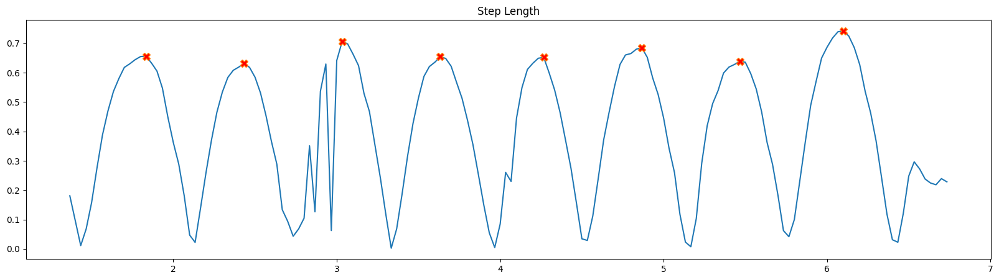

[ 14  32  50  68  87 105 123 142]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.318282  1.499690 -0.042308   0.912153  1.366667 -0.386026    0.684637   
1    1.333482  1.505034 -0.046863   0.926835  1.400000  0.055193    0.686909   
2    1.326929  1.485095 -0.042241   0.932330  1.433333  0.171230    0.685235   
3    1.419299  1.474552 -0.038558   0.930676  1.466667  0.016586    0.694455   
4    1.450955  1.471185 -0.040005   0.905354  1.500000 -0.048426    0.701284   
..        ...       ...       ...        ...       ...       ...         ...   
157  0.941306  1.443957 -0.016693   0.637428  6.600000 -0.099839    0.281306   
158  0.844690  1.393578 -0.021399   0.590837  6.633333 -0.106825    0.245505   
159  0.737297  1.419098 -0.020992   0.547361  6.666667  0.115699    0.212759   
160  0.872153  1.482736 -0.016505   0.533785  6.700000  0.092666    0.190443   
161  0.975908  1.532242 -0.020046   0.554172  6.733333 -0.401254    0.170004   

     

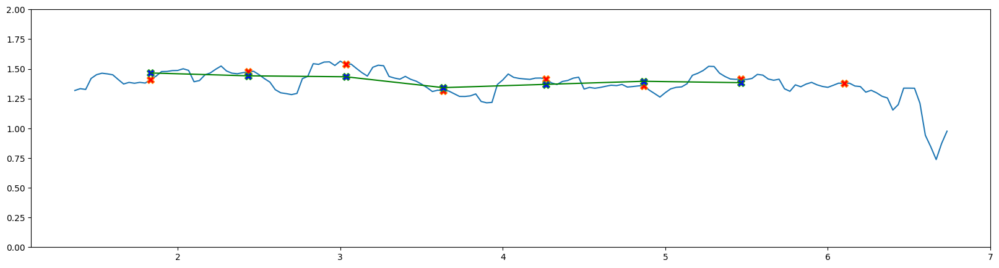

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.545767     0.638452 -0.042308  1.366667 -0.386026      0.068443   
1       0.510317     0.645337 -0.046863  1.400000  0.055193      0.067135   
2       0.416977     0.644671 -0.042241  1.433333  0.171230      0.067250   
3       0.335630     0.645308 -0.038558  1.466667  0.016586      0.069621   
4       0.374774     0.655949 -0.040005  1.500000 -0.048426      0.070496   
..           ...          ...       ...       ...       ...           ...   
157     0.551681     0.502660 -0.016693  6.600000 -0.099839      0.043480   
158     0.523691     0.477983 -0.021399  6.633333 -0.106825      0.039475   
159     0.520160     0.444189 -0.020992  6.666667  0.115699      0.036721   
160     0.495866     0.427734 -0.016505  6.700000  0.092666      0.033758   
161     0.489872     0.442802 -0.020046  6.733333 -0.401254      0.032104   

     visi_l_urm_l  
0        0.996721  
1        0.996170  
2        0.9961

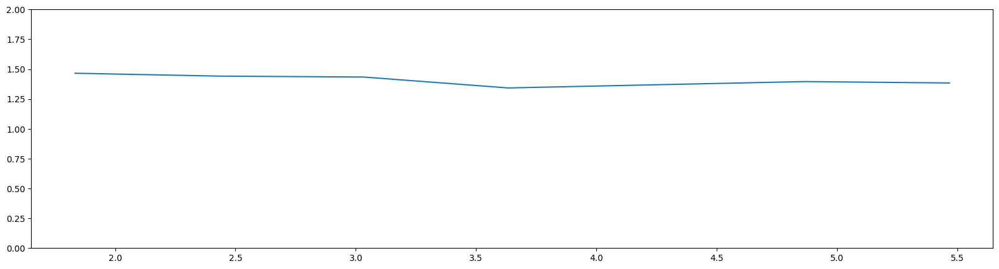

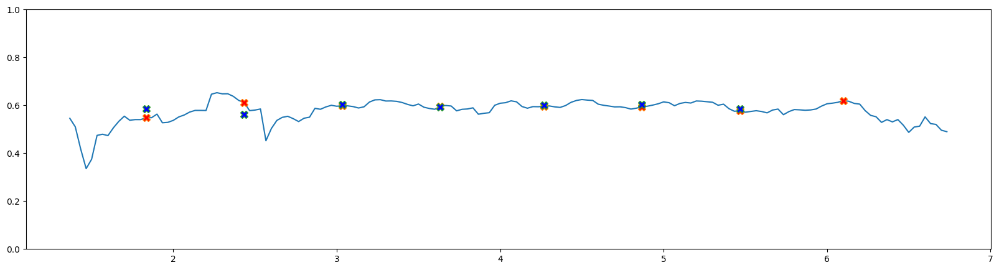

            r         l         c         t  velocity  visi_larm_r  \
0    0.363544  0.511383 -0.042308  1.366667 -0.386026     0.008274   
1    0.306784  0.517032 -0.046863  1.400000  0.055193     0.007881   
2    0.065978  0.516827 -0.042241  1.433333  0.171230     0.007797   
3    0.114986  0.511650 -0.038558  1.466667  0.016586     0.008197   
4    0.136502  0.505357 -0.040005  1.500000 -0.048426     0.008454   
..        ...       ...       ...       ...       ...          ...   
157  0.248715  0.143963 -0.016693  6.600000 -0.099839     0.001732   
158  0.250949  0.178037 -0.021399  6.633333 -0.106825     0.001471   
159  0.276171  0.152477 -0.020992  6.666667  0.115699     0.001291   
160  0.229844  0.194467 -0.016505  6.700000  0.092666     0.001104   
161  0.208465  0.214706 -0.020046  6.733333 -0.401254     0.001026   

     visi_larm_l  
0       0.985566  
1       0.983366  
2       0.983342  
3       0.983714  
4       0.983937  
..           ...  
157     0.679134  
158    

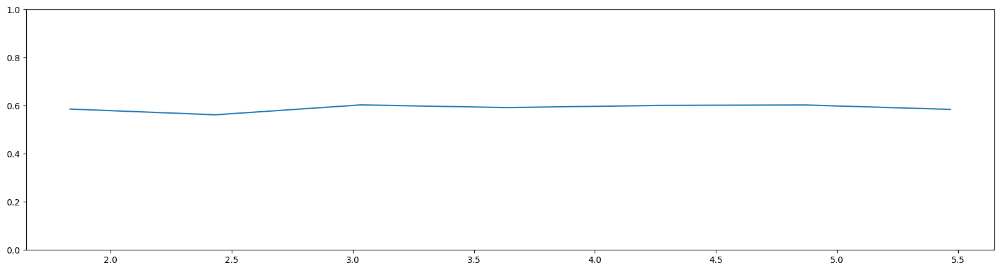

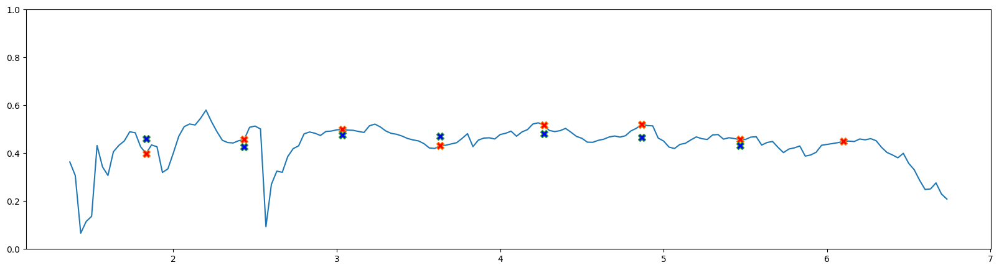

            r         l         c         t  velocity      visi_l_r  visi_l_l
0    0.228992  0.297648 -0.042308  1.366667 -0.386026  9.703459e-06  0.946807
1    0.201246  0.303548 -0.046863  1.400000  0.055193  8.555931e-06  0.939942
2    0.096617  0.302569 -0.042241  1.433333  0.171230  8.235752e-06  0.939951
3    0.118552  0.303255 -0.038558  1.466667  0.016586  9.015026e-06  0.940827
4    0.118862  0.307916 -0.040005  1.500000 -0.048426  9.607680e-06  0.941155
..        ...       ...       ...       ...       ...           ...       ...
157  0.175642  0.137397 -0.016693  6.600000 -0.099839  1.334838e-07  0.327786
158  0.177587  0.136585 -0.021399  6.633333 -0.106825  8.993669e-08  0.255005
159  0.187451  0.132567 -0.020992  6.666667  0.115699  6.656097e-08  0.203336
160  0.155280  0.116708 -0.016505  6.700000  0.092666  4.568130e-08  0.148472
161  0.137825  0.119296 -0.020046  6.733333 -0.401254  3.968776e-08  0.111320

[162 rows x 7 columns]
t1 1.8333333333333333
t1 2.4333333333333

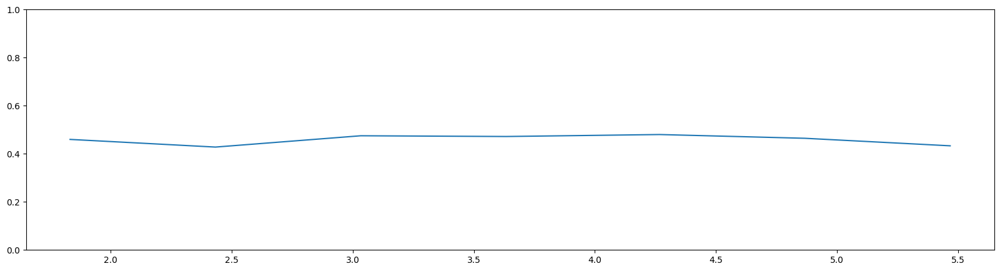

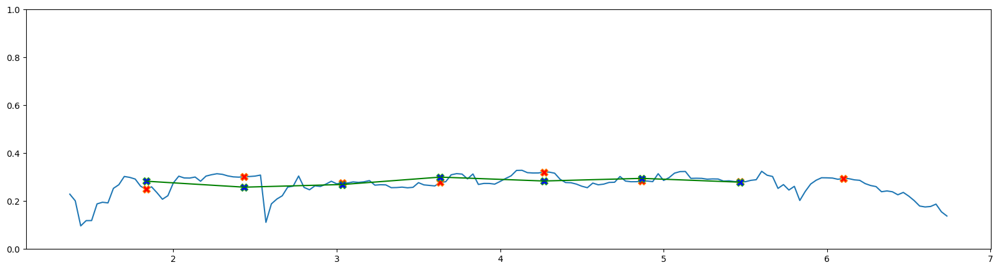

            r         l  leg_ratio         c         t  velocity  \
0    0.741404  0.812807   0.839849 -0.042308  1.366667 -0.386026   
1    0.727857  0.785314   0.841474 -0.046863  1.400000  0.055193   
2    0.724068  0.776621   0.850930 -0.042241  1.433333  0.171230   
3    0.719483  0.773076   0.997634 -0.038558  1.466667  0.016586   
4    0.693071  0.765524   1.074007 -0.040005  1.500000 -0.048426   
..        ...       ...        ...       ...       ...       ...   
157  0.439965  0.690219   0.665139 -0.016693  6.600000 -0.099839   
158  0.398831  0.675027   0.620498 -0.021399  6.633333 -0.106825   
159  0.375993  0.686919   0.493464 -0.020992  6.666667  0.115699   
160  0.394106  0.738323   0.642181 -0.016505  6.700000  0.092666   
161  0.434984  0.784926   0.723822 -0.020046  6.733333 -0.401254   

     visi_thigh_r  visi_thigh_l  
0        0.860548      0.964626  
1        0.863240      0.965499  
2        0.865802      0.966489  
3        0.872038      0.968074  
4        0.87

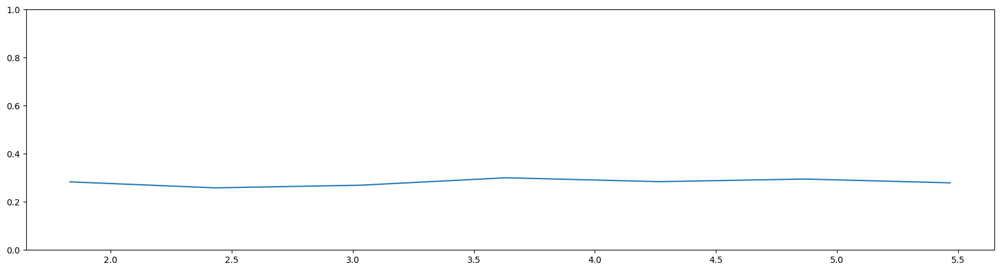

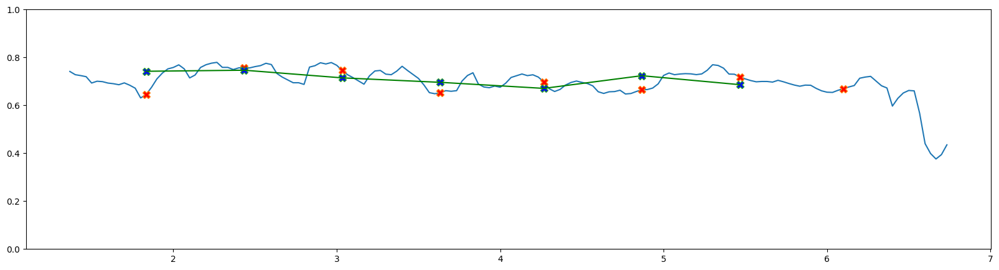

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.576878  0.686883   0.912153 -0.042308  1.366667 -0.386026    0.795583   
1    0.605626  0.719719   0.926835 -0.046863  1.400000  0.055193    0.795734   
2    0.602862  0.708474   0.932330 -0.042241  1.433333  0.171230    0.791446   
3    0.699817  0.701477   0.930676 -0.038558  1.466667  0.016586    0.796358   
4    0.757884  0.705661   0.905354 -0.040005  1.500000 -0.048426    0.800596   
..        ...       ...        ...       ...       ...       ...         ...   
157  0.501341  0.753738   0.637428 -0.016693  6.600000 -0.099839    0.464152   
158  0.445859  0.718551   0.590837 -0.021399  6.633333 -0.106825    0.424740   
159  0.361304  0.732179   0.547361 -0.020992  6.666667  0.115699    0.384701   
160  0.478048  0.744413   0.533785 -0.016505  6.700000  0.092666    0.356923   
161  0.540924  0.747317   0.554172 -0.020046  6.733333 -0.401254    0.331285   

     visi_shk_l  
0      0.957128  
1  

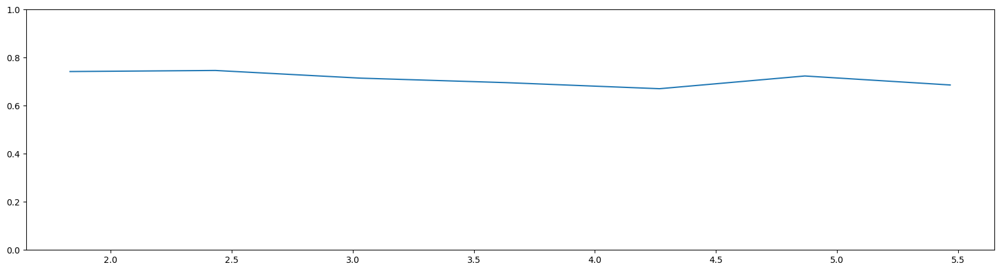

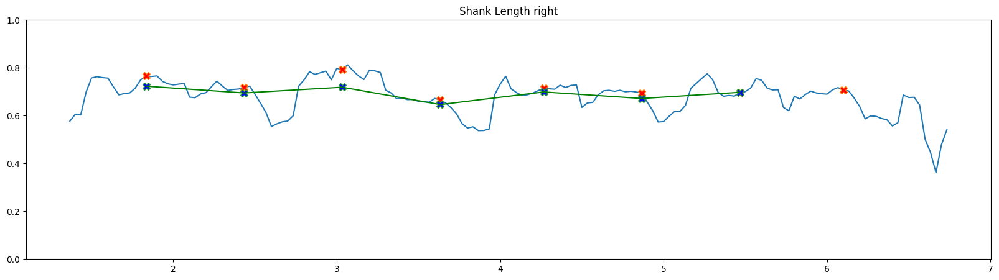

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.269281  0.215031   0.912153 -0.042308  1.366667 -0.386026     0.859962   
1    0.329152  0.225092   0.926835 -0.046863  1.400000  0.055193     0.852185   
2    0.328218  0.233074   0.932330 -0.042241  1.433333  0.171230     0.834843   
3    0.238895  0.237384   0.930676 -0.038558  1.466667  0.016586     0.828622   
4    0.208891  0.231447   0.905354 -0.040005  1.500000 -0.048426     0.824339   
..        ...       ...        ...       ...       ...       ...          ...   
157  0.124137  0.215818   0.637428 -0.016693  6.600000 -0.099839     0.565120   
158  0.120196  0.210504   0.590837 -0.021399  6.633333 -0.106825     0.524554   
159  0.119916  0.223009   0.547361 -0.020992  6.666667  0.115699     0.483795   
160  0.118452  0.237991   0.533785 -0.016505  6.700000  0.092666     0.453491   
161  0.121245  0.249345   0.554172 -0.020046  6.733333 -0.401254     0.426477   

     visi_foot_l  
0       

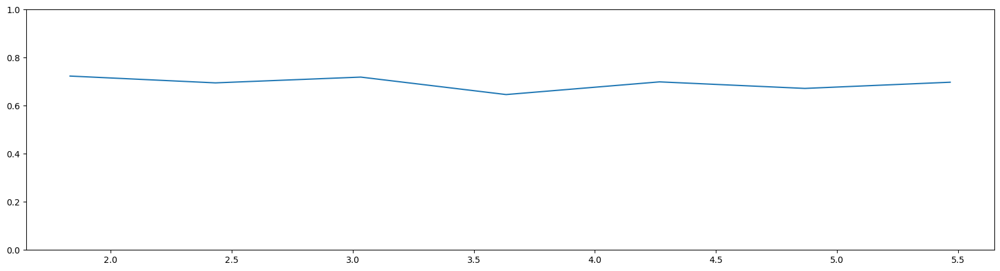

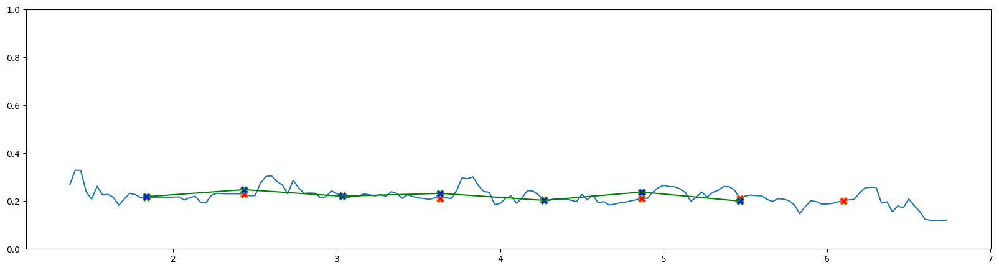

side left eranga left 3 (7, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.175013  0.600000  0.004056  0.942263  0.990817  0.052990  0.090894   
1    0.175265  0.633333  0.004317  0.933922  0.986242  0.055256  0.090261   
2    0.177382  0.666667  0.005885  0.924560  0.978896  0.056242  0.090732   
3    0.179970  0.700000  0.000030  0.918113  0.969311  0.052523  0.091740   
4    0.179091  0.733333 -0.003248  0.911203  0.959455  0.049241  0.092115   
..        ...       ...       ...       ...       ...       ...       ...   
121  0.174541  4.633333  0.008104 -0.036061 -0.018859  0.026782  0.097458   
122  0.171047  4.666667 -0.025370 -0.062974 -0.040528  0.024718  0.106395   
123  0.170311  4.700000 -0.036972 -0.085061 -0.045039  0.040161  0.111787   
124  0.186458  4.733333 -0.011587 -0.084632 -0.062155  0.024163  0.048822   
125  0.210355  4.766667 -0.012174 -0.094329 -0.062089  0.032913  0.027329   

          sln       aln  
0    0.302777  0.

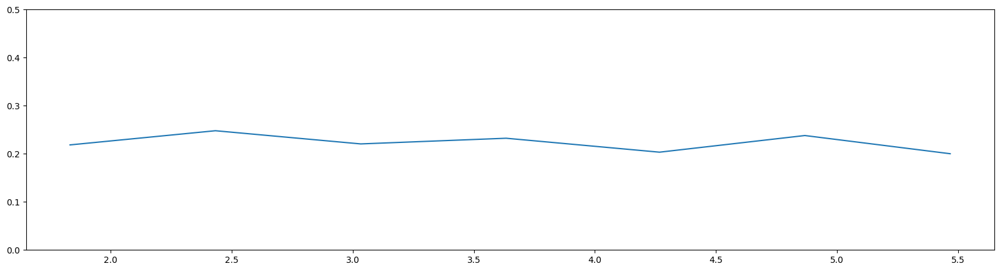

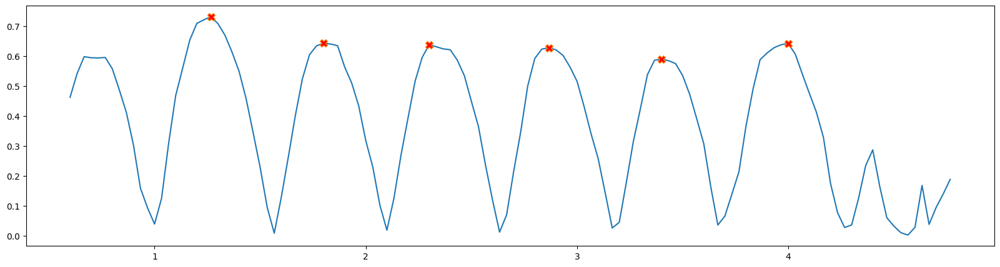

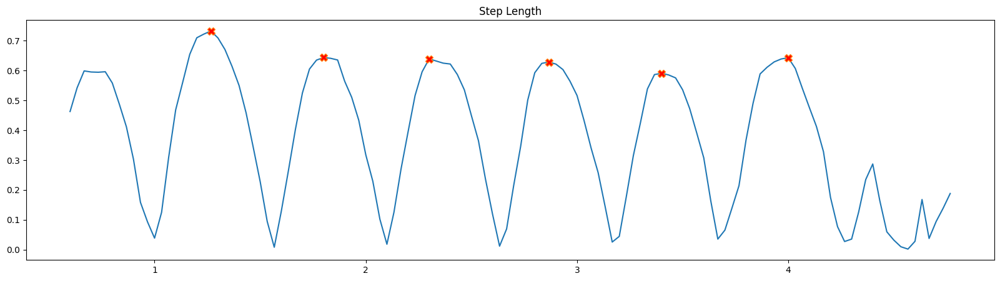

[ 20  36  51  68  84 102]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.403208  1.548985  0.004056   0.949350  0.600000 -0.450247    0.204849   
1    1.404154  1.533473  0.004317   0.987624  0.633333  0.187525    0.224256   
2    1.389650  1.499426  0.005885   0.969943  0.666667 -0.135215    0.227058   
3    1.365332  1.449327  0.000030   0.984221  0.700000 -0.089402    0.240956   
4    1.372888  1.460800 -0.003248   0.973570  0.733333 -0.299159    0.250064   
..        ...       ...       ...        ...       ...       ...         ...   
121  1.367226  1.173571  0.008104   1.145326  4.633333 -0.583856    0.239157   
122  1.289985  1.229542 -0.025370   1.133140  4.666667 -0.983210    0.224889   
123  1.333680  1.542064 -0.036972   0.886941  4.700000  0.344105    0.204479   
124  1.365407  1.510013 -0.011587   0.884658  4.733333  0.863650    0.217746   
125  1.290364  1.398512 -0.012174   0.906095  4.766667 -1.566858    0.249735   

     visi_lbl

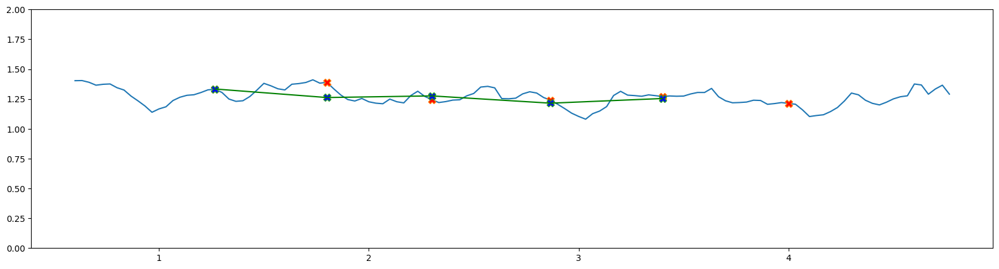

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.519356     0.495292  0.004056  0.600000 -0.450247      0.729496   
1       0.514996     0.523696  0.004317  0.633333  0.187525      0.733904   
2       0.511506     0.529737  0.005885  0.666667 -0.135215      0.744775   
3       0.509753     0.550053  0.000030  0.700000 -0.089402      0.756846   
4       0.514350     0.529268 -0.003248  0.733333 -0.299159      0.768859   
..           ...          ...       ...       ...       ...           ...   
121     0.558367     0.507781  0.008104  4.633333 -0.583856      0.135501   
122     0.622018     0.533653 -0.025370  4.666667 -0.983210      0.124287   
123     0.656371     0.502669 -0.036972  4.700000  0.344105      0.122572   
124     0.261841     0.101997 -0.011587  4.733333  0.863650      0.180696   
125     0.129919     0.035381 -0.012174  4.766667 -1.566858      0.181846   

     visi_l_urm_l  
0        0.861298  
1        0.871516  
2        0.8827

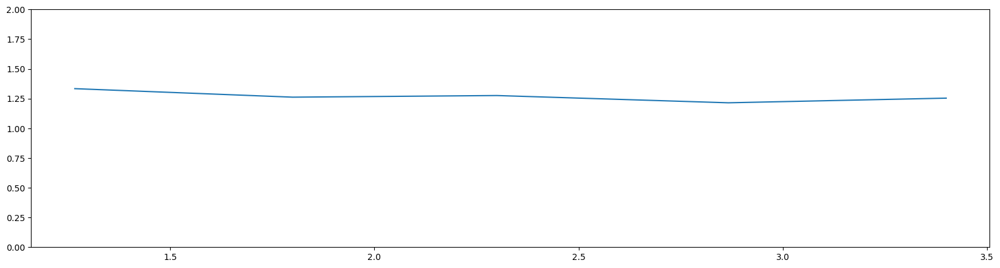

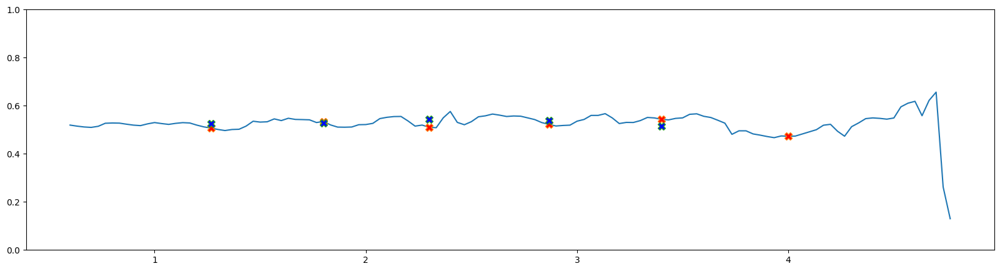

            r         l         c         t  velocity  visi_larm_r  \
0    0.407578  0.248738  0.004056  0.600000 -0.450247     0.582745   
1    0.406979  0.349330  0.004317  0.633333  0.187525     0.586772   
2    0.392144  0.366184  0.005885  0.666667 -0.135215     0.601025   
3    0.386931  0.312745  0.000030  0.700000 -0.089402     0.616634   
4    0.379848  0.390854 -0.003248  0.733333 -0.299159     0.635848   
..        ...       ...       ...       ...       ...          ...   
121  0.416014  0.527553  0.008104  4.633333 -0.583856     0.020683   
122  0.446229  0.507932 -0.025370  4.666667 -0.983210     0.017985   
123  0.429199  0.458766 -0.036972  4.700000  0.344105     0.019121   
124  0.375580  0.086673 -0.011587  4.733333  0.863650     0.037714   
125  0.232621  0.017868 -0.012174  4.766667 -1.566858     0.036764   

     visi_larm_l  
0       0.229171  
1       0.258207  
2       0.306117  
3       0.339199  
4       0.397723  
..           ...  
121     0.532222  
122    

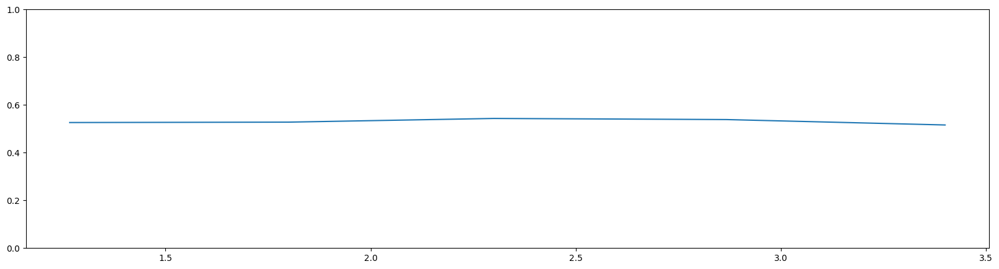

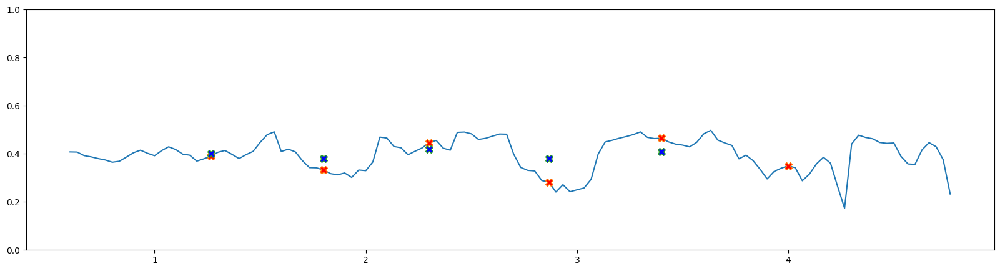

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.302149  0.146782  0.004056  0.600000 -0.450247  0.250161  0.013769
1    0.288855  0.228244  0.004317  0.633333  0.187525  0.254232  0.019210
2    0.280872  0.240822  0.005885  0.666667 -0.135215  0.269719  0.031322
3    0.268808  0.218957  0.000030  0.700000 -0.089402  0.286861  0.041964
4    0.260744  0.255999 -0.003248  0.733333 -0.299159  0.310646  0.067307
..        ...       ...       ...       ...       ...       ...       ...
121  0.276665  0.321633  0.008104  4.633333 -0.583856  0.000067  0.168812
122  0.285916  0.311591 -0.025370  4.666667 -0.983210  0.000049  0.184194
123  0.278588  0.313990 -0.036972  4.700000  0.344105  0.000061  0.208964
124  0.197736  0.051261 -0.011587  4.733333  0.863650  0.000292  0.214728
125  0.105798  0.038526 -0.012174  4.766667 -1.566858  0.000268  0.180446

[126 rows x 7 columns]
t1 1.2666666666666666
t1 1.8
t1 2.3
t1 2.8666666666666667
t1 3.4
results [0.298898223256

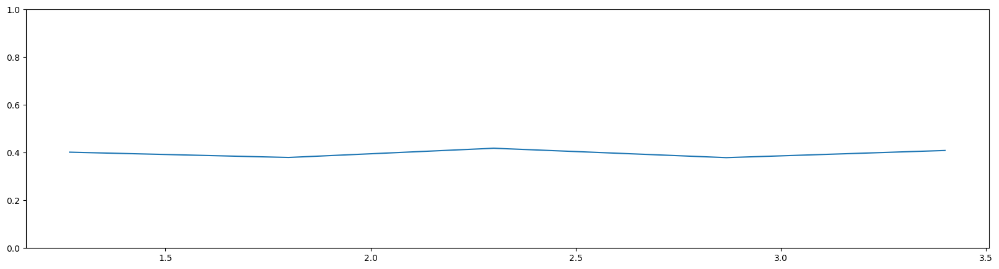

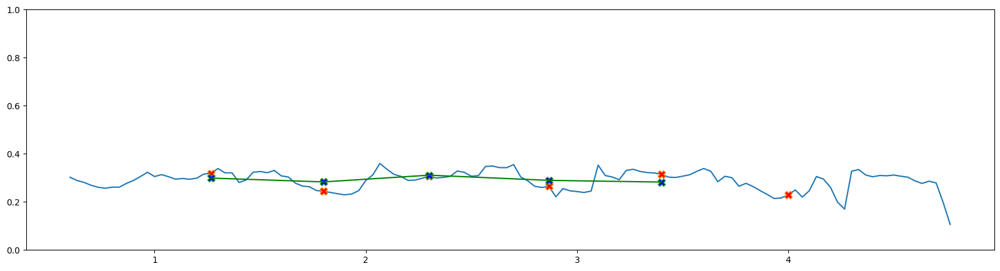

            r         l  leg_ratio         c         t  velocity  \
0    0.686600  0.723232   0.867823  0.004056  0.600000 -0.450247   
1    0.695905  0.704626   0.854499  0.004317  0.633333  0.187525   
2    0.696164  0.717737   0.887165  0.005885  0.666667 -0.135215   
3    0.702215  0.713473   0.901152  0.000030  0.700000 -0.089402   
4    0.701316  0.720355   0.906984 -0.003248  0.733333 -0.299159   
..        ...       ...        ...       ...       ...       ...   
121  0.749122  0.654068   1.189801  0.008104  4.633333 -0.583856   
122  0.765567  0.675616   0.946729 -0.025370  4.666667 -0.983210   
123  0.717596  0.809068   0.840502 -0.036972  4.700000  0.344105   
124  0.676167  0.764326   0.924302 -0.011587  4.733333  0.863650   
125  0.665926  0.734940   0.941027 -0.012174  4.766667 -1.566858   

     visi_thigh_r  visi_thigh_l  
0        0.517911      0.982373  
1        0.536855      0.983082  
2        0.537590      0.982507  
3        0.550490      0.981571  
4        0.55

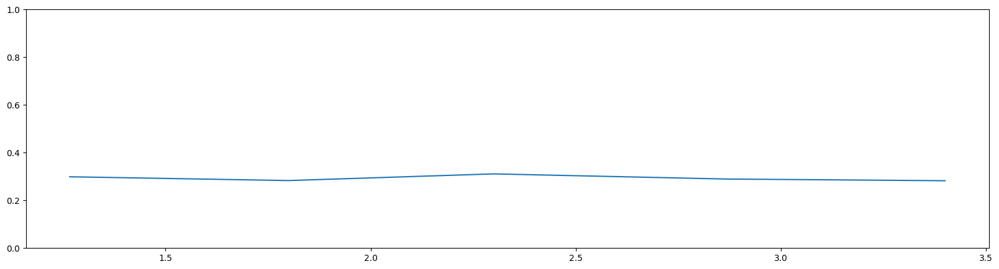

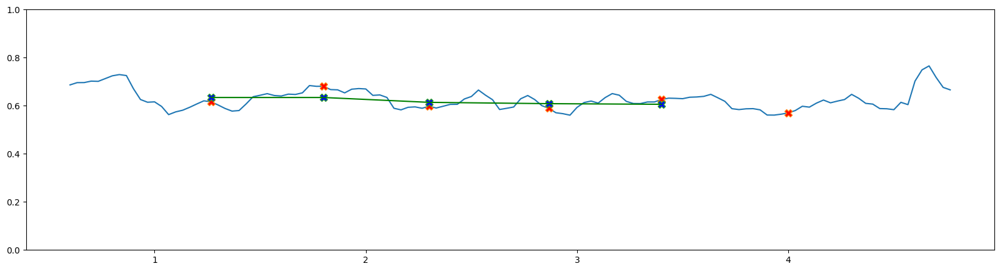

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.716608  0.825753   0.949350  0.004056  0.600000 -0.450247    0.395530   
1    0.708249  0.828847   0.987624  0.004317  0.633333  0.187525    0.417721   
2    0.693487  0.781689   0.969943  0.005885  0.666667 -0.135215    0.422362   
3    0.663117  0.735854   0.984221  0.000030  0.700000 -0.089402    0.437712   
4    0.671572  0.740445   0.973570 -0.003248  0.733333 -0.299159    0.448628   
..        ...       ...        ...       ...       ...       ...         ...   
121  0.618104  0.519502   1.145326  0.008104  4.633333 -0.583856    0.420333   
122  0.524418  0.553926   1.133140 -0.025370  4.666667 -0.983210    0.405972   
123  0.616084  0.732995   0.886941 -0.036972  4.700000  0.344105    0.379567   
124  0.689240  0.745687   0.884658 -0.011587  4.733333  0.863650    0.391350   
125  0.624439  0.663571   0.906095 -0.012174  4.766667 -1.566858    0.424069   

     visi_shk_l  
0      0.974144  
1  

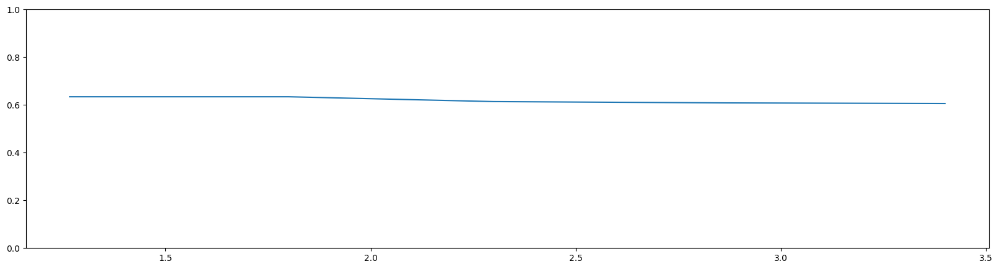

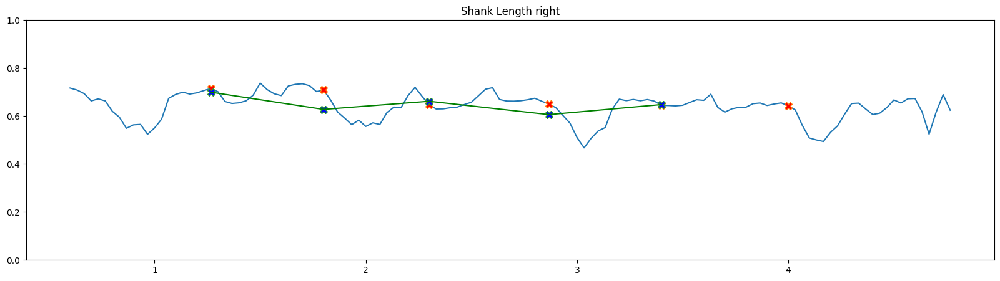

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.233476  0.259730   0.949350  0.004056  0.600000 -0.450247     0.634331   
1    0.227260  0.297366   0.987624  0.004317  0.633333  0.187525     0.651847   
2    0.228241  0.304587   0.969943  0.005885  0.666667 -0.135215     0.663333   
3    0.236905  0.301852   0.984221  0.000030  0.700000 -0.089402     0.675886   
4    0.243144  0.273118   0.973570 -0.003248  0.733333 -0.299159     0.692788   
..        ...       ...        ...       ...       ...       ...          ...   
121  0.336251  0.399035   1.145326  0.008104  4.633333 -0.583856     0.569140   
122  0.265726  0.215157   1.133140 -0.025370  4.666667 -0.983210     0.557652   
123  0.194712  0.126440   0.886941 -0.036972  4.700000  0.344105     0.515824   
124  0.136157  0.038878   0.884658 -0.011587  4.733333  0.863650     0.497187   
125  0.175865  0.075146   0.906095 -0.012174  4.766667 -1.566858     0.502646   

     visi_foot_l  
0       

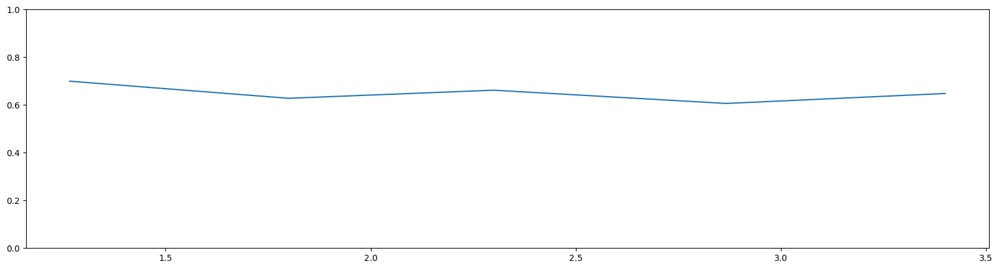

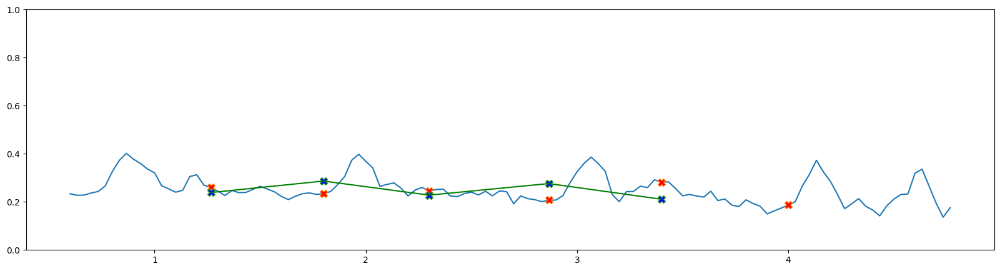

side left ijaz left 3 (5, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.154828  0.733333 -0.029398  0.936422  0.982784  0.051172  0.079759   
1    0.155796  0.766667 -0.032087  0.931028  0.980355  0.053335  0.078304   
2    0.159364  0.800000 -0.032478  0.924234  0.973827  0.052911  0.078626   
3    0.158513  0.833333 -0.032358  0.917530  0.966164  0.051529  0.078929   
4    0.159631  0.866667 -0.034533  0.909018  0.959780  0.052784  0.079772   
..        ...       ...       ...       ...       ...       ...       ...   
137  0.177489  5.300000 -0.026151  0.010407  0.001424  0.009223  0.077138   
138  0.176844  5.333333 -0.025058  0.008055 -0.013191  0.021247  0.074040   
139  0.176990  5.366667 -0.027896  0.001366 -0.020968  0.022357  0.072369   
140  0.166722  5.400000  0.002367 -0.032591 -0.018567  0.019981  0.081051   
141  0.160401  5.433333 -0.000846 -0.048816 -0.010581  0.039251  0.089912   

          sln       aln  
0    0.330509  0.51

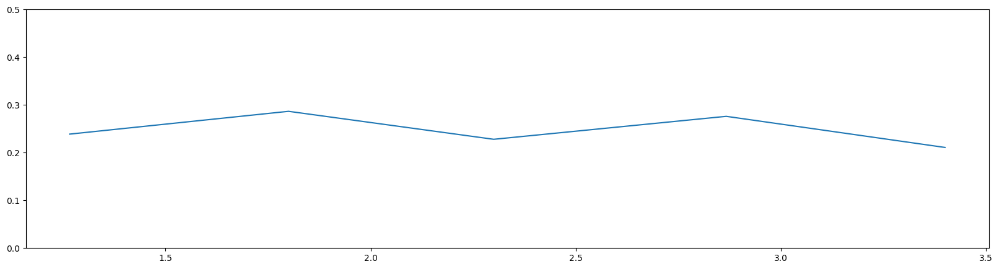

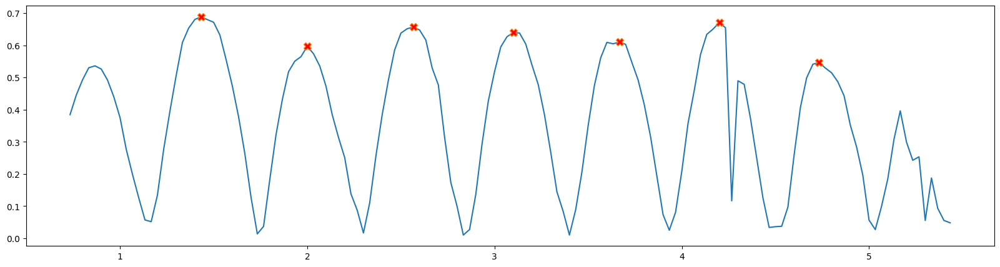

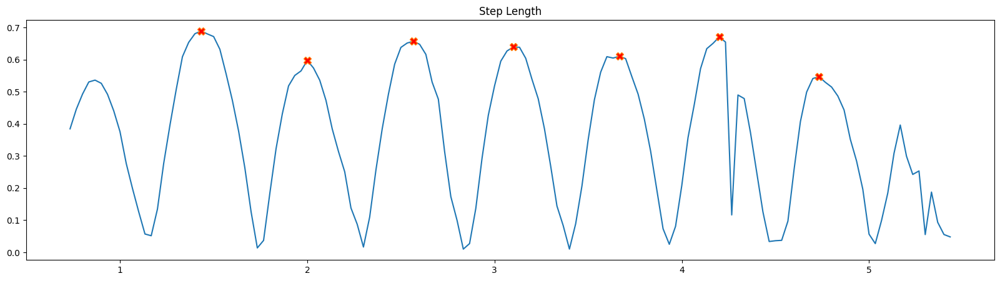

[ 21  38  55  71  88 104 120]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.523877  1.585409 -0.029398   0.955431  0.733333 -0.079500    0.350813   
1    1.491055  1.569054 -0.032087   0.984754  0.766667 -0.054980    0.346377   
2    1.423662  1.504449 -0.032478   0.964859  0.800000  0.022141    0.348171   
3    1.440991  1.520985 -0.032358   0.980668  0.833333 -0.045582    0.338159   
4    1.426377  1.502335 -0.034533   0.975363  0.866667 -0.033659    0.345128   
..        ...       ...       ...        ...       ...       ...         ...   
137  1.145125  1.239346 -0.026151   1.037170  5.300000  0.083069    0.381165   
138  1.008566  1.306001 -0.025058   0.872418  5.333333 -0.156001    0.362629   
139  1.120875  1.274702 -0.027896   0.894655  5.366667  0.338557    0.344948   
140  1.251461  1.359736  0.002367   0.880160  5.400000  1.148419    0.344015   
141  1.293728  1.388373 -0.000846   0.895226  5.433333 -2.497684    0.323165   

     visi

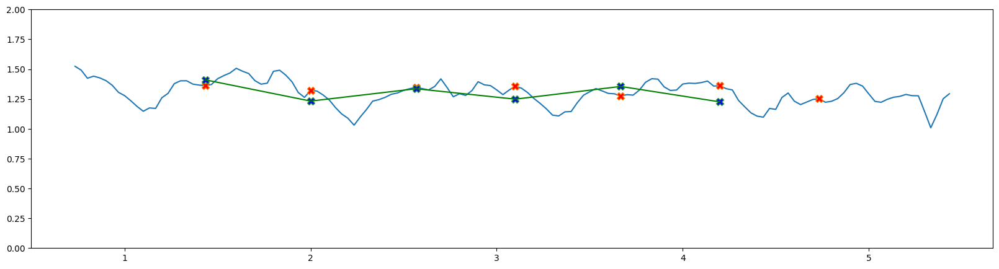

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.515145     0.611201 -0.029398  0.733333 -0.079500      0.651610   
1       0.502603     0.587644 -0.032087  0.766667 -0.054980      0.662102   
2       0.493376     0.578028 -0.032478  0.800000  0.022141      0.667328   
3       0.497933     0.577679 -0.032358  0.833333 -0.045582      0.669160   
4       0.499731     0.580536 -0.034533  0.866667 -0.033659      0.672117   
..           ...          ...       ...       ...       ...           ...   
137     0.434606     0.434671 -0.026151  5.300000  0.083069      0.232553   
138     0.418676     0.370910 -0.025058  5.333333 -0.156001      0.209293   
139     0.408887     0.351501 -0.027896  5.366667  0.338557      0.187941   
140     0.486145     0.357732  0.002367  5.400000  1.148419      0.168659   
141     0.560543     0.473485 -0.000846  5.433333 -2.497684      0.153299   

     visi_l_urm_l  
0        0.998718  
1        0.998773  
2        0.9988

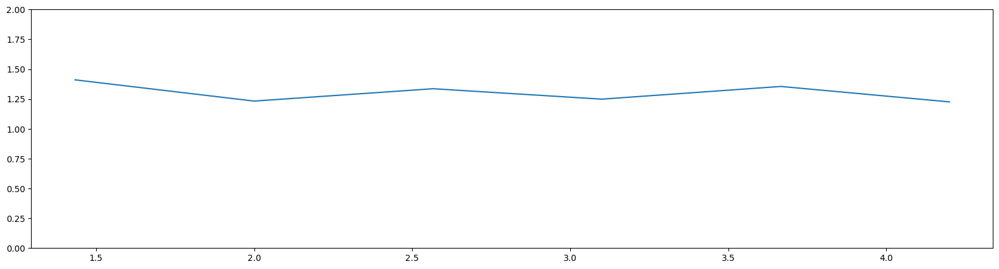

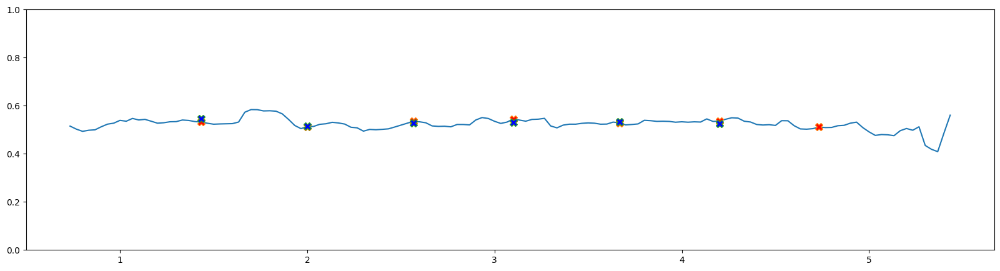

            r         l         c         t  velocity  visi_larm_r  \
0    0.403335  0.558611 -0.029398  0.733333 -0.079500     0.523258   
1    0.400579  0.551025 -0.032087  0.766667 -0.054980     0.535792   
2    0.411543  0.526608 -0.032478  0.800000  0.022141     0.542922   
3    0.424039  0.540214 -0.032358  0.833333 -0.045582     0.545027   
4    0.431986  0.550309 -0.034533  0.866667 -0.033659     0.549027   
..        ...       ...       ...       ...       ...          ...   
137  0.175319  0.098486 -0.026151  5.300000  0.083069     0.055072   
138  0.135692  0.107724 -0.025058  5.333333 -0.156001     0.045084   
139  0.147391  0.152577 -0.027896  5.366667  0.338557     0.036824   
140  0.104221  0.248898  0.002367  5.400000  1.148419     0.030107   
141  0.377301  0.487229 -0.000846  5.433333 -2.497684     0.025064   

     visi_larm_l  
0       0.990175  
1       0.990657  
2       0.991196  
3       0.991661  
4       0.992246  
..           ...  
137     0.620493  
138    

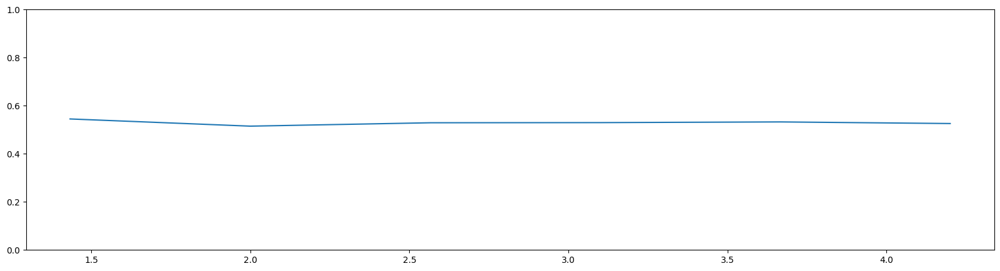

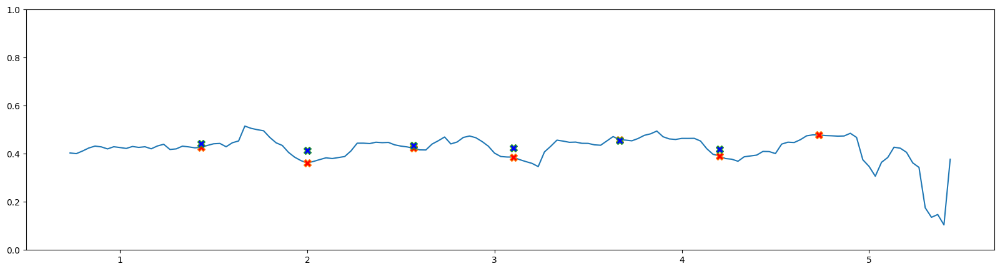

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.288579  0.337449 -0.029398  0.733333 -0.079500  0.203564  0.958046
1    0.287268  0.331835 -0.032087  0.766667 -0.054980  0.215398  0.960047
2    0.286365  0.331791 -0.032478  0.800000  0.022141  0.222657  0.962287
3    0.287527  0.334874 -0.032358  0.833333 -0.045582  0.224849  0.964186
4    0.281247  0.335772 -0.034533  0.866667 -0.033659  0.229049  0.966615
..        ...       ...       ...       ...       ...       ...       ...
137  0.122495  0.181549 -0.026151  5.300000  0.083069  0.000667  0.264388
138  0.120825  0.174362 -0.025058  5.333333 -0.156001  0.000405  0.191103
139  0.123006  0.187651 -0.027896  5.366667  0.338557  0.000244  0.139429
140  0.140507  0.137170  0.002367  5.400000  1.148419  0.000149  0.108688
141  0.259068  0.276537 -0.000846  5.433333 -2.497684  0.000096  0.109744

[142 rows x 7 columns]
t1 1.4333333333333333
t1 2.0
t1 2.566666666666667
t1 3.1
t1 3.6666666666666665
t1 4.2
re

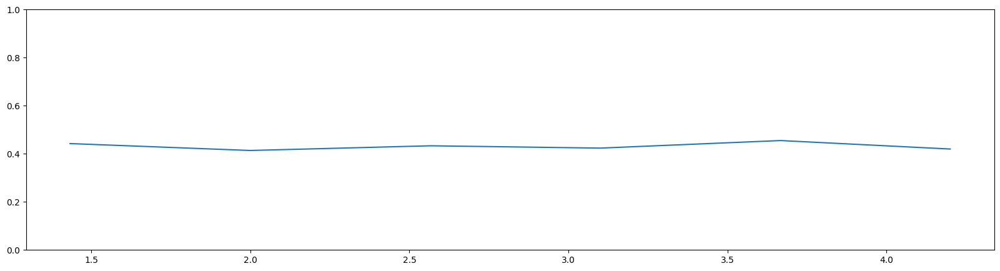

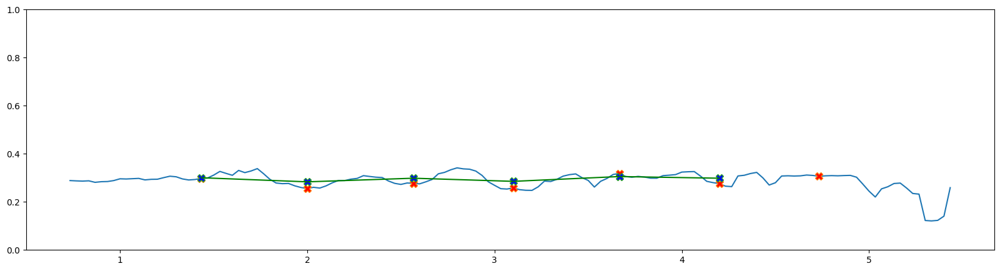

            r         l  leg_ratio         c         t  velocity  \
0    0.727832  0.761784   0.966513 -0.029398  0.733333 -0.079500   
1    0.752100  0.763744   0.917603 -0.032087  0.766667 -0.054980   
2    0.729624  0.756198   0.927547 -0.032478  0.800000  0.022141   
3    0.743656  0.758316   0.914335 -0.032358  0.833333 -0.045582   
4    0.741735  0.760471   0.922867 -0.034533  0.866667 -0.033659   
..        ...       ...        ...       ...       ...       ...   
137  0.572662  0.552138   0.833028 -0.026151  5.300000  0.083069   
138  0.536652  0.615131   0.683072 -0.025058  5.333333 -0.156001   
139  0.551397  0.616323   0.864971 -0.027896  5.366667  0.338557   
140  0.593831  0.674685   0.959972  0.002367  5.400000  1.148419   
141  0.657740  0.734720   0.972974 -0.000846  5.433333 -2.497684   

     visi_thigh_r  visi_thigh_l  
0        0.625247      0.964916  
1        0.621450      0.965972  
2        0.622305      0.968270  
3        0.614038      0.969773  
4        0.61

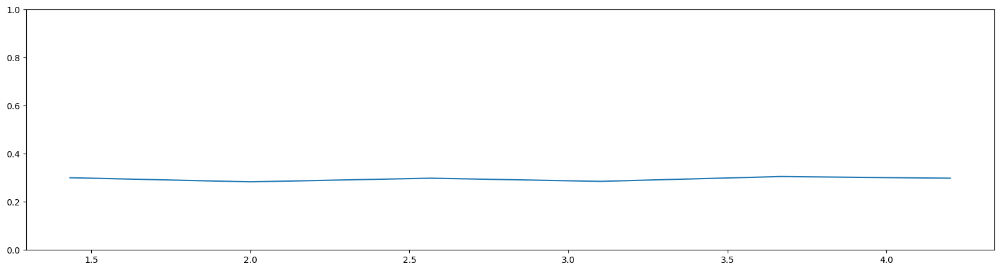

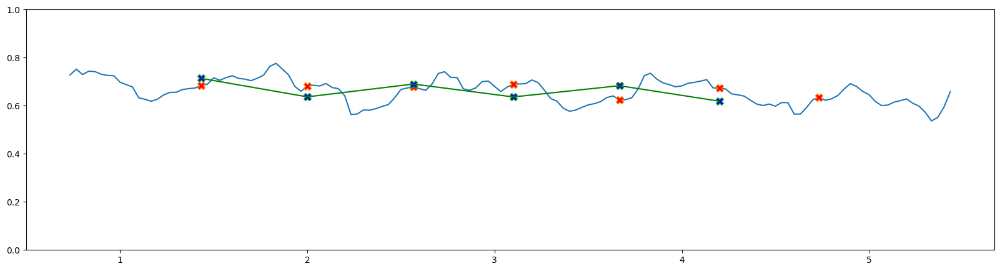

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.796045  0.823626   0.955431 -0.029398  0.733333 -0.079500    0.561080   
1    0.738955  0.805309   0.984754 -0.032087  0.766667 -0.054980    0.557370   
2    0.694037  0.748251   0.964859 -0.032478  0.800000  0.022141    0.559485   
3    0.697335  0.762669   0.980668 -0.032358  0.833333 -0.045582    0.550713   
4    0.684642  0.741865   0.975363 -0.034533  0.866667 -0.033659    0.557611   
..        ...       ...        ...       ...       ...       ...         ...   
137  0.572463  0.687208   1.037170 -0.026151  5.300000  0.083069    0.561644   
138  0.471914  0.690870   0.872418 -0.025058  5.333333 -0.156001    0.544179   
139  0.569478  0.658378   0.894655 -0.027896  5.366667  0.338557    0.527636   
140  0.657630  0.685051   0.880160  0.002367  5.400000  1.148419    0.526456   
141  0.635987  0.653653   0.895226 -0.000846  5.433333 -2.497684    0.503866   

     visi_shk_l  
0      0.951803  
1  

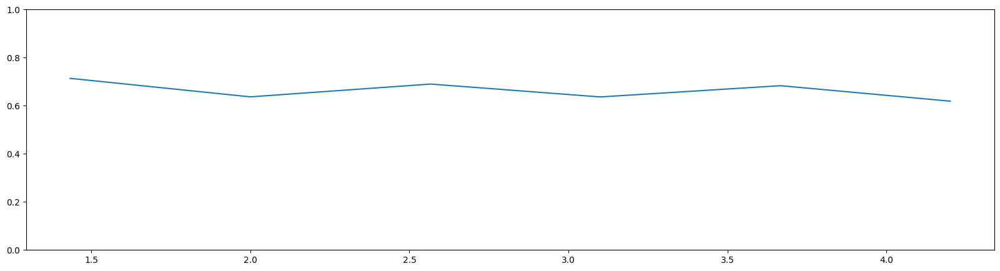

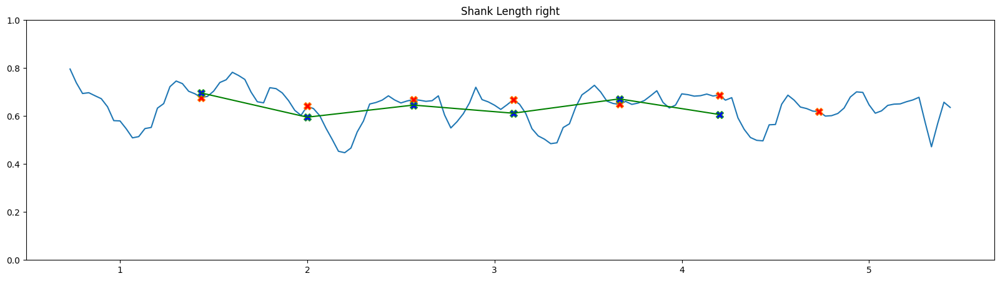

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.231114  0.249822   0.955431 -0.029398  0.733333 -0.079500     0.783428   
1    0.227468  0.212561   0.984754 -0.032087  0.766667 -0.054980     0.787694   
2    0.235166  0.212166   0.964859 -0.032478  0.800000  0.022141     0.795490   
3    0.257778  0.252330   0.980668 -0.032358  0.833333 -0.045582     0.797852   
4    0.259675  0.235176   0.975363 -0.034533  0.866667 -0.033659     0.809268   
..        ...       ...        ...       ...       ...       ...          ...   
137  0.193584  0.191323   1.037170 -0.026151  5.300000  0.083069     0.673308   
138  0.148066  0.211470   0.872418 -0.025058  5.333333 -0.156001     0.651303   
139  0.151325  0.207436   0.894655 -0.027896  5.366667  0.338557     0.631589   
140  0.203435  0.236790   0.880160  0.002367  5.400000  1.148419     0.628039   
141  0.225125  0.260453   0.895226 -0.000846  5.433333 -2.497684     0.606359   

     visi_foot_l  
0       

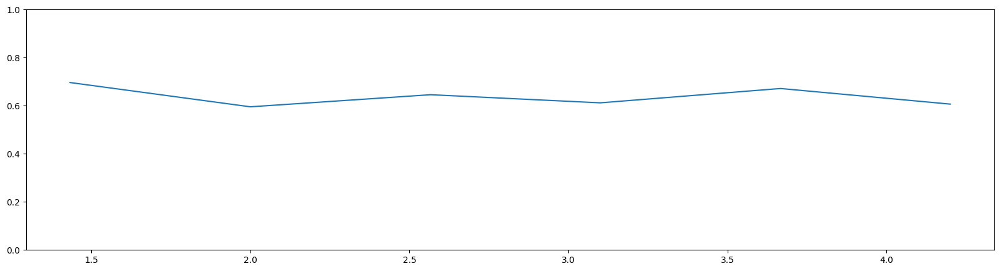

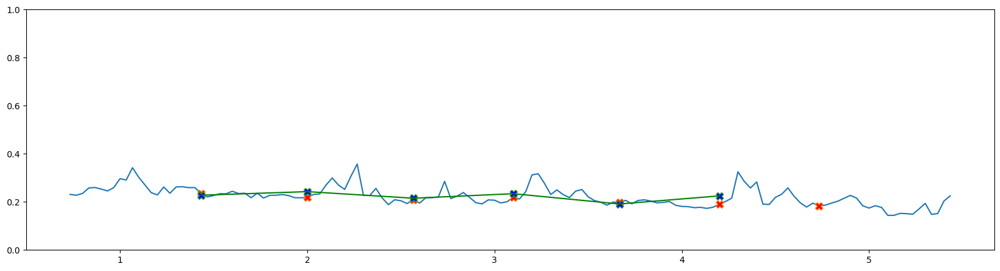

side left imantha left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.167954  1.200000 -0.041768  0.940338  0.973025  0.032913  0.084953   
1    0.169547  1.233333 -0.039167  0.936151  0.969174  0.033066  0.084302   
2    0.173747  1.266667 -0.038601  0.928822  0.963454  0.034675  0.087349   
3    0.178020  1.300000 -0.041546  0.921428  0.957051  0.035853  0.091460   
4    0.177583  1.333333 -0.047700  0.918330  0.949190  0.031146  0.088574   
..        ...       ...       ...       ...       ...       ...       ...   
133  0.176393  5.633333 -0.012400  0.039910  0.001546  0.038371  0.077286   
134  0.176648  5.666667 -0.008363  0.033261 -0.001782  0.035251  0.075566   
135  0.175224  5.700000 -0.014078  0.025991 -0.015059  0.041235  0.072170   
136  0.169826  5.733333 -0.009276  0.019754 -0.019623  0.040003  0.075715   
137  0.171893  5.766667 -0.009465  0.007173 -0.011406  0.020317  0.077185   

          sln       aln  
0    0.195962  0

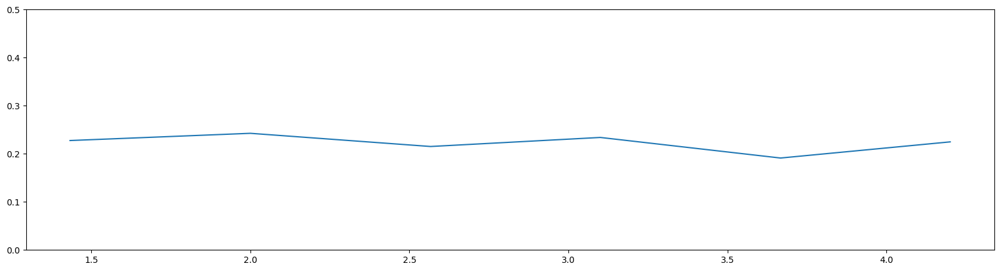

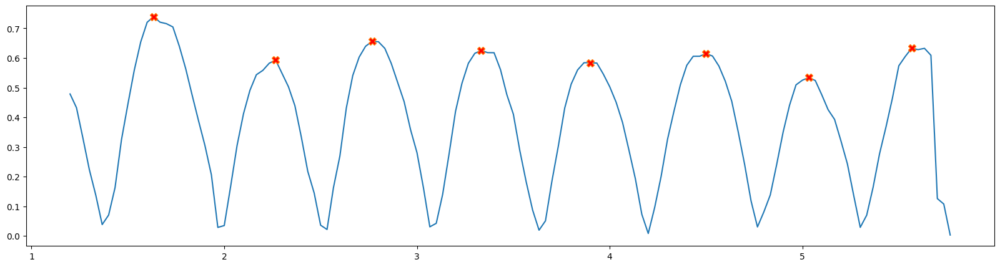

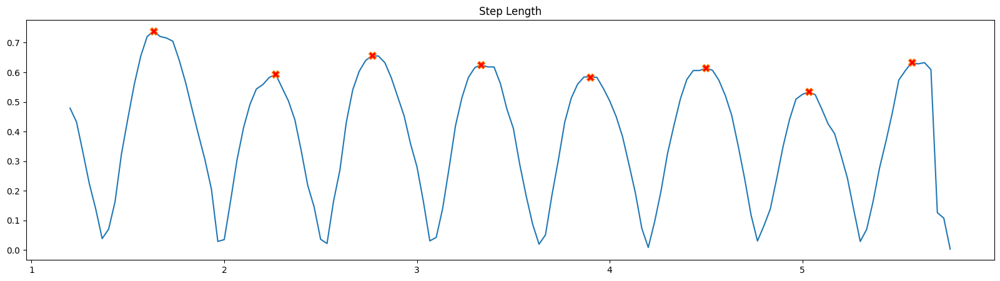

[ 13  32  47  64  81  99 115 131]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.287125  1.411713 -0.041768   1.013050  1.200000  0.127045    0.527112   
1    1.270278  1.395490 -0.039167   0.998003  1.233333  0.043926    0.528231   
2    1.150827  1.331829 -0.038601   0.956298  1.266667 -0.017786    0.541979   
3    1.094236  1.286784 -0.041546   0.855466  1.300000 -0.174293    0.566550   
4    1.102075  1.295225 -0.047700   0.834187  1.333333 -0.113439    0.592705   
..        ...       ...       ...        ...       ...       ...         ...   
133  1.285589  1.234746 -0.012400   1.024617  5.633333  0.146165    0.548195   
134  1.258444  1.151784 -0.008363   1.028739  5.666667 -0.048640    0.531439   
135  1.137836  1.259102 -0.014078   1.002760  5.700000 -0.103808    0.471301   
136  1.266103  1.136271 -0.009276   1.226022  5.733333  0.316544    0.431008   
137  1.241531  1.211944 -0.009465   1.178020  5.766667 -0.747237    0.375217   

     

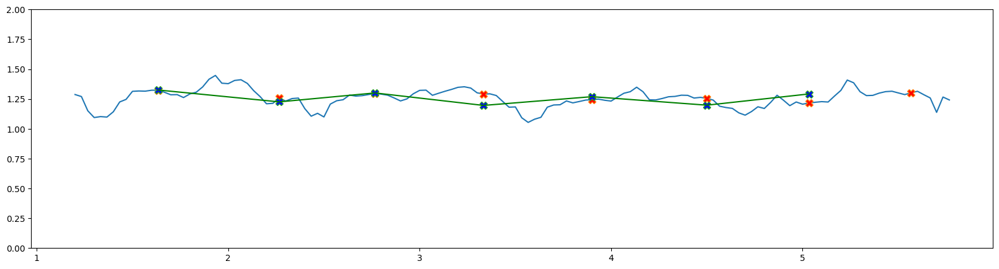

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.505811     0.568649 -0.041768  1.200000  0.127045      0.350103   
1       0.497220     0.571512 -0.039167  1.233333  0.043926      0.336174   
2       0.502738     0.568929 -0.038601  1.266667 -0.017786      0.318393   
3       0.513764     0.566918 -0.041546  1.300000 -0.174293      0.293811   
4       0.498776     0.578323 -0.047700  1.333333 -0.113439      0.268859   
..           ...          ...       ...       ...       ...           ...   
133     0.438148     0.527523 -0.012400  5.633333  0.146165      0.087829   
134     0.427775     0.445748 -0.008363  5.666667 -0.048640      0.080476   
135     0.411874     0.359227 -0.014078  5.700000 -0.103808      0.073391   
136     0.445838     0.291183 -0.009276  5.733333  0.316544      0.068961   
137     0.449029     0.324992 -0.009465  5.766667 -0.747237      0.062524   

     visi_l_urm_l  
0        0.997485  
1        0.997566  
2        0.9976

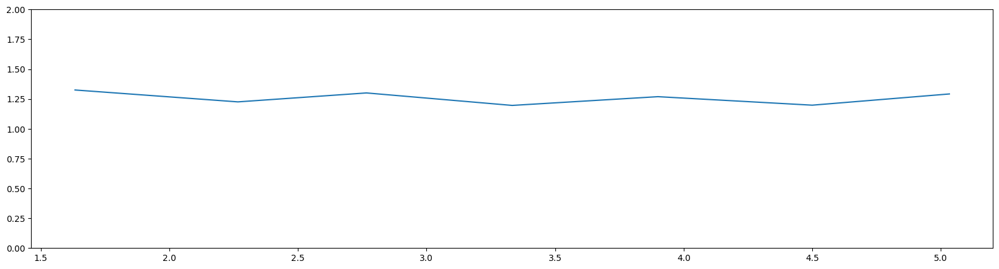

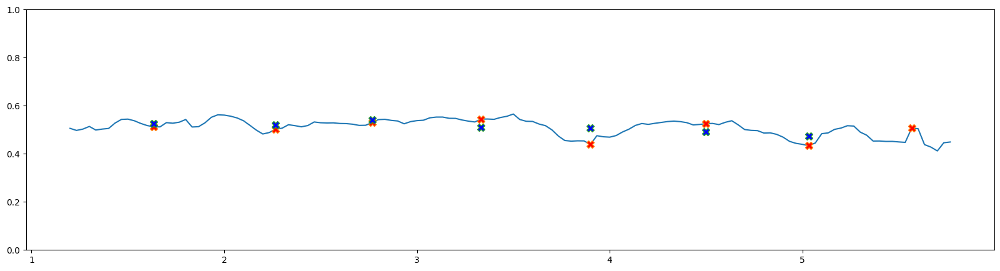

            r         l         c         t  velocity  visi_larm_r  \
0    0.424552  0.541525 -0.041768  1.200000  0.127045     0.216973   
1    0.419107  0.540709 -0.039167  1.233333  0.043926     0.205616   
2    0.397767  0.531543 -0.038601  1.266667 -0.017786     0.189207   
3    0.419900  0.520387 -0.041546  1.300000 -0.174293     0.162526   
4    0.457603  0.517366 -0.047700  1.333333 -0.113439     0.136571   
..        ...       ...       ...       ...       ...          ...   
133  0.234461  0.351730 -0.012400  5.633333  0.146165     0.007880   
134  0.236374  0.231686 -0.008363  5.666667 -0.048640     0.006579   
135  0.221698  0.112117 -0.014078  5.700000 -0.103808     0.005478   
136  0.237142  0.090878 -0.009276  5.733333  0.316544     0.004780   
137  0.238806  0.104223 -0.009465  5.766667 -0.747237     0.003969   

     visi_larm_l  
0       0.988178  
1       0.988465  
2       0.988840  
3       0.989571  
4       0.990214  
..           ...  
133     0.869786  
134    

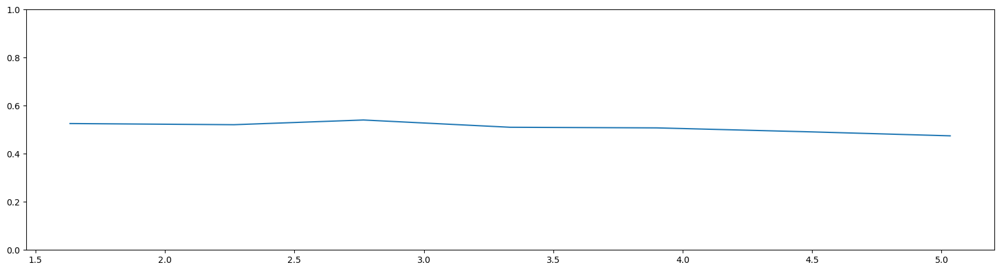

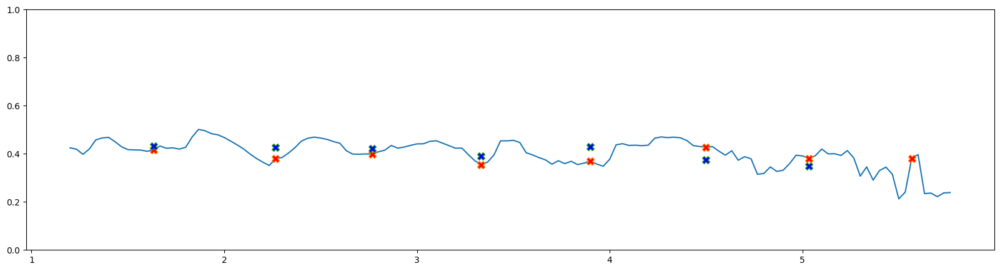

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.304589  0.360684 -0.041768  1.200000  0.127045  0.028650  0.954517
1    0.300005  0.350768 -0.039167  1.233333  0.043926  0.025552  0.955704
2    0.294941  0.342414 -0.038601  1.266667 -0.017786  0.021195  0.957234
3    0.287226  0.333711 -0.041546  1.300000 -0.174293  0.014665  0.959973
4    0.283010  0.321571 -0.047700  1.333333 -0.113439  0.009551  0.962359
..        ...       ...       ...       ...       ...       ...       ...
133  0.173458  0.211350 -0.012400  5.633333  0.146165  0.000006  0.666710
134  0.172375  0.144062 -0.008363  5.666667 -0.048640  0.000004  0.514654
135  0.171947  0.096602 -0.014078  5.700000 -0.103808  0.000002  0.351020
136  0.206705  0.089734 -0.009276  5.733333  0.316544  0.000002  0.247755
137  0.196471  0.105810 -0.009465  5.766667 -0.747237  0.000001  0.168534

[138 rows x 7 columns]
t1 1.6333333333333333
t1 2.2666666666666666
t1 2.7666666666666666
t1 3.3333333333333335


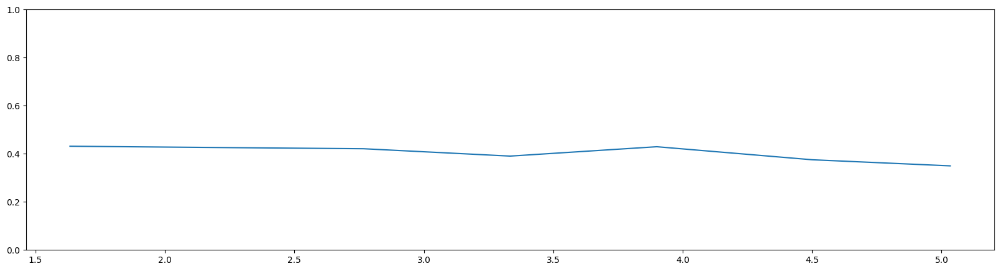

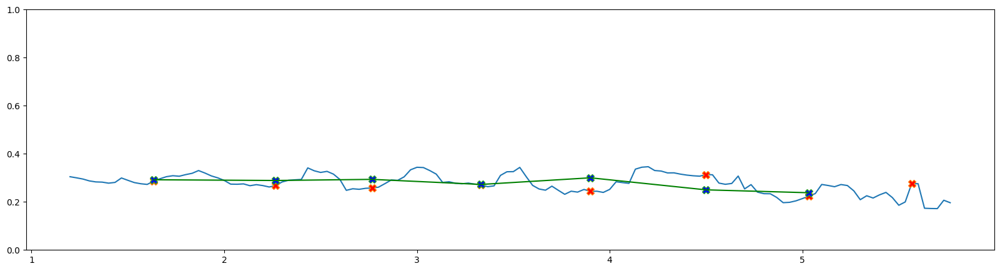

            r         l  leg_ratio         c         t  velocity  \
0    0.696199  0.687230   0.815653 -0.041768  1.200000  0.127045   
1    0.700695  0.702097   0.821443 -0.039167  1.233333  0.043926   
2    0.654260  0.684159   0.766697 -0.038601  1.266667 -0.017786   
3    0.576843  0.674303   0.844750 -0.041546  1.300000 -0.174293   
4    0.568860  0.681934   0.869432 -0.047700  1.333333 -0.113439   
..        ...       ...        ...       ...       ...       ...   
133  0.625259  0.610236   1.057358 -0.012400  5.633333  0.146165   
134  0.609136  0.592119   1.160173 -0.008363  5.666667 -0.048640   
135  0.566316  0.564757   0.823108 -0.014078  5.700000 -0.103808   
136  0.618099  0.504150   1.025127 -0.009276  5.733333  0.316544   
137  0.607685  0.515852   0.910578 -0.009465  5.766667 -0.747237   

     visi_thigh_r  visi_thigh_l  
0        0.764952      0.947891  
1        0.764080      0.948942  
2        0.772165      0.950038  
3        0.787477      0.952616  
4        0.80

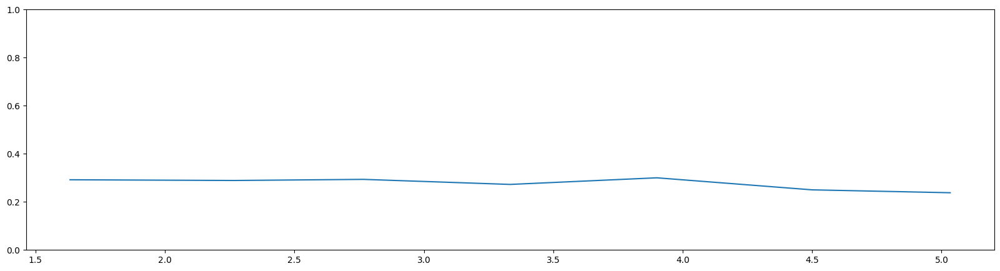

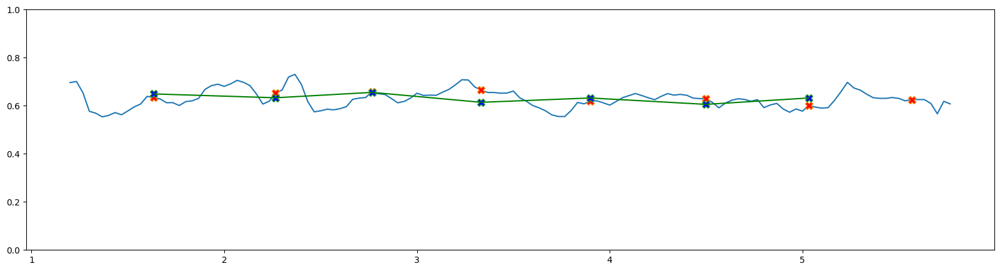

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.590926  0.724483   1.013050 -0.041768  1.200000  0.127045    0.689078   
1    0.569583  0.693393   0.998003 -0.039167  1.233333  0.043926    0.691329   
2    0.496567  0.647671   0.956298 -0.038601  1.266667 -0.017786    0.701895   
3    0.517394  0.612481   0.855466 -0.041546  1.300000 -0.174293    0.719449   
4    0.533215  0.613291   0.834187 -0.047700  1.333333 -0.113439    0.737750   
..        ...       ...        ...       ...       ...       ...         ...   
133  0.660331  0.624510   1.024617 -0.012400  5.633333  0.146165    0.702571   
134  0.649308  0.559665   1.028739 -0.008363  5.666667 -0.048640    0.686217   
135  0.571520  0.694344   1.002760 -0.014078  5.700000 -0.103808    0.634015   
136  0.648004  0.632121   1.226022 -0.009276  5.733333  0.316544    0.597982   
137  0.633846  0.696092   1.178020 -0.009465  5.766667 -0.747237    0.549609   

     visi_shk_l  
0      0.937251  
1  

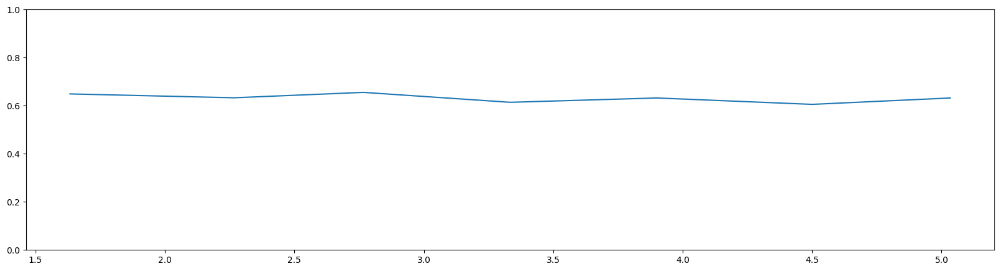

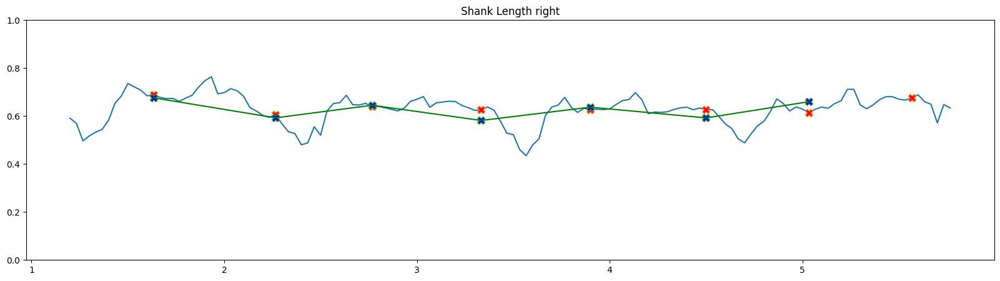

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.153844  0.218878   1.013050 -0.041768  1.200000  0.127045     0.836532   
1    0.253481  0.229669   0.998003 -0.039167  1.233333  0.043926     0.844234   
2    0.323411  0.226569   0.956298 -0.038601  1.266667 -0.017786     0.851427   
3    0.304609  0.218241   0.855466 -0.041546  1.300000 -0.174293     0.857574   
4    0.285797  0.210686   0.834187 -0.047700  1.333333 -0.113439     0.863399   
..        ...       ...        ...       ...       ...       ...          ...   
133  0.154128  0.211839   1.024617 -0.012400  5.633333  0.146165     0.749519   
134  0.164549  0.180870   1.028739 -0.008363  5.666667 -0.048640     0.713542   
135  0.175731  0.187331   1.002760 -0.014078  5.700000 -0.103808     0.658281   
136  0.205204  0.217800   1.226022 -0.009276  5.733333  0.316544     0.616372   
137  0.259488  0.227458   1.178020 -0.009465  5.766667 -0.747237     0.586186   

     visi_foot_l  
0       

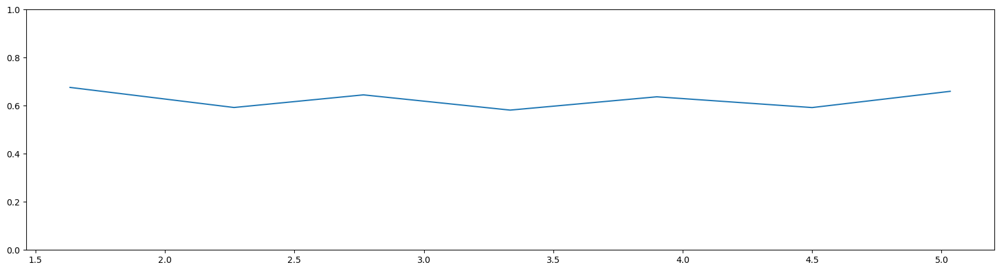

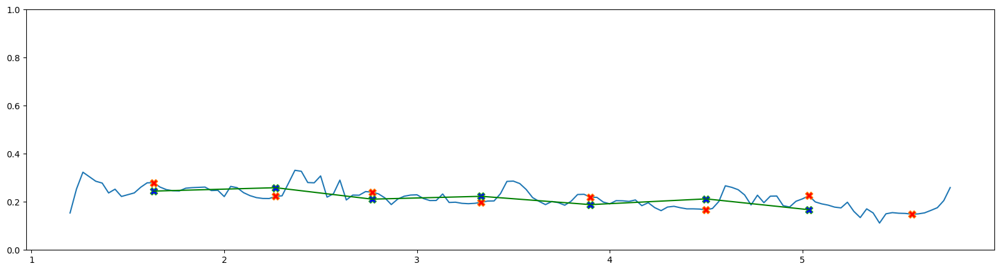

side left nirmana left 3 (7, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.162081  0.833333 -0.076584  0.949121  0.977781  0.029204  0.095811   
1    0.162682  0.866667 -0.065633  0.946867  0.972217  0.025722  0.095184   
2    0.164225  0.900000 -0.052218  0.942673  0.964897  0.022226  0.094087   
3    0.164014  0.933333 -0.058775  0.932188  0.955748  0.023561  0.095060   
4    0.164250  0.966667 -0.054377  0.924437  0.947443  0.023016  0.095473   
..        ...       ...       ...       ...       ...       ...       ...   
141  0.159487  5.533333 -0.015533 -0.074311 -0.045451  0.029054  0.049576   
142  0.166357  5.566667 -0.015043 -0.092813 -0.069646  0.026816  0.014812   
143  0.175831  5.600000 -0.006806 -0.090479 -0.059774  0.034347  0.014033   
144  0.186168  5.633333 -0.009718 -0.085388 -0.051733  0.034570  0.013895   
145  0.194956  5.666667 -0.007810 -0.091665 -0.051761  0.040633  0.006641   

          sln       aln  
0    0.180182  0

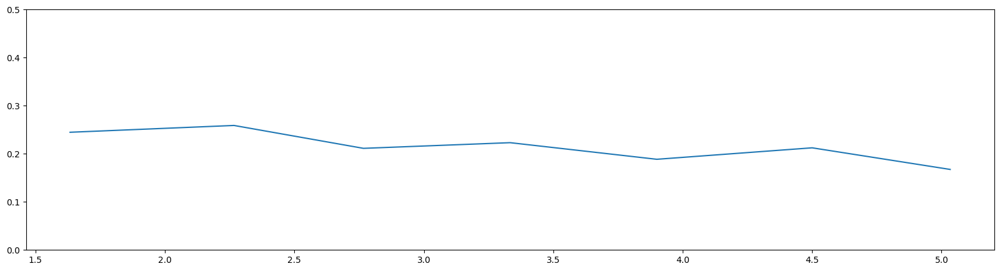

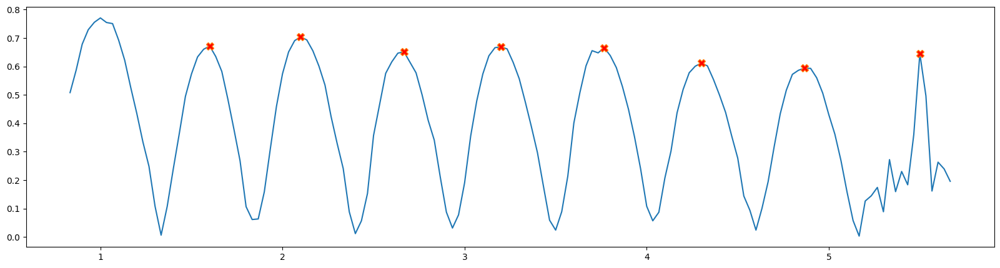

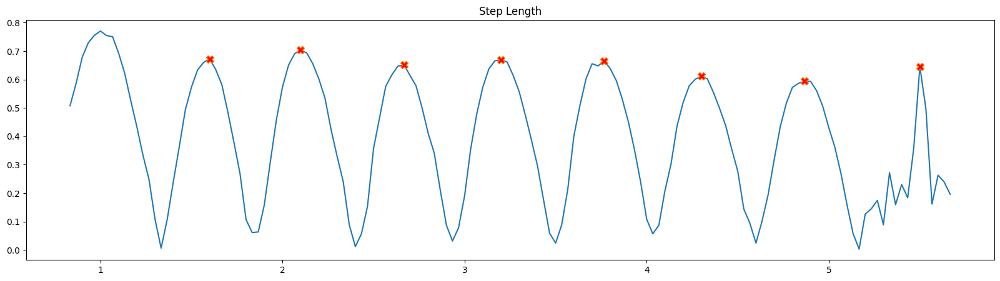

[ 23  38  55  71  88 104 121 140]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.512807  1.505642 -0.076584   0.925213  0.833333 -0.632740    0.799047   
1    1.499856  1.504150 -0.065633   0.922949  0.866667  0.710097    0.803099   
2    1.469293  1.485331 -0.052218   0.942536  0.900000 -0.014709    0.806326   
3    1.456716  1.487811 -0.058775   0.986204  0.933333 -0.114040    0.815060   
4    1.448294  1.489383 -0.054377   0.990931  0.966667  0.253587    0.824556   
..        ...       ...       ...        ...       ...       ...         ...   
141  1.022624  1.359628 -0.015533   0.622992  5.533333  0.266187    0.319901   
142  1.031886  1.219423 -0.015043   0.700226  5.566667  0.070976    0.330990   
143  1.031939  1.236827 -0.006806   0.773809  5.600000  0.200369    0.359860   
144  1.096292  1.337763 -0.009718   0.783429  5.633333 -0.298416    0.385002   
145  1.224098  1.378918 -0.007810   0.847309  5.666667  0.902917    0.415659   

     

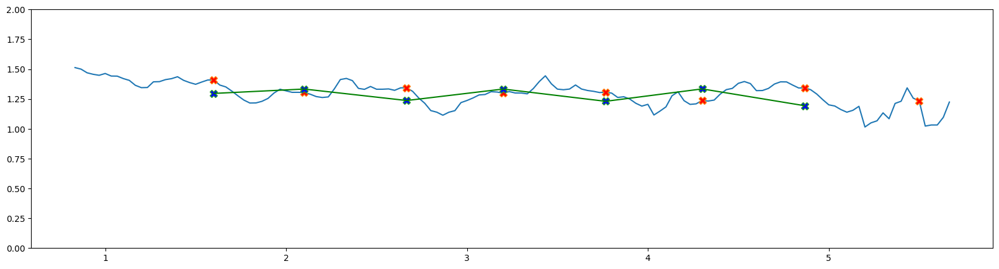

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.591128     0.640634 -0.076584  0.833333 -0.632740      0.219045   
1       0.585090     0.633215 -0.065633  0.866667  0.710097      0.208423   
2       0.572914     0.621882 -0.052218  0.900000 -0.014709      0.193495   
3       0.579586     0.620536 -0.058775  0.933333 -0.114040      0.179759   
4       0.581264     0.618121 -0.054377  0.966667  0.253587      0.169097   
..           ...          ...       ...       ...       ...           ...   
141     0.310847     0.490863 -0.015533  5.533333  0.266187      0.044141   
142     0.089036     0.381993 -0.015043  5.566667  0.070976      0.043798   
143     0.079810     0.272019 -0.006806  5.600000  0.200369      0.051674   
144     0.074639     0.227322 -0.009718  5.633333 -0.298416      0.071596   
145     0.034063     0.235204 -0.007810  5.666667  0.902917      0.081954   

     visi_l_urm_l  
0        0.994567  
1        0.994961  
2        0.9953

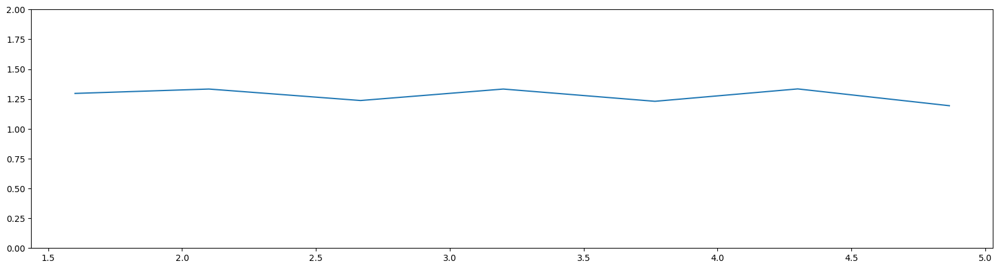

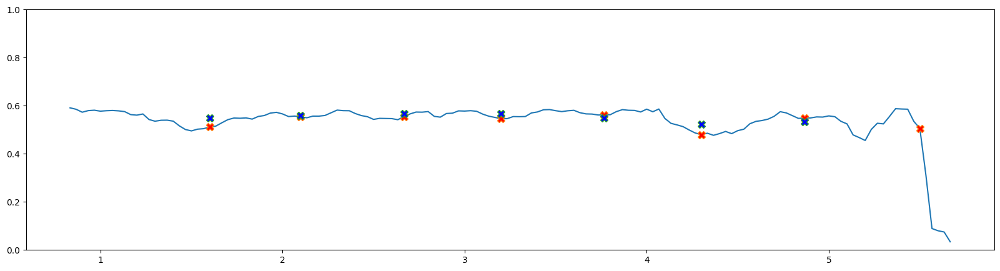

            r         l         c         t  velocity  visi_larm_r  \
0    0.416623  0.509227 -0.076584  0.833333 -0.632740     0.069633   
1    0.416066  0.498870 -0.065633  0.866667  0.710097     0.063830   
2    0.403249  0.502799 -0.052218  0.900000 -0.014709     0.055374   
3    0.391307  0.491414 -0.058775  0.933333 -0.114040     0.047862   
4    0.411351  0.482895 -0.054377  0.966667  0.253587     0.042574   
..        ...       ...       ...       ...       ...          ...   
141  0.117582  0.211369 -0.015533  5.533333  0.266187     0.002261   
142  0.332084  0.204870 -0.015043  5.566667  0.070976     0.002447   
143  0.318699  0.041495 -0.006806  5.600000  0.200369     0.003504   
144  0.364706  0.029991 -0.009718  5.633333 -0.298416     0.006555   
145  0.338391  0.119775 -0.007810  5.666667  0.902917     0.008680   

     visi_larm_l  
0       0.973596  
1       0.975568  
2       0.977492  
3       0.978917  
4       0.980232  
..           ...  
141     0.524417  
142    

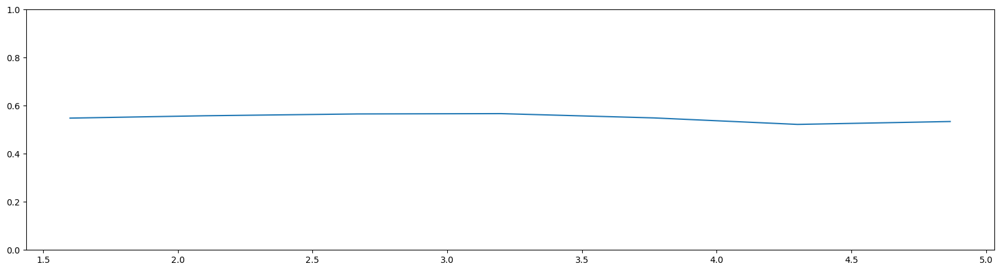

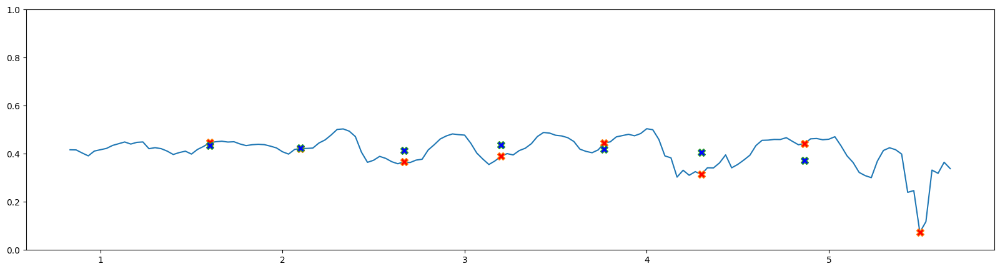

            r         l         c         t  velocity      visi_l_r  visi_l_l
0    0.290709  0.336293 -0.076584  0.833333 -0.632740  1.342761e-03  0.898575
1    0.284806  0.315715 -0.065633  0.866667  0.710097  1.093437e-03  0.905681
2    0.278663  0.315595 -0.052218  0.900000 -0.014709  7.739078e-04  0.912702
3    0.282493  0.309856 -0.058775  0.933333 -0.114040  5.418355e-04  0.917755
4    0.310966  0.308027 -0.054377  0.966667  0.253587  4.077962e-04  0.922560
..        ...       ...       ...       ...       ...           ...       ...
141  0.138426  0.132337 -0.015533  5.533333  0.266187  3.106427e-07  0.160104
142  0.171625  0.143094 -0.015043  5.566667  0.070976  3.915134e-07  0.127885
143  0.152232  0.079320 -0.006806  5.600000  0.200369  9.159314e-07  0.098998
144  0.161416  0.077912 -0.009718  5.633333 -0.298416  3.877733e-06  0.082394
145  0.153254  0.196569 -0.007810  5.666667  0.902917  7.588702e-06  0.078007

[146 rows x 7 columns]
t1 1.6
t1 2.1
t1 2.6666666666666665
t1 3

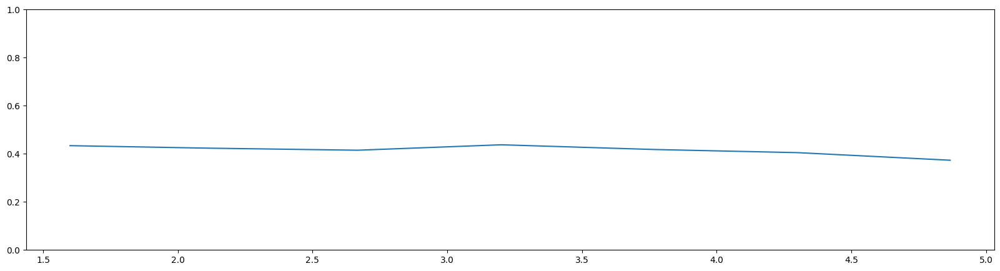

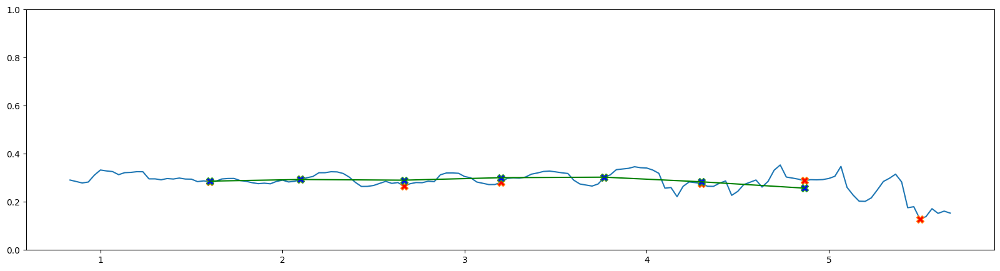

            r         l  leg_ratio         c         t  velocity  \
0    0.700624  0.757257   1.085248 -0.076584  0.833333 -0.632740   
1    0.700759  0.759261   1.072774 -0.065633  0.866667  0.710097   
2    0.709928  0.753210   1.037213 -0.052218  0.900000 -0.014709   
3    0.742644  0.753033   0.971819 -0.058775  0.933333 -0.114040   
4    0.743656  0.750462   0.953604 -0.054377  0.966667  0.253587   
..        ...       ...        ...       ...       ...       ...   
141  0.438972  0.704619   0.891059 -0.015533  5.533333  0.266187   
142  0.478894  0.683913   1.032645 -0.015043  5.566667  0.070976   
143  0.526204  0.680018   0.908275 -0.006806  5.600000  0.200369   
144  0.535569  0.683621   0.857189 -0.009718  5.633333 -0.298416   
145  0.615896  0.726885   0.932778 -0.007810  5.666667  0.902917   

     visi_thigh_r  visi_thigh_l  
0        0.921964      0.989054  
1        0.923267      0.989118  
2        0.923911      0.989365  
3        0.927039      0.989731  
4        0.93

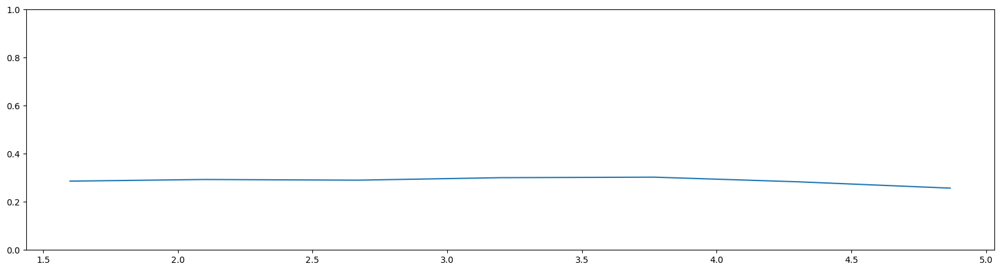

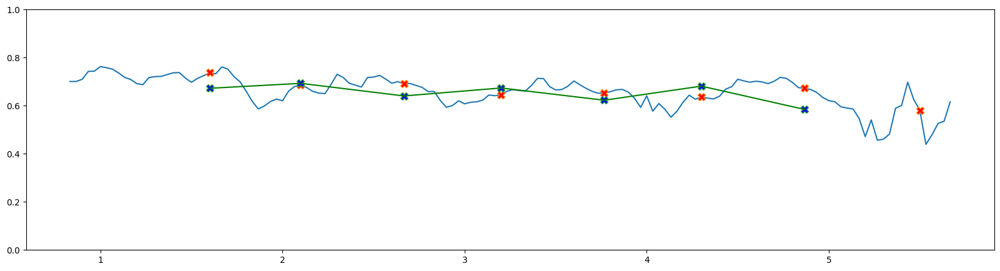

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.812183  0.748385   0.925213 -0.076584  0.833333 -0.632740    0.866680   
1    0.799097  0.744889   0.922949 -0.065633  0.866667  0.710097    0.869845   
2    0.759365  0.732121   0.942536 -0.052218  0.900000 -0.014709    0.872731   
3    0.714072  0.734779   0.986204 -0.058775  0.933333 -0.114040    0.879208   
4    0.704638  0.738921   0.990931 -0.054377  0.966667  0.253587    0.886153   
..        ...       ...        ...       ...       ...       ...         ...   
141  0.583652  0.655010   0.622992 -0.015533  5.533333  0.266187    0.492975   
142  0.552992  0.535510   0.700226 -0.015043  5.566667  0.070976    0.502951   
143  0.505735  0.556809   0.773809 -0.006806  5.600000  0.200369    0.528129   
144  0.560723  0.654142   0.783429 -0.009718  5.633333 -0.298416    0.547514   
145  0.608202  0.652033   0.847309 -0.007810  5.666667  0.902917    0.572868   

     visi_shk_l  
0      0.978088  
1  

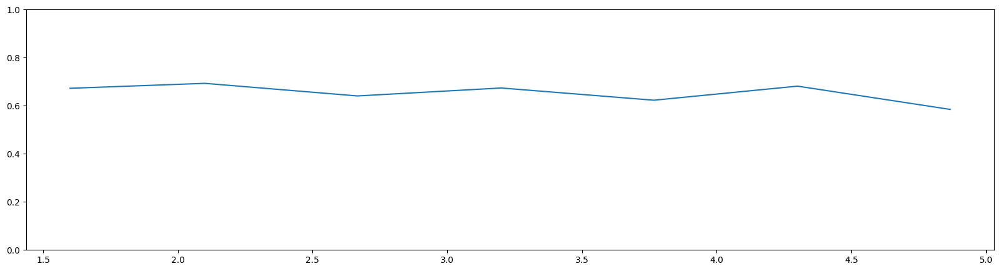

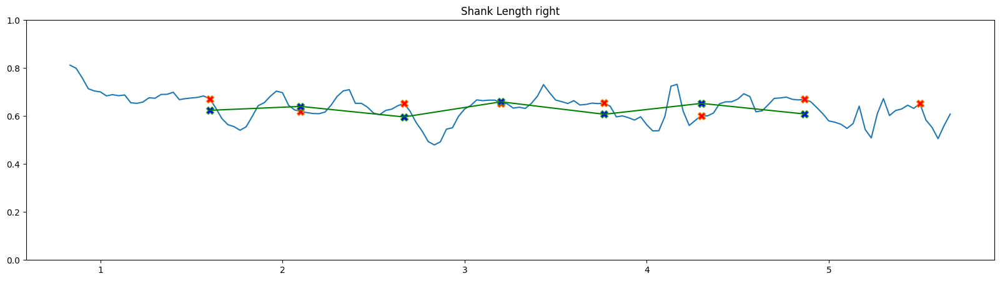

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.253709  0.191434   0.925213 -0.076584  0.833333 -0.632740     0.798928   
1    0.224393  0.189027   0.922949 -0.065633  0.866667  0.710097     0.800861   
2    0.240006  0.185147   0.942536 -0.052218  0.900000 -0.014709     0.802222   
3    0.263580  0.185944   0.986204 -0.058775  0.933333 -0.114040     0.808014   
4    0.253191  0.190719   0.990931 -0.054377  0.966667  0.253587     0.817714   
..        ...       ...        ...       ...       ...       ...          ...   
141  0.192565  0.143742   0.622992 -0.015533  5.533333  0.266187     0.540149   
142  0.202870  0.193706   0.700226 -0.015043  5.566667  0.070976     0.538742   
143  0.205045  0.169902   0.773809 -0.006806  5.600000  0.200369     0.536998   
144  0.207732  0.092281   0.783429 -0.009718  5.633333 -0.298416     0.528276   
145  0.210691  0.119140   0.847309 -0.007810  5.666667  0.902917     0.535239   

     visi_foot_l  
0       

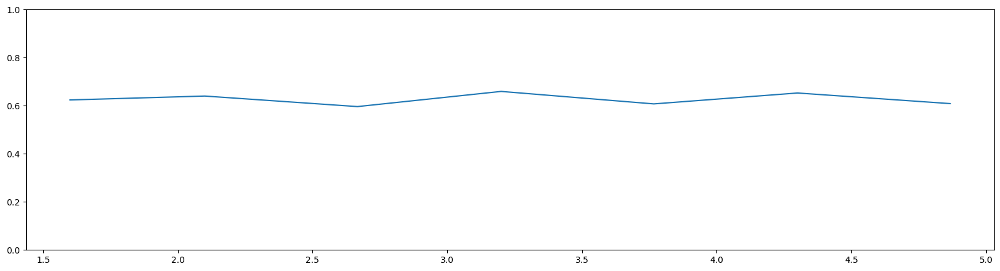

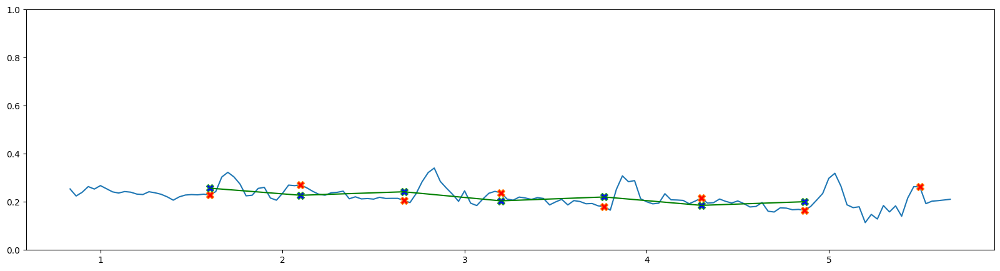

side left padmaranga left 3 (7, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.196519  0.766667 -0.047031  0.932725  0.976352  0.045194  0.091428   
1    0.189270  0.800000 -0.055031  0.929163  0.966219  0.039298  0.091638   
2    0.183556  0.833333 -0.053928  0.918760  0.956172  0.039602  0.091448   
3    0.180373  0.866667 -0.046063  0.910742  0.947267  0.039397  0.091931   
4    0.180677  0.900000 -0.037525  0.904878  0.939702  0.037925  0.092420   
..        ...       ...       ...       ...       ...       ...       ...   
115  0.184039  4.600000 -0.007700  0.042718  0.001043  0.042000  0.087231   
116  0.183165  4.633333 -0.018263  0.036549 -0.003492  0.040081  0.081321   
117  0.180883  4.666667 -0.021741  0.031275 -0.016025  0.047323  0.075088   
118  0.179062  4.700000 -0.022787  0.026235 -0.021874  0.048131  0.075614   
119  0.181135  4.733333 -0.035072  0.014915 -0.027149  0.042976  0.080115   

          sln       aln  
0    0.229970

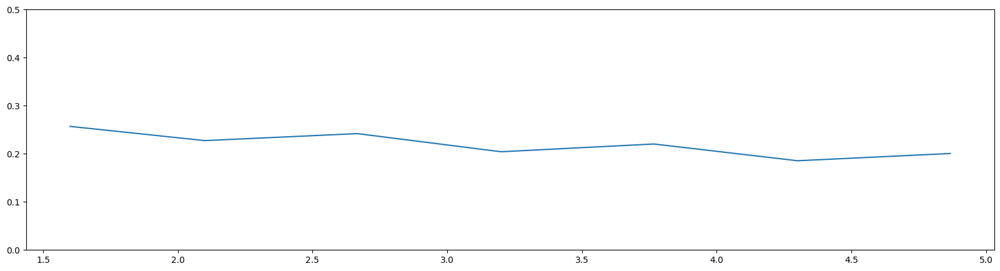

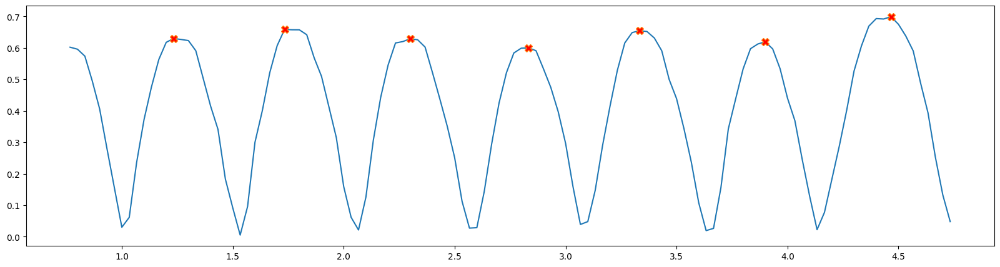

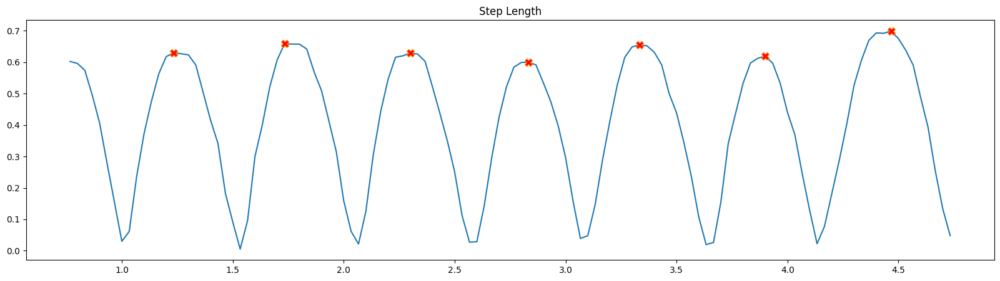

[ 14  29  46  62  77  94 111]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.140977  1.173715 -0.047031   0.853136  0.766667 -0.364274    0.875604   
1    1.214258  1.249573 -0.055031   0.902928  0.800000 -0.103622    0.876821   
2    1.290278  1.314523 -0.053928   0.907520  0.833333  0.158042    0.871485   
3    1.342770  1.289232 -0.046063   0.901155  0.866667  0.280583    0.848961   
4    1.345564  1.286420 -0.037525   0.883221  0.900000  0.199144    0.817828   
..        ...       ...       ...        ...       ...       ...         ...   
115  1.104687  1.304311 -0.007700   0.931692  4.600000 -0.240461    0.609257   
116  1.088842  1.310061 -0.018263   0.935360  4.633333 -0.260020    0.535496   
117  1.088134  1.312283 -0.021741   0.897576  4.666667  0.001482    0.456482   
118  1.100756  1.323497 -0.022787   0.908689  4.700000 -0.133243    0.389336   
119  1.166382  1.332667 -0.035072   0.896665  4.733333 -0.668304    0.321430   

     visi

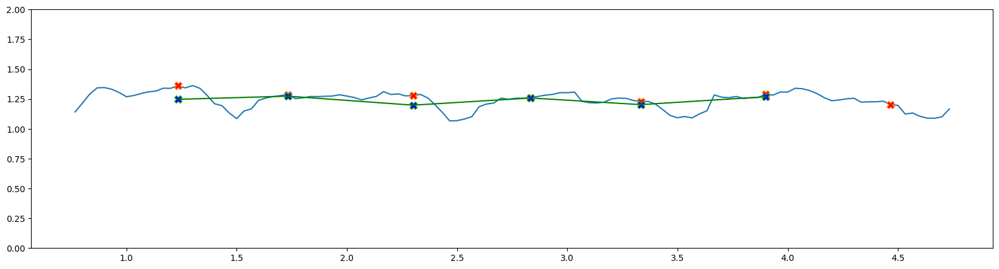

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.465237     0.536554 -0.047031  0.766667 -0.364274      0.129102   
1       0.484166     0.544326 -0.055031  0.800000 -0.103622      0.122710   
2       0.498200     0.557659 -0.053928  0.833333  0.158042      0.117257   
3       0.509673     0.571304 -0.046063  0.866667  0.280583      0.111857   
4       0.511523     0.567216 -0.037525  0.900000  0.199144      0.106325   
..           ...          ...       ...       ...       ...           ...   
115     0.473981     0.564221 -0.007700  4.600000 -0.240461      0.164018   
116     0.443977     0.496965 -0.018263  4.633333 -0.260020      0.148027   
117     0.415116     0.327593 -0.021741  4.666667  0.001482      0.133969   
118     0.422280     0.320969 -0.022787  4.700000 -0.133243      0.121890   
119     0.442295     0.339229 -0.035072  4.733333 -0.668304      0.113415   

     visi_l_urm_l  
0        0.995430  
1        0.995691  
2        0.9959

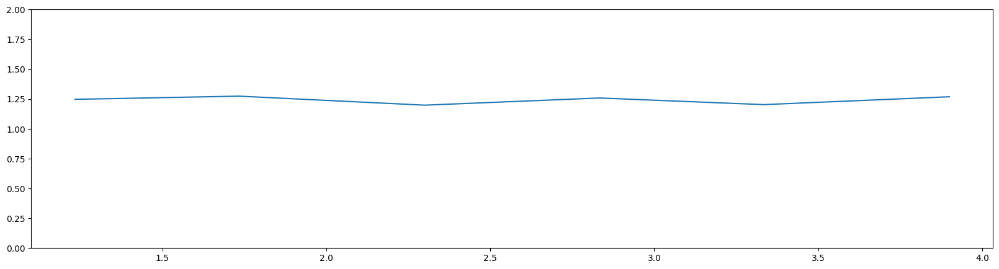

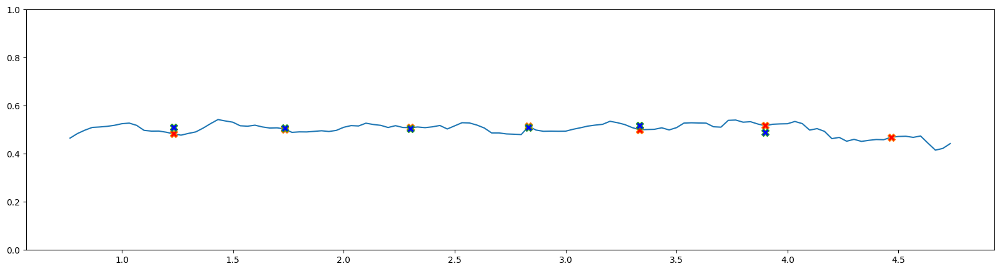

            r         l         c         t  velocity  visi_larm_r  \
0    0.293221  0.402299 -0.047031  0.766667 -0.364274     0.043285   
1    0.363136  0.451996 -0.055031  0.800000 -0.103622     0.039250   
2    0.399437  0.481248 -0.053928  0.833333  0.158042     0.036110   
3    0.402335  0.493598 -0.046063  0.866667  0.280583     0.033029   
4    0.454831  0.515290 -0.037525  0.900000  0.199144     0.030089   
..        ...       ...       ...       ...       ...          ...   
115  0.397657  0.514630 -0.007700  4.600000 -0.240461     0.032145   
116  0.224858  0.187738 -0.018263  4.633333 -0.260020     0.026182   
117  0.203442  0.021826 -0.021741  4.666667  0.001482     0.021408   
118  0.171104  0.024432 -0.022787  4.700000 -0.133243     0.017623   
119  0.448165  0.160461 -0.035072  4.733333 -0.668304     0.015166   

     visi_larm_l  
0       0.984941  
1       0.985531  
2       0.986164  
3       0.986640  
4       0.987359  
..           ...  
115     0.914755  
116    

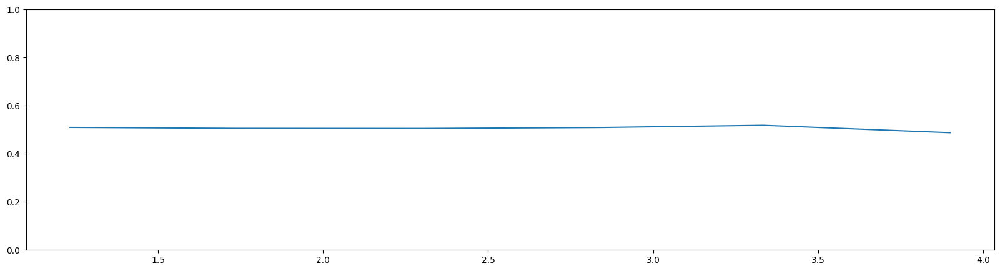

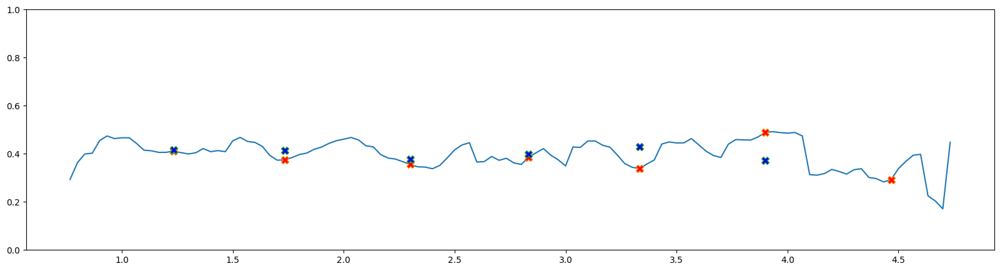

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.297770  0.284241 -0.047031  0.766667 -0.364274  0.000621  0.946352
1    0.284616  0.311659 -0.055031  0.800000 -0.103622  0.000489  0.947963
2    0.291458  0.325481 -0.053928  0.833333  0.158042  0.000401  0.949748
3    0.317697  0.340939 -0.046063  0.866667  0.280583  0.000324  0.950976
4    0.307824  0.354933 -0.037525  0.900000  0.199144  0.000260  0.953288
..        ...       ...       ...       ...       ...       ...       ...
115  0.273924  0.329616 -0.007700  4.600000 -0.240461  0.000196  0.749884
116  0.167684  0.138487 -0.018263  4.633333 -0.260020  0.000117  0.533761
117  0.158384  0.102687 -0.021741  4.666667  0.001482  0.000071  0.379031
118  0.148169  0.094234 -0.022787  4.700000 -0.133243  0.000043  0.285889
119  0.280274  0.112892 -0.035072  4.733333 -0.668304  0.000030  0.176747

[120 rows x 7 columns]
t1 1.2333333333333334
t1 1.7333333333333334
t1 2.3
t1 2.8333333333333335
t1 3.3333333333

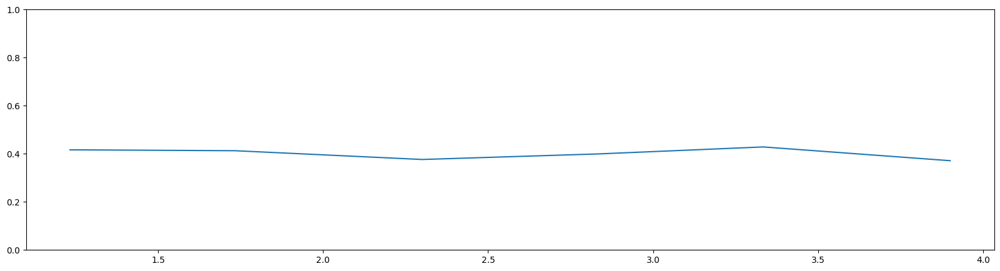

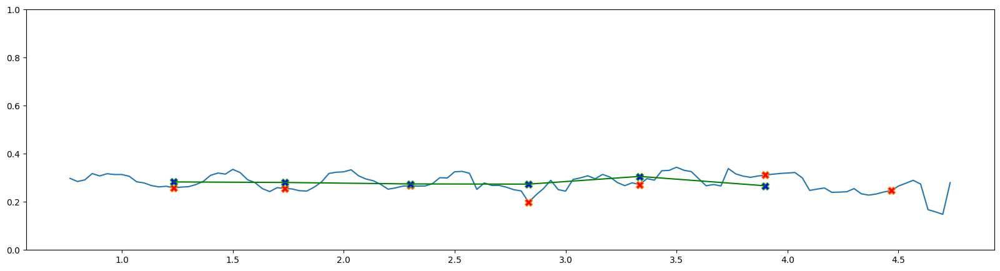

            r         l  leg_ratio         c         t  velocity  \
0    0.548419  0.642827   1.116165 -0.047031  0.766667 -0.364274   
1    0.563545  0.624130   1.040404 -0.055031  0.800000 -0.103622   
2    0.594857  0.655475   1.055191 -0.053928  0.833333  0.158042   
3    0.613399  0.680681   1.198537 -0.046063  0.866667  0.280583   
4    0.613140  0.694208   1.236761 -0.037525  0.900000  0.199144   
..        ...       ...        ...       ...       ...       ...   
115  0.549522  0.589810   0.776998 -0.007700  4.600000 -0.240461   
116  0.555192  0.593560   0.744799 -0.018263  4.633333 -0.260020   
117  0.543962  0.606035   0.770510 -0.021741  4.666667  0.001482   
118  0.548987  0.604153   0.767045 -0.022787  4.700000 -0.133243   
119  0.563531  0.628474   0.856088 -0.035072  4.733333 -0.668304   

     visi_thigh_r  visi_thigh_l  
0        0.952383      0.993881  
1        0.952177      0.994008  
2        0.948668      0.994132  
3        0.936980      0.994120  
4        0.92

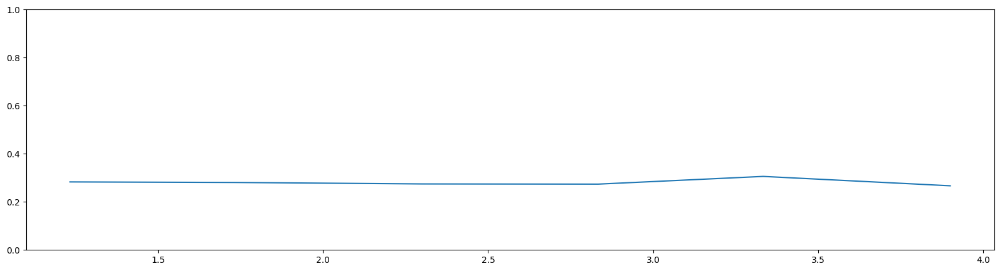

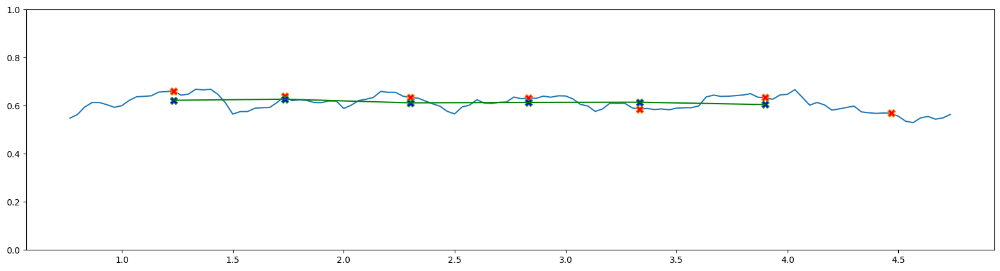

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.592559  0.530888   0.853136 -0.047031  0.766667 -0.364274    0.919382   
1    0.650713  0.625443   0.902928 -0.055031  0.800000 -0.103622    0.920859   
2    0.695421  0.659047   0.907520 -0.053928  0.833333  0.158042    0.918641   
3    0.729371  0.608551   0.901155 -0.046063  0.866667  0.280583    0.906061   
4    0.732425  0.592212   0.883221 -0.037525  0.900000  0.199144    0.887236   
..        ...       ...        ...       ...       ...       ...         ...   
115  0.555165  0.714501   0.931692 -0.007700  4.600000 -0.240461    0.750409   
116  0.533650  0.716502   0.935360 -0.018263  4.633333 -0.260020    0.695172   
117  0.544172  0.706249   0.897576 -0.021741  4.666667  0.001482    0.628816   
118  0.551770  0.719344   0.908689 -0.022787  4.700000 -0.133243    0.568024   
119  0.602852  0.704193   0.896665 -0.035072  4.733333 -0.668304    0.503870   

     visi_shk_l  
0      0.985298  
1  

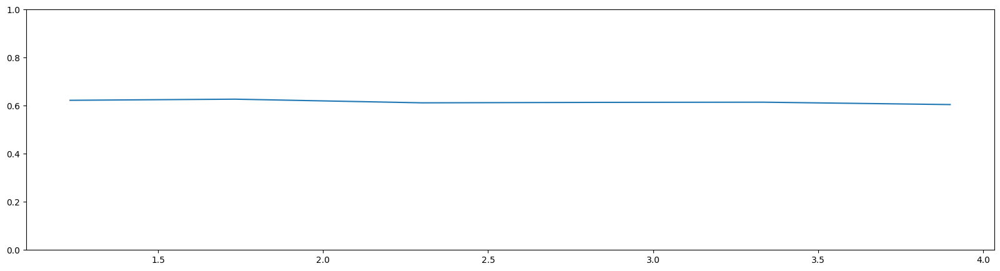

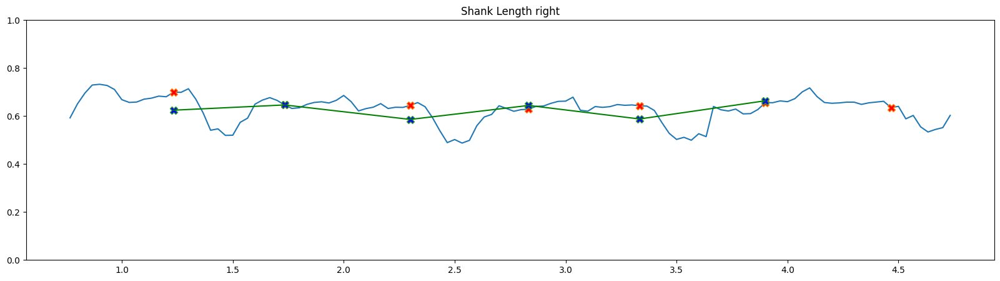

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.227968  0.248631   0.853136 -0.047031  0.766667 -0.364274     0.846419   
1    0.237386  0.263606   0.902928 -0.055031  0.800000 -0.103622     0.853395   
2    0.244470  0.279790   0.907520 -0.053928  0.833333  0.158042     0.859649   
3    0.248694  0.366621   0.901155 -0.046063  0.866667  0.280583     0.857285   
4    0.245650  0.392630   0.883221 -0.037525  0.900000  0.199144     0.849062   
..        ...       ...        ...       ...       ...       ...          ...   
115  0.310741  0.194305   0.931692 -0.007700  4.600000 -0.240461     0.798771   
116  0.291674  0.205189   0.935360 -0.018263  4.633333 -0.260020     0.767457   
117  0.285581  0.158822   0.897576 -0.021741  4.666667  0.001482     0.714777   
118  0.159321  0.169355   0.908689 -0.022787  4.700000 -0.133243     0.659255   
119  0.109081  0.144291   0.896665 -0.035072  4.733333 -0.668304     0.604210   

     visi_foot_l  
0       

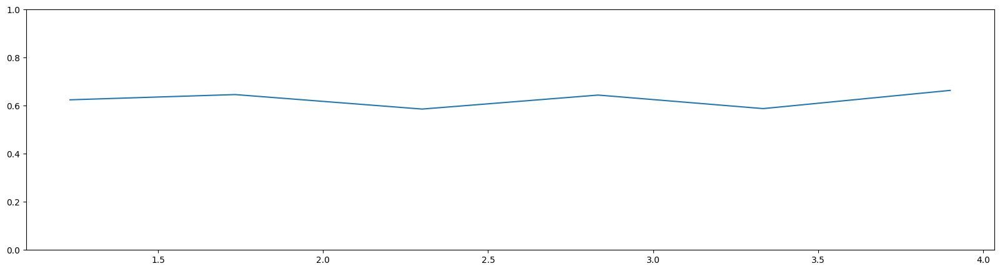

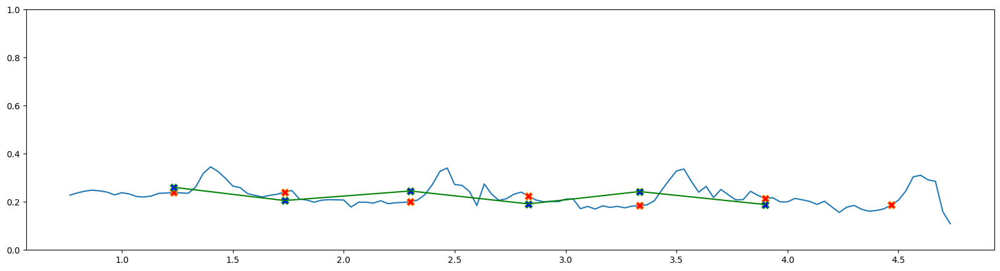

side left rakitha left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.194347  0.700000 -0.039637  0.960576  0.976773  0.019271  0.100327   
1    0.194384  0.733333 -0.043057  0.950787  0.976675  0.027614  0.100267   
2    0.195823  0.766667 -0.046185  0.941815  0.971342  0.030455  0.100417   
3    0.199661  0.800000 -0.039984  0.936731  0.964507  0.028622  0.098472   
4    0.201060  0.833333 -0.037472  0.929505  0.958863  0.029956  0.099413   
..        ...       ...       ...       ...       ...       ...       ...   
140  0.196060  5.366667 -0.030714  0.022206 -0.014801  0.037137  0.100200   
141  0.192219  5.400000 -0.022524  0.019027 -0.014682  0.033932  0.098255   
142  0.189882  5.433333 -0.017083  0.018024 -0.027614  0.045638  0.099092   
143  0.189252  5.466667 -0.025316  0.001575 -0.016400  0.017980  0.099565   
144  0.189694  5.500000 -0.019229 -0.009676 -0.022547  0.012976  0.099096   

          sln       aln  
0    0.099159  0

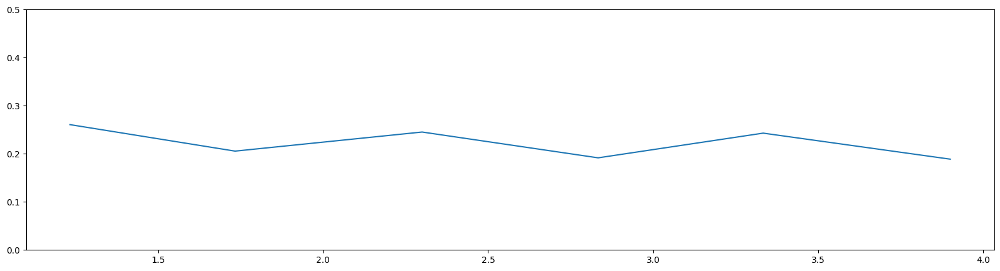

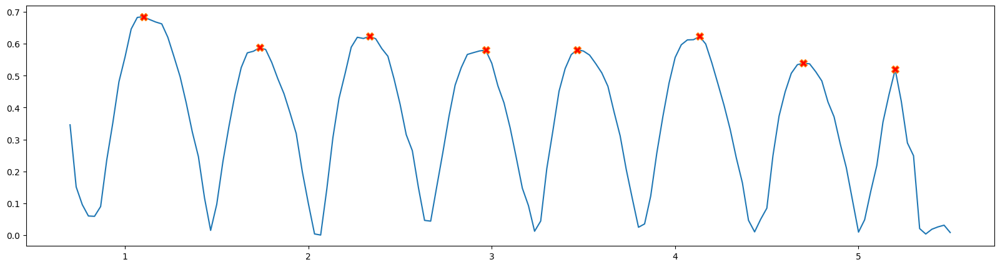

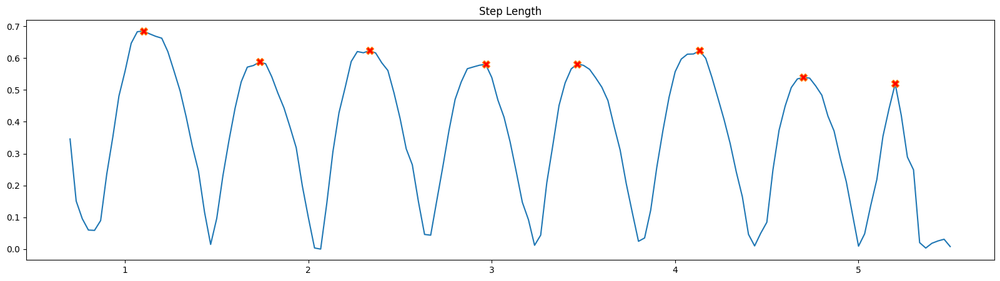

[ 12  31  49  68  83 103 120 135]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.242198  1.382657 -0.039637   0.941642  0.700000  0.275128    0.102164   
1    1.206811  1.359167 -0.043057   0.940964  0.733333 -0.240269    0.100641   
2    1.169630  1.319706 -0.046185   0.876205  0.766667  0.096638    0.122255   
3    1.150864  1.280905 -0.039984   0.853497  0.800000  0.163988    0.147403   
4    1.155055  1.269397 -0.037472   0.843065  0.833333  0.041069    0.178354   
..        ...       ...       ...        ...       ...       ...         ...   
140  1.206119  1.250389 -0.030714   0.922815  5.366667 -0.026521    0.287849   
141  1.169450  1.228267 -0.022524   0.931991  5.400000  0.349341    0.291799   
142  1.171163  1.230594 -0.017083   0.931355  5.433333 -0.081679    0.301598   
143  1.163341  1.168297 -0.025316   1.000752  5.466667 -0.272376    0.277848   
144  1.134001  1.114635 -0.019229   1.021568  5.500000  0.977980    0.259504   

     

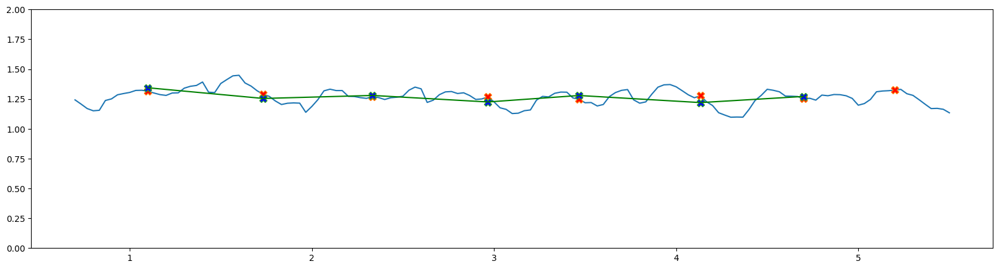

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.516224     0.572237 -0.039637  0.700000  0.275128      0.024170   
1       0.515821     0.569863 -0.043057  0.733333 -0.240269      0.026191   
2       0.512797     0.565728 -0.046185  0.766667  0.096638      0.027504   
3       0.493197     0.556888 -0.039984  0.800000  0.163988      0.029464   
4       0.494444     0.554226 -0.037472  0.833333  0.041069      0.030640   
..           ...          ...       ...       ...       ...           ...   
140     0.511068     0.534399 -0.030714  5.366667 -0.026521      0.122370   
141     0.511164     0.516771 -0.022524  5.400000  0.349341      0.111980   
142     0.521859     0.502392 -0.017083  5.433333 -0.081679      0.106018   
143     0.526097     0.517162 -0.025316  5.466667 -0.272376      0.095806   
144     0.522401     0.519295 -0.019229  5.500000  0.977980      0.087699   

     visi_l_urm_l  
0        0.994611  
1        0.994957  
2        0.9953

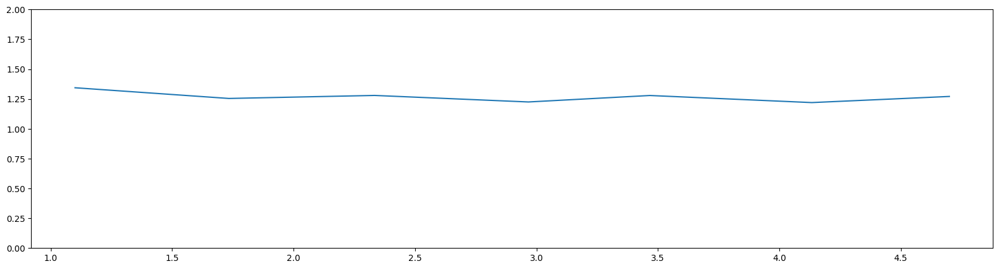

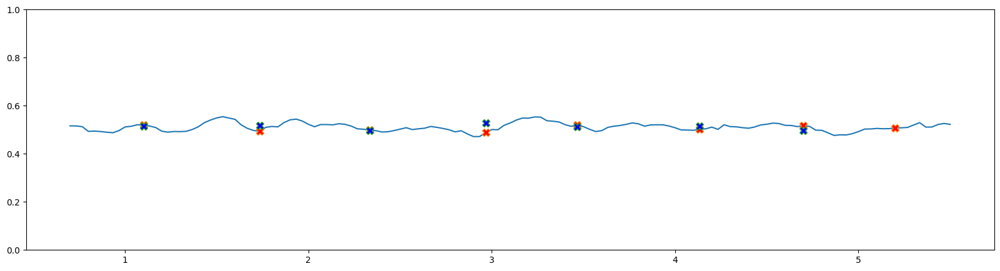

            r         l         c         t  velocity  visi_larm_r  \
0    0.417112  0.508774 -0.039637  0.700000  0.275128     0.000926   
1    0.404912  0.506931 -0.043057  0.733333 -0.240269     0.001140   
2    0.387415  0.504362 -0.046185  0.766667  0.096638     0.001393   
3    0.399166  0.497887 -0.039984  0.800000  0.163988     0.001596   
4    0.402666  0.494731 -0.037472  0.833333  0.041069     0.001776   
..        ...       ...       ...       ...       ...          ...   
140  0.469589  0.535535 -0.030714  5.366667 -0.026521     0.016663   
141  0.422203  0.463842 -0.022524  5.400000  0.349341     0.013931   
142  0.355163  0.257251 -0.017083  5.433333 -0.081679     0.012177   
143  0.354097  0.285347 -0.025316  5.466667 -0.272376     0.010060   
144  0.365016  0.361650 -0.019229  5.500000  0.977980     0.008602   

     visi_larm_l  
0       0.968139  
1       0.970337  
2       0.972672  
3       0.973374  
4       0.975466  
..           ...  
140     0.962123  
141    

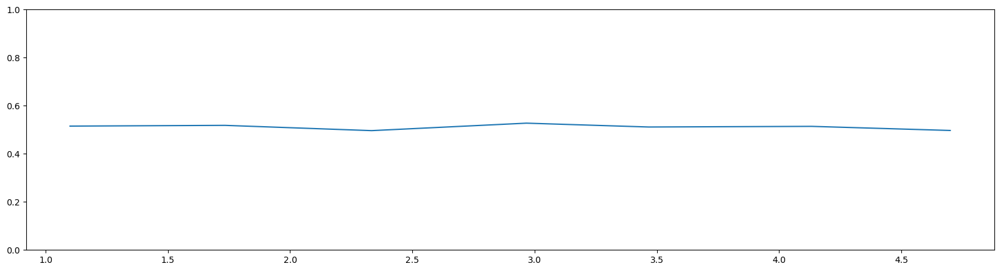

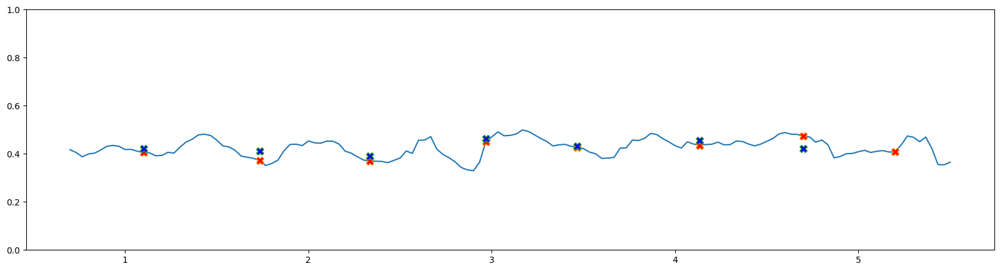

            r         l         c         t  velocity      visi_l_r  visi_l_l
0    0.295256  0.343009 -0.039637  0.700000  0.275128  4.412918e-08  0.882715
1    0.296266  0.344555 -0.043057  0.733333 -0.240269  7.476159e-08  0.890240
2    0.301369  0.344872 -0.046185  0.766667  0.096638  1.270438e-07  0.898437
3    0.301150  0.342716 -0.039984  0.800000  0.163988  1.759069e-07  0.901149
4    0.361887  0.344388 -0.037472  0.833333  0.041069  2.287596e-07  0.908638
..        ...       ...       ...       ...       ...           ...       ...
140  0.346514  0.336889 -0.030714  5.366667 -0.026521  3.543194e-05  0.877462
141  0.253156  0.268559 -0.022524  5.400000  0.349341  2.278103e-05  0.688177
142  0.222792  0.178191 -0.017083  5.433333 -0.081679  1.618158e-05  0.482041
143  0.258324  0.249367 -0.025316  5.466667 -0.272376  1.012191e-05  0.376693
144  0.270867  0.247959 -0.019229  5.500000  0.977980  7.086243e-06  0.349560

[145 rows x 7 columns]
t1 1.1
t1 1.7333333333333334
t1 2.333333

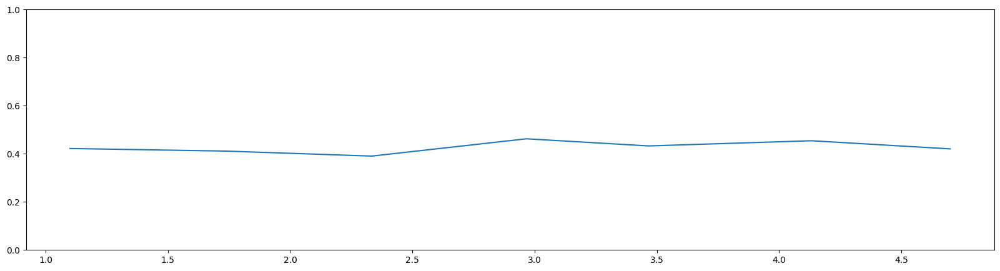

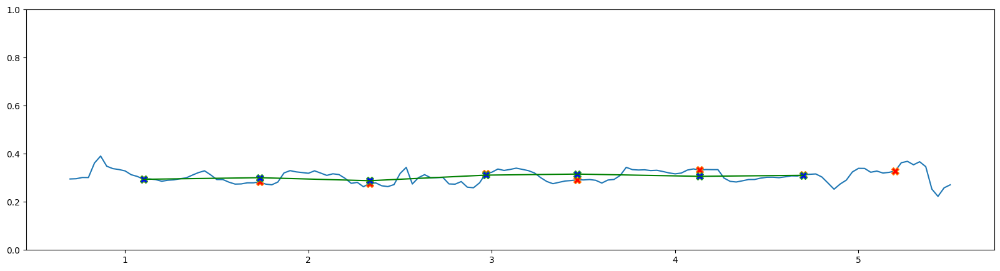

            r         l  leg_ratio         c         t  velocity  \
0    0.653122  0.693599   0.854900 -0.039637  0.700000  0.275128   
1    0.653005  0.693974   0.832551 -0.043057  0.733333 -0.240269   
2    0.600280  0.685090   0.897157 -0.046185  0.766667  0.096638   
3    0.574502  0.673116   0.948292 -0.039984  0.800000  0.163988   
4    0.562264  0.666928   0.983937 -0.037472  0.833333  0.041069   
..        ...       ...        ...       ...       ...       ...   
140  0.577166  0.625441   1.006407 -0.030714  5.366667 -0.026521   
141  0.570024  0.611620   0.972073 -0.022524  5.400000  0.349341   
142  0.544546  0.584681   0.970128 -0.017083  5.433333 -0.081679   
143  0.579126  0.578691   0.990858 -0.025316  5.466667 -0.272376   
144  0.591955  0.579457   1.012834 -0.019229  5.500000  0.977980   

     visi_thigh_r  visi_thigh_l  
0        0.402424      0.866570  
1        0.402377      0.861629  
2        0.438057      0.867207  
3        0.474677      0.876579  
4        0.51

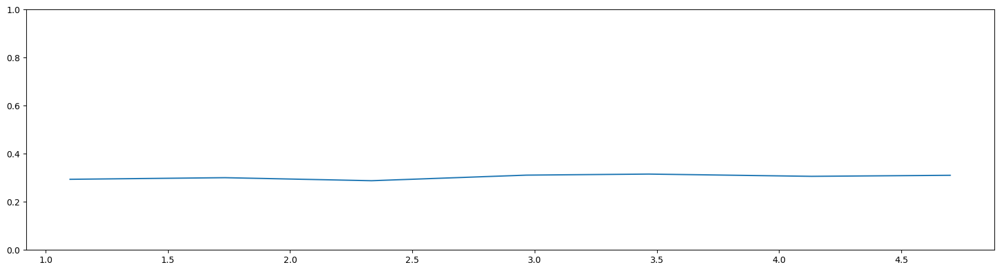

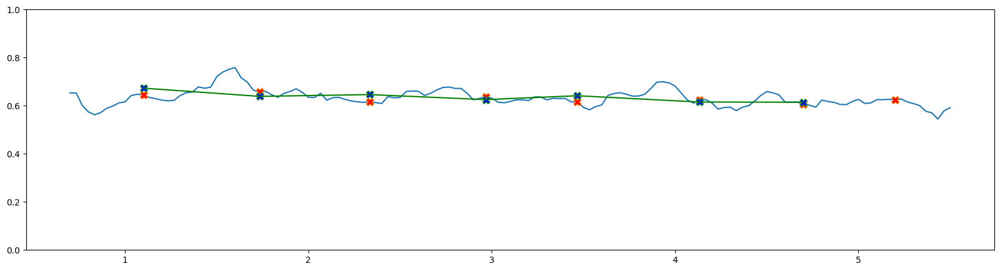

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.589076  0.689058   0.941642 -0.039637  0.700000  0.275128    0.253870   
1    0.553806  0.665192   0.940964 -0.043057  0.733333 -0.240269    0.250116   
2    0.569350  0.634616   0.876205 -0.046185  0.766667  0.096638    0.279084   
3    0.576361  0.607789   0.853497 -0.039984  0.800000  0.163988    0.310534   
4    0.592792  0.602469   0.843065 -0.037472  0.833333  0.041069    0.346585   
..        ...       ...        ...       ...       ...       ...         ...   
140  0.628953  0.624949   0.922815 -0.030714  5.366667 -0.026521    0.448357   
141  0.599426  0.616647   0.931991 -0.022524  5.400000  0.349341    0.453826   
142  0.626617  0.645912   0.931355 -0.017083  5.433333 -0.081679    0.461520   
143  0.584215  0.589606   1.000752 -0.025316  5.466667 -0.272376    0.439358   
144  0.542046  0.535178   1.021568 -0.019229  5.500000  0.977980    0.421943   

     visi_shk_l  
0      0.835984  
1  

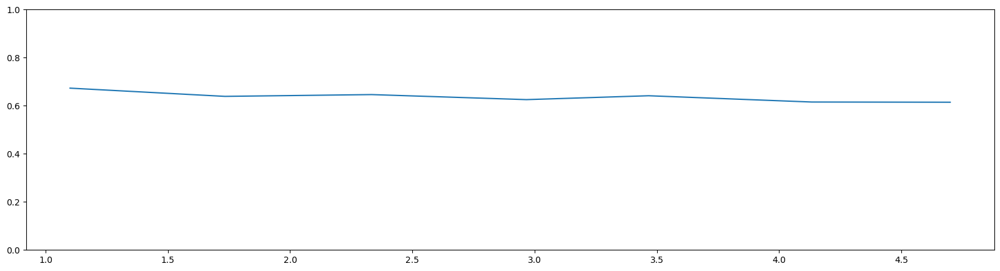

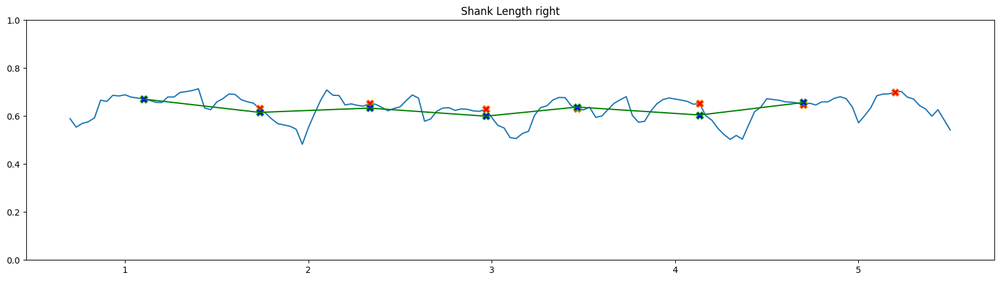

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.144619  0.224431   0.941642 -0.039637  0.700000  0.275128     0.565201   
1    0.178989  0.204437   0.940964 -0.043057  0.733333 -0.240269     0.554717   
2    0.254888  0.201906   0.876205 -0.046185  0.766667  0.096638     0.566880   
3    0.256324  0.192777   0.853497 -0.039984  0.800000  0.163988     0.583486   
4    0.197186  0.175855   0.843065 -0.037472  0.833333  0.041069     0.599306   
..        ...       ...        ...       ...       ...       ...          ...   
140  0.141452  0.130272   0.922815 -0.030714  5.366667 -0.026521     0.485385   
141  0.179485  0.164167   0.931991 -0.022524  5.400000  0.349341     0.496630   
142  0.117510  0.105938   0.931355 -0.017083  5.433333 -0.081679     0.484887   
143  0.165450  0.176580   1.000752 -0.025316  5.466667 -0.272376     0.472407   
144  0.162989  0.157663   1.021568 -0.019229  5.500000  0.977980     0.469249   

     visi_foot_l  
0       

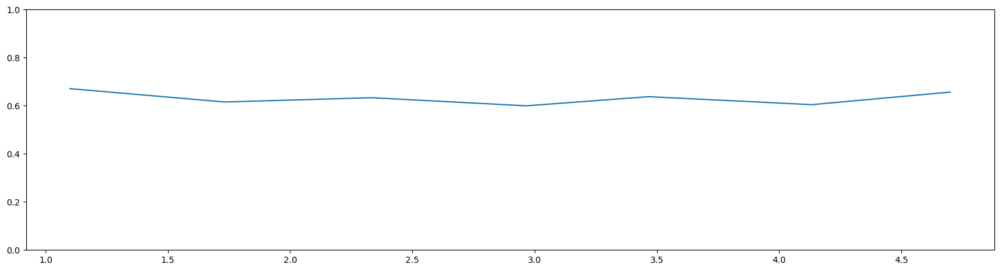

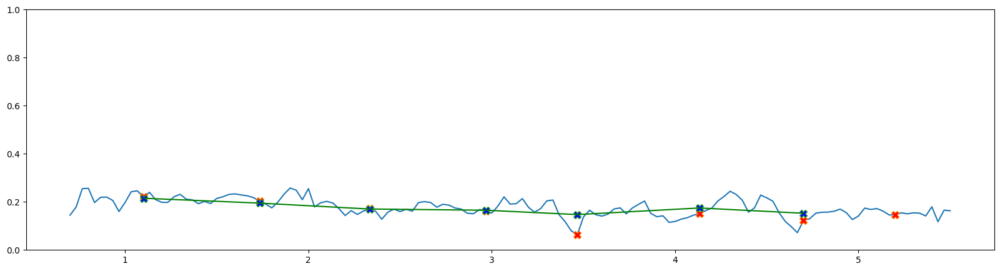

side left ravindu left 3 (7, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.186812  0.600000 -0.054044  0.940548  0.973286  0.032971  0.083032   
1    0.186408  0.633333 -0.048483  0.933104  0.967937  0.034854  0.088558   
2    0.186231  0.666667 -0.042844  0.921883  0.960585  0.038712  0.094666   
3    0.186042  0.700000 -0.037252  0.910998  0.954174  0.043185  0.094402   
4    0.185647  0.733333 -0.031333  0.903628  0.947955  0.044335  0.094354   
..        ...       ...       ...       ...       ...       ...       ...   
128  0.179722  4.866667 -0.037420 -0.035416 -0.009468  0.028866  0.090028   
129  0.173951  4.900000 -0.033424 -0.051414 -0.017750  0.035592  0.087779   
130  0.157224  4.933333 -0.015182 -0.079811 -0.060412  0.019500  0.082520   
131  0.166335  4.966667 -0.010020 -0.095070 -0.076803  0.019024  0.048766   
132  0.171224  5.000000 -0.013612 -0.109779 -0.072184  0.040189  0.017906   

          sln       aln  
0    0.176496  0

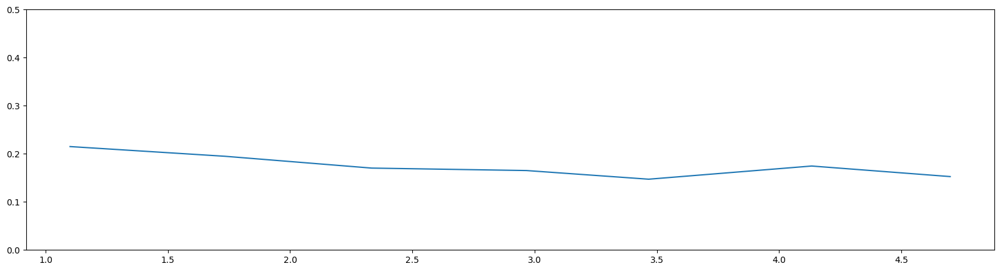

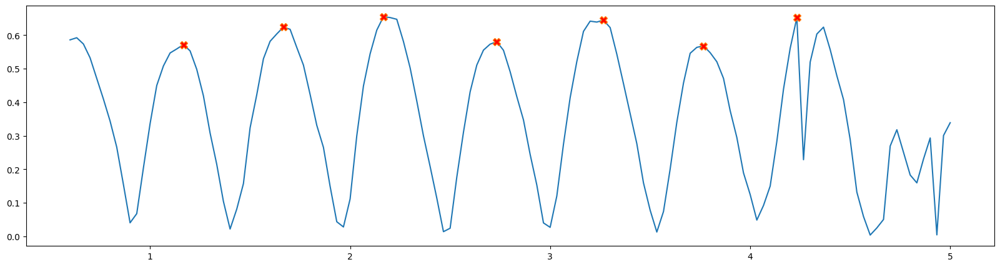

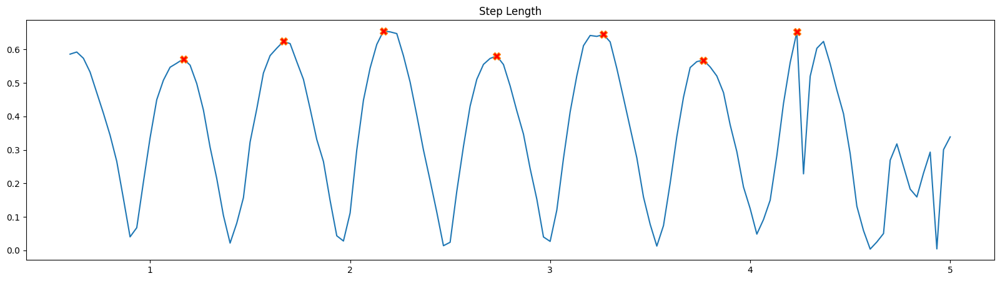

[ 17  32  47  64  80  95 109]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.212183  1.113240 -0.054044   0.988687  0.600000  0.241937    0.967589   
1    1.212546  1.125455 -0.048483   0.999328  0.633333  0.143025    0.967678   
2    1.214806  1.138845 -0.042844   1.007389  0.666667  0.193949    0.967971   
3    1.217976  1.119016 -0.037252   1.004388  0.700000  0.114193    0.968700   
4    1.226459  1.075921 -0.031333   1.010660  0.733333  0.349303    0.967982   
..        ...       ...       ...        ...       ...       ...         ...   
128  0.982350  1.278108 -0.037420   0.694200  4.866667  0.110132    0.382137   
129  1.031432  1.311680 -0.033424   0.708980  4.900000  0.340659    0.358586   
130  1.144173  1.241869 -0.015182   0.868026  4.933333  0.506259    0.328023   
131  1.047245  1.259996 -0.010020   0.809792  4.966667 -0.177606    0.346735   
132  1.127610  1.270017 -0.013612   0.802987  5.000000  0.345467    0.376177   

     visi

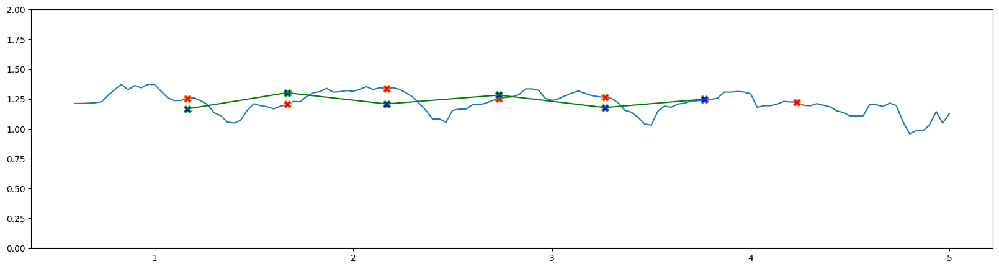

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.444467     0.523931 -0.054044  0.600000  0.241937      0.062601   
1       0.475077     0.534196 -0.048483  0.633333  0.143025      0.060387   
2       0.508327     0.527828 -0.042844  0.666667  0.193949      0.057870   
3       0.507425     0.525183 -0.037252  0.700000  0.114193      0.057587   
4       0.508244     0.524818 -0.031333  0.733333  0.349303      0.056973   
..           ...          ...       ...       ...       ...           ...   
128     0.500932     0.463127 -0.037420  4.866667  0.110132      0.153319   
129     0.504618     0.467262 -0.033424  4.900000  0.340659      0.139050   
130     0.524856     0.501547 -0.015182  4.933333  0.506259      0.124439   
131     0.293178     0.461859 -0.010020  4.966667 -0.177606      0.114001   
132     0.104575     0.451763 -0.013612  5.000000  0.345467      0.108450   

     visi_l_urm_l  
0        0.997646  
1        0.997738  
2        0.9978

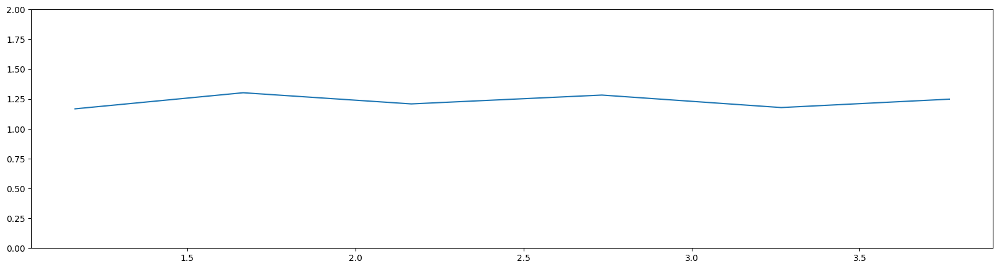

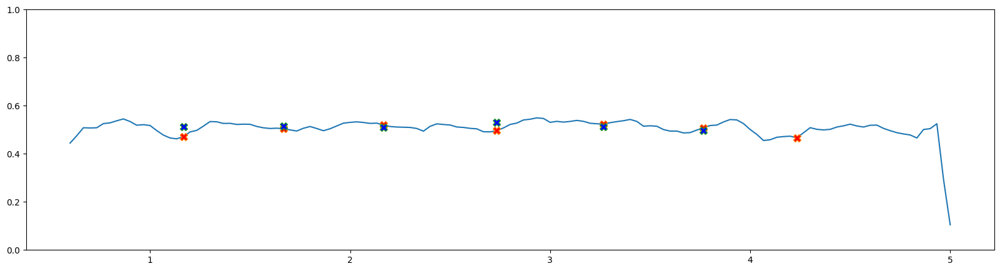

            r         l         c         t  velocity  visi_larm_r  \
0    0.347241  0.465333 -0.054044  0.600000  0.241937     0.008200   
1    0.385400  0.469954 -0.048483  0.633333  0.143025     0.007736   
2    0.356169  0.478760 -0.042844  0.666667  0.193949     0.007217   
3    0.373627  0.477372 -0.037252  0.700000  0.114193     0.007336   
4    0.381373  0.478107 -0.031333  0.733333  0.349303     0.007427   
..        ...       ...       ...       ...       ...          ...   
128  0.466055  0.498490 -0.037420  4.866667  0.110132     0.020566   
129  0.505690  0.528342 -0.033424  4.900000  0.340659     0.017335   
130  0.140215  0.330535 -0.015182  4.933333  0.506259     0.014409   
131  0.221897  0.335230 -0.010020  4.966667 -0.177606     0.012720   
132  0.432772  0.216253 -0.013612  5.000000  0.345467     0.012809   

     visi_larm_l  
0       0.987190  
1       0.987633  
2       0.988009  
3       0.988628  
4       0.989008  
..           ...  
128     0.595520  
129    

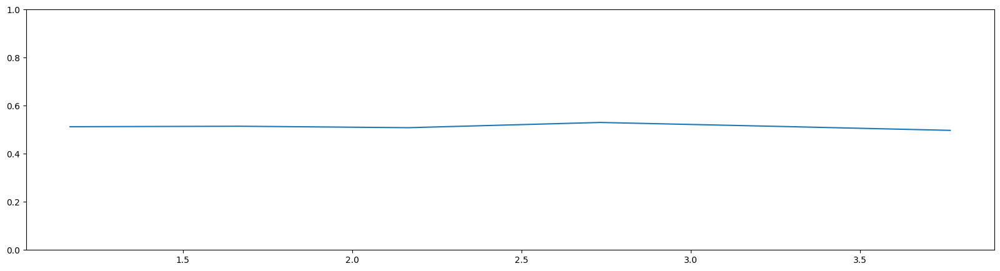

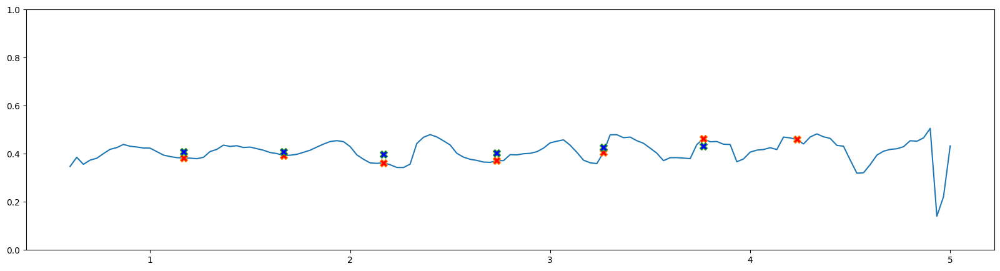

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.221840  0.313522 -0.054044  0.600000  0.241937  0.000010  0.943569
1    0.289267  0.323807 -0.048483  0.633333  0.143025  0.000009  0.945555
2    0.294008  0.328779 -0.042844  0.666667  0.193949  0.000007  0.947200
3    0.290503  0.331327 -0.037252  0.700000  0.114193  0.000008  0.949899
4    0.288524  0.331475 -0.031333  0.733333  0.349303  0.000008  0.951641
..        ...       ...       ...       ...       ...       ...       ...
128  0.311985  0.331427 -0.037420  4.866667  0.110132  0.000055  0.223677
129  0.325585  0.337862 -0.033424  4.900000  0.340659  0.000037  0.248425
130  0.148874  0.254668 -0.015182  4.933333  0.506259  0.000024  0.210919
131  0.155231  0.180814 -0.010020  4.966667 -0.177606  0.000019  0.199819
132  0.230410  0.147259 -0.013612  5.000000  0.345467  0.000019  0.161246

[133 rows x 7 columns]
t1 1.1666666666666667
t1 1.6666666666666667
t1 2.1666666666666665
t1 2.7333333333333334


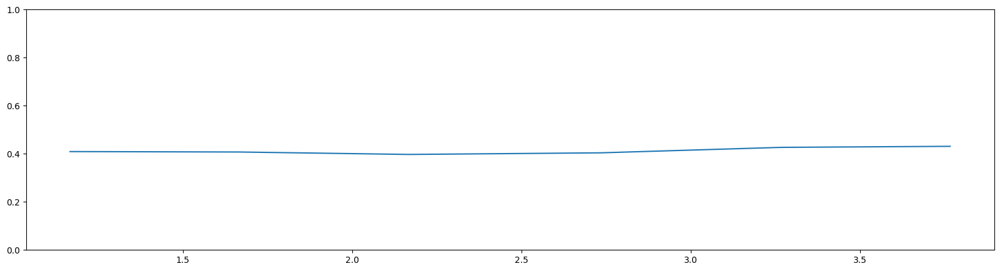

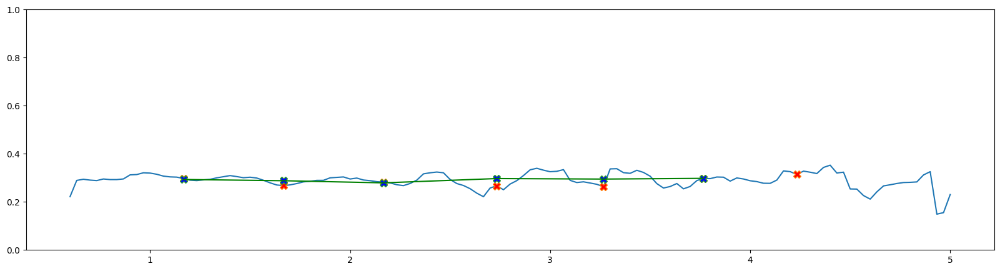

            r         l  leg_ratio         c         t  velocity  \
0    0.589713  0.596461   1.204518 -0.054044  0.600000  0.241937   
1    0.590637  0.591034   1.163707 -0.048483  0.633333  0.143025   
2    0.596743  0.592366   1.130992 -0.042844  0.666667  0.193949   
3    0.601129  0.598503   1.185075 -0.037252  0.700000  0.114193   
4    0.609081  0.602656   1.304509 -0.031333  0.733333  0.349303   
..        ...       ...        ...       ...       ...       ...   
128  0.456736  0.657931   0.847523 -0.037420  4.866667  0.110132   
129  0.486641  0.686395   0.871269 -0.033424  4.900000  0.340659   
130  0.623710  0.718538   0.994520 -0.015182  4.933333  0.506259   
131  0.579675  0.715832   0.859244 -0.010020  4.966667 -0.177606   
132  0.568190  0.707596   0.994663 -0.013612  5.000000  0.345467   

     visi_thigh_r  visi_thigh_l  
0        0.987175      0.994371  
1        0.987153      0.994522  
2        0.987238      0.994613  
3        0.987499      0.994742  
4        0.98

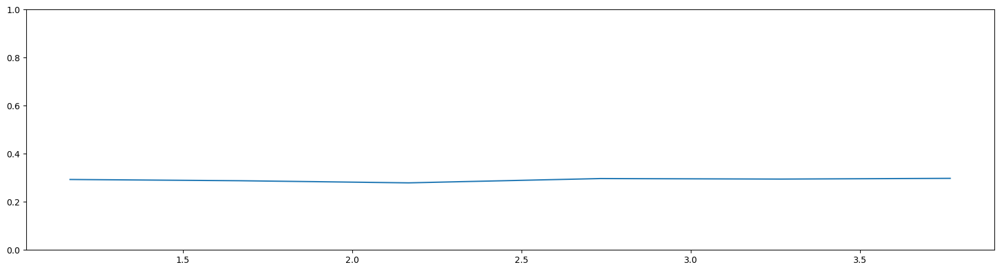

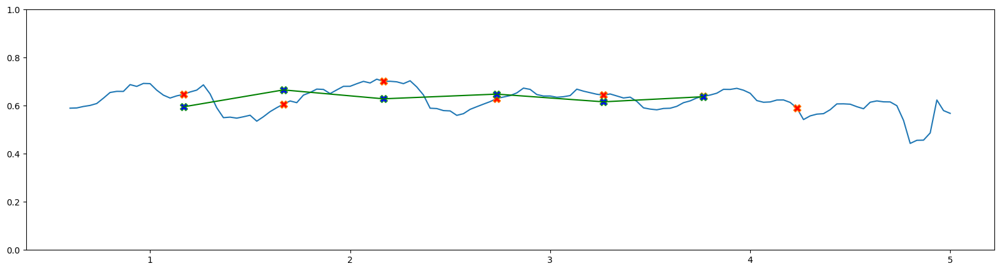

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.622469  0.516779   0.988687 -0.054044  0.600000  0.241937    0.980159   
1    0.621909  0.534420   0.999328 -0.048483  0.633333  0.143025    0.980272   
2    0.618064  0.546479   1.007389 -0.042844  0.666667  0.193949    0.980484   
3    0.616847  0.520513   1.004388 -0.037252  0.700000  0.114193    0.980963   
4    0.617378  0.473265   1.010660 -0.031333  0.733333  0.349303    0.980623   
..        ...       ...        ...       ...       ...       ...         ...   
128  0.525614  0.620176   0.694200 -0.037420  4.866667  0.110132    0.561502   
129  0.544792  0.625285   0.708980 -0.033424  4.900000  0.340659    0.538836   
130  0.520463  0.523331   0.868026 -0.015182  4.933333  0.506259    0.513437   
131  0.467569  0.544163   0.809792 -0.010020  4.966667 -0.177606    0.531078   
132  0.559420  0.562421   0.802987 -0.013612  5.000000  0.345467    0.556156   

     visi_shk_l  
0      0.981755  
1  

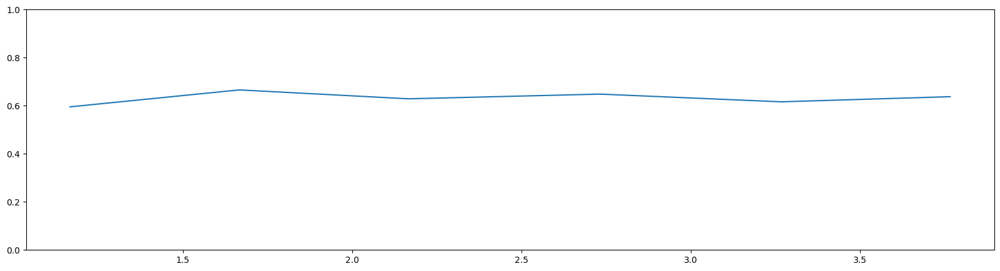

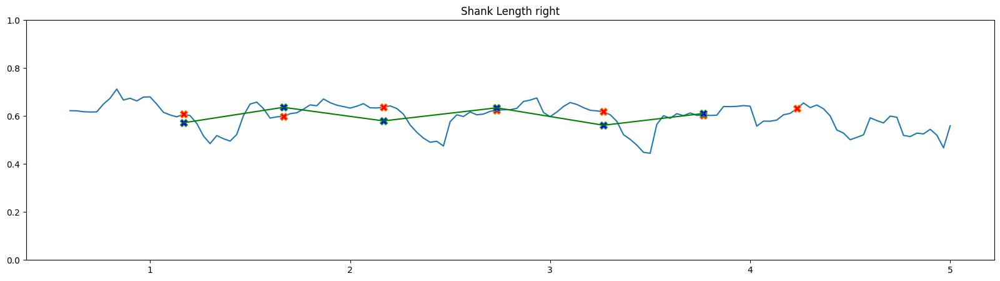

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.244522  0.274418   0.988687 -0.054044  0.600000  0.241937     0.951727   
1    0.233088  0.220700   0.999328 -0.048483  0.633333  0.143025     0.951756   
2    0.227006  0.202927   1.007389 -0.042844  0.666667  0.193949     0.951923   
3    0.224357  0.232072   1.004388 -0.037252  0.700000  0.114193     0.953165   
4    0.219966  0.298762   1.010660 -0.031333  0.733333  0.349303     0.953920   
..        ...       ...        ...       ...       ...       ...          ...   
128  0.258472  0.185212   0.694200 -0.037420  4.866667  0.110132     0.667102   
129  0.293336  0.226260   0.708980 -0.033424  4.900000  0.340659     0.648044   
130  0.342572  0.205169   0.868026 -0.015182  4.933333  0.506259     0.633146   
131  0.287659  0.186693   0.809792 -0.010020  4.966667 -0.177606     0.640366   
132  0.212365  0.164313   0.802987 -0.013612  5.000000  0.345467     0.635868   

     visi_foot_l  
0       

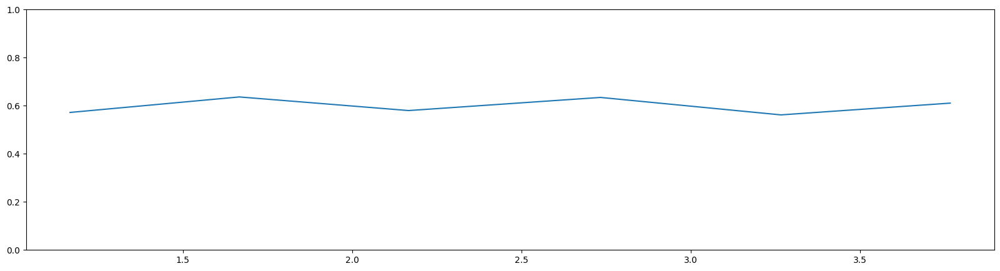

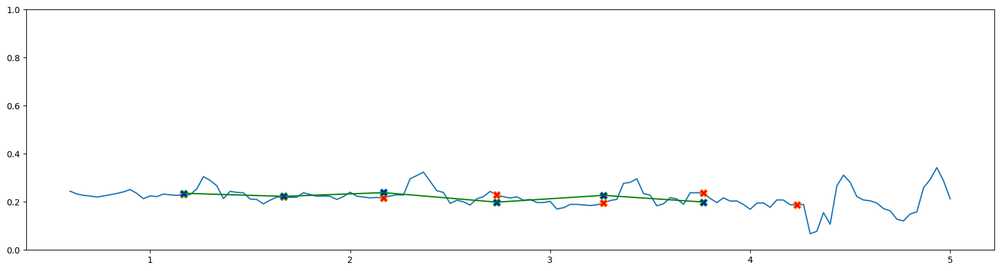

side left sahan left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.193905  0.766667 -0.047789  0.937310  0.973699  0.036603  0.101508   
1    0.194200  0.800000 -0.034823  0.929911  0.963826  0.034418  0.096966   
2    0.192560  0.833333 -0.040375  0.918899  0.951667  0.032829  0.092921   
3    0.193129  0.866667 -0.038537  0.906552  0.942459  0.035908  0.091245   
4    0.193830  0.900000 -0.037685  0.900112  0.932613  0.032526  0.095508   
..        ...       ...       ...       ...       ...       ...       ...   
106  0.164919  4.300000 -0.021095 -0.094832 -0.056444  0.038388  0.091794   
107  0.187586  4.333333 -0.006302 -0.092278 -0.063934  0.031228  0.012212   
108  0.185057  4.366667 -0.006895 -0.095051 -0.070718  0.026360  0.020633   
109  0.185383  4.400000 -0.007723 -0.094039 -0.073914  0.020989  0.043734   
110  0.193233  4.433333 -0.010353 -0.104911 -0.065719  0.040748  0.008373   

          sln       aln  
0    0.188768  0.5

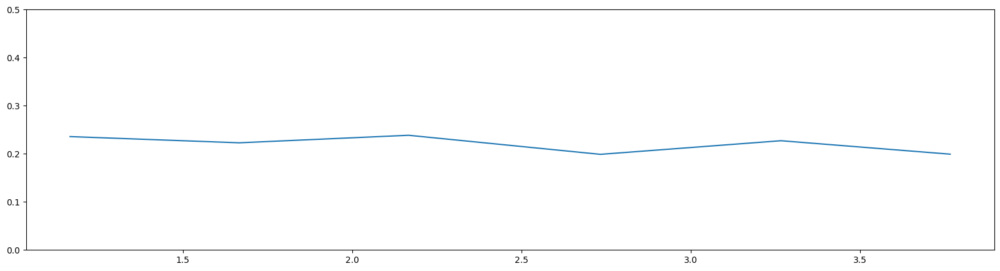

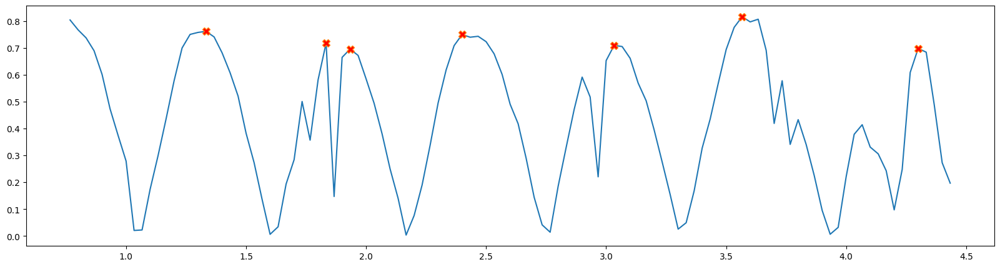

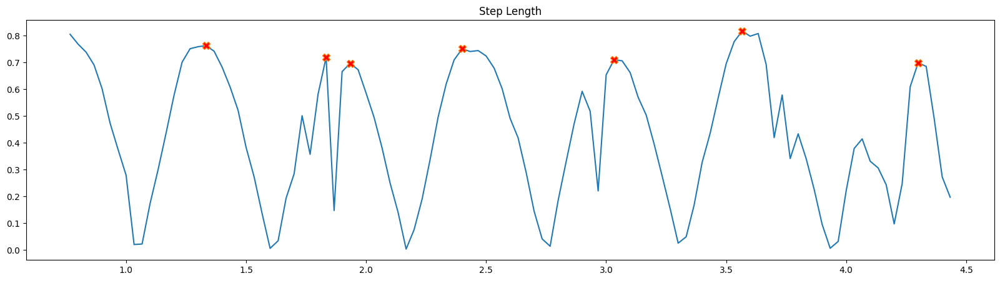

[ 17  32  35  49  68  84 106]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.188283  1.040722 -0.047789   0.856548  0.766667  1.281421    0.946472   
1    1.195217  1.165082 -0.034823   0.874943  0.800000 -0.136567    0.944727   
2    1.227580  1.205359 -0.040375   0.925003  0.833333 -0.067883    0.937046   
3    1.223793  1.213843 -0.038537   0.929534  0.866667  0.099840    0.933070   
4    1.218405  1.185506 -0.037685   0.924507  0.900000 -0.059895    0.928452   
..        ...       ...       ...        ...       ...       ...         ...   
106  0.864831  1.297550 -0.021095   0.534611  4.300000  0.912451    0.409539   
107  0.868315  1.132812 -0.006302   0.712573  4.333333  0.082433    0.437050   
108  0.897874  1.085105 -0.006895   0.724688  4.366667 -0.048613    0.453653   
109  0.998051  1.088842 -0.007723   0.771356  4.400000 -0.009120    0.477810   
110  1.183204  1.405536 -0.010353   0.830328  4.433333 -0.226150    0.483775   

     visi

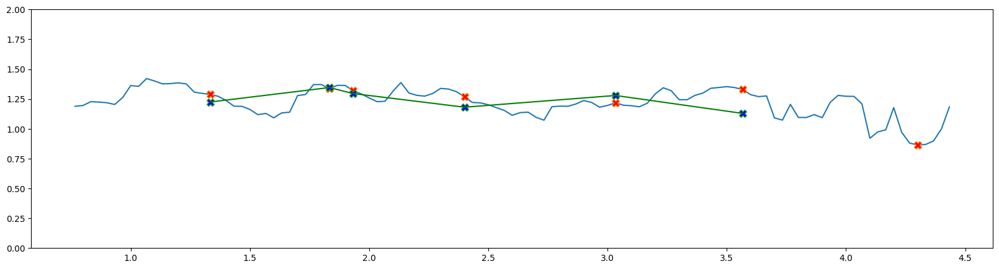

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.523492     0.550853 -0.047789  0.766667  1.281421      0.066765   
1       0.499312     0.535662 -0.034823  0.800000 -0.136567      0.066762   
2       0.482555     0.541515 -0.040375  0.833333 -0.067883      0.065101   
3       0.472459     0.537312 -0.038537  0.866667  0.099840      0.063171   
4       0.492740     0.525766 -0.037685  0.900000 -0.059895      0.060969   
..           ...          ...       ...       ...       ...           ...   
106     0.556600     0.508358 -0.021095  4.300000  0.912451      0.179451   
107     0.065100     0.431463 -0.006302  4.333333  0.082433      0.165295   
108     0.111493     0.379623 -0.006895  4.366667 -0.048613      0.152846   
109     0.235913     0.258230 -0.007723  4.400000 -0.009120      0.143205   
110     0.043329     0.363969 -0.010353  4.433333 -0.226150      0.134772   

     visi_l_urm_l  
0        0.996892  
1        0.997013  
2        0.9971

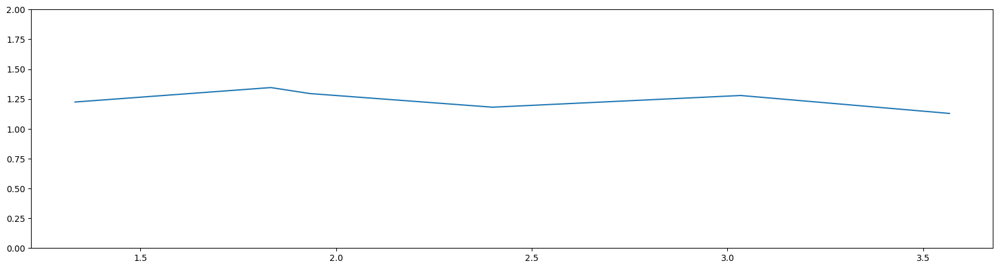

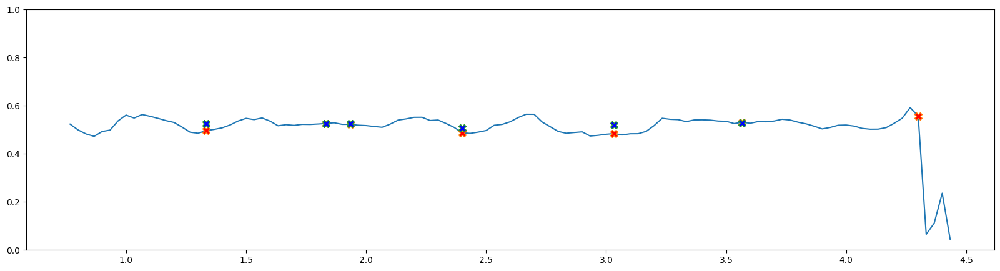

            r         l         c         t  velocity  visi_larm_r  \
0    0.311338  0.382776 -0.047789  0.766667  1.281421     0.008954   
1    0.341837  0.395680 -0.034823  0.800000 -0.136567     0.009317   
2    0.374313  0.408271 -0.040375  0.833333 -0.067883     0.009059   
3    0.398278  0.420609 -0.038537  0.866667  0.099840     0.008737   
4    0.397057  0.443136 -0.037685  0.900000 -0.059895     0.008408   
..        ...       ...       ...       ...       ...          ...   
106  0.108285  0.323594 -0.021095  4.300000  0.912451     0.027861   
107  0.244886  0.066796 -0.006302  4.333333  0.082433     0.023958   
108  0.354639  0.153109 -0.006895  4.366667 -0.048613     0.022187   
109  0.320650  0.089225 -0.007723  4.400000 -0.009120     0.021480   
110  0.316297  0.194271 -0.010353  4.433333 -0.226150     0.019798   

     visi_larm_l  
0       0.987630  
1       0.988088  
2       0.988590  
3       0.989248  
4       0.990070  
..           ...  
106     0.586113  
107    

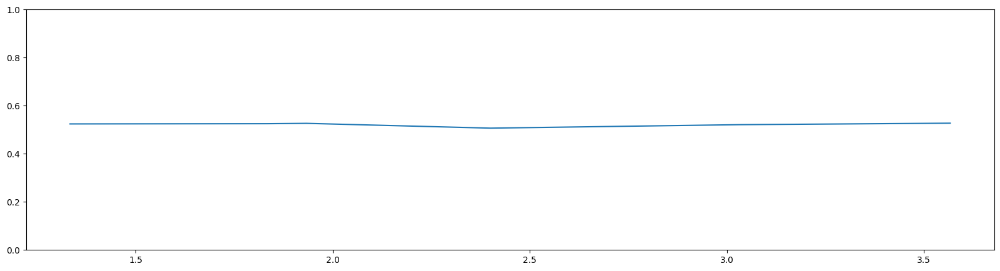

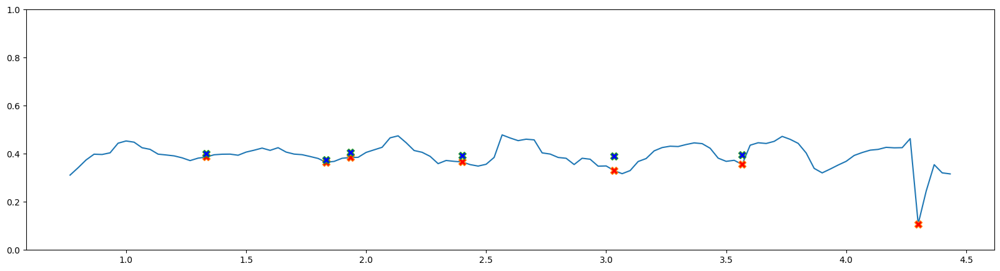

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.268354  0.273393 -0.047789  0.766667  1.281421  0.000011  0.947479
1    0.273986  0.288619 -0.034823  0.800000 -0.136567  0.000012  0.949383
2    0.282996  0.296985 -0.040375  0.833333 -0.067883  0.000012  0.951360
3    0.293447  0.308511 -0.038537  0.866667  0.099840  0.000011  0.954155
4    0.303489  0.326245 -0.037685  0.900000 -0.059895  0.000010  0.957666
..        ...       ...       ...       ...       ...       ...       ...
106  0.170170  0.179667 -0.021095  4.300000  0.912451  0.000100  0.220159
107  0.129660  0.102962 -0.006302  4.333333  0.082433  0.000070  0.185369
108  0.178284  0.143579 -0.006895  4.366667 -0.048613  0.000060  0.157427
109  0.181807  0.105517 -0.007723  4.400000 -0.009120  0.000058  0.125653
110  0.157577  0.168913 -0.010353  4.433333 -0.226150  0.000047  0.105090

[111 rows x 7 columns]
t1 1.3333333333333333
t1 1.8333333333333333
t1 1.9333333333333333
t1 2.4
t1 3.0333333333

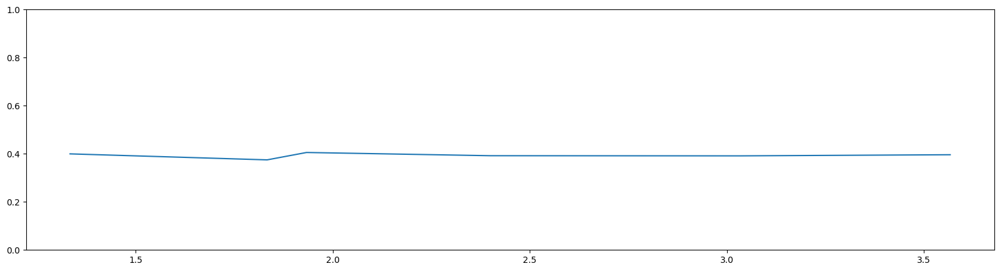

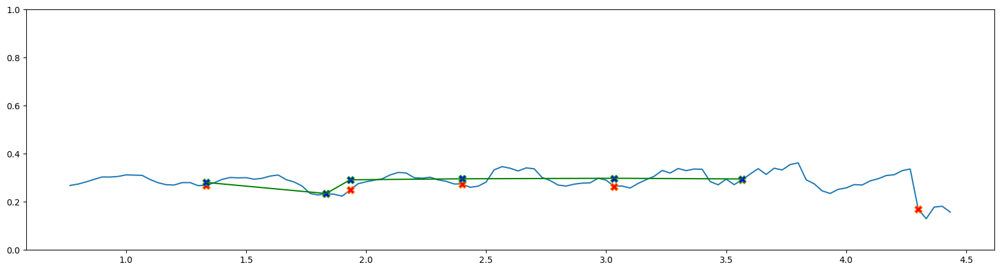

            r         l  leg_ratio         c         t  velocity  \
0    0.577227  0.673899   1.665805 -0.047789  0.766667  1.281421   
1    0.574564  0.656688   1.220811 -0.034823  0.800000 -0.136567   
2    0.594398  0.642590   1.125121 -0.040375  0.833333 -0.067883   
3    0.590857  0.635648   1.094675 -0.038537  0.866667  0.099840   
4    0.590452  0.638667   1.148331 -0.037685  0.900000 -0.059895   
..        ...       ...        ...       ...       ...       ...   
106  0.388063  0.725879   0.833991 -0.021095  4.300000  0.912451   
107  0.416488  0.584484   0.824010 -0.006302  4.333333  0.082433   
108  0.438681  0.605338   0.957117 -0.006895  4.366667 -0.048613   
109  0.483166  0.626386   1.113369 -0.007723  4.400000 -0.009120   
110  0.601013  0.723826   0.854015 -0.010353  4.433333 -0.226150   

     visi_thigh_r  visi_thigh_l  
0        0.982451      0.991275  
1        0.981532      0.991637  
2        0.977746      0.992012  
3        0.975564      0.992509  
4        0.97

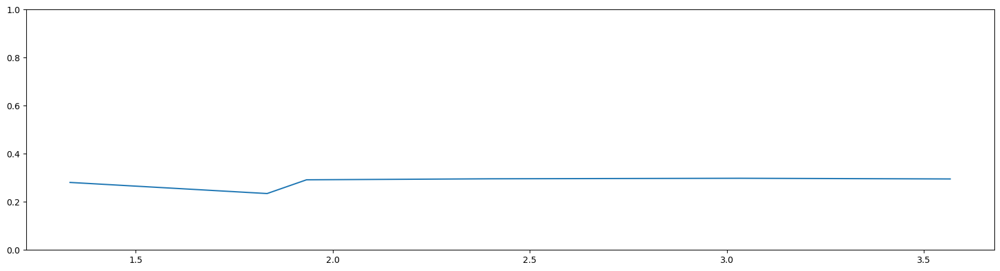

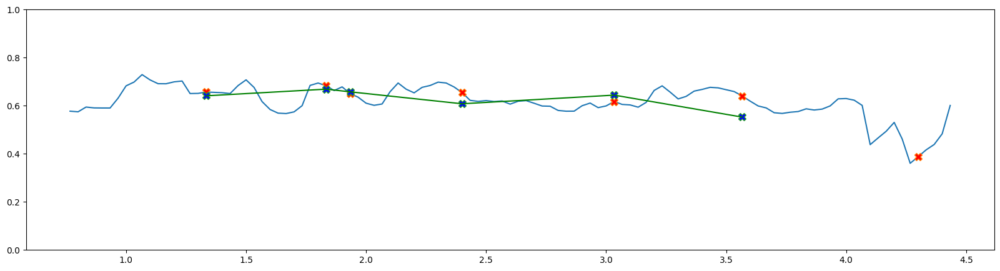

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.611056  0.366823   0.856548 -0.047789  0.766667  1.281421    0.963378   
1    0.620653  0.508394   0.874943 -0.034823  0.800000 -0.136567    0.962502   
2    0.633182  0.562768   0.925003 -0.040375  0.833333 -0.067883    0.958374   
3    0.632936  0.578195   0.929534 -0.038537  0.866667  0.099840    0.956441   
4    0.627953  0.546839   0.924507 -0.037685  0.900000 -0.059895    0.954202   
..        ...       ...        ...       ...       ...       ...         ...   
106  0.476768  0.571671   0.534611 -0.021095  4.300000  0.912451    0.580312   
107  0.451827  0.548328   0.712573 -0.006302  4.333333  0.082433    0.602983   
108  0.459193  0.479767   0.724688 -0.006895  4.366667 -0.048613    0.615249   
109  0.514885  0.462457   0.771356 -0.007723  4.400000 -0.009120    0.633979   
110  0.582191  0.681710   0.830328 -0.010353  4.433333 -0.226150    0.634577   

     visi_shk_l  
0      0.956312  
1  

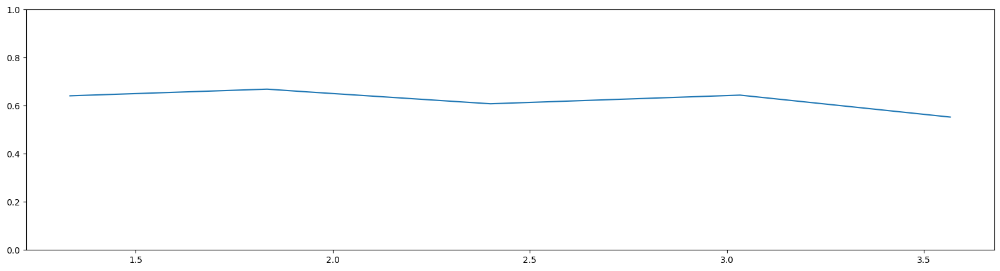

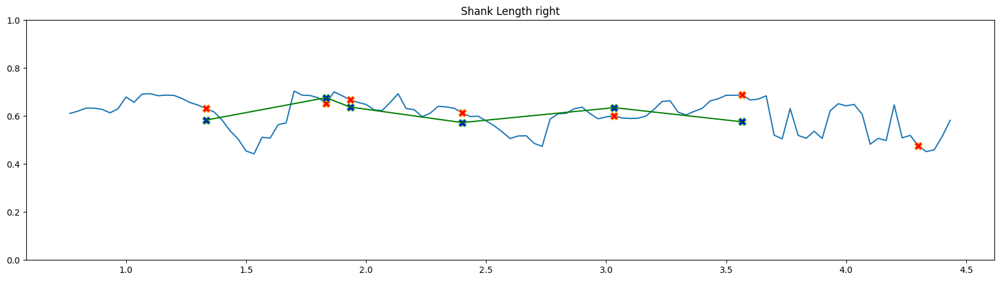

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.206181  0.226229   0.856548 -0.047789  0.766667  1.281421     0.893092   
1    0.212535  0.192415   0.874943 -0.034823  0.800000 -0.136567     0.894203   
2    0.213473  0.216124   0.925003 -0.040375  0.833333 -0.067883     0.894349   
3    0.215145  0.228990   0.929534 -0.038537  0.866667  0.099840     0.897186   
4    0.222469  0.296439   0.924507 -0.037685  0.900000 -0.059895     0.900771   
..        ...       ...        ...       ...       ...       ...          ...   
106  0.222893  0.221125   0.534611 -0.021095  4.300000  0.912451     0.604195   
107  0.193416  0.079167   0.712573 -0.006302  4.333333  0.082433     0.610734   
108  0.176808  0.153706   0.724688 -0.006895  4.366667 -0.048613     0.608582   
109  0.149663  0.137597   0.771356 -0.007723  4.400000 -0.009120     0.606155   
110  0.173632  0.097238   0.830328 -0.010353  4.433333 -0.226150     0.584932   

     visi_foot_l  
0       

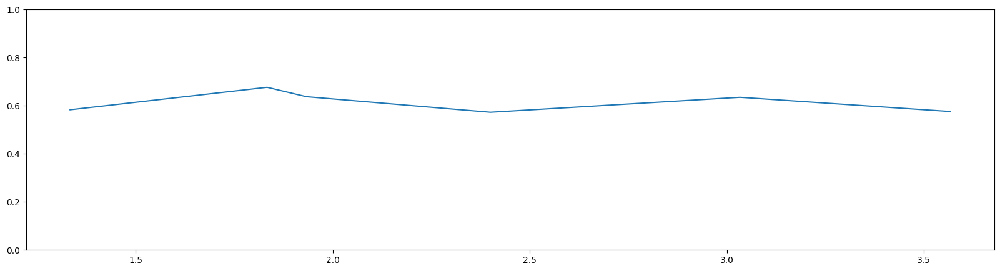

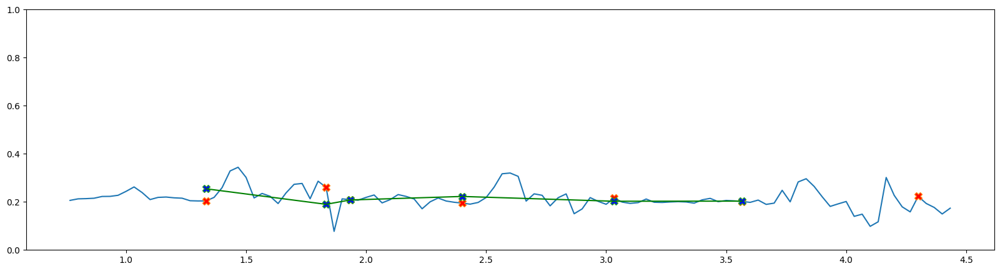

side left shimak left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.170226  0.566667 -0.042846  0.941153  0.976495  0.037222  0.092461   
1    0.168931  0.600000 -0.029741  0.938333  0.971179  0.033940  0.083402   
2    0.169422  0.633333 -0.029109  0.928019  0.960916  0.034015  0.084533   
3    0.172994  0.666667 -0.042800  0.921518  0.949971  0.029642  0.085852   
4    0.173673  0.700000 -0.042381  0.914849  0.940723  0.026911  0.086896   
..        ...       ...       ...       ...       ...       ...       ...   
117  0.177277  4.466667 -0.014745  0.028561  0.000560  0.028025  0.077434   
118  0.169362  4.500000 -0.019615  0.020212 -0.013302  0.035229  0.073188   
119  0.164074  4.533333 -0.015226  0.014955 -0.008879  0.025798  0.071195   
120  0.165976  4.566667 -0.002212  0.009106 -0.012644  0.021756  0.083133   
121  0.161937  4.600000  0.009623 -0.024007 -0.023748  0.005099  0.068410   

          sln       aln  
0    0.218661  0.

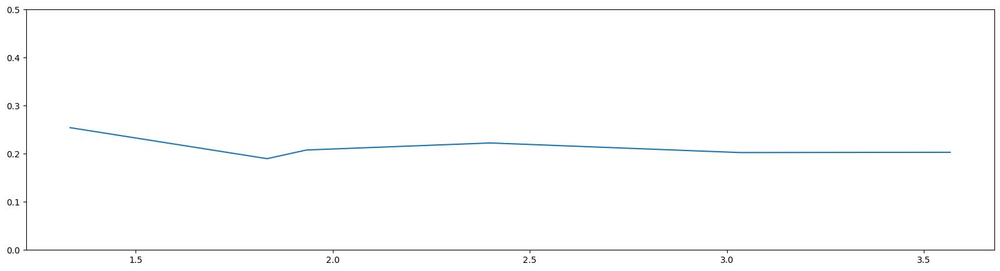

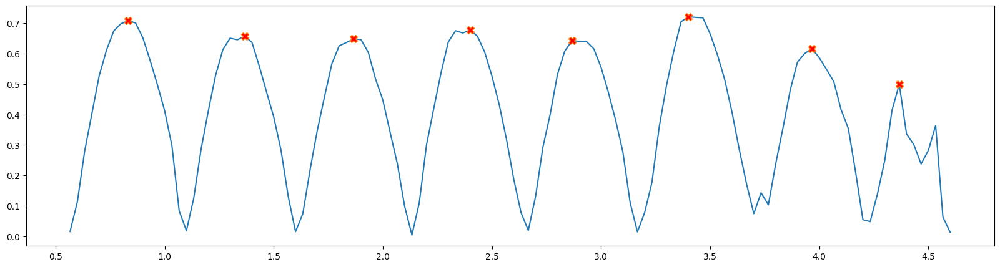

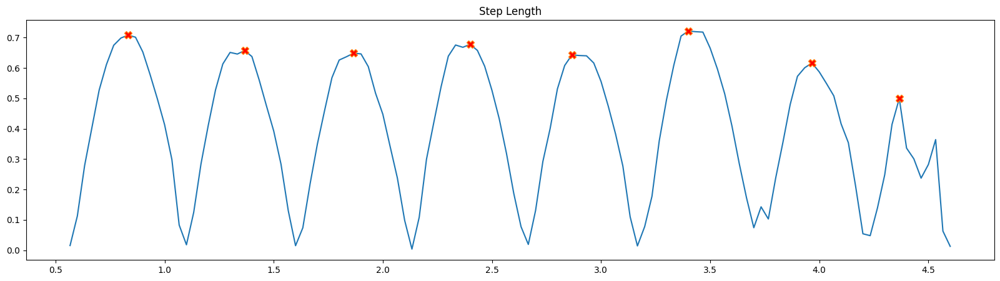

[  8  24  39  55  69  85 102 114]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.275266  1.410774 -0.042846   0.898314  0.566667  0.079363    0.315080   
1    1.342387  1.452305 -0.029741   0.899898  0.600000  0.375326    0.343849   
2    1.318538  1.457909 -0.029109   0.880840  0.633333 -0.344345    0.376531   
3    1.300071  1.419876 -0.042800   0.845249  0.666667 -0.241511    0.411091   
4    1.313942  1.410941 -0.042381   0.877758  0.700000  0.113008    0.449456   
..        ...       ...       ...        ...       ...       ...         ...   
117  1.335749  0.824821 -0.014745   1.716610  4.466667 -0.233268    0.504609   
118  1.380853  0.596454 -0.019615   2.738503  4.500000 -0.023657    0.493676   
119  1.446312  0.583426 -0.015226   1.875340  4.533333  0.285598    0.504715   
120  1.407538  1.324304 -0.002212   1.011796  4.566667  0.446239    0.460383   
121  1.412463  1.396781  0.009623   0.966615  4.600000  0.165806    0.411368   

     

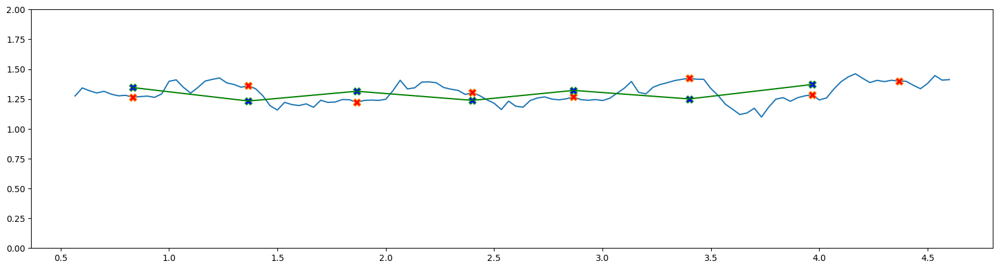

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.543165     0.578350 -0.042846  0.566667  0.079363      0.091839   
1       0.493702     0.570131 -0.029741  0.600000  0.375326      0.086618   
2       0.498948     0.570817 -0.029109  0.633333 -0.344345      0.082038   
3       0.496269     0.568361 -0.042800  0.666667 -0.241511      0.080486   
4       0.500341     0.577606 -0.042381  0.700000  0.113008      0.078830   
..           ...          ...       ...       ...       ...           ...   
117     0.436795     0.565121 -0.014745  4.466667 -0.233268      0.282802   
118     0.432142     0.561903 -0.019615  4.500000 -0.023657      0.255928   
119     0.433923     0.589509 -0.015226  4.533333  0.285598      0.233578   
120     0.500875     0.331425 -0.002212  4.566667  0.446239      0.211199   
121     0.422451     0.319218  0.009623  4.600000  0.165806      0.188939   

     visi_l_urm_l  
0        0.994829  
1        0.994974  
2        0.9950

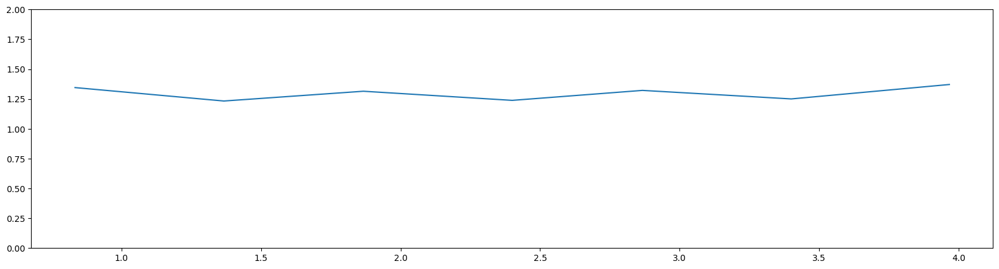

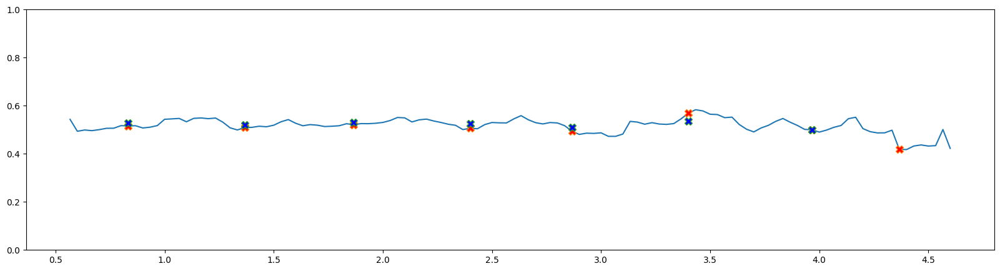

            r         l         c         t  velocity  visi_larm_r  \
0    0.422449  0.508580 -0.042846  0.566667  0.079363     0.016129   
1    0.446336  0.497082 -0.029741  0.600000  0.375326     0.014302   
2    0.443372  0.483460 -0.029109  0.633333 -0.344345     0.012652   
3    0.428453  0.450918 -0.042800  0.666667 -0.241511     0.012313   
4    0.421103  0.423919 -0.042381  0.700000  0.113008     0.011606   
..        ...       ...       ...       ...       ...          ...   
117  0.317222  0.554897 -0.014745  4.466667 -0.233268     0.085991   
118  0.302369  0.552347 -0.019615  4.500000 -0.023657     0.070470   
119  0.384832  0.551403 -0.015226  4.533333  0.285598     0.058368   
120  0.322087  0.063103 -0.002212  4.566667  0.446239     0.047964   
121  0.089284  0.086643  0.009623  4.600000  0.165806     0.039255   

     visi_larm_l  
0       0.979707  
1       0.979691  
2       0.978642  
3       0.979911  
4       0.980061  
..           ...  
117     0.912690  
118    

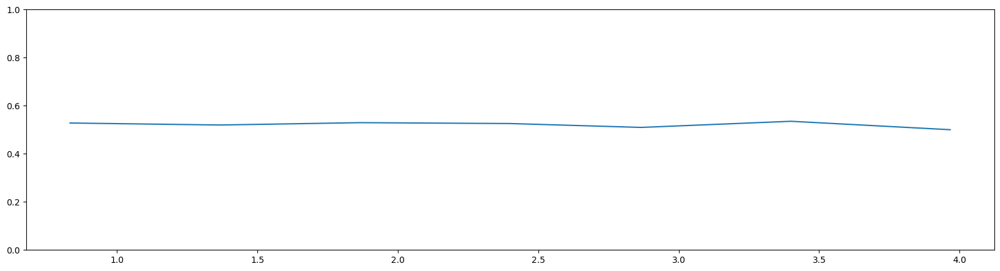

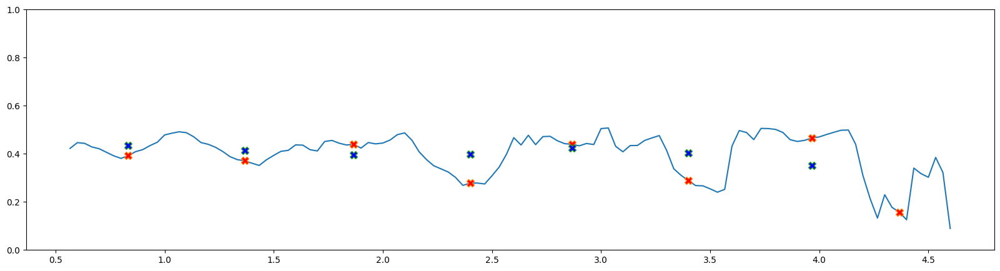

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.303371  0.320257 -0.042846  0.566667  0.079363  0.000048  0.925882
1    0.292127  0.307364 -0.029741  0.600000  0.375326  0.000036  0.925236
2    0.287293  0.295512 -0.029109  0.633333 -0.344345  0.000026  0.920406
3    0.287314  0.281994 -0.042800  0.666667 -0.241511  0.000024  0.924593
4    0.288644  0.277599 -0.042381  0.700000  0.113008  0.000021  0.924670
..        ...       ...       ...       ...       ...       ...       ...
117  0.242466  0.352814 -0.014745  4.466667 -0.233268  0.002153  0.749867
118  0.218173  0.334007 -0.019615  4.500000 -0.023657  0.001310  0.593054
119  0.241251  0.333049 -0.015226  4.533333  0.285598  0.000818  0.499678
120  0.189982  0.109640 -0.002212  4.566667  0.446239  0.000504  0.374442
121  0.155366  0.157748  0.009623  4.600000  0.165806  0.000306  0.297446

[122 rows x 7 columns]
t1 0.8333333333333334
t1 1.3666666666666667
t1 1.8666666666666667
t1 2.4
t1 2.8666666666

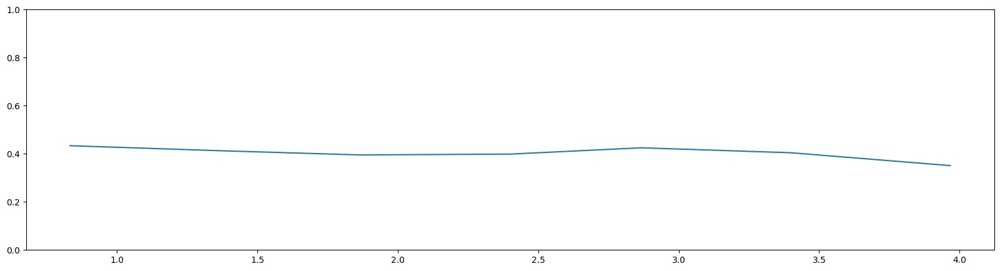

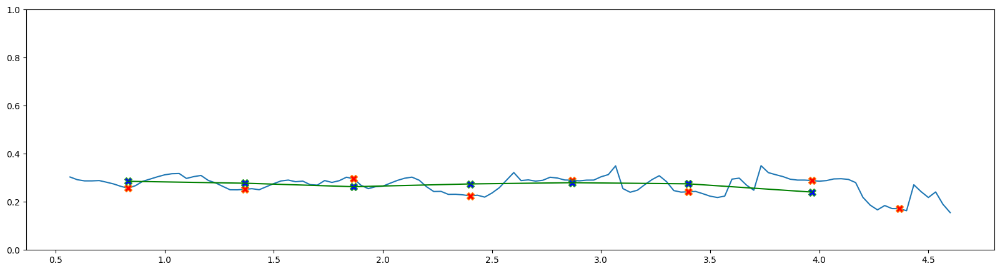

            r         l  leg_ratio         c         t  velocity  \
0    0.624073  0.694716   0.909413 -0.042846  0.566667  0.079363   
1    0.651431  0.723894   0.948581 -0.029741  0.600000  0.375326   
2    0.645098  0.732367   0.928190 -0.029109  0.633333 -0.344345   
3    0.616298  0.729132   0.989908 -0.042800  0.666667 -0.241511   
4    0.629270  0.716907   0.986509 -0.042381  0.700000  0.113008   
..        ...       ...        ...       ...       ...       ...   
117  0.618841  0.360502   1.543998 -0.014745  4.466667 -0.233268   
118  0.648729  0.236892   2.036153 -0.019615  4.500000 -0.023657   
119  0.682306  0.363830   3.479157 -0.015226  4.533333  0.285598   
120  0.666933  0.659158   1.113447 -0.002212  4.566667  0.446239   
121  0.715747  0.740468   1.061561  0.009623  4.600000  0.165806   

     visi_thigh_r  visi_thigh_l  
0        0.680682      0.942566  
1        0.702494      0.947076  
2        0.724530      0.951507  
3        0.745151      0.955046  
4        0.76

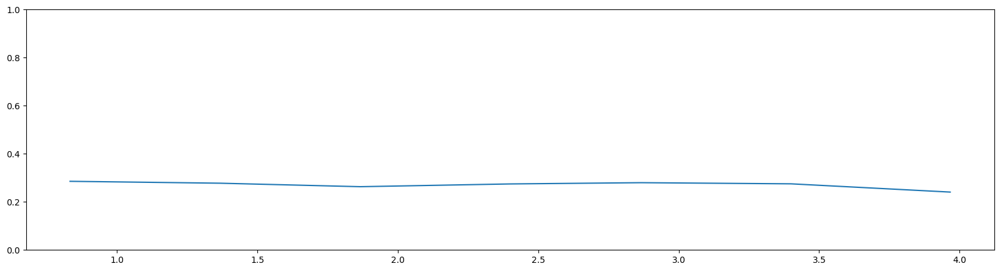

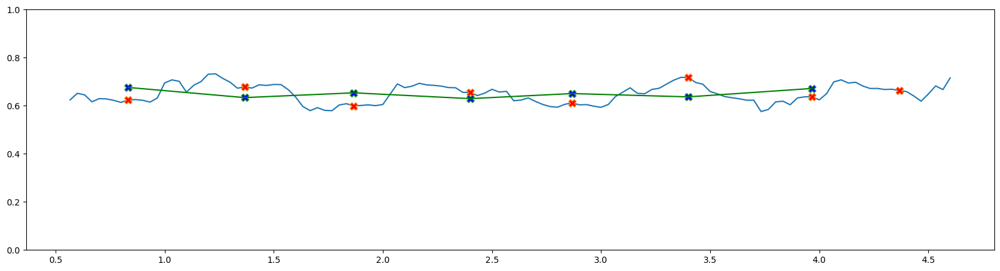

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.651192  0.716058   0.898314 -0.042846  0.566667  0.079363    0.462888   
1    0.690956  0.728411   0.899898 -0.029741  0.600000  0.375326    0.489470   
2    0.673440  0.725542   0.880840 -0.029109  0.633333 -0.344345    0.519690   
3    0.683773  0.690744   0.845249 -0.042800  0.666667 -0.241511    0.551688   
4    0.684672  0.694035   0.877758 -0.042381  0.700000  0.113008    0.586136   
..        ...       ...        ...       ...       ...       ...         ...   
117  0.716909  0.464320   1.716610 -0.014745  4.466667 -0.233268    0.661156   
118  0.732124  0.359563   2.738503 -0.019615  4.500000 -0.023657    0.648717   
119  0.764006  0.219595   1.875340 -0.015226  4.533333  0.285598    0.656642   
120  0.740606  0.665147   1.011796 -0.002212  4.566667  0.446239    0.619273   
121  0.696716  0.656313   0.966615  0.009623  4.600000  0.165806    0.581356   

     visi_shk_l  
0      0.910873  
1  

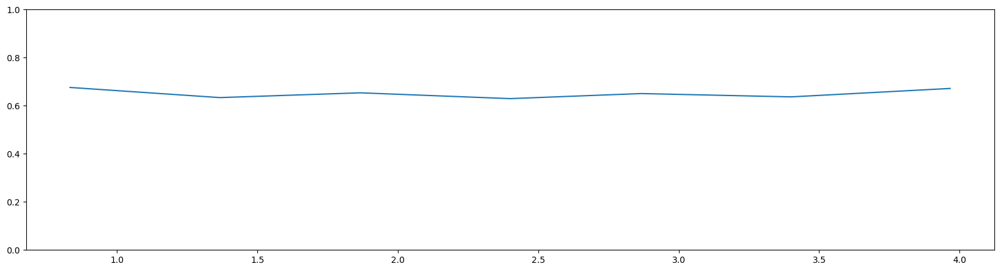

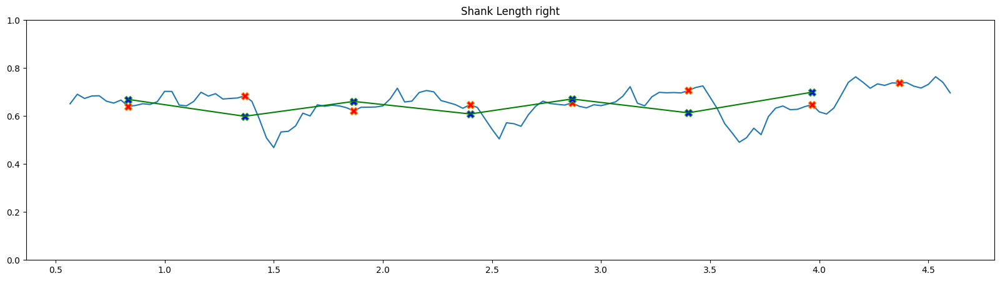

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.255329  0.197401   0.898314 -0.042846  0.566667  0.079363     0.511800   
1    0.231823  0.209662   0.899898 -0.029741  0.600000  0.375326     0.525626   
2    0.247944  0.213061   0.880840 -0.029109  0.633333 -0.344345     0.543834   
3    0.212608  0.207084   0.845249 -0.042800  0.666667 -0.241511     0.569176   
4    0.189205  0.205208   0.877758 -0.042381  0.700000  0.113008     0.598142   
..        ...       ...        ...       ...       ...       ...          ...   
117  0.169933  0.103778   1.716610 -0.014745  4.466667 -0.233268     0.697567   
118  0.185144  0.097594   2.738503 -0.019615  4.500000 -0.023657     0.672957   
119  0.191288  0.080485   1.875340 -0.015226  4.533333  0.285598     0.671905   
120  0.214231  0.255692   1.011796 -0.002212  4.566667  0.446239     0.645068   
121  0.204111  0.216675   0.966615  0.009623  4.600000  0.165806     0.630235   

     visi_foot_l  
0       

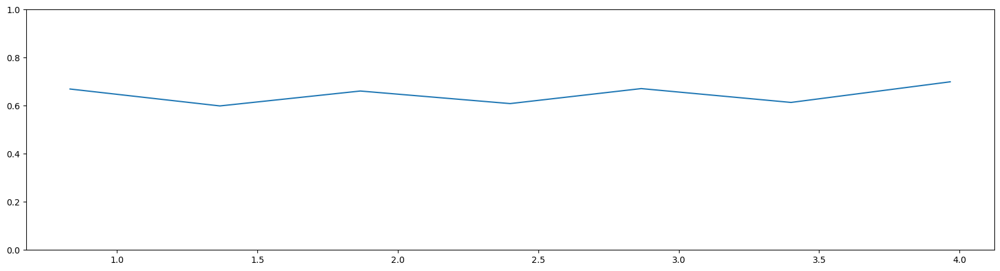

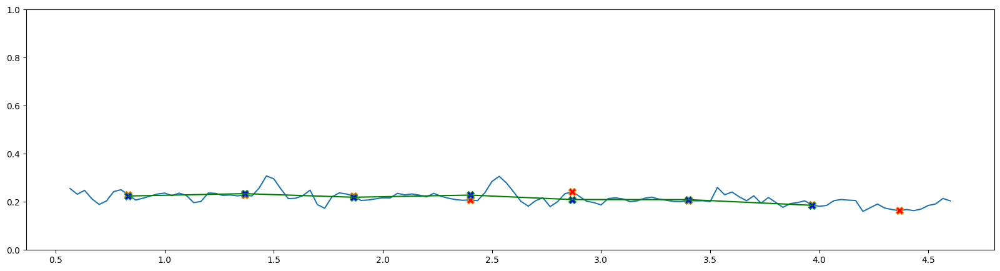

side left surath left 3 (7, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.181502  0.700000 -0.027288  0.943569  0.978996  0.037787  0.085295   
1    0.178551  0.733333 -0.022057  0.937051  0.975428  0.042276  0.084952   
2    0.175821  0.766667 -0.029307  0.927346  0.968536  0.044784  0.086657   
3    0.173878  0.800000 -0.035890  0.919891  0.961998  0.045363  0.087247   
4    0.172841  0.833333 -0.034707  0.911919  0.956249  0.046582  0.089101   
..        ...       ...       ...       ...       ...       ...       ...   
122  0.168834  4.766667 -0.016701  0.100111  0.059213  0.041964  0.092182   
123  0.168399  4.800000 -0.020359  0.093768  0.054132  0.040609  0.091723   
124  0.170707  4.833333 -0.017422  0.083992  0.049674  0.034769  0.087458   
125  0.174015  4.866667 -0.016556  0.074181  0.041734  0.032488  0.080440   
126  0.175725  4.900000 -0.009347  0.066903  0.036353  0.030553  0.086076   

          sln       aln  
0    0.208193  0.

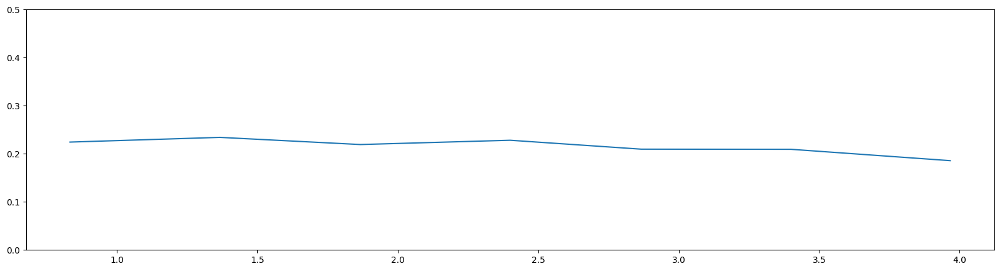

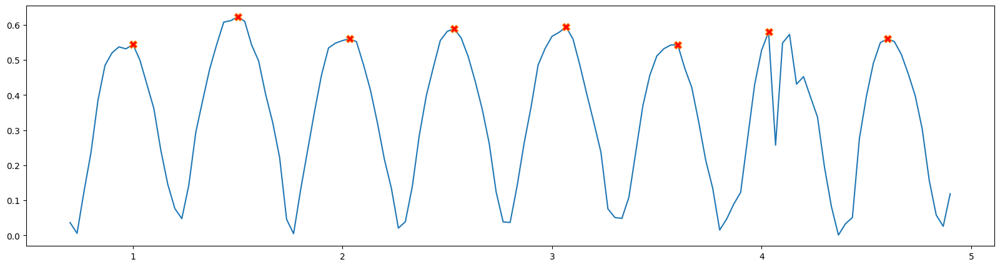

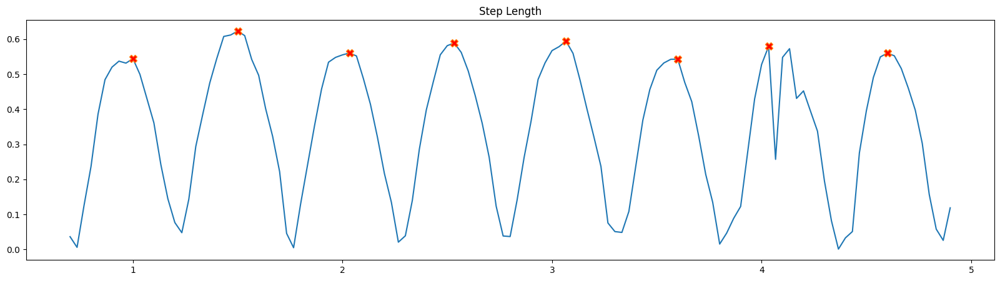

[  9  24  40  55  71  87 100 117]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.088804  1.235591 -0.027288   0.895401  0.700000  0.524807    0.151384   
1    1.231411  1.274076 -0.022057   0.985687  0.733333 -0.112401    0.151112   
2    1.305614  1.325320 -0.029307   1.023949  0.766667 -0.256891    0.171809   
3    1.343401  1.401929 -0.035890   0.989614  0.800000 -0.103939    0.180747   
4    1.390629  1.446283 -0.034707   0.976115  0.833333  0.182496    0.187921   
..        ...       ...       ...        ...       ...       ...         ...   
122  1.386942  1.359360 -0.016701   1.079889  4.766667 -0.088344    0.393771   
123  1.387992  1.284036 -0.020359   1.050243  4.800000 -0.021819    0.344580   
124  1.346290  1.271366 -0.017422   1.006378  4.833333  0.103099    0.314107   
125  1.294059  1.245196 -0.016556   0.987184  4.866667 -0.010316    0.314583   
126  1.294847  1.144931 -0.009347   0.992749  4.900000  0.664923    0.322613   

     

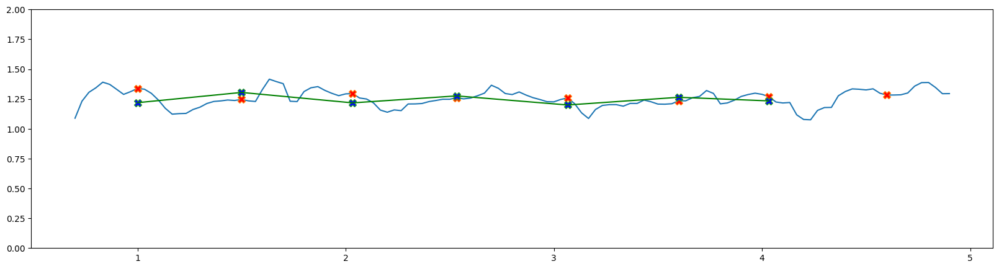

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.469939     0.538702 -0.027288  0.700000  0.524807      0.082348   
1       0.475785     0.544407 -0.022057  0.733333 -0.112401      0.087081   
2       0.492872     0.551525 -0.029307  0.766667 -0.256891      0.115865   
3       0.501772     0.558173 -0.035890  0.800000 -0.103939      0.152090   
4       0.515510     0.553991 -0.034707  0.833333  0.182496      0.195432   
..           ...          ...       ...       ...       ...           ...   
122     0.545990     0.555869 -0.016701  4.766667 -0.088344      0.665108   
123     0.544679     0.564650 -0.020359  4.800000 -0.021819      0.658390   
124     0.512326     0.561630 -0.017422  4.833333  0.103099      0.603820   
125     0.462258     0.555088 -0.016556  4.866667 -0.010316      0.553016   
126     0.489831     0.553660 -0.009347  4.900000  0.664923      0.506712   

     visi_l_urm_l  
0        0.997413  
1        0.997589  
2        0.9977

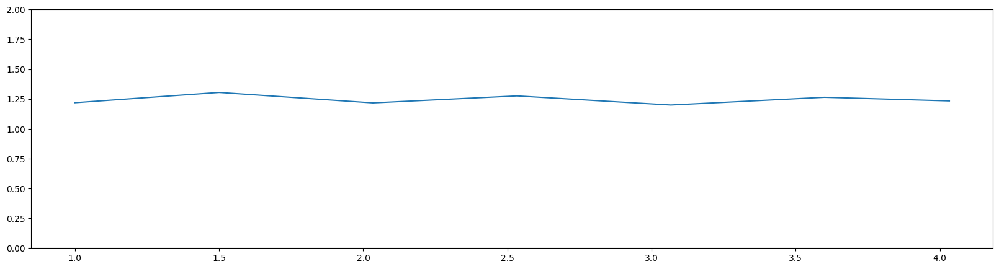

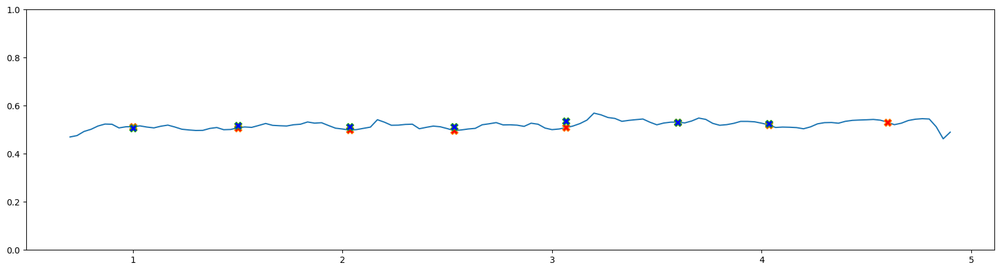

            r         l         c         t  velocity  visi_larm_r  \
0    0.415915  0.509924 -0.027288  0.700000  0.524807     0.016479   
1    0.410884  0.527994 -0.022057  0.733333 -0.112401     0.019507   
2    0.430504  0.549985 -0.029307  0.766667 -0.256891     0.032149   
3    0.437585  0.561529 -0.035890  0.800000 -0.103939     0.049917   
4    0.442897  0.561795 -0.034707  0.833333  0.182496     0.073202   
..        ...       ...       ...       ...       ...          ...   
122  0.457989  0.466124 -0.016701  4.766667 -0.088344     0.416231   
123  0.465479  0.474911 -0.020359  4.800000 -0.021819     0.409835   
124  0.433404  0.470314 -0.017422  4.833333  0.103099     0.344280   
125  0.315471  0.488042 -0.016556  4.866667 -0.010316     0.290650   
126  0.328016  0.489886 -0.009347  4.900000  0.664923     0.246528   

     visi_larm_l  
0       0.985721  
1       0.986718  
2       0.987854  
3       0.988740  
4       0.989318  
..           ...  
122     0.989249  
123    

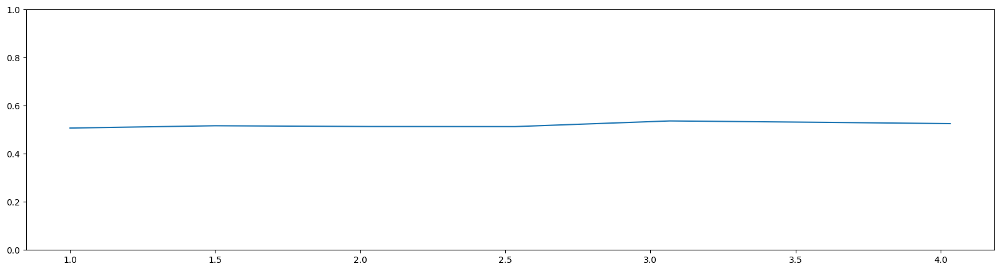

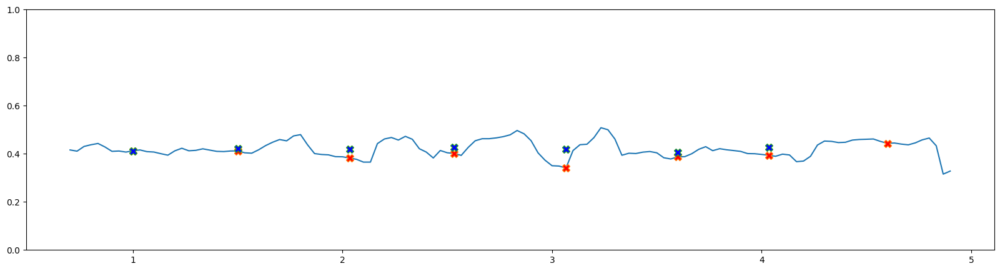

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.282902  0.340254 -0.027288  0.700000  0.524807  0.000061  0.944063
1    0.284204  0.340169 -0.022057  0.733333 -0.112401  0.000093  0.947828
2    0.295924  0.341615 -0.029307  0.766667 -0.256891  0.000302  0.952130
3    0.296921  0.339096 -0.035890  0.800000 -0.103939  0.000837  0.955512
4    0.295797  0.341030 -0.034707  0.833333  0.182496  0.002008  0.957743
..        ...       ...       ...       ...       ...       ...       ...
122  0.288366  0.291500 -0.016701  4.766667 -0.088344  0.097200  0.958420
123  0.290687  0.290269 -0.020359  4.800000 -0.021819  0.093779  0.955934
124  0.263272  0.303164 -0.017422  4.833333  0.103099  0.060889  0.953097
125  0.216216  0.311215 -0.016556  4.866667 -0.010316  0.040223  0.955228
126  0.235675  0.325079 -0.009347  4.900000  0.664923  0.026919  0.954087

[127 rows x 7 columns]
t1 1.0
t1 1.5
t1 2.033333333333333
t1 2.533333333333333
t1 3.066666666666667
t1 3.6
t1 4

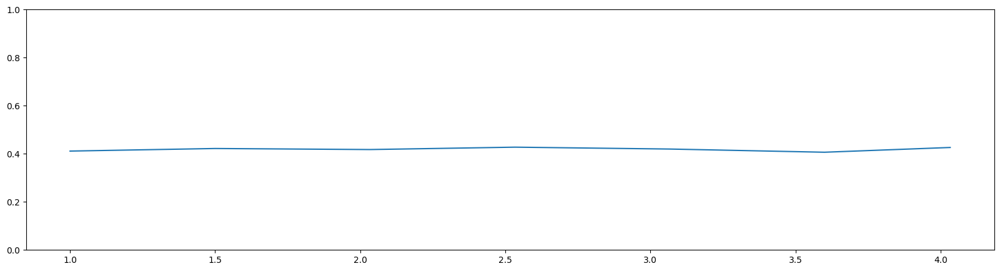

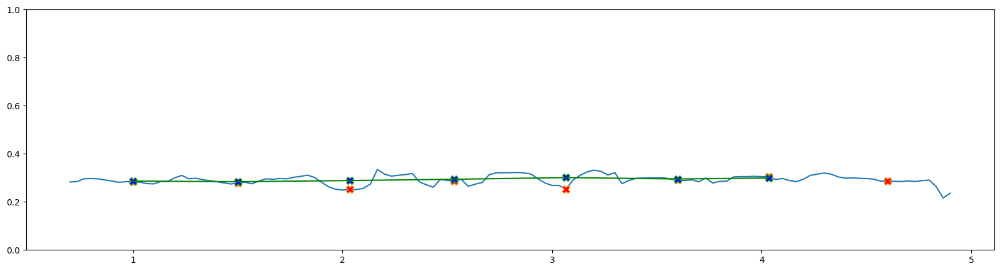

            r         l  leg_ratio         c         t  velocity  \
0    0.523878  0.585076   0.868429 -0.027288  0.700000  0.524807   
1    0.603215  0.611975   0.948791 -0.022057  0.733333 -0.112401   
2    0.657770  0.642385   0.948617 -0.029307  0.766667 -0.256891   
3    0.671258  0.678303   0.928853 -0.035890  0.800000 -0.103939   
4    0.719025  0.736619   0.946368 -0.034707  0.833333  0.182496   
..        ...       ...        ...       ...       ...       ...   
122  0.649078  0.601061   0.973050 -0.016701  4.766667 -0.088344   
123  0.652412  0.621201   1.109748 -0.020359  4.800000 -0.021819   
124  0.641203  0.637140   1.111727 -0.017422  4.833333  0.103099   
125  0.625692  0.633815   1.093210 -0.016556  4.866667 -0.010316   
126  0.619626  0.624151   1.296558 -0.009347  4.900000  0.664923   

     visi_thigh_r  visi_thigh_l  
0        0.519719      0.948536  
1        0.514115      0.952841  
2        0.533539      0.957351  
3        0.537379      0.961053  
4        0.53

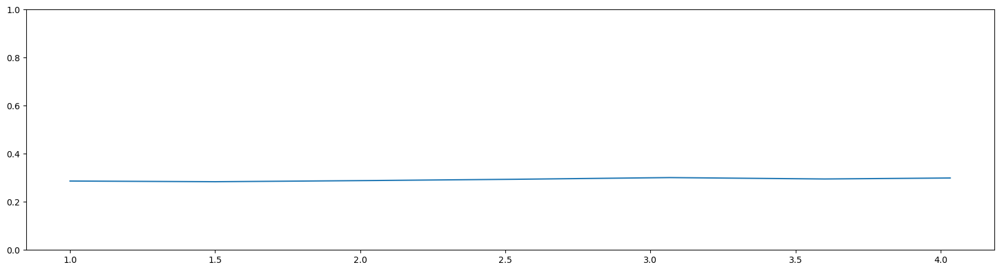

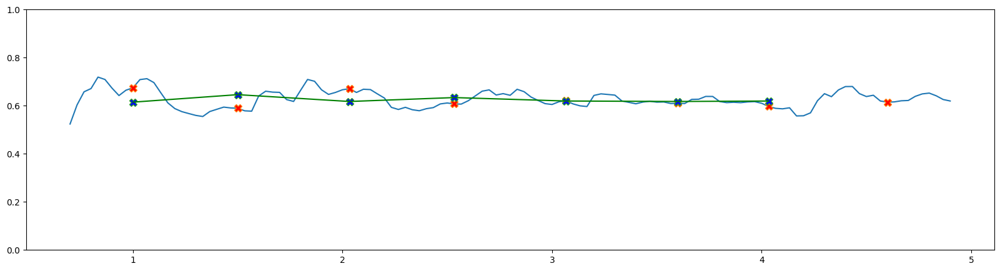

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.564926  0.650515   0.895401 -0.027288  0.700000  0.524807    0.291281   
1    0.628196  0.662102   0.985687 -0.022057  0.733333 -0.112401    0.293926   
2    0.647844  0.682934   1.023949 -0.029307  0.766667 -0.256891    0.322018   
3    0.672143  0.723627   0.989614 -0.035890  0.800000 -0.103939    0.336349   
4    0.671604  0.709665   0.976115 -0.034707  0.833333  0.182496    0.348992   
..        ...       ...        ...       ...       ...       ...         ...   
122  0.737864  0.758300   1.079889 -0.016701  4.766667 -0.088344    0.587697   
123  0.735579  0.662835   1.050243 -0.020359  4.800000 -0.021819    0.548862   
124  0.705087  0.634227   1.006378 -0.017422  4.833333  0.103099    0.522566   
125  0.668367  0.611380   0.987184 -0.016556  4.866667 -0.010316    0.522088   
126  0.675222  0.520780   0.992749 -0.009347  4.900000  0.664923    0.528401   

     visi_shk_l  
0      0.908604  
1  

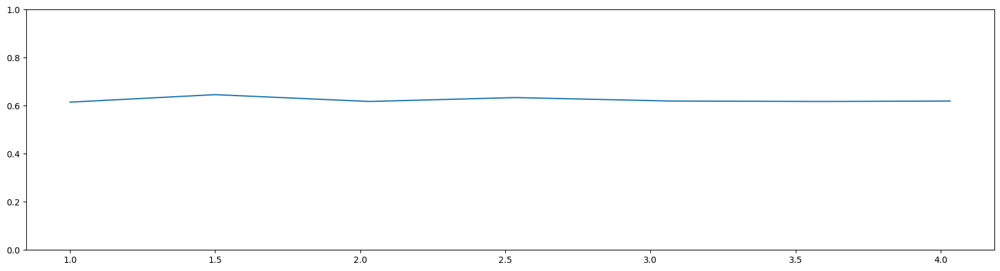

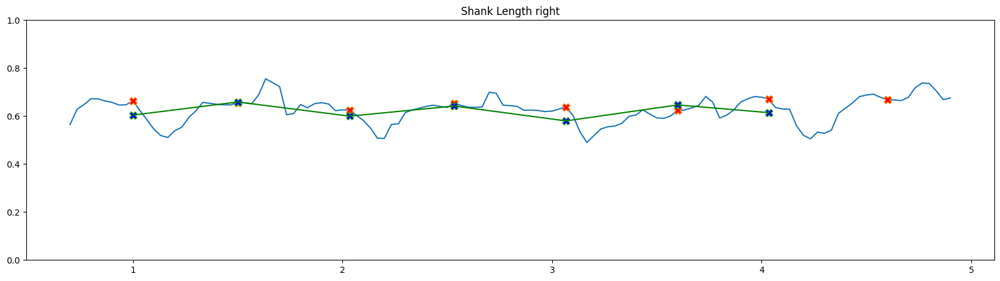

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.237584  0.238349   0.895401 -0.027288  0.700000  0.524807     0.402266   
1    0.213993  0.231648   0.985687 -0.022057  0.733333 -0.112401     0.419638   
2    0.211041  0.253163   1.023949 -0.029307  0.766667 -0.256891     0.454695   
3    0.231430  0.224862   0.989614 -0.035890  0.800000 -0.103939     0.482814   
4    0.250863  0.218090   0.976115 -0.034707  0.833333  0.182496     0.511761   
..        ...       ...        ...       ...       ...       ...          ...   
122  0.174985  0.283103   1.079889 -0.016701  4.766667 -0.088344     0.809818   
123  0.153160  0.303290   1.050243 -0.020359  4.800000 -0.021819     0.809595   
124  0.155850  0.267718   1.006378 -0.017422  4.833333  0.103099     0.801864   
125  0.178397  0.289752   0.987184 -0.016556  4.866667 -0.010316     0.790715   
126  0.164336  0.339183   0.992749 -0.009347  4.900000  0.664923     0.779479   

     visi_foot_l  
0       

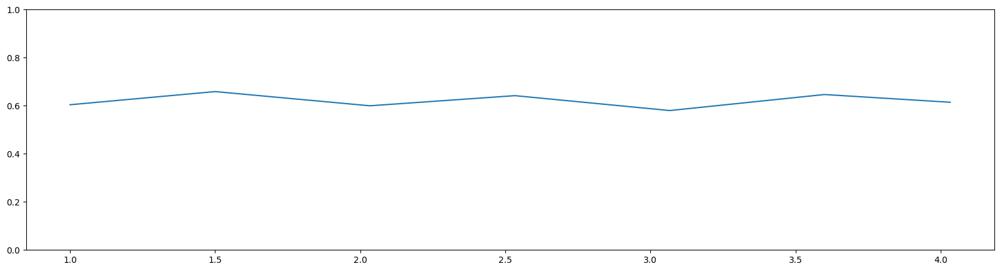

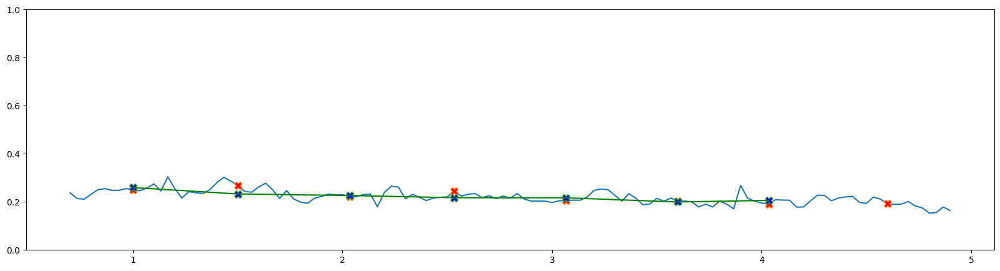

side left idunil left 3 (7, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.218289  0.533333 -0.042927  0.945539  0.984934  0.044858  0.098116   
1    0.213783  0.566667 -0.046636  0.939521  0.980437  0.046570  0.097934   
2    0.213647  0.600000 -0.044085  0.933353  0.976942  0.047963  0.101169   
3    0.210788  0.633333 -0.037795  0.925058  0.972319  0.050691  0.104882   
4    0.201563  0.666667 -0.029674  0.909771  0.967583  0.060463  0.105189   
..        ...       ...       ...       ...       ...       ...       ...   
111  0.229156  4.233333 -0.030518  0.048847  0.012488  0.037684  0.113725   
112  0.229312  4.266667 -0.033764  0.038869  0.003612  0.036363  0.118751   
113  0.227414  4.300000 -0.031195  0.029640 -0.002152  0.032521  0.117351   
114  0.221746  4.333333 -0.031145  0.019748 -0.011352  0.032070  0.114044   
115  0.214357  4.366667 -0.021535  0.014751 -0.029955  0.046415  0.098401   

          sln       aln  
0    0.205500  0.

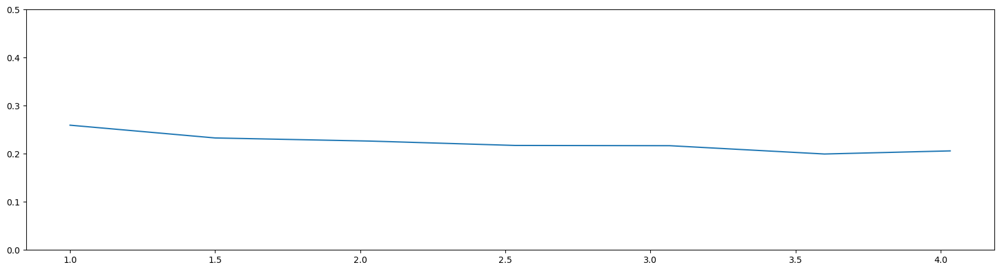

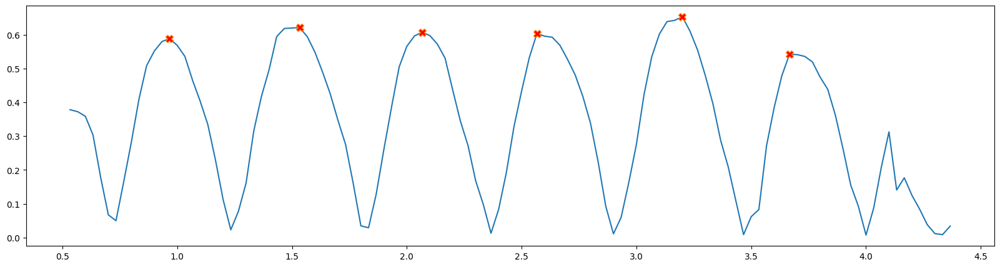

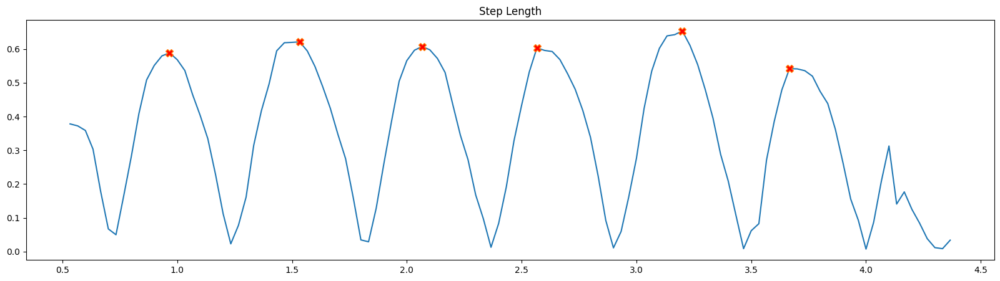

[13 30 46 61 80 94]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.199503  0.955669 -0.042927   0.896831  0.533333 -0.311461    0.485013   
1    1.241500  0.918356 -0.046636   0.941139  0.566667  0.022048    0.494408   
2    1.254656  1.163527 -0.044085   0.954336  0.600000  0.119087    0.494657   
3    1.287055  1.209777 -0.037795   0.974544  0.633333  0.276504    0.492264   
4    1.350406  1.304080 -0.029674   1.021615  0.666667  0.089469    0.446399   
..        ...       ...       ...        ...       ...       ...         ...   
111  1.183123  1.186640 -0.030518   1.062273  4.233333 -0.149626    0.290675   
112  1.132561  1.178972 -0.033764   1.005685  4.266667  0.009834    0.277403   
113  1.159136  1.195209 -0.031195   1.003969  4.300000  0.063831    0.284174   
114  1.214429  1.239357 -0.031145   1.002943  4.333333 -0.001368    0.274449   
115  1.249688  1.271747 -0.021535   0.919928  4.366667  0.811029    0.249049   

     visi_lbl_l  
0

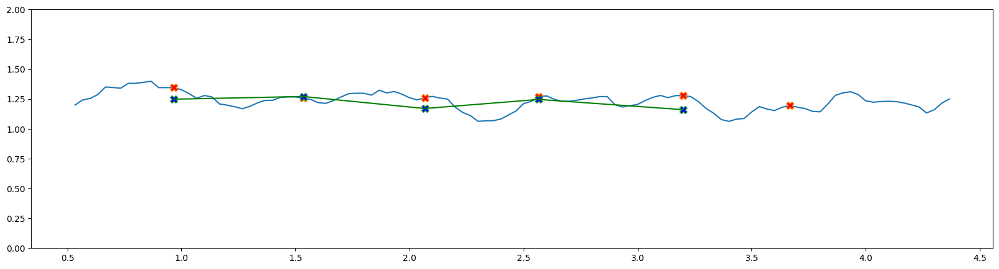

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.449477     0.547869 -0.042927  0.533333 -0.311461      0.060872   
1       0.458100     0.557873 -0.046636  0.566667  0.022048      0.057815   
2       0.473532     0.556552 -0.044085  0.600000  0.119087      0.056070   
3       0.497570     0.566750 -0.037795  0.633333  0.276504      0.062593   
4       0.521866     0.590366 -0.029674  0.666667  0.089469      0.096929   
..           ...          ...       ...       ...       ...           ...   
111     0.496277     0.556561 -0.030518  4.233333 -0.149626      0.173097   
112     0.517860     0.562530 -0.033764  4.266667  0.009834      0.162922   
113     0.516024     0.579800 -0.031195  4.300000  0.063831      0.152107   
114     0.514300     0.580317 -0.031145  4.333333 -0.001368      0.138035   
115     0.459053     0.487991 -0.021535  4.366667  0.811029      0.124628   

     visi_l_urm_l  
0        0.997880  
1        0.997955  
2        0.9980

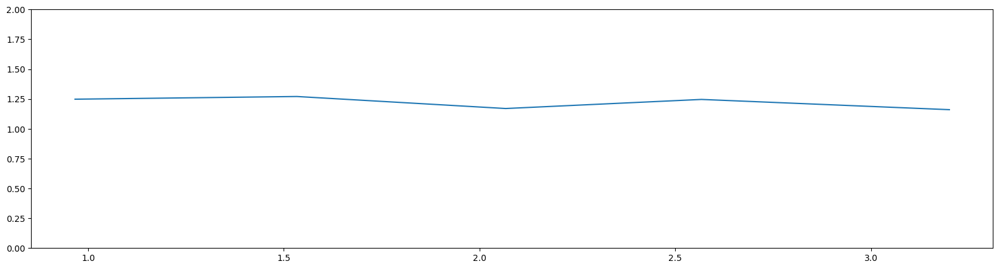

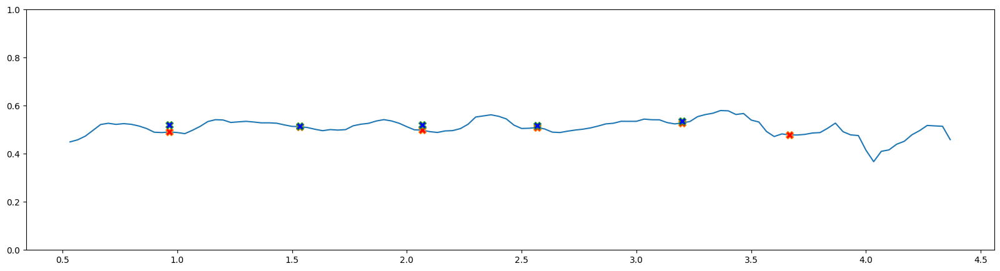

            r         l         c         t  velocity  visi_larm_r  \
0    0.392785  0.514699 -0.042927  0.533333 -0.311461     0.009087   
1    0.411245  0.524971 -0.046636  0.566667  0.022048     0.008274   
2    0.446887  0.519838 -0.044085  0.600000  0.119087     0.008014   
3    0.446980  0.517201 -0.037795  0.633333  0.276504     0.010992   
4    0.460585  0.531968 -0.029674  0.666667  0.089469     0.022366   
..        ...       ...       ...       ...       ...          ...   
111  0.444418  0.514274 -0.030518  4.233333 -0.149626     0.029205   
112  0.445185  0.506439 -0.033764  4.266667  0.009834     0.026223   
113  0.460299  0.512702 -0.031195  4.300000  0.063831     0.023035   
114  0.459650  0.554338 -0.031145  4.333333 -0.001368     0.019089   
115  0.143555  0.060007 -0.021535  4.366667  0.811029     0.015647   

     visi_larm_l  
0       0.992447  
1       0.992649  
2       0.992904  
3       0.993362  
4       0.993546  
..           ...  
111     0.977706  
112    

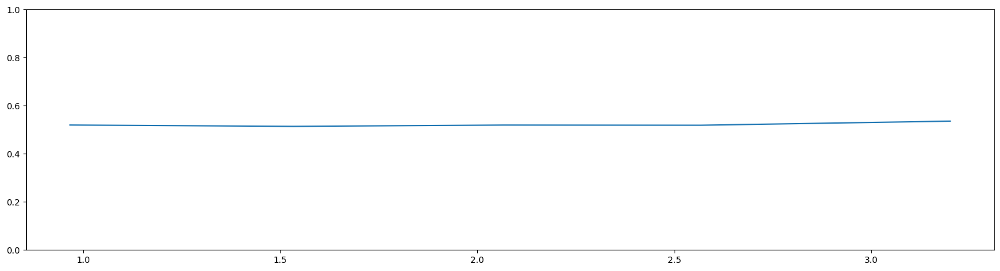

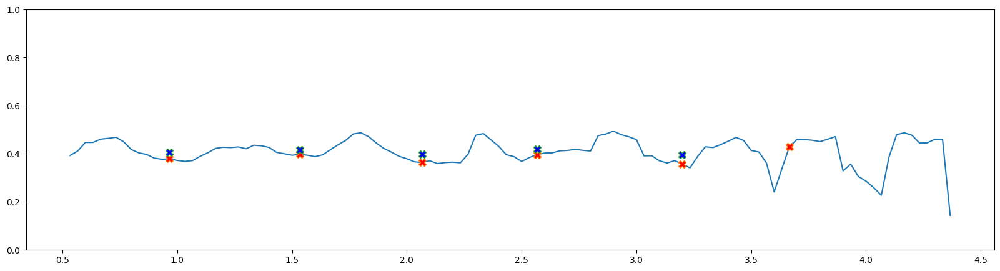

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.315146  0.366240 -0.042927  0.533333 -0.311461  0.000013  0.969091
1    0.312771  0.368416 -0.046636  0.566667  0.022048  0.000011  0.969678
2    0.315959  0.370162 -0.044085  0.600000  0.119087  0.000010  0.970681
3    0.323462  0.369045 -0.037795  0.633333  0.276504  0.000023  0.972533
4    0.326180  0.376747 -0.029674  0.666667  0.089469  0.000119  0.973379
..        ...       ...       ...       ...       ...       ...       ...
111  0.339235  0.385724 -0.030518  4.233333 -0.149626  0.000131  0.922341
112  0.344449  0.389577 -0.033764  4.266667  0.009834  0.000101  0.915617
113  0.359122  0.389597 -0.031195  4.300000  0.063831  0.000073  0.909772
114  0.358051  0.363252 -0.031145  4.333333 -0.001368  0.000046  0.848662
115  0.168260  0.174717 -0.021535  4.366667  0.811029  0.000028  0.562498

[116 rows x 7 columns]
t1 0.9666666666666667
t1 1.5333333333333334
t1 2.066666666666667
t1 2.566666666666667
t1

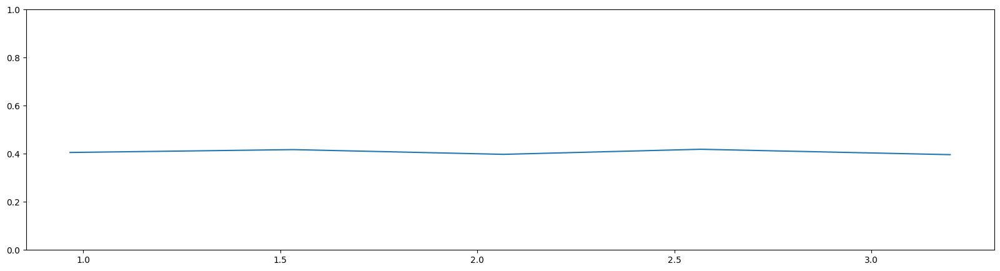

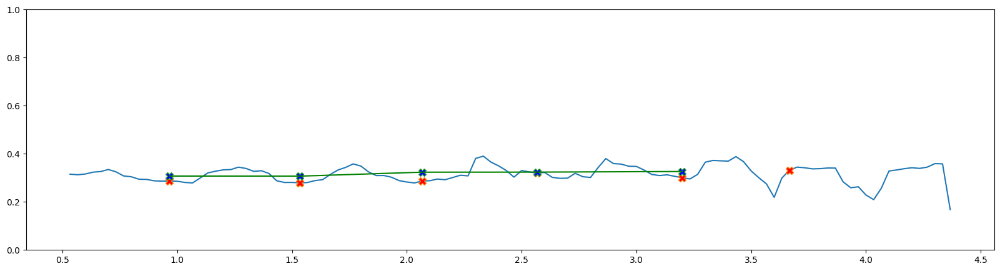

            r         l  leg_ratio         c         t  velocity  \
0    0.579598  0.646274   2.003600 -0.042927  0.533333 -0.311461   
1    0.605933  0.643829   2.315139 -0.046636  0.566667  0.022048   
2    0.608490  0.637606   1.228637 -0.044085  0.600000  0.119087   
3    0.623570  0.639858   1.164173 -0.037795  0.633333  0.276504   
4    0.659297  0.645348   1.049150 -0.029674  0.666667  0.089469   
..        ...       ...        ...       ...       ...       ...   
111  0.570763  0.537303   0.943055 -0.030518  4.233333 -0.149626   
112  0.557839  0.554686   0.920606 -0.033764  4.266667  0.009834   
113  0.563879  0.561650   0.939544 -0.031195  4.300000  0.063831   
114  0.576626  0.574934   0.959935 -0.031145  4.333333 -0.001368   
115  0.566233  0.615519   1.041490 -0.021535  4.366667  0.811029   

     visi_thigh_r  visi_thigh_l  
0        0.780183      0.895450  
1        0.782125      0.903949  
2        0.778219      0.911921  
3        0.772563      0.918553  
4        0.74

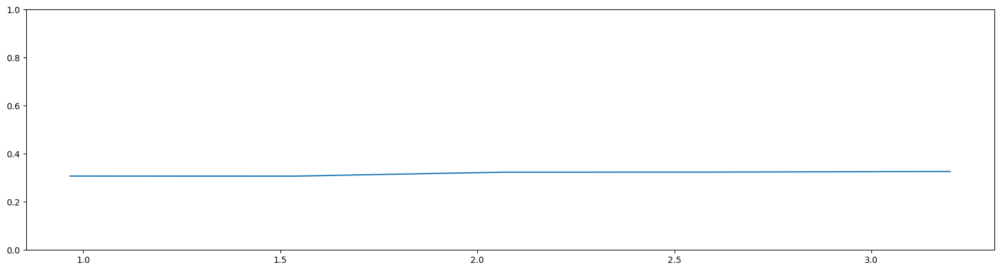

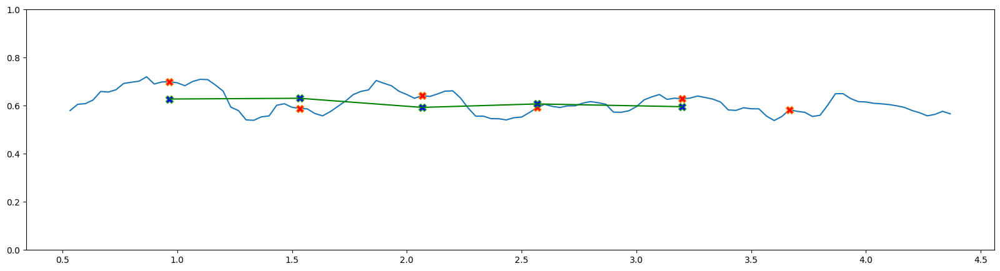

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.619904  0.309395   0.896831 -0.042927  0.533333 -0.311461    0.621665   
1    0.635567  0.274526   0.941139 -0.046636  0.566667  0.022048    0.632134   
2    0.646166  0.525921   0.954336 -0.044085  0.600000  0.119087    0.635627   
3    0.663484  0.569919   0.974544 -0.037795  0.633333  0.276504    0.637184   
4    0.691109  0.658732   1.021615 -0.029674  0.666667  0.089469    0.602817   
..        ...       ...        ...       ...       ...       ...         ...   
111  0.612361  0.649337   1.062273 -0.030518  4.233333 -0.149626    0.462558   
112  0.574722  0.624286   1.005685 -0.033764  4.266667  0.009834    0.446160   
113  0.595257  0.633559   1.003969 -0.031195  4.300000  0.063831    0.451796   
114  0.637803  0.664423   1.002943 -0.031145  4.333333 -0.001368    0.442165   
115  0.683455  0.656228   0.919928 -0.021535  4.366667  0.811029    0.417901   

     visi_shk_l  
0      0.614122  
1  

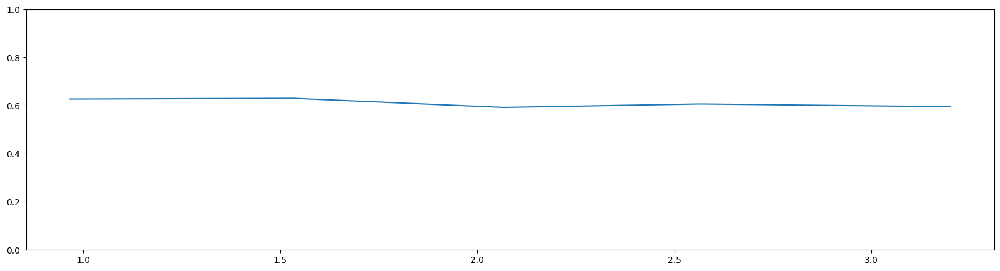

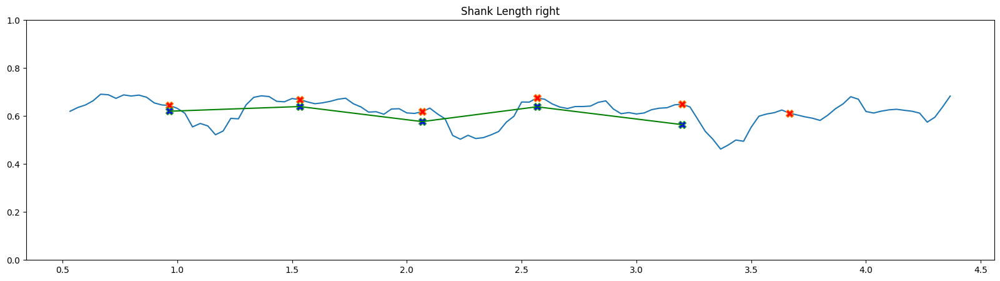

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.230589  0.105389   0.896831 -0.042927  0.533333 -0.311461     0.582272   
1    0.234508  0.254934   0.941139 -0.046636  0.566667  0.022048     0.598824   
2    0.238260  0.260603   0.954336 -0.044085  0.600000  0.119087     0.614755   
3    0.245884  0.314520   0.974544 -0.037795  0.633333  0.276504     0.631426   
4    0.257058  0.301090   1.021615 -0.029674  0.666667  0.089469     0.626928   
..        ...       ...        ...       ...       ...       ...          ...   
111  0.186180  0.173257   1.062273 -0.030518  4.233333 -0.149626     0.597024   
112  0.177383  0.187615   1.005685 -0.033764  4.266667  0.009834     0.571601   
113  0.182122  0.194577   1.003969 -0.031195  4.300000  0.063831     0.570134   
114  0.188647  0.209484   1.002943 -0.031145  4.333333 -0.001368     0.556783   
115  0.166271  0.188808   0.919928 -0.021535  4.366667  0.811029     0.531440   

     visi_foot_l  
0       

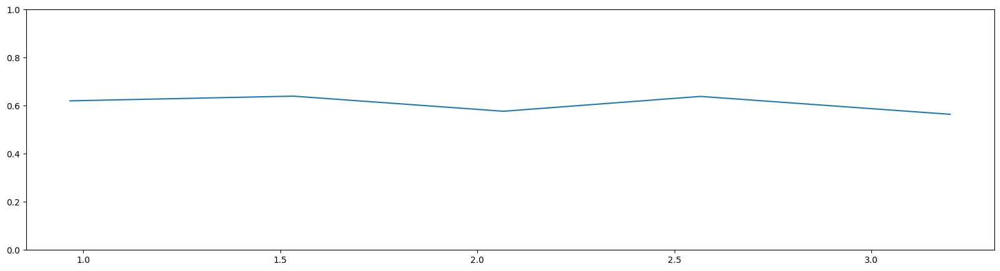

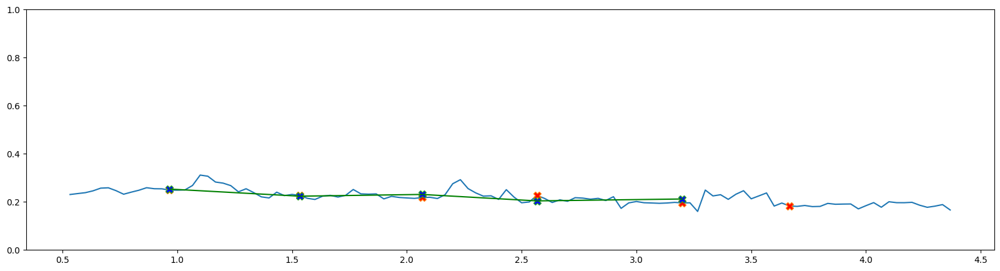

side left Nipun left 3 (5, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.176761  0.500000 -0.042970  0.944064  0.974128  0.032012  0.092366   
1    0.176976  0.533333 -0.042968  0.936768  0.969450  0.034143  0.095757   
2    0.176468  0.566667 -0.040111  0.926578  0.960504  0.035333  0.096298   
3    0.174386  0.600000 -0.041081  0.919935  0.951220  0.032370  0.096098   
4    0.174601  0.633333 -0.033601  0.913791  0.942551  0.030042  0.095878   
..        ...       ...       ...       ...       ...       ...       ...   
108  0.182530  4.100000 -0.024625  0.043533  0.024859  0.018834  0.101516   
109  0.185733  4.133333 -0.018335  0.036962  0.014990  0.022080  0.101460   
110  0.190396  4.166667 -0.020073  0.032167  0.006907  0.025618  0.101398   
111  0.196518  4.200000 -0.031437  0.022094  0.005671  0.016998  0.101949   
112  0.191574  4.233333 -0.025526  0.019207  0.003991  0.016226  0.099004   

          sln       aln  
0    0.181102  0.5

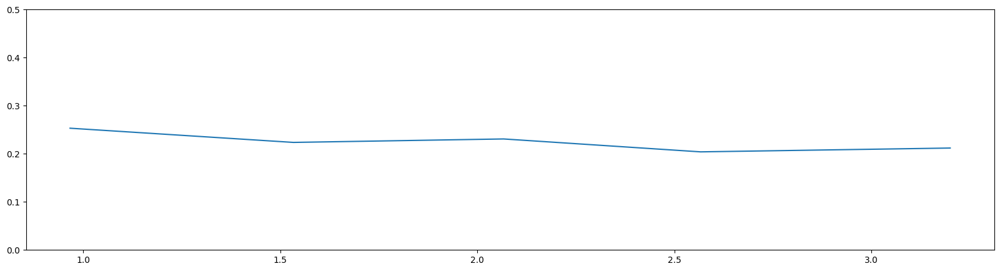

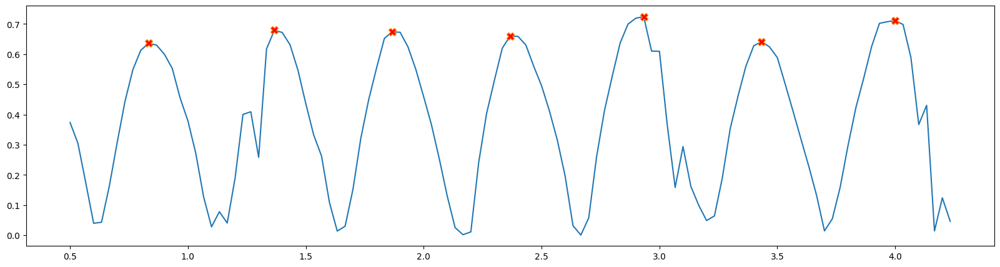

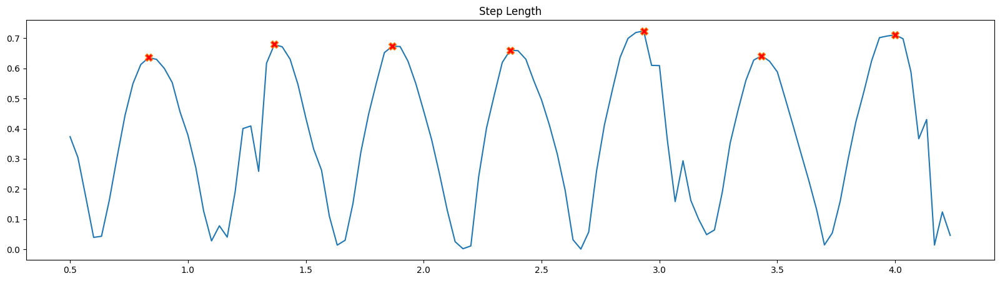

[ 10  26  41  56  73  88 105]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.492128  1.353957 -0.042970   0.995435  0.500000 -0.384250    0.363855   
1    1.488999  1.374935 -0.042968   0.979071  0.533333  0.167442    0.336583   
2    1.500742  1.361482 -0.040111   0.992761  0.566667 -0.028257    0.301135   
3    1.504215  1.402698 -0.041081   1.042588  0.600000  0.080109    0.273504   
4    1.507739  1.432492 -0.033601   1.074892  0.633333  0.282100    0.287745   
..        ...       ...       ...        ...       ...       ...         ...   
108  1.255538  1.386996 -0.024625   0.969586  4.100000  0.304899    0.551040   
109  1.230887  1.383185 -0.018335   0.959436  4.133333  0.081598    0.528534   
110  1.249972  1.280163 -0.020073   0.949190  4.166667 -0.228937    0.516737   
111  1.132112  1.213171 -0.031437   0.923665  4.200000 -0.319275    0.426499   
112  1.150124  1.242508 -0.025526   0.892957  4.233333  1.015318    0.359019   

     visi

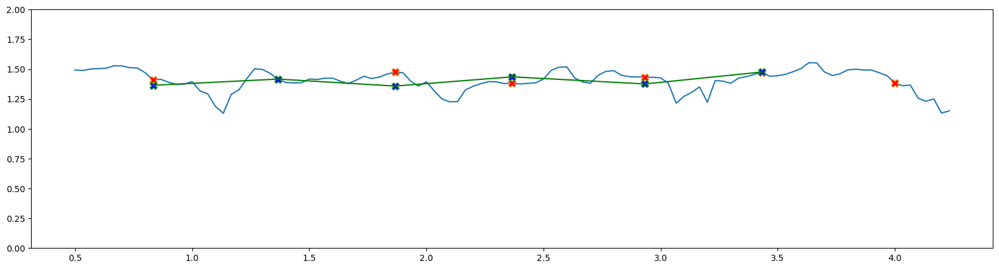

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.522550     0.606514 -0.042970  0.500000 -0.384250      0.085019   
1       0.541073     0.606521 -0.042968  0.533333  0.167442      0.099955   
2       0.545699     0.605228 -0.040111  0.566667 -0.028257      0.115670   
3       0.551062     0.612363 -0.041081  0.600000  0.080109      0.128635   
4       0.549129     0.610954 -0.033601  0.633333  0.282100      0.151500   
..           ...          ...       ...       ...       ...           ...   
108     0.556161     0.586781 -0.024625  4.100000  0.304899      0.187490   
109     0.546268     0.581287 -0.018335  4.133333  0.081598      0.173389   
110     0.532566     0.572801 -0.020073  4.166667 -0.228937      0.159380   
111     0.518778     0.542529 -0.031437  4.200000 -0.319275      0.143901   
112     0.516790     0.517262 -0.025526  4.233333  1.015318      0.130490   

     visi_l_urm_l  
0        0.998864  
1        0.998903  
2        0.9989

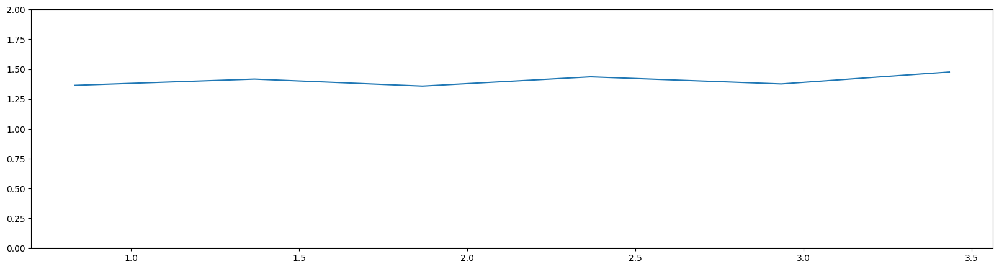

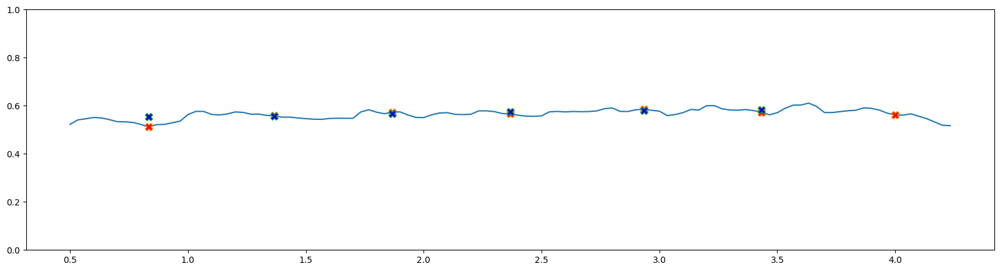

            r         l         c         t  velocity  visi_larm_r  \
0    0.450566  0.549284 -0.042970  0.500000 -0.384250     0.019191   
1    0.477412  0.549664 -0.042968  0.533333  0.167442     0.026460   
2    0.478522  0.558674 -0.040111  0.566667 -0.028257     0.035338   
3    0.452800  0.569651 -0.041081  0.600000  0.080109     0.042910   
4    0.434980  0.573415 -0.033601  0.633333  0.282100     0.057604   
..        ...       ...       ...       ...       ...          ...   
108  0.477003  0.580553 -0.024625  4.100000  0.304899     0.037649   
109  0.469907  0.576170 -0.018335  4.133333  0.081598     0.032275   
110  0.447158  0.555397 -0.020073  4.166667 -0.228937     0.027305   
111  0.429750  0.518628 -0.031437  4.200000 -0.319275     0.022832   
112  0.410775  0.443861 -0.025526  4.233333  1.015318     0.018932   

     visi_larm_l  
0       0.995159  
1       0.995314  
2       0.995662  
3       0.995980  
4       0.996310  
..           ...  
108     0.982945  
109    

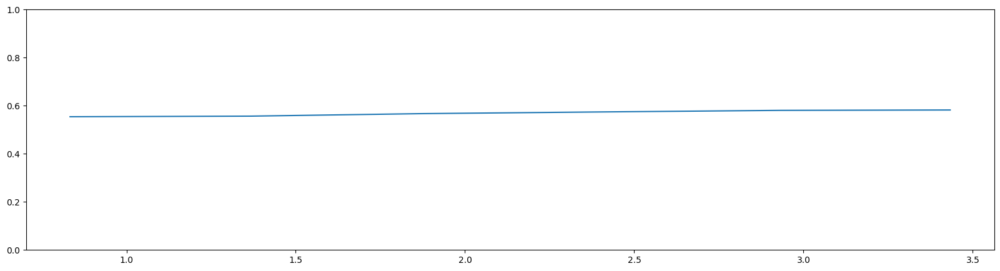

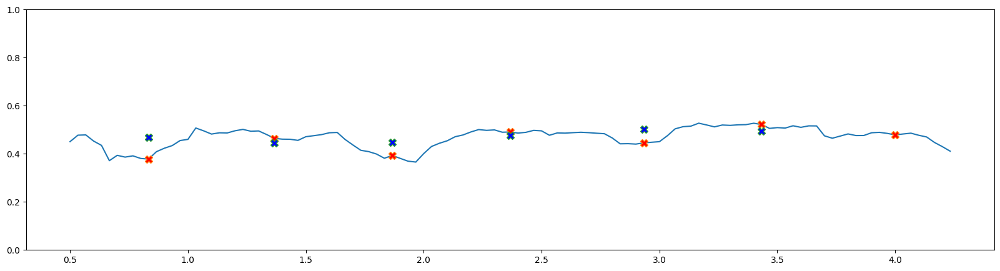

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.369720  0.359382 -0.042970  0.500000 -0.384250  0.000085  0.978904
1    0.352203  0.359048 -0.042968  0.533333  0.167442  0.000187  0.979632
2    0.353352  0.354637 -0.040111  0.566667 -0.028257  0.000380  0.981126
3    0.335357  0.351448 -0.041081  0.600000  0.080109  0.000606  0.982479
4    0.310614  0.353744 -0.033601  0.633333  0.282100  0.001236  0.983887
..        ...       ...       ...       ...       ...       ...       ...
108  0.357840  0.365137 -0.024625  4.100000  0.304899  0.000257  0.939798
109  0.350361  0.367874 -0.018335  4.133333  0.081598  0.000176  0.897397
110  0.362327  0.367915 -0.020073  4.166667 -0.228937  0.000116  0.870345
111  0.322943  0.333162 -0.031437  4.200000 -0.319275  0.000074  0.759966
112  0.305526  0.284715 -0.025526  4.233333  1.015318  0.000047  0.544458

[113 rows x 7 columns]
t1 0.8333333333333334
t1 1.3666666666666667
t1 1.8666666666666667
t1 2.3666666666666667


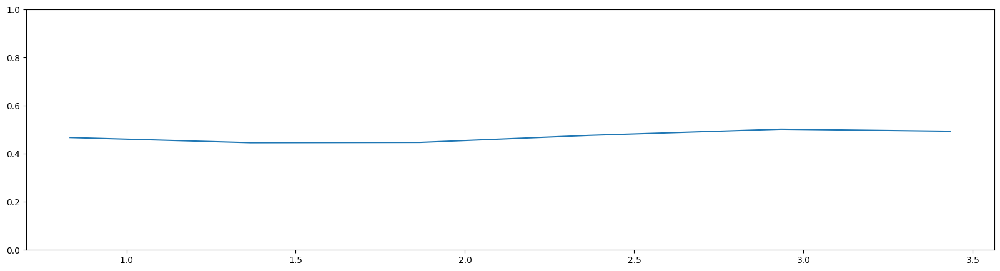

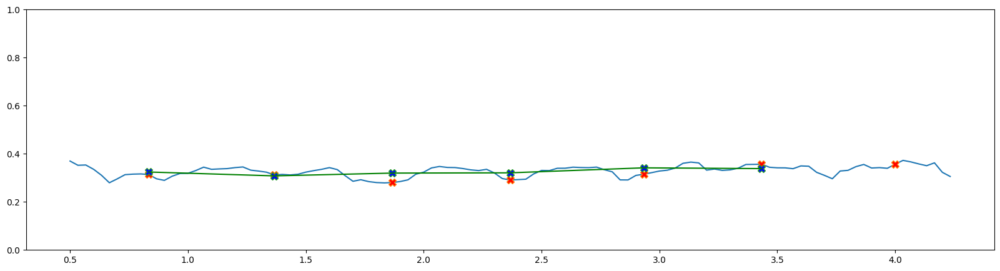

            r         l  leg_ratio         c         t  velocity  \
0    0.750663  0.754106   1.236082 -0.042970  0.500000 -0.384250   
1    0.748533  0.764534   1.213083 -0.042968  0.533333  0.167442   
2    0.751410  0.756889   1.239400 -0.040111  0.566667 -0.028257   
3    0.772320  0.740772   1.105705 -0.041081  0.600000  0.080109   
4    0.787845  0.732953   1.029098 -0.033601  0.633333  0.282100   
..        ...       ...        ...       ...       ...       ...   
108  0.671282  0.692339   0.841070 -0.024625  4.100000  0.304899   
109  0.650115  0.677601   0.823108 -0.018335  4.133333  0.081598   
110  0.619726  0.652899   1.004755 -0.020073  4.166667 -0.228937   
111  0.577397  0.625115   0.943303 -0.031437  4.200000 -0.319275   
112  0.583841  0.653829   0.961955 -0.025526  4.233333  1.015318   

     visi_thigh_r  visi_thigh_l  
0        0.646728      0.974742  
1        0.624833      0.973181  
2        0.595456      0.973850  
3        0.573838      0.975936  
4        0.58

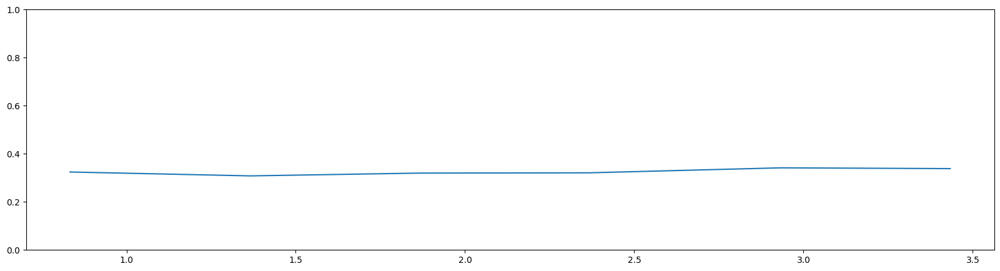

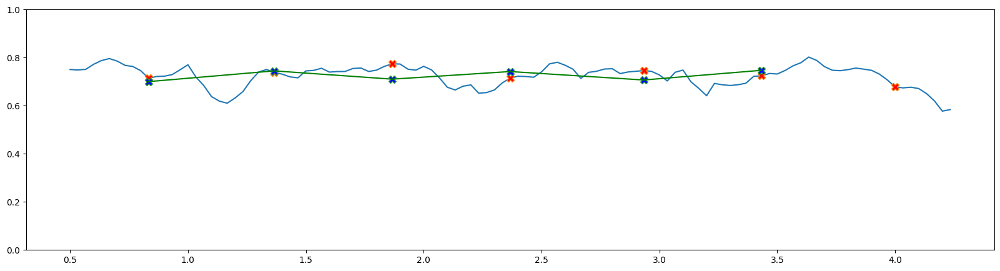

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.741465  0.599851   0.995435 -0.042970  0.500000 -0.384250    0.562609   
1    0.740466  0.610401   0.979071 -0.042968  0.533333  0.167442    0.538676   
2    0.749332  0.604593   0.992761 -0.040111  0.566667 -0.028257    0.505721   
3    0.731895  0.661926   1.042588 -0.041081  0.600000  0.080109    0.476623   
4    0.719894  0.699539   1.074892 -0.033601  0.633333  0.282100    0.491186   
..        ...       ...        ...       ...       ...       ...         ...   
108  0.584255  0.694657   0.969586 -0.024625  4.100000  0.304899    0.708306   
109  0.580772  0.705584   0.959436 -0.018335  4.133333  0.081598    0.690549   
110  0.630247  0.627264   0.949190 -0.020073  4.166667 -0.228937    0.679364   
111  0.554715  0.588056   0.923665 -0.031437  4.200000 -0.319275    0.600944   
112  0.566282  0.588679   0.892957 -0.025526  4.233333  1.015318    0.539514   

     visi_shk_l  
0      0.947530  
1  

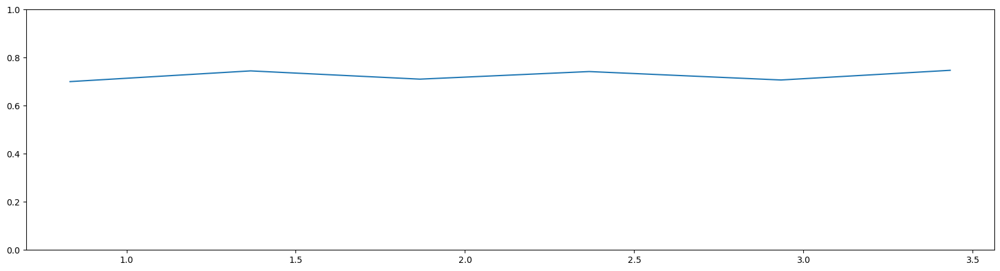

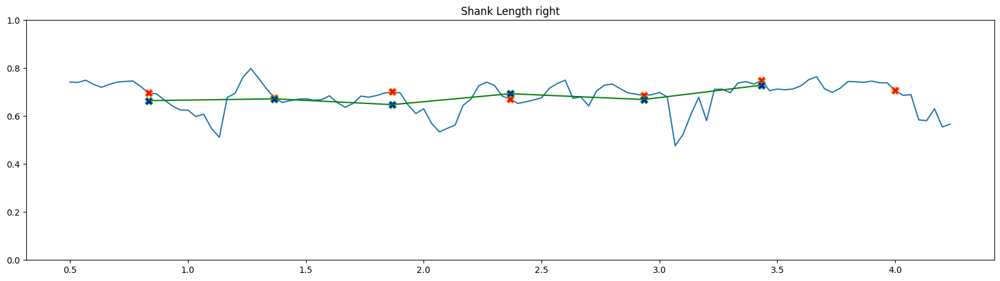

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.258159  0.290749   0.995435 -0.042970  0.500000 -0.384250     0.700672   
1    0.257330  0.327598   0.979071 -0.042968  0.533333  0.167442     0.694348   
2    0.261195  0.321335   0.992761 -0.040111  0.566667 -0.028257     0.685459   
3    0.244267  0.327890   1.042588 -0.041081  0.600000  0.080109     0.666958   
4    0.238357  0.263019   1.074892 -0.033601  0.633333  0.282100     0.684142   
..        ...       ...        ...       ...       ...       ...          ...   
108  0.228110  0.138879   0.969586 -0.024625  4.100000  0.304899     0.800163   
109  0.324385  0.136467   0.959436 -0.018335  4.133333  0.081598     0.790821   
110  0.093963  0.164557   0.949190 -0.020073  4.166667 -0.228937     0.769991   
111  0.263814  0.155708   0.923665 -0.031437  4.200000 -0.319275     0.707713   
112  0.204846  0.186345   0.892957 -0.025526  4.233333  1.015318     0.657671   

     visi_foot_l  
0       

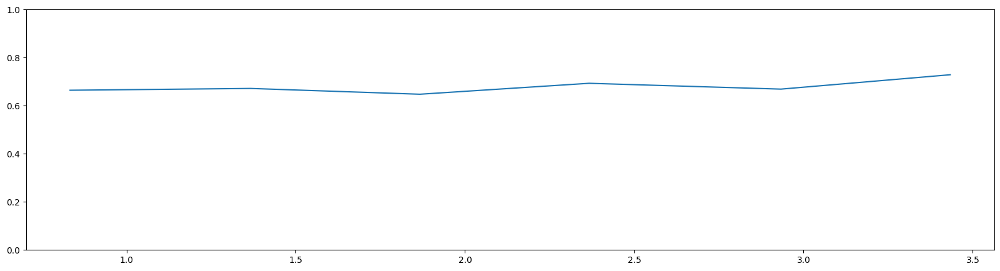

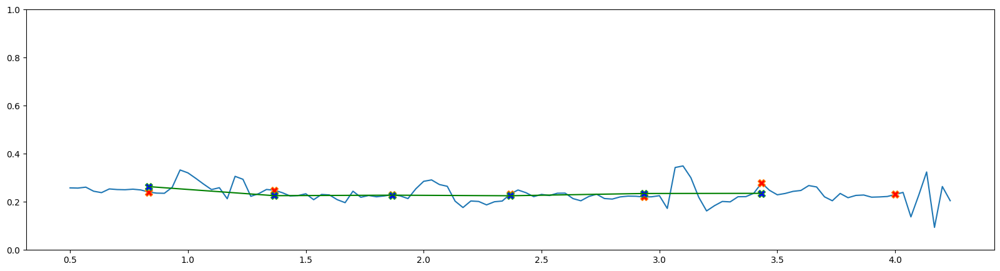

side left charya left 3 (6, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.178402  0.933333 -0.056903  0.951426  0.962818  0.011834  0.090217   
1    0.175589  0.966667 -0.041687  0.946216  0.953680  0.008047  0.092258   
2    0.173956  1.000000 -0.042266  0.930539  0.950113  0.019967  0.093226   
3    0.174924  1.033333 -0.041298  0.919888  0.942803  0.023226  0.092854   
4    0.176765  1.066667 -0.040773  0.913827  0.935832  0.022315  0.092717   
..        ...       ...       ...       ...       ...       ...       ...   
128  0.169109  5.200000 -0.021246 -0.029530 -0.006617  0.023829  0.095922   
129  0.167373  5.233333 -0.010213 -0.039452 -0.023797  0.017285  0.095586   
130  0.165062  5.266667 -0.007267 -0.065030 -0.038611  0.027038  0.086271   
131  0.161585  5.300000 -0.006559 -0.061455 -0.038819  0.022908  0.081136   
132  0.159301  5.333333 -0.029878 -0.069348 -0.033668  0.036260  0.082118   

          sln       aln  
0    0.066335  0.

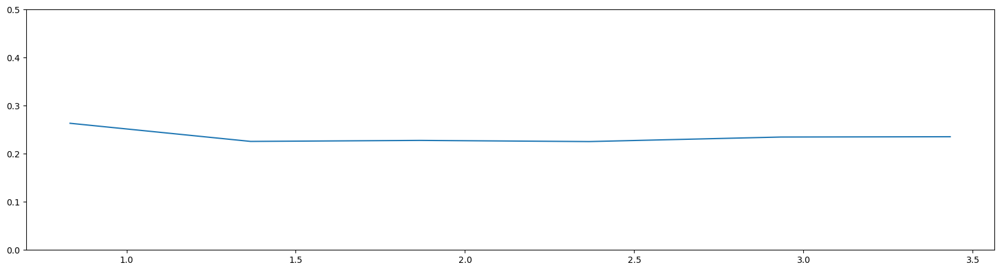

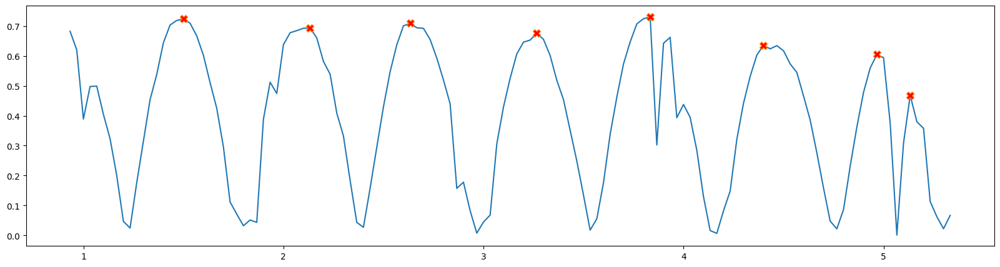

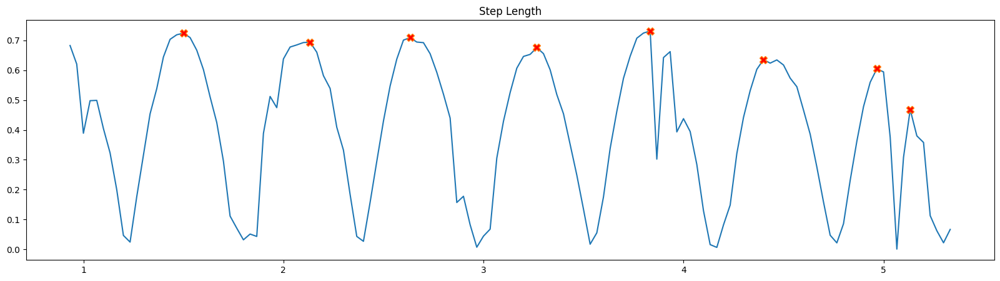

[ 17  36  51  70  87 104 121 126]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.293250  1.272478 -0.056903   0.995486  0.933333  1.071272    0.881678   
1    1.321810  1.306296 -0.041687   0.991536  0.966667  0.064876    0.851901   
2    1.300361  1.260978 -0.042266   1.011989  1.000000 -0.013465    0.855932   
3    1.286835  1.230213 -0.041298   0.988615  1.033333  0.039723    0.863910   
4    1.277154  1.200586 -0.040773   0.999776  1.066667 -0.000090    0.867811   
..        ...       ...       ...        ...       ...       ...         ...   
128  0.998938  1.253211 -0.021246   0.680259  5.200000  0.354694    0.359900   
129  1.077215  1.201409 -0.010213   0.763220  5.233333  0.213770    0.310472   
130  1.123004  1.062666 -0.007267   0.923075  5.266667  0.046786    0.267038   
131  1.172427  1.178667 -0.006559   0.907087  5.300000 -0.111909    0.239204   
132  1.240677  1.351930 -0.029878   0.883502  5.333333 -1.634173    0.243312   

     

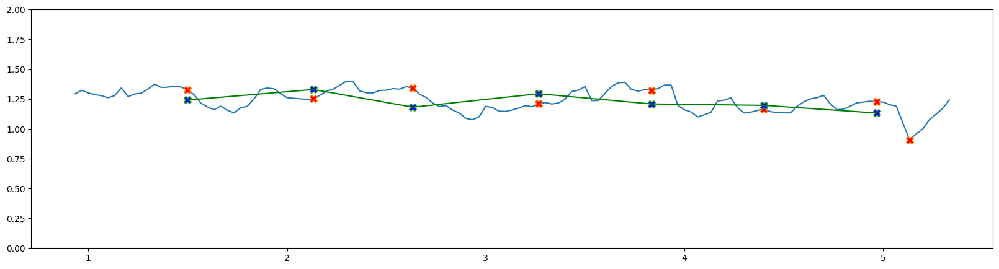

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.505691     0.586667 -0.056903  0.933333  1.071272      0.041446   
1       0.525420     0.597968 -0.041687  0.966667  0.064876      0.044001   
2       0.535918     0.590854 -0.042266  1.000000 -0.013465      0.043841   
3       0.530826     0.570932 -0.041298  1.033333  0.039723      0.044839   
4       0.524520     0.557974 -0.040773  1.066667 -0.000090      0.044801   
..           ...          ...       ...       ...       ...           ...   
128     0.567217     0.509257 -0.021246  5.200000  0.354694      0.111086   
129     0.571095     0.492206 -0.010213  5.233333  0.213770      0.100063   
130     0.522661     0.495234 -0.007267  5.266667  0.046786      0.088254   
131     0.502129     0.485428 -0.006559  5.300000 -0.111909      0.079934   
132     0.515489     0.492637 -0.029878  5.333333 -1.634173      0.073768   

     visi_l_urm_l  
0        0.999032  
1        0.998998  
2        0.9989

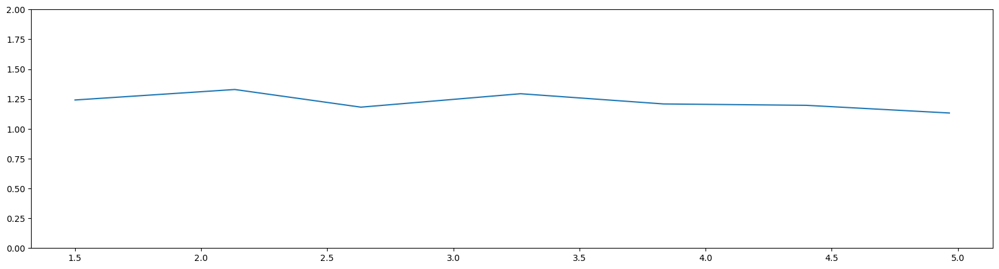

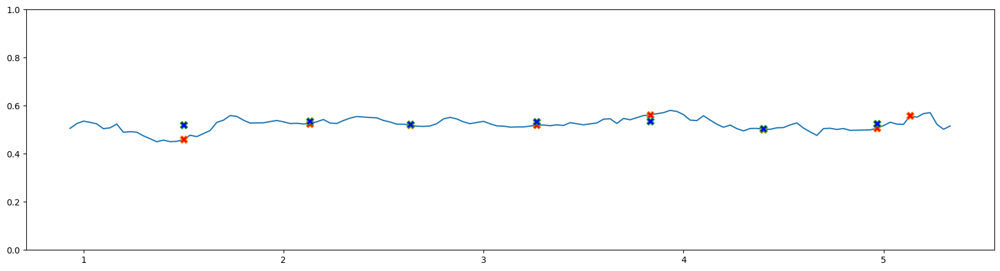

            r         l         c         t  velocity  visi_larm_r  \
0    0.357383  0.471617 -0.056903  0.933333  1.071272     0.005598   
1    0.377699  0.488321 -0.041687  0.966667  0.064876     0.005925   
2    0.387867  0.493237 -0.042266  1.000000 -0.013465     0.005887   
3    0.392638  0.494181 -0.041298  1.033333  0.039723     0.006203   
4    0.412487  0.498837 -0.040773  1.066667 -0.000090     0.006130   
..        ...       ...       ...       ...       ...          ...   
128  0.395332  0.440634 -0.021246  5.200000  0.354694     0.014818   
129  0.315066  0.400380 -0.010213  5.233333  0.213770     0.012179   
130  0.027050  0.345286 -0.007267  5.266667  0.046786     0.009994   
131  0.137684  0.386527 -0.006559  5.300000 -0.111909     0.008236   
132  0.200820  0.421328 -0.029878  5.333333 -1.634173     0.007001   

     visi_larm_l  
0       0.997259  
1       0.996981  
2       0.996734  
3       0.996622  
4       0.996434  
..           ...  
128     0.761395  
129    

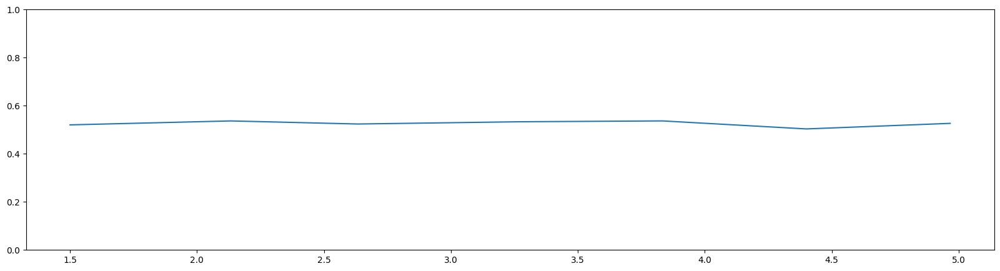

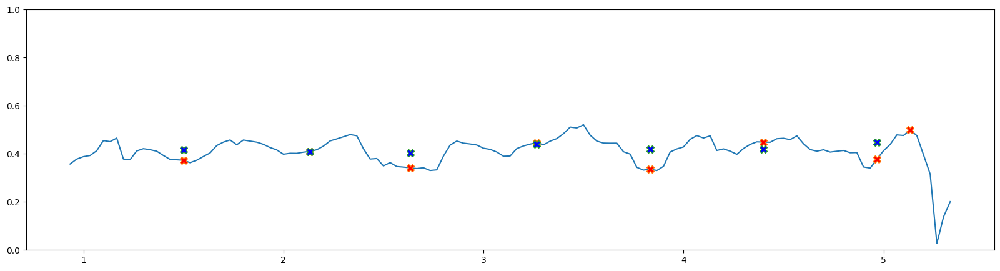

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.273934  0.327666 -0.056903  0.933333  1.071272  0.000005  0.987952
1    0.309515  0.318346 -0.041687  0.966667  0.064876  0.000005  0.986901
2    0.290889  0.315939 -0.042266  1.000000 -0.013465  0.000005  0.986015
3    0.291576  0.316173 -0.041298  1.033333  0.039723  0.000006  0.985704
4    0.311024  0.319689 -0.040773  1.066667 -0.000090  0.000006  0.984970
..        ...       ...       ...       ...       ...       ...       ...
128  0.251366  0.264177 -0.021246  5.200000  0.354694  0.000027  0.466165
129  0.217378  0.231067 -0.010213  5.233333  0.213770  0.000016  0.345666
130  0.121700  0.201109 -0.007267  5.266667  0.046786  0.000010  0.275705
131  0.135888  0.219645 -0.006559  5.300000 -0.111909  0.000006  0.213656
132  0.179388  0.238714 -0.029878  5.333333 -1.634173  0.000004  0.201873

[133 rows x 7 columns]
t1 1.5
t1 2.1333333333333333
t1 2.6333333333333333
t1 3.2666666666666666
t1 3.8333333333

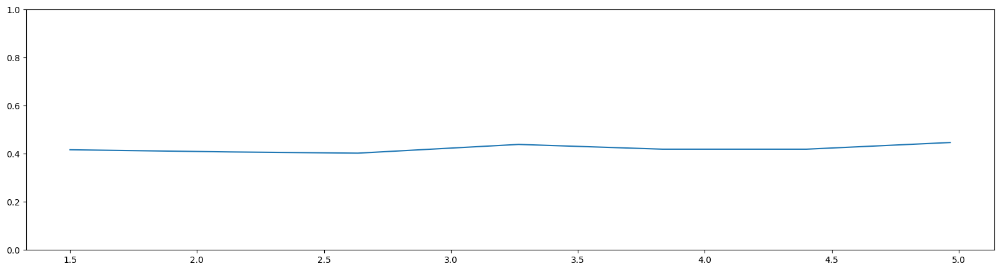

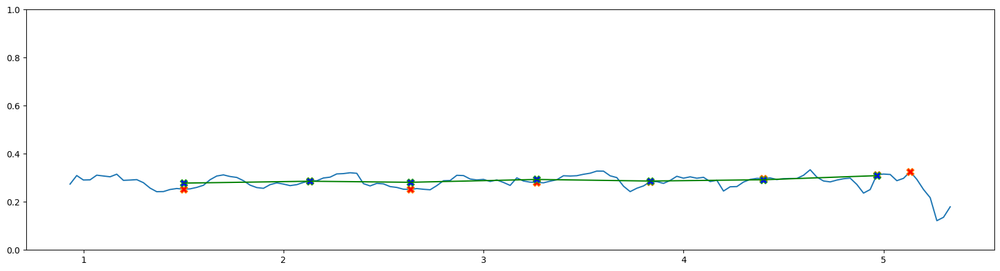

            r         l  leg_ratio         c         t  velocity  \
0    0.622384  0.625206   1.036452 -0.056903  0.933333  1.071272   
1    0.648472  0.654008   1.032270 -0.041687  0.966667  0.064876   
2    0.654414  0.646661   1.051488 -0.042266  1.000000 -0.013465   
3    0.644807  0.652233   1.110814 -0.041298  1.033333  0.039723   
4    0.646396  0.646540   1.138457 -0.040773  1.066667 -0.000090   
..        ...       ...        ...       ...       ...       ...   
128  0.461020  0.677712   0.934699 -0.021246  5.200000  0.354694   
129  0.522310  0.684351   1.073197 -0.010213  5.233333  0.213770   
130  0.659311  0.714255   1.330879 -0.007267  5.266667  0.046786   
131  0.642631  0.708456   1.126719 -0.006559  5.300000 -0.111909   
132  0.663079  0.750512   0.960394 -0.029878  5.333333 -1.634173   

     visi_thigh_r  visi_thigh_l  
0        0.950489      0.994766  
1        0.936891      0.993015  
2        0.938546      0.993268  
3        0.942027      0.993672  
4        0.94

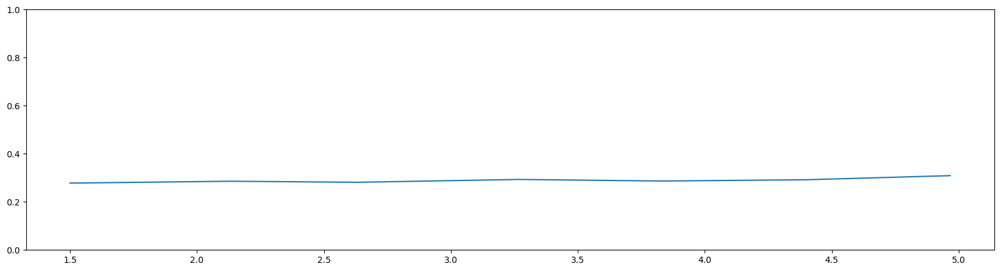

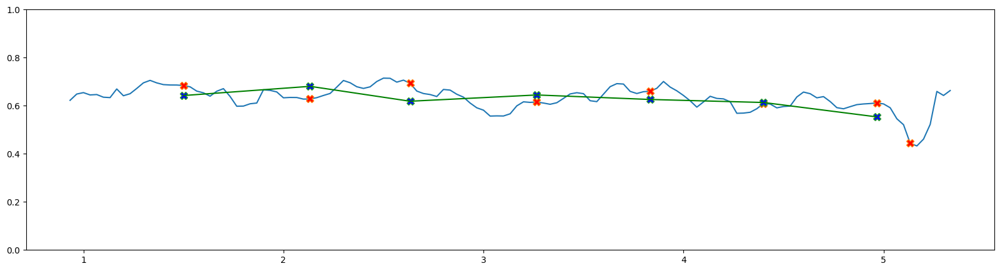

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.670866  0.647272   0.995486 -0.056903  0.933333  1.071272    0.927605   
1    0.673338  0.652288   0.991536 -0.041687  0.966667  0.064876    0.909285   
2    0.645947  0.614317   1.011989 -0.042266  1.000000 -0.013465    0.911976   
3    0.642028  0.577980   0.988615 -0.041298  1.033333  0.039723    0.917076   
4    0.630758  0.554046   0.999776 -0.040773  1.066667 -0.000090    0.919725   
..        ...       ...        ...       ...       ...       ...         ...   
128  0.537918  0.575499   0.680259 -0.021246  5.200000  0.354694    0.523177   
129  0.554904  0.517058   0.763220 -0.010213  5.233333  0.213770    0.475458   
130  0.463692  0.348411   0.923075 -0.007267  5.266667  0.046786    0.435982   
131  0.529796  0.470211   0.907087 -0.006559  5.300000 -0.111909    0.404999   
132  0.577598  0.601418   0.883502 -0.029878  5.333333 -1.634173    0.406245   

     visi_shk_l  
0      0.989357  
1  

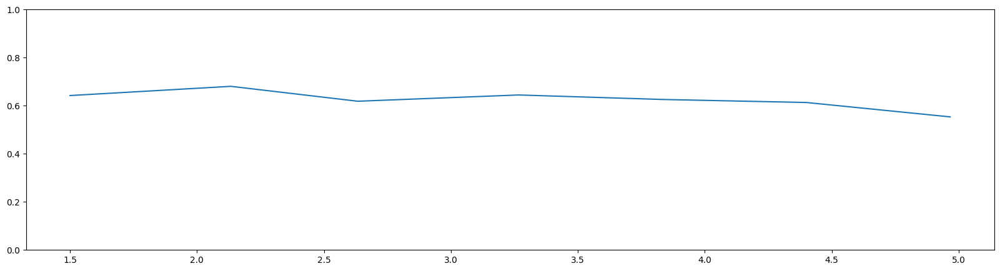

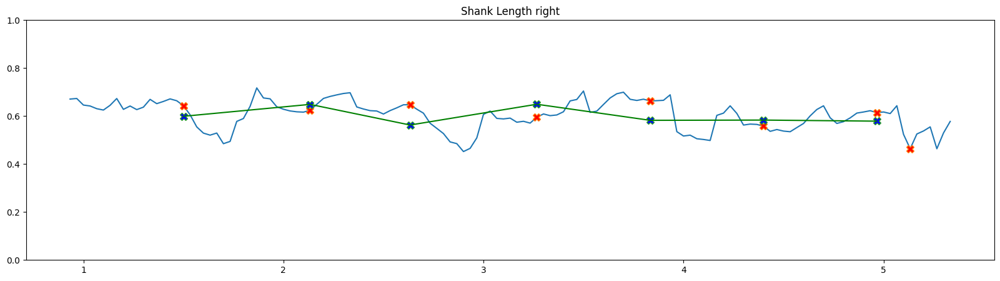

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.239394  0.253573   0.995486 -0.056903  0.933333  1.071272     0.896233   
1    0.106611  0.233258   0.991536 -0.041687  0.966667  0.064876     0.892390   
2    0.232691  0.085371   1.011989 -0.042266  1.000000 -0.013465     0.895301   
3    0.237124  0.169588   0.988615 -0.041298  1.033333  0.039723     0.900535   
4    0.228855  0.262649   0.999776 -0.040773  1.066667 -0.000090     0.905005   
..        ...       ...        ...       ...       ...       ...          ...   
128  0.193376  0.294578   0.680259 -0.021246  5.200000  0.354694     0.581717   
129  0.199215  0.246009   0.763220 -0.010213  5.233333  0.213770     0.539974   
130  0.230859  0.180244   0.923075 -0.007267  5.266667  0.046786     0.513346   
131  0.247719  0.141142   0.907087 -0.006559  5.300000 -0.111909     0.479862   
132  0.278743  0.157809   0.883502 -0.029878  5.333333 -1.634173     0.464127   

     visi_foot_l  
0       

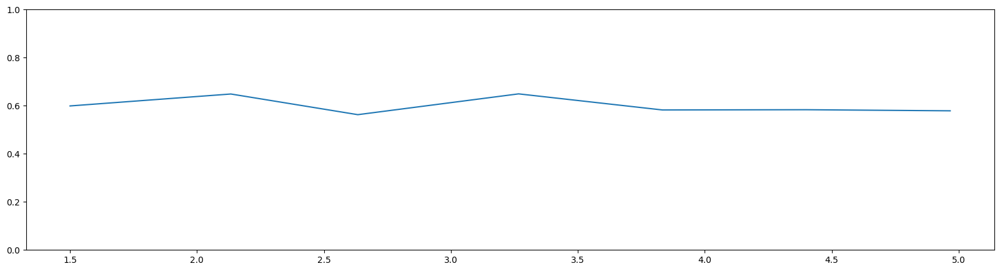

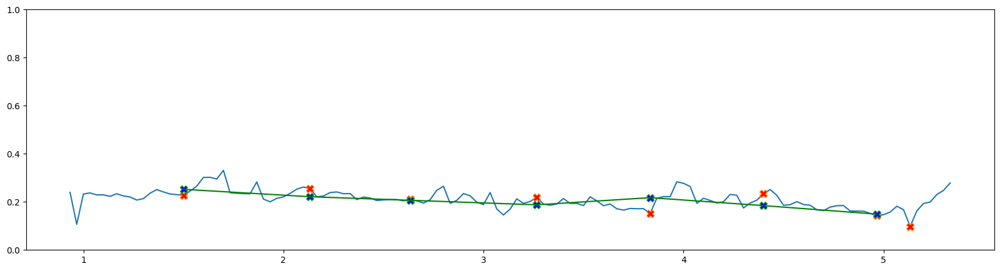

side left vibhu left 3 (7, 29)
          ubh         t    center     r_sdr     l_sdr        sl        al  \
0    0.171481  0.600000 -0.043280  0.946760  0.973625  0.032572  0.089898   
1    0.174119  0.633333 -0.038042  0.940387  0.968049  0.033234  0.090779   
2    0.172776  0.666667 -0.024991  0.927720  0.961625  0.038972  0.090584   
3    0.171474  0.700000 -0.021701  0.921286  0.952277  0.036337  0.091698   
4    0.172992  0.733333 -0.025148  0.913774  0.943612  0.034394  0.093707   
..        ...       ...       ...       ...       ...       ...       ...   
111  0.185958  4.300000 -0.010468  0.048822  0.008516  0.041742  0.081970   
112  0.185702  4.333333 -0.010305  0.042803  0.004304  0.040274  0.082161   
113  0.176710  4.366667 -0.012268  0.033281 -0.009281  0.042824  0.083060   
114  0.175333  4.400000 -0.014453  0.025676 -0.016181  0.041865  0.082087   
115  0.178633  4.433333 -0.016398  0.022327 -0.027552  0.049895  0.080570   

          sln       aln  
0    0.189947  0.5

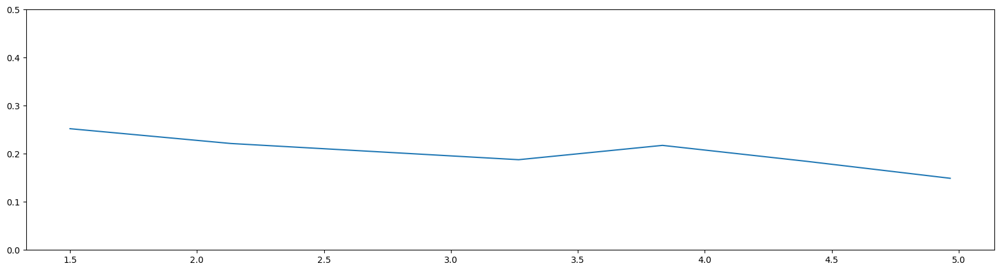

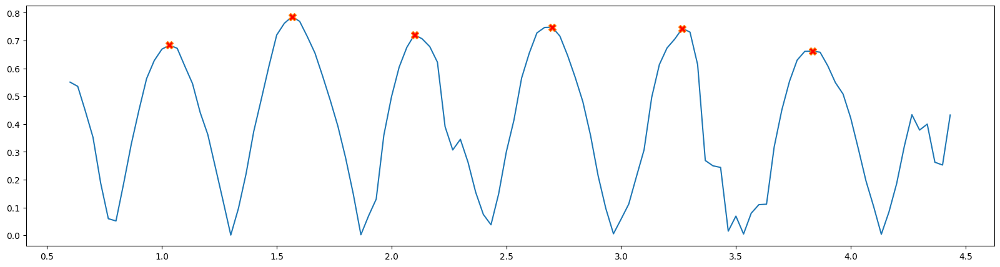

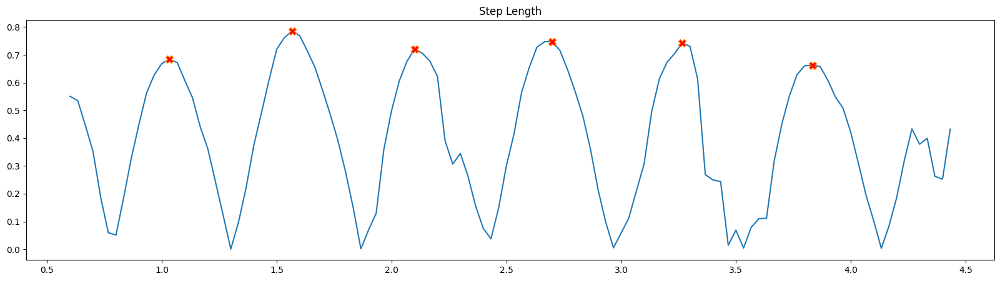

[13 29 45 63 80 97]
        lbl_r     lbl_l    center  leg_ratio         t  velocity  visi_lbl_r  \
0    1.477555  1.242334 -0.043280   0.993260  0.600000 -0.322012    0.130954   
1    1.435306  1.331110 -0.038042   0.966899  0.633333  0.424189    0.149835   
2    1.450817  1.328122 -0.024991   0.964300  0.666667  0.271282    0.172894   
3    1.478224  1.341769 -0.021701   0.974675  0.700000 -0.046944    0.178029   
4    1.463576  1.308164 -0.025148   1.030052  0.733333 -0.110983    0.169407   
..        ...       ...       ...        ...       ...       ...         ...   
111  1.280548  0.657270 -0.010468   2.510462  4.300000  0.181516    0.674271   
112  1.283425  0.636370 -0.010305   3.218506  4.333333 -0.082580    0.659492   
113  1.341683  0.795877 -0.012268   2.294151  4.366667 -0.048065    0.642136   
114  1.342854  0.789515 -0.014453   1.324533  4.400000 -0.081307    0.628239   
115  1.302753  0.767254 -0.016398   1.915618  4.433333  0.001548    0.628804   

     visi_lbl_l  
0

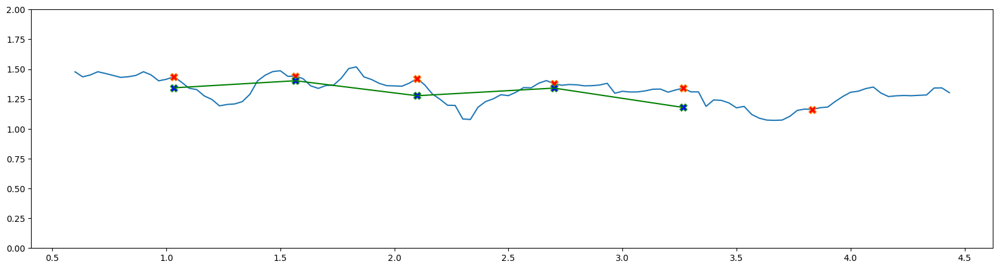

     upper_arm_r  upper_arm_l         c         t  velocity  visi_l_urm_r  \
0       0.524245     0.603943 -0.043280  0.600000 -0.322012      0.139917   
1       0.521362     0.593554 -0.038042  0.633333  0.424189      0.140403   
2       0.524286     0.586778 -0.024991  0.666667  0.271282      0.140959   
3       0.534761     0.585619 -0.021701  0.700000 -0.046944      0.139832   
4       0.541684     0.583204 -0.025148  0.733333 -0.110983      0.142654   
..           ...          ...       ...       ...       ...           ...   
111     0.440801     0.469004 -0.010468  4.300000  0.181516      0.117005   
112     0.442436     0.431379 -0.010305  4.333333 -0.082580      0.108463   
113     0.470036     0.450740 -0.012268  4.366667 -0.048065      0.100339   
114     0.468181     0.422720 -0.014453  4.400000 -0.081307      0.091936   
115     0.451037     0.293800 -0.016398  4.433333  0.001548      0.084602   

     visi_l_urm_l  
0        0.997992  
1        0.998060  
2        0.9981

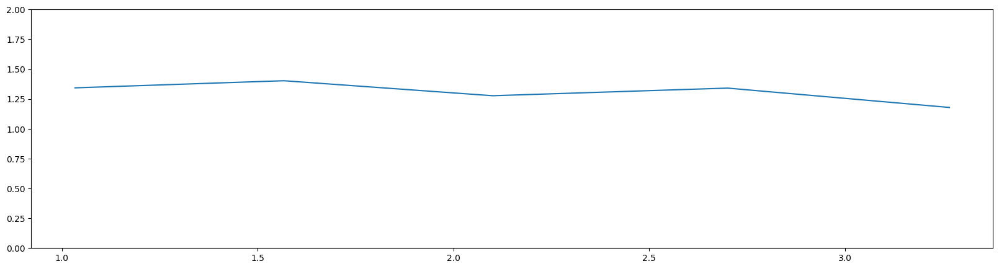

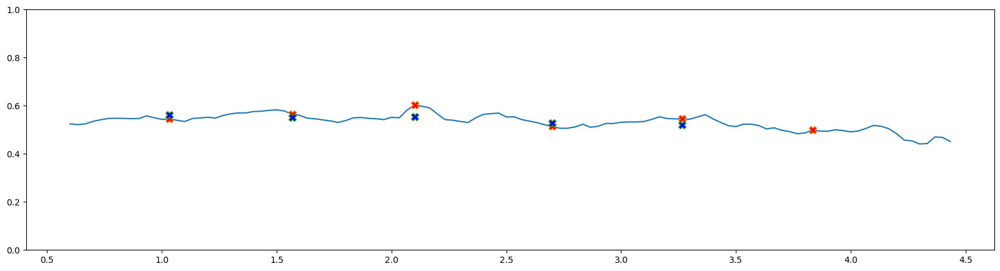

            r         l         c         t  velocity  visi_larm_r  \
0    0.459292  0.570309 -0.043280  0.600000 -0.322012     0.033313   
1    0.491145  0.556585 -0.038042  0.633333  0.424189     0.035469   
2    0.496687  0.563782 -0.024991  0.666667  0.271282     0.037644   
3    0.521110  0.578811 -0.021701  0.700000 -0.046944     0.038284   
4    0.515105  0.572454 -0.025148  0.733333 -0.110983     0.040580   
..        ...       ...       ...       ...       ...          ...   
111  0.279541  0.331534 -0.010468  4.300000  0.181516     0.011684   
112  0.258053  0.183195 -0.010305  4.333333 -0.082580     0.009836   
113  0.240284  0.220987 -0.012268  4.366667 -0.048065     0.008295   
114  0.212189  0.217783 -0.014453  4.400000 -0.081307     0.006909   
115  0.152651  0.066833 -0.016398  4.433333  0.001548     0.005757   

     visi_larm_l  
0       0.989519  
1       0.990122  
2       0.990848  
3       0.991331  
4       0.991790  
..           ...  
111     0.688912  
112    

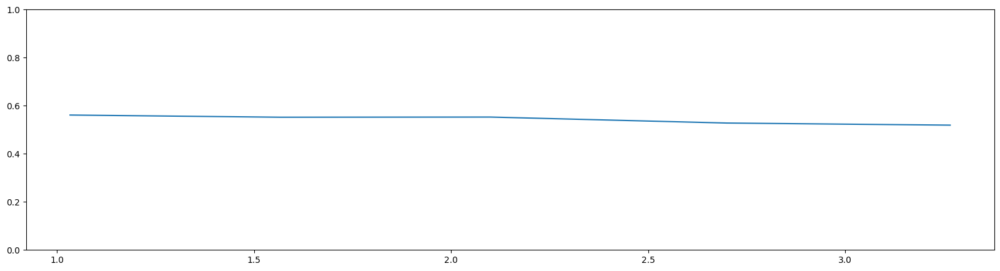

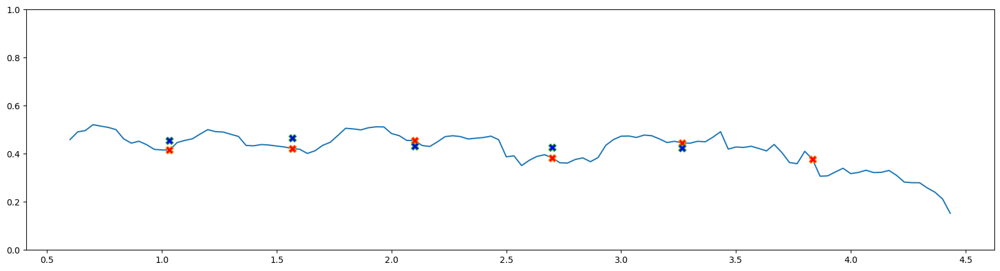

            r         l         c         t  velocity  visi_l_r  visi_l_l
0    0.345440  0.368328 -0.043280  0.600000 -0.322012  0.000244  0.957327
1    0.330723  0.364285 -0.038042  0.633333  0.424189  0.000295  0.959831
2    0.333897  0.365029 -0.024991  0.666667  0.271282  0.000352  0.962786
3    0.340325  0.362483 -0.021701  0.700000 -0.046944  0.000375  0.964813
4    0.336241  0.357224 -0.025148  0.733333 -0.110983  0.000438  0.966693
..        ...       ...       ...       ...       ...       ...       ...
111  0.217392  0.229824 -0.010468  4.300000  0.181516  0.000013  0.352954
112  0.181957  0.144321 -0.010305  4.333333 -0.082580  0.000008  0.231501
113  0.205770  0.135439 -0.012268  4.366667 -0.048065  0.000005  0.160361
114  0.167410  0.138404 -0.014453  4.400000 -0.081307  0.000003  0.118171
115  0.155433  0.105790 -0.016398  4.433333  0.001548  0.000002  0.093339

[116 rows x 7 columns]
t1 1.0333333333333334
t1 1.5666666666666667
t1 2.1
t1 2.7
t1 3.2666666666666666
results 

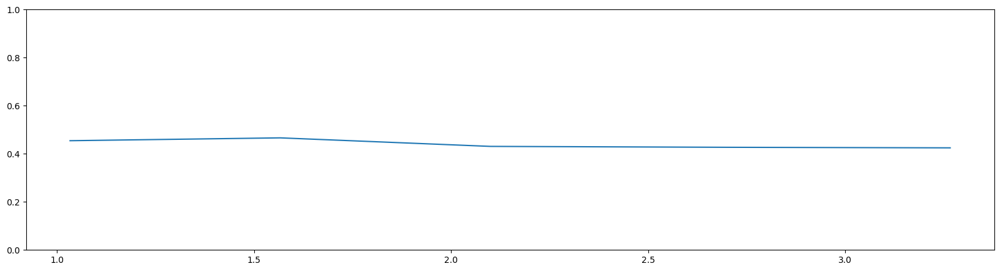

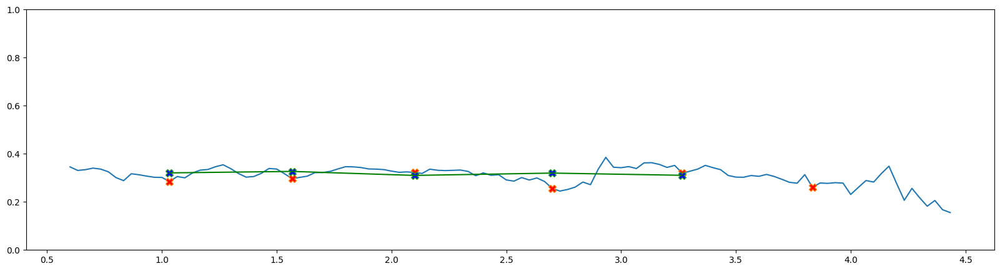

            r         l  leg_ratio         c         t  velocity  \
0    0.743395  0.748440   1.486472 -0.043280  0.600000 -0.322012   
1    0.706972  0.731174   1.214021 -0.038042  0.633333  0.424189   
2    0.711447  0.737786   1.252455 -0.024991  0.666667  0.271282   
3    0.730110  0.749081   1.262237 -0.021701  0.700000 -0.046944   
4    0.718952  0.697976   1.220320 -0.025148  0.733333 -0.110983   
..        ...       ...        ...       ...       ...       ...   
111  0.613205  0.244260   1.615803 -0.010468  4.300000  0.181516   
112  0.612631  0.190347   1.503944 -0.010305  4.333333 -0.082580   
113  0.634394  0.276527   1.361873 -0.012268  4.366667 -0.048065   
114  0.630681  0.476154   2.272687 -0.014453  4.400000 -0.081307   
115  0.597405  0.311860   1.548874 -0.016398  4.433333  0.001548   

     visi_thigh_r  visi_thigh_l  
0        0.444728      0.949417  
1        0.467853      0.952961  
2        0.494277      0.956077  
3        0.497476      0.957598  
4        0.48

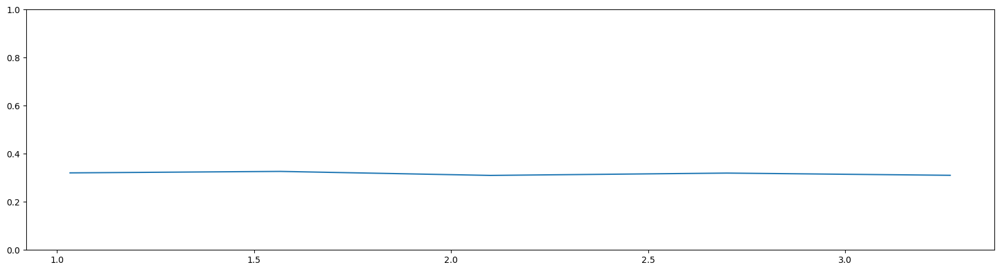

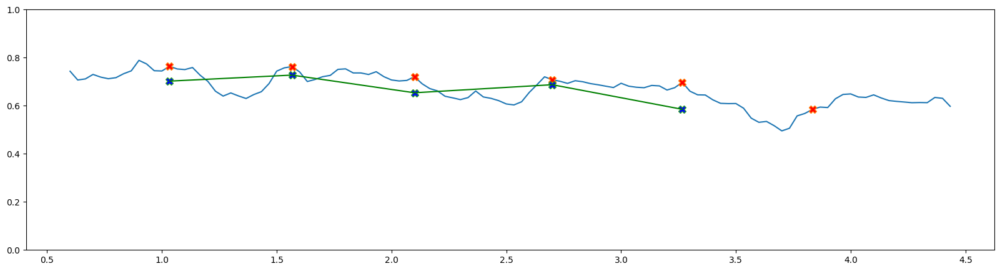

            r         l  leg_ratio         c         t  velocity  visi_shk_r  \
0    0.734160  0.493894   0.993260 -0.043280  0.600000 -0.322012    0.294457   
1    0.728335  0.599936   0.966899 -0.038042  0.633333  0.424189    0.320260   
2    0.739370  0.590336   0.964300 -0.024991  0.666667  0.271282    0.349793   
3    0.748114  0.592689   0.974675 -0.021701  0.700000 -0.046944    0.357864   
4    0.744624  0.610188   1.030052 -0.025148  0.733333 -0.110983    0.349750   
..        ...       ...        ...       ...       ...       ...         ...   
111  0.667342  0.413009   2.510462 -0.010468  4.300000  0.181516    0.786227   
112  0.670794  0.446023   3.218506 -0.010305  4.333333 -0.082580    0.773274   
113  0.707289  0.519350   2.294151 -0.012268  4.366667 -0.048065    0.760997   
114  0.712173  0.313362   1.324533 -0.014453  4.400000 -0.081307    0.750365   
115  0.705348  0.455394   1.915618 -0.016398  4.433333  0.001548    0.750274   

     visi_shk_l  
0      0.856802  
1  

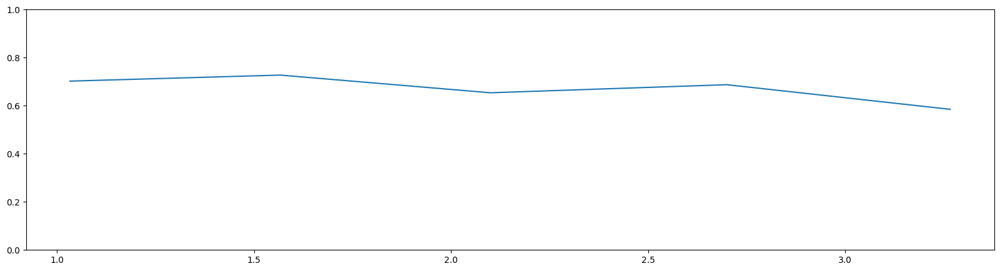

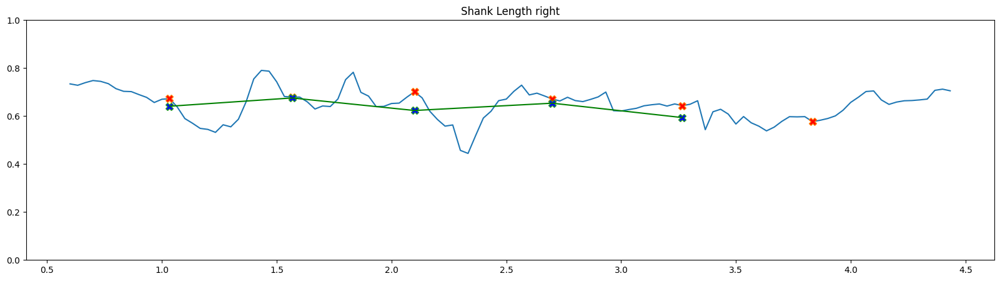

       foot_r    foot_l  leg_ratio         c         t  velocity  visi_foot_r  \
0    0.242702  0.284358   0.993260 -0.043280  0.600000 -0.322012     0.353940   
1    0.238475  0.308829   0.966899 -0.038042  0.633333  0.424189     0.385146   
2    0.241620  0.347246   0.964300 -0.024991  0.666667  0.271282     0.418972   
3    0.246869  0.373797   0.974675 -0.021701  0.700000 -0.046944     0.444517   
4    0.243999  0.307006   1.030052 -0.025148  0.733333 -0.110983     0.462957   
..        ...       ...        ...       ...       ...       ...          ...   
111  0.138491  0.190410   2.510462 -0.010468  4.300000  0.181516     0.780834   
112  0.152521  0.181344   3.218506 -0.010305  4.333333 -0.082580     0.752173   
113  0.161365  0.108983   2.294151 -0.012268  4.366667 -0.048065     0.738669   
114  0.172157  0.118277   1.324533 -0.014453  4.400000 -0.081307     0.725265   
115  0.165184  0.145914   1.915618 -0.016398  4.433333  0.001548     0.715971   

     visi_foot_l  
0       

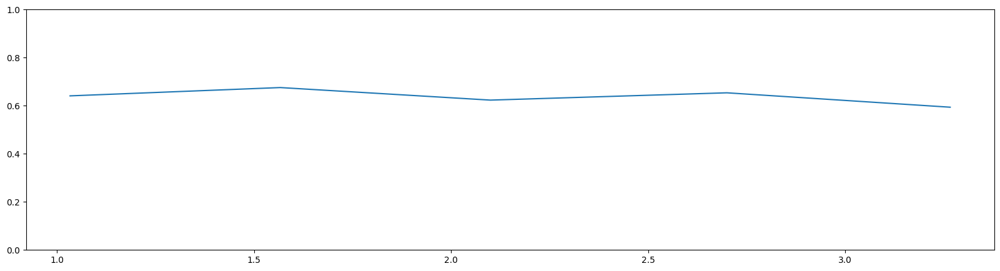

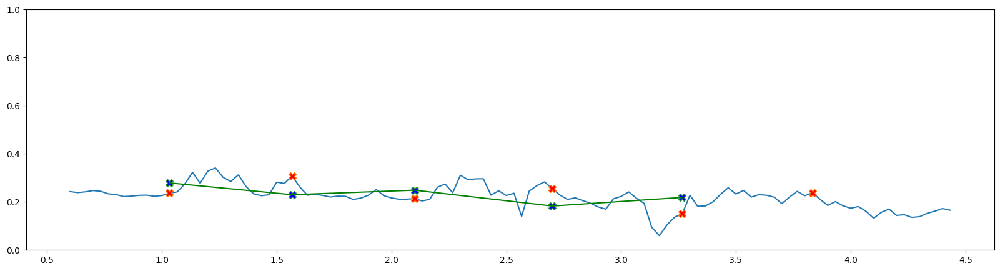

side left ishin left 3 (5, 29)
0.4


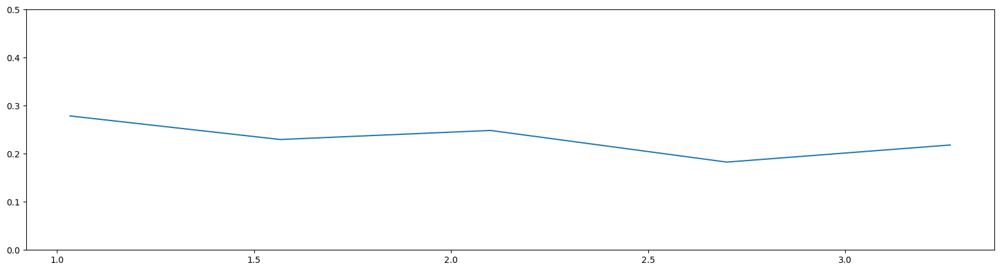

In [132]:
for idx in range(len(name_list)):
    name=name_list[idx]
    f_file = open('new_key_arrays_all/new_test_key_arrays/{}/{}/key_array_{}_{}_{}.pkl'.format(cam,direction,name,direction,vid_no), 'rb')
    
    key_array = pickle.load(f_file)
    f_file.close()
    
    H=[]
    for i in range(len(key_array)):
        #time
        t=key_array[i][12][3]
    
        #upper body height
        x1,x2 = (((key_array[i][11][0]+key_array[i][12][0])/2),((key_array[i][23][0]+key_array[i][24][0])/2))
        y1,y2 = (((key_array[i][11][1]+key_array[i][12][1])/2),((key_array[i][23][1]+key_array[i][24][1])/2))
        #z1,z2 = (((key_array[i][11][2]+key_array[i][12][2])/2),((key_array[i][23][2]+key_array[i][24][2])/2))
        ubh = math.sqrt(((x1-x2)**2)+((y1-y2)**2))
        #ubh = math.sqrt(((x1-x2)**2)+((y1-y2)**2)+((z1-z2)**2))
    
        #arm length
        x_al1,x_al2 = (key_array[i][14][0],key_array[i][12][0])
        y_al1,y_al2 = (key_array[i][14][1],key_array[i][12][1])
        #z_al1,z_al2 = (key_array[i][14][2],key_array[i][12][2])
        al=math.sqrt(((x_al1-x_al2)**2)+((y_al1-y_al2)**2))
        #al=math.sqrt(((x_al1-x_al2)**2)+((y_al1-y_al2)**2)+((z_al1-z_al2)**2))
    
        #shoulder length
        x_sl1,x_sl2 = (key_array[i][11][0],key_array[i][12][0])
        y_sl1,y_sl2 = (key_array[i][11][1],key_array[i][12][1])
        #z_sl1,z_sl2 = (key_array[i][11][2],key_array[i][12][2])
        sl=math.sqrt(((x_sl1-x_sl2)**2)+((y_sl1-y_sl2)**2))
        #sl=math.sqrt(((x_sl1-x_sl2)**2)+((y_sl1-y_sl2)**2)+((z_sl1-z_sl2)**2))
    
        #center of upper body in depth
        center=(key_array[i][11][2]+key_array[i][12][2]+key_array[i][23][2]+key_array[i][24][2])/4
    
        #right and left shoulders
        right=key_array[i][12][0]
        left=key_array[i][11][0]
    
        H.append([ubh])
        H[i].append(t)
        H[i].append(center)
        H[i].append(right)
        H[i].append(left)
        H[i].append(sl)
        H[i].append(al)
        H[i].append(sl/ubh)
        H[i].append(al/ubh)
   
    
    H_array = np.array(H)
    #print(H_array)

    df = pd.DataFrame(H_array,columns=['ubh','t','center',
                                   'r_sdr','l_sdr','sl','al','sln','aln'])
    print(df)
    
    PARA=[]
    S_L=[]

    count=0
    for i in range(len(key_array)):
        t=key_array[i][28][3]
        stl=step_length(key_array[i][11][0],key_array[i][12][0],key_array[i][23][0],key_array[i][24][0],key_array[i][11][1],key_array[i][12][1],key_array[i][23][1],key_array[i][24][1],key_array[i][27][0],key_array[i][28][0])
        count = count +1
        right = key_array[i][12][2]
        left = key_array[i][11][2]

    
        PARA.append([t])
        PARA[i].append(count)
        PARA[i].append(stl)
        PARA[i].append(right)
        PARA[i].append(left)
    
    parameters = np.array(PARA)
    df_para = pd.DataFrame(parameters,columns=['t','count','step_length','z_right','z_left'])
    print(df_para)
    
    p=0.4
    stl_peaks=get_peaks(df_para,df_para.step_length,p)
    
    Time_to_index_ratio=(stl_peaks[1]-stl_peaks[0])/(df.t[stl_peaks[1]]-df.t[stl_peaks[0]])
    df_time=time_diff(stl_peaks,df)
    stl_peaks_rd=remove_distinct_peaks(df_time,df,Time_to_index_ratio,df_para.step_length,p,0.2)
    peaks=stl_peaks_rd
    
    ##Lower Body length
    array =[]
    for i in range(len(key_array)):
        t=key_array[i][28][3]
        #center of upper body in depth
        center=(key_array[i][11][2]+key_array[i][12][2]+key_array[i][23][2]+key_array[i][24][2])/4
        c=center
        array.append([c])
        array[i].append(t)
    array = np.array(array)
    df_c_t = pd.DataFrame(array,columns=['c','t'])
    #print(df_c_t)

    #df_c_t.plot(x ='t', y='c', kind = 'line',figsize=(20,5))
    plt.show()

    from scipy.interpolate import UnivariateSpline

    spl = UnivariateSpline(df_c_t.t, df_c_t.c, k=4, s=0)
    diffspl = spl.derivative()

    lb=[]
    for i in range(len(key_array)):
        #print(i)
        t=key_array[i][11][3] 
        #r=thigh_r(i)+shank_r(i)
        #l=thigh_l(i)+shank_l(i)
        
        r=(thigh_r(i)[0]+shank_r(i)[0])/ubl(i)
        r_visi=thigh_r(i)[1]*shank_r(i)[1]
        
        l=(thigh_l(i)[0]+shank_l(i)[0])/ubl(i)
        l_visi=thigh_l(i)[1]*shank_l(i)[1]
        
        leg_ratio=thigh_r(i)[0]/thigh_l(i)[0]
        #c= center(i)
        #center of upper body in depth
        center=(key_array[i][11][2]+key_array[i][12][2]+key_array[i][23][2]+key_array[i][24][2])/4
        c=center
        lb.append([r])
        lb[i].append(l)
        lb[i].append(c)
        lb[i].append(leg_ratio)
        lb[i].append(t)
        lb[i].append(diffspl(t))
        lb[i].append(r_visi)
        lb[i].append(l_visi)
        
    ratio_ub_lb=np.array(lb)
    df_lb = pd.DataFrame(ratio_ub_lb,columns=['lbl_r','lbl_l','center','leg_ratio','t','velocity','visi_lbl_r','visi_lbl_l'])
    print(df_lb)
    
    lbl_r_avg,time_lbl_r_avg=calculate_averages(stl_peaks_rd,df_lb.lbl_r)
    lbl_r_avg_visi=calculate_averages_visi(stl_peaks_rd,df_lb.visi_lbl_r)
    lbl_r_avg=[lbl_r_avg,time_lbl_r_avg]
    
    lbl_l_avg,time_lbl_l_avg=calculate_averages(stl_peaks_rd,df_lb.lbl_l)
    lbl_l_avg_visi=calculate_averages_visi(stl_peaks_rd,df_lb.visi_lbl_l)
    lbl_l_avg=[lbl_l_avg,time_lbl_l_avg]
    
    df_lower_body_length_left_avg=pd.DataFrame(lbl_l_avg)
    df_lower_body_length_left_avg=df_lower_body_length_left_avg.transpose()
    df_lower_body_length_left_avg
    df_lower_body_length_right_avg=pd.DataFrame(lbl_r_avg)
    df_lower_body_length_right_avg=df_lower_body_length_right_avg.transpose()
    df_lower_body_length_right_avg
    
    plt.figure(figsize=(20,5))
    plt.plot(df_lb.t,df_lb.lbl_r)
    plt.plot(df_lb.t[peaks], df_lb.lbl_r[peaks],"X",markerfacecolor='red',markersize=8)

    plt.plot(df_lower_body_length_right_avg.iloc[:,1],df_lower_body_length_right_avg.iloc[:,0]
             ,"X",markerfacecolor='blue',markersize=8)

    plt.plot(df_lower_body_length_right_avg.iloc[:,1],df_lower_body_length_right_avg.iloc[:,0]
             ,color='green',markersize=8)

    plt.ylim(0, 2)
    plt.show()
    
    plt.figure(figsize=(20,5))
    plt.ylim(0, 2)
    plt.plot(df_lower_body_length_right_avg.iloc[:,1],df_lower_body_length_right_avg.iloc[:,0])
    
    
    ##Length of upper arm
    u_arm=[]
    for i in range(len(key_array)):
        t=key_array[i][12][3]
        center=(key_array[i][11][2]+key_array[i][12][2]+key_array[i][23][2]+key_array[i][24][2])/4
        c=center
        l_urm_r=upper_arm_r(i)[0]/ubl(i)
        l_urm_l=upper_arm_l(i)[0]/ubl(i)
        l_urm_r_visi=upper_arm_r(i)[1]
        l_urm_l_visi=upper_arm_l(i)[1]
        
        u_arm.append([l_urm_r])
        u_arm[i].append(l_urm_l)
        u_arm[i].append(c)
        u_arm[i].append(t)
        u_arm[i].append(diffspl(t))
        u_arm[i].append(l_urm_r_visi)
        u_arm[i].append(l_urm_l_visi)

    u_arm= np.array(u_arm)
    df_u_arm = pd.DataFrame(u_arm,columns=['upper_arm_r','upper_arm_l','c','t','velocity','visi_l_urm_r','visi_l_urm_l'])
    print(df_u_arm)
    
    u_arm_r_avg,time_u_arm_r_avg=calculate_averages(stl_peaks_rd,df_u_arm.upper_arm_r)
    u_arm_r_avg_visi=calculate_averages_visi(stl_peaks_rd,df_u_arm.visi_l_urm_r)
    u_arm_r_avg=[u_arm_r_avg,time_u_arm_r_avg]
    
    u_arm_l_avg,time_u_arm_l_avg=calculate_averages(stl_peaks_rd,df_u_arm.upper_arm_l)
    u_arm_l_avg_visi=calculate_averages_visi(stl_peaks_rd,df_u_arm.visi_l_urm_l)
    u_arm_l_avg=[u_arm_l_avg,time_u_arm_l_avg]
    
    df_upper_arm_length_left_avg=pd.DataFrame(u_arm_l_avg)
    df_upper_arm_length_left_avg=df_upper_arm_length_left_avg.transpose()
    df_upper_arm_length_left_avg
    df_upper_arm_length_right_avg=pd.DataFrame(u_arm_r_avg)
    df_upper_arm_length_right_avg=df_upper_arm_length_right_avg.transpose()
    df_upper_arm_length_right_avg
    
    plt.figure(figsize=(20,5))
    plt.plot(df_u_arm.t,df_u_arm.upper_arm_r)
    plt.plot(df_u_arm.t[peaks], df_u_arm.upper_arm_r[peaks],"X",markerfacecolor='red',markersize=8)

    plt.plot(df_upper_arm_length_right_avg.iloc[:,1],df_upper_arm_length_right_avg.iloc[:,0]
             ,"X",markerfacecolor='blue',markersize=8)

    plt.ylim(0, 1)
    plt.show()
    
    plt.figure(figsize=(20,5))
    plt.plot(df_upper_arm_length_right_avg.iloc[:,1],df_upper_arm_length_right_avg.iloc[:,0])
    plt.ylim(0, 1)
    
    ##Length of Lower arm
    l_arm=[]
    for i in range(len(key_array)):
        t=key_array[i][14][3]
        center=(key_array[i][11][2]+key_array[i][12][2]+key_array[i][23][2]+key_array[i][24][2])/4
        c=center
        la_r=lower_arm_r(i)[0]/ubl(i)
        la_l=lower_arm_l(i)[0]/ubl(i)
        la_r_visi=lower_arm_r(i)[1]
        la_l_visi=lower_arm_l(i)[1]
        
        l_arm.append([la_r])
        l_arm[i].append(la_l)
        l_arm[i].append(c)
        l_arm[i].append(t)
        l_arm[i].append(diffspl(t))
        l_arm[i].append(la_r_visi)
        l_arm[i].append(la_l_visi)
        
    lwr_arm= np.array(l_arm)
    df_larm = pd.DataFrame(lwr_arm,columns=['r','l','c','t','velocity','visi_larm_r','visi_larm_l'])
    print(df_larm)
    #df_larm.plot(x ='t', kind = 'line')
    #plt.show()
    
    larm_r_avg,time_larm_r_avg=calculate_averages(stl_peaks_rd,df_larm.r)
    larm_r_avg_visi=calculate_averages_visi(stl_peaks_rd,df_larm.visi_larm_r)
    larm_r_avg=[larm_r_avg,time_larm_r_avg]
    
    larm_l_avg,time_larm_l_avg=calculate_averages(stl_peaks_rd,df_larm.l)
    larm_l_avg_visi=calculate_averages_visi(stl_peaks_rd,df_larm.visi_larm_l)
    larm_l_avg=[larm_l_avg,time_larm_l_avg]
    
    df_lower_arm_length_left_avg=pd.DataFrame(larm_l_avg)
    df_lower_arm_length_left_avg=df_lower_arm_length_left_avg.transpose()
    df_lower_arm_length_left_avg
    df_lower_arm_length_right_avg=pd.DataFrame(larm_r_avg)
    df_lower_arm_length_right_avg=df_lower_arm_length_right_avg.transpose()
    df_lower_arm_length_right_avg
    
    plt.figure(figsize=(20,5))
    plt.plot(df_larm.t,df_larm.r)
    plt.plot(df_larm.t[peaks], df_larm.r[peaks],"X",markerfacecolor='red',markersize=8)

    plt.plot(df_lower_arm_length_right_avg.iloc[:,1],df_lower_arm_length_right_avg.iloc[:,0]
             ,"X",markerfacecolor='blue',markersize=8)

    plt.ylim(0, 1)
    plt.show()
    
    plt.figure(figsize=(20,5))
    plt.plot(df_lower_arm_length_right_avg.iloc[:,1],df_lower_arm_length_right_avg.iloc[:,0])
    plt.ylim(0, 1)
    
    ##Length of arm
    Length_of_arm=[]
    for i in range(len(key_array)):
        t=key_array[i][12][3]
        l_r=upper_arm_r(i)[0]+lower_arm_r(i)[0]+palm_to_finger_r(i)[0]/ubl(i)
        l_l=upper_arm_l(i)[0]+lower_arm_l(i)[0]+palm_to_finger_l(i)[0]/ubl(i)
        l_r_visi=upper_arm_r(i)[1]*lower_arm_r(i)[1]*palm_to_finger_r(i)[1]
        l_l_visi=upper_arm_l(i)[1]*lower_arm_l(i)[1]*palm_to_finger_l(i)[1]
        #print('l_l_visi ',l_l_visi)
        
        center=(key_array[i][11][2]+key_array[i][12][2]+key_array[i][23][2]+key_array[i][24][2])/4
        c=center
        Length_of_arm.append([l_r])
        Length_of_arm[i].append(l_l)
        Length_of_arm[i].append(c)
        Length_of_arm[i].append(t)
        Length_of_arm[i].append(diffspl(t))
        Length_of_arm[i].append(l_r_visi)
        Length_of_arm[i].append(l_l_visi)
        
    Length_of_arm= np.array(Length_of_arm)
    df_arm = pd.DataFrame(Length_of_arm,columns=['r','l','c','t','velocity','visi_l_r','visi_l_l'])
    print(df_arm)
    
    arm_r_avg,time_arm_r_avg=calculate_averages(stl_peaks_rd,df_arm.r)
    arm_r_avg_visi=calculate_averages_visi(stl_peaks_rd,df_arm.visi_l_r)
    arm_r_avg=[arm_r_avg,time_arm_r_avg]
    
    arm_l_avg,time_arm_l_avg=calculate_averages(stl_peaks_rd,df_arm.l)
    arm_l_avg_visi=calculate_averages_visi(stl_peaks_rd,df_arm.visi_l_l)
    arm_l_avg=[arm_l_avg,time_arm_l_avg]
    
    df_arm_length_left_avg=pd.DataFrame(arm_l_avg)
    df_arm_length_left_avg=df_arm_length_left_avg.transpose()
    df_arm_length_left_avg
    df_arm_length_right_avg=pd.DataFrame(arm_r_avg)
    df_arm_length_right_avg=df_arm_length_right_avg.transpose()
    df_arm_length_right_avg
    
    plt.figure(figsize=(20,5))
    plt.plot(df_arm.t,df_arm.r)
    plt.plot(df_arm.t[peaks], df_arm.r[peaks],"X",markerfacecolor='red',markersize=8)

    plt.plot(df_arm_length_right_avg.iloc[:,1],df_arm_length_right_avg.iloc[:,0]
             ,"X",markerfacecolor='blue',markersize=8)

    plt.plot(df_arm_length_right_avg.iloc[:,1],df_arm_length_right_avg.iloc[:,0],color='green')

    plt.ylim(0, 1)
    plt.show()
    
    
    plt.figure(figsize=(20,5))
    plt.plot(df_arm_length_right_avg.iloc[:,1],df_arm_length_right_avg.iloc[:,0])
    plt.ylim(0, 1)
    
   
    ##Length of Thigh
    th_r=[]
    for i in range(len(key_array)):
        t=key_array[i][24][3]
        r=thigh_r(i)[0]/ubl(i)
        l=thigh_l(i)[0]/ubl(i)
        r_visi=thigh_r(i)[1]
        l_visi=thigh_l(i)[1]
        
        center=(key_array[i][11][2]+key_array[i][12][2]+key_array[i][23][2]+key_array[i][24][2])/4
        c=center
        leg_ratio=shank_r(i)[0]/shank_l(i)[0]
        th_r.append([r])
        th_r[i].append(l)
        th_r[i].append(leg_ratio)
        th_r[i].append(c)
        th_r[i].append(t)
        th_r[i].append(diffspl(t))
        th_r[i].append(r_visi)
        th_r[i].append(l_visi)
        
    th_r= np.array(th_r)
    df_thigh = pd.DataFrame(th_r,columns=['r','l','leg_ratio','c','t','velocity','visi_thigh_r','visi_thigh_l'])
    print(df_thigh)
    
    thigh_r_avg,time_thigh_r_avg=calculate_averages(stl_peaks_rd,df_thigh.r)
    thigh_r_avg_visi=calculate_averages_visi(stl_peaks_rd,df_thigh.visi_thigh_r)
    thigh_r_avg=[thigh_r_avg,time_thigh_r_avg]
    
    thigh_l_avg,time_thigh_l_avg=calculate_averages(stl_peaks_rd,df_thigh.l)
    thigh_l_avg_visi=calculate_averages_visi(stl_peaks_rd,df_thigh.visi_thigh_l)
    thigh_l_avg=[thigh_l_avg,time_thigh_l_avg]
    
    df_thigh_length_left_avg=pd.DataFrame(thigh_l_avg)
    df_thigh_length_left_avg=df_thigh_length_left_avg.transpose()
    df_thigh_length_left_avg
    
    df_thigh_length_right_avg=pd.DataFrame(thigh_r_avg)
    df_thigh_length_right_avg=df_thigh_length_right_avg.transpose()
    df_thigh_length_right_avg
    
    plt.figure(figsize=(20,5))
    plt.plot(df_thigh.t,df_thigh.r)
    plt.plot(df_thigh.t[peaks], df_thigh.r[peaks],"X",markerfacecolor='red',markersize=8)

    plt.plot(df_thigh_length_right_avg.iloc[:,1],df_thigh_length_right_avg.iloc[:,0]
             ,"X",markerfacecolor='blue',markersize=8)

    plt.plot(df_thigh_length_right_avg.iloc[:,1],df_thigh_length_right_avg.iloc[:,0],color='green')

    plt.ylim(0, 1)
    plt.show()
    
    plt.figure(figsize=(20,5))
    plt.plot(df_thigh_length_right_avg.iloc[:,1],df_thigh_length_right_avg.iloc[:,0])
    plt.ylim(0, 1)
    
    ##Length of shank
    shk=[]
    for i in range(len(key_array)):
        t=key_array[i][26][3]
        r=shank_r(i)[0]/ubl(i)
        l=shank_l(i)[0]/ubl(i)
        r_visi=shank_r(i)[1]
        l_visi=shank_l(i)[1]
        center=(key_array[i][11][2]+key_array[i][12][2]+key_array[i][23][2]+key_array[i][24][2])/4
        c=center
        leg_ratio=thigh_r(i)[0]/thigh_l(i)[0]
        shk.append([r])
        shk[i].append(l)
        shk[i].append(leg_ratio)
        shk[i].append(c)
        shk[i].append(t)
        shk[i].append(diffspl(t))
        shk[i].append(r_visi)
        shk[i].append(l_visi)
        
    shk= np.array(shk)
    df_shank = pd.DataFrame(shk,columns=['r','l','leg_ratio','c','t','velocity','visi_shk_r','visi_shk_l'])
    print(df_shank)
    
    shank_r_avg,time_shank_r_avg=calculate_averages(stl_peaks_rd,df_shank.r)
    shank_r_avg_visi=calculate_averages_visi(stl_peaks_rd,df_shank.visi_shk_r)
    shank_r_avg=[shank_r_avg,time_shank_r_avg]
    
    shank_l_avg,time_shank_l_avg=calculate_averages(stl_peaks_rd,df_shank.l)
    shank_l_avg_visi=calculate_averages_visi(stl_peaks_rd,df_shank.visi_shk_l)
    shank_l_avg=[shank_l_avg,time_shank_l_avg]
    
    df_shank_length_left_avg=pd.DataFrame(shank_l_avg)
    df_shank_length_left_avg=df_shank_length_left_avg.transpose()
    
    df_shank_length_right_avg=pd.DataFrame(shank_r_avg)
    df_shank_length_right_avg=df_shank_length_right_avg.transpose()
    
    plt.figure(figsize=(20,5))
    plt.title("Shank Length right")
    plt.plot(df_shank.t,df_shank.r)
    plt.plot(df_shank.t[peaks], df_shank.r[peaks],"X",markerfacecolor='red',markersize=8)

    plt.plot(df_shank_length_right_avg.iloc[:,1],df_shank_length_right_avg.iloc[:,0]
             ,"X",markerfacecolor='blue',markersize=8)

    plt.plot(df_shank_length_right_avg.iloc[:,1],df_shank_length_right_avg.iloc[:,0],color='green')

    plt.ylim(0, 1)
    plt.show()
    
    plt.figure(figsize=(20,5))
    plt.plot(df_shank_length_right_avg.iloc[:,1],df_shank_length_right_avg.iloc[:,0])
    plt.ylim(0, 1)
    
    
    ##Foot length
    foot=[]
    for i in range(len(key_array)):
        t=key_array[i][30][3]
        r=foot_length_r(i)[0]/ubl(i)
        l=foot_length_l(i)[0]/ubl(i)
        r_visi=foot_length_r(i)[1]
        l_visi=foot_length_l(i)[1]
        leg_ratio=thigh_r(i)[0]/thigh_l(i)[0]
        center=(key_array[i][11][2]+key_array[i][12][2]+key_array[i][23][2]+key_array[i][24][2])/4
        c=center
        foot.append([r])
        foot[i].append(l)
        foot[i].append(leg_ratio)
        foot[i].append(c)
        foot[i].append(t)
        foot[i].append(diffspl(t))
        foot[i].append(r_visi)
        foot[i].append(l_visi)
    foot= np.array(foot)
    df_foot = pd.DataFrame(foot,columns=['foot_r','foot_l','leg_ratio','c','t','velocity','visi_foot_r','visi_foot_l'])
    print(df_foot)
    
    foot_r_avg,time_foot_r_avg=calculate_averages(stl_peaks_rd,df_foot.foot_r)
    foot_r_avg_visi=calculate_averages_visi(stl_peaks_rd,df_foot.visi_foot_r)
    foot_r_avg=[foot_r_avg,time_foot_r_avg]
    
    foot_l_avg,time_foot_l_avg=calculate_averages(stl_peaks_rd,df_foot.foot_l)
    foot_l_avg_visi=calculate_averages_visi(stl_peaks_rd,df_foot.visi_foot_l)
    foot_l_avg=[foot_l_avg,time_foot_l_avg]
    df_foot_length_left_avg=pd.DataFrame(foot_l_avg)
    df_foot_length_left_avg=df_foot_length_left_avg.transpose()
    df_foot_length_right_avg=pd.DataFrame(foot_r_avg)
    df_foot_length_right_avg=df_foot_length_right_avg.transpose()
    
    plt.figure(figsize=(20,5))
    plt.plot(df_foot.t,df_foot.foot_r)
    plt.plot(df_foot.t[peaks], df_foot.foot_r[peaks],"X",markerfacecolor='red',markersize=8)

    plt.plot(df_foot_length_right_avg.iloc[:,1],df_foot_length_right_avg.iloc[:,0]
             ,"X",markerfacecolor='blue',markersize=8)

    plt.plot(df_foot_length_right_avg.iloc[:,1],df_foot_length_right_avg.iloc[:,0]
             ,color='green',markersize=8)

    plt.ylim(0, 1)
    plt.show()
    
    plt.figure(figsize=(20,5))
    plt.plot(df_foot_length_right_avg.iloc[:,1],df_foot_length_right_avg.iloc[:,0])
    plt.ylim(0, 0.5)
    
    df_lbl_r_avg_visi=pd.DataFrame(lbl_r_avg_visi,columns=['lbl_r_avg_visi'])
    df_lbl_l_avg_visi=pd.DataFrame(lbl_l_avg_visi,columns=['lbl_l_avg_visi'])
    df_u_arm_r_avg_visi=pd.DataFrame(u_arm_r_avg_visi,columns=['u_arm_r_avg_visi'])
    df_u_arm_l_avg_visi=pd.DataFrame(u_arm_l_avg_visi,columns=['u_arm_l_avg_visi'])
    df_larm_r_avg_visi=pd.DataFrame(larm_r_avg_visi,columns=['larm_r_avg_visi'])
    df_larm_l_avg_visi=pd.DataFrame(larm_l_avg_visi,columns=['larm_l_avg_visi'])
    df_arm_r_avg_visi=pd.DataFrame(arm_r_avg_visi,columns=['arm_r_avg_visi'])
    df_arm_l_avg_visi=pd.DataFrame(arm_l_avg_visi,columns=['arm_l_avg_visi'])
    df_thigh_r_avg_visi=pd.DataFrame(thigh_r_avg_visi,columns=['thigh_r_avg_visi'])
    df_thigh_l_avg_visi=pd.DataFrame(thigh_l_avg_visi,columns=['thigh_l_avg_visi'])
    df_shank_r_avg_visi=pd.DataFrame(shank_r_avg_visi,columns=['shank_r_avg_visi'])
    df_shank_l_avg_visi=pd.DataFrame(shank_l_avg_visi,columns=['shank_l_avg_visi'])
    df_foot_r_avg_visi=pd.DataFrame(foot_r_avg_visi,columns=['foot_r_avg_visi'])
    df_foot_l_avg_visi=pd.DataFrame(foot_l_avg_visi,columns=['foot_l_avg_visi'])
    
    
    df_visi=pd.concat([df_lbl_r_avg_visi,
                       df_lbl_l_avg_visi,
                       df_u_arm_r_avg_visi,
                       df_u_arm_l_avg_visi,
                       df_larm_r_avg_visi,
                       df_larm_l_avg_visi,
                       df_arm_r_avg_visi,
                       df_arm_l_avg_visi,
                       df_thigh_r_avg_visi,
                       df_thigh_l_avg_visi,
                       df_shank_r_avg_visi,
                       df_shank_l_avg_visi,
                       df_foot_r_avg_visi,
                       df_foot_l_avg_visi], axis=1,
                    )
    
    df_static_side = pd.concat([df_lower_body_length_left_avg[1],
                                df_lower_body_length_left_avg[0],
                                 df_lower_body_length_right_avg[0],
                                 df_upper_arm_length_left_avg[0],
                                 df_upper_arm_length_right_avg[0],
                                 df_lower_arm_length_left_avg[0],
                                 df_lower_arm_length_right_avg[0],
                                 df_arm_length_left_avg[0],
                                 df_arm_length_right_avg[0],
                                 df_thigh_length_left_avg[0],
                                 df_thigh_length_right_avg[0],
                                 df_shank_length_left_avg[0],
                                 df_shank_length_right_avg[0],
                                 df_foot_length_left_avg[0],
                                 df_foot_length_right_avg[0]], axis=1, 
                                keys=['time','lower_body_left_avg',
                                      'lower_body_right_avg',
                                      'upper_arm_left_avg',
                                      'upper_arm_right_avg',
                                      'lower_arm_left_avg',
                                      'lower_arm_right_avg',
                                      'arm_left_avg',
                                      'arm_right_avg',
                                      'thigh_left_avg',
                                      'thigh_right_avg',
                                      'shank_left_avg',
                                      'shank_right_avg',
                                      'foot_left_avg',
                                      'foot_right_avg',])
    
    df_comb=pd.concat([df_static_side,df_visi], axis=1)

    
    output = open('parameters/Static/{}/{}/{}_{}_{}.pkl'.format(cam,direction,name,direction,vid_no), 'wb')
    pickle.dump(df_comb, output)
    output.close()
                                 
    print(cam,direction,name,direction,vid_no,df_comb.shape)
    
    
    
print(p)